In [ ]:
# === SAFE MOUNT for Google Drive (fixes "Mountpoint must not already contain files") ===
from google.colab import drive
import os, shutil
from pathlib import Path

MOUNTPOINT = Path("/content/drive")
BACKUP     = Path("/content/drive_local_backup")

# 1) Try to unmount if something is half-mounted
try:
    drive.flush_and_unmount()
except Exception as e:
    pass  # it's fine if it wasn't mounted

# 2) If /content/drive exists and has files, move it aside so mount can proceed
if MOUNTPOINT.is_dir() and any(MOUNTPOINT.iterdir()):
    print(f"[INFO] {MOUNTPOINT} is not empty. Backing it up to {BACKUP} ...")
    if BACKUP.exists():
        shutil.rmtree(BACKUP)
    shutil.move(str(MOUNTPOINT), str(BACKUP))

# 3) Recreate an empty mountpoint and mount Drive
MOUNTPOINT.mkdir(parents=True, exist_ok=True)
drive.mount(str(MOUNTPOINT), force_remount=True)
print("[OK] Google Drive mounted at", MOUNTPOINT)

# 4) OPTIONAL: copy your old local files into Drive so nothing is lost
if BACKUP.exists():
    print("[INFO] Copying previous local files into Drive: MyDrive/colab_drive_backup/")
    os.system(f'mkdir -p "{MOUNTPOINT}/MyDrive/colab_drive_backup"')
    # Try rsync first (fast, preserves structure); fall back to cp -r
    rc = os.system(f'rsync -ah "{BACKUP}/" "{MOUNTPOINT}/MyDrive/colab_drive_backup/"')
    if rc != 0:
        os.system(f'cp -r "{BACKUP}/." "{MOUNTPOINT}/MyDrive/colab_drive_backup/"')
    print("[OK] Backup copied. You can delete the local backup later:", BACKUP)

# 5) Prepare your checkpoint dirs in Drive
DRIVE_ROOT = MOUNTPOINT / "MyDrive"
CKPT_ROOT  = DRIVE_ROOT / "colab_checkpoints" / "wesad"
EVAL_DIR   = CKPT_ROOT / "eval"
MODELS_DIR = CKPT_ROOT / "models"
EVAL_DIR.mkdir(parents=True, exist_ok=True)
MODELS_DIR.mkdir(parents=True, exist_ok=True)

print("[OK] Eval dir:", EVAL_DIR)
print("[OK] Models dir:", MODELS_DIR)

# 6) (Optional) quick sanity check for the CSVs you plot later
csvs_to_check = [
    EVAL_DIR / "chestdelta20/bilstm_loso_summary.csv",
    EVAL_DIR / "chestdelta20_phases/bilstm_loso_summary_v3_phases.csv",
    EVAL_DIR / "chestdelta20_phases_conv/phase_conv_loso_summary.csv",
    EVAL_DIR / "wristdelta20_phases_conv/phase_conv_loso_summary.csv",
    EVAL_DIR / "wristdelta20_phases_conv_impr/phase_conv_loso_summary.csv",
    EVAL_DIR / "wristdelta20_phases_conv_ab/phase_conv_loso_summary.csv",
]
for p in csvs_to_check:
    print(("✅" if p.exists() else "❌"), p)


Drive not mounted, so nothing to flush and unmount.
[INFO] /content/drive is not empty. Backing it up to /content/drive_local_backup ...
Mounted at /content/drive
[OK] Google Drive mounted at /content/drive
[INFO] Copying previous local files into Drive: MyDrive/colab_drive_backup/
[OK] Backup copied. You can delete the local backup later: /content/drive_local_backup
[OK] Eval dir: /content/drive/MyDrive/colab_checkpoints/wesad/eval
[OK] Models dir: /content/drive/MyDrive/colab_checkpoints/wesad/models
✅ /content/drive/MyDrive/colab_checkpoints/wesad/eval/chestdelta20/bilstm_loso_summary.csv
✅ /content/drive/MyDrive/colab_checkpoints/wesad/eval/chestdelta20_phases/bilstm_loso_summary_v3_phases.csv
✅ /content/drive/MyDrive/colab_checkpoints/wesad/eval/chestdelta20_phases_conv/phase_conv_loso_summary.csv
✅ /content/drive/MyDrive/colab_checkpoints/wesad/eval/wristdelta20_phases_conv/phase_conv_loso_summary.csv
✅ /content/drive/MyDrive/colab_checkpoints/wesad/eval/wristdelta20_phases_conv_

3.1 plots

Mounted at /content/drive
[OK] Chest — BiLSTM-V1: 15 rows
[OK] Chest — BiLSTM (Last+Mean): 15 rows
[OK] Chest — CNN+BiLSTM: 15 rows
[OK] Wrist — CNN+BiLSTM (base): 15 rows
[OK] Wrist — CNN+BiLSTM (improved): 15 rows
[OK] Wrist — CNN+BiLSTM (A/B harness): 15 rows
[OK] Chest — Conv+BiLSTM (acc-boosted, overfit-safe): 15 rows
[OK] Chest — Conv+BiLSTM (less regularization): 15 rows
[OK] Wrist — BiLSTM A/B (H-transfer): 15 rows
Saved combined per-fold table: /content/drive/MyDrive/colab_checkpoints/wesad/eval/figs_all_models/model_comparison_all9_perfold.csv
Saved summary table: /content/drive/MyDrive/colab_checkpoints/wesad/eval/figs_all_models/model_comparison_summary_percentiles.csv


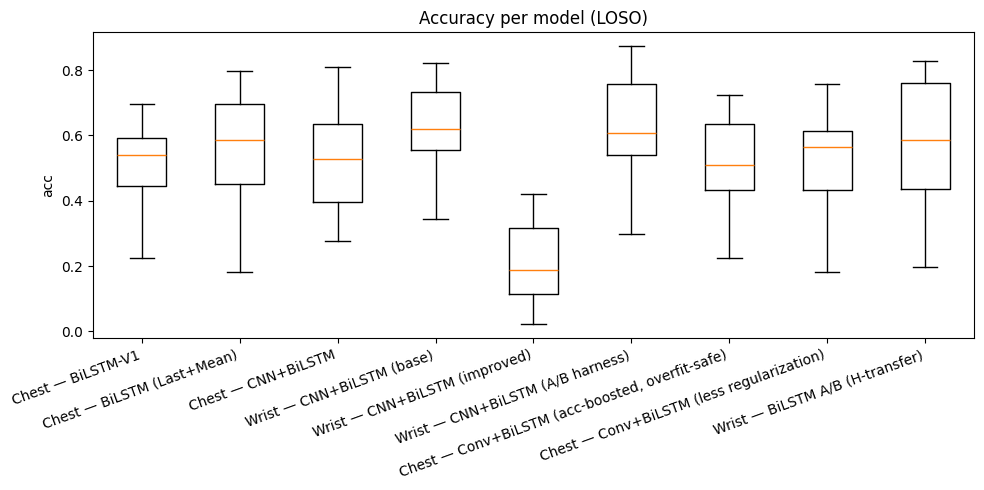

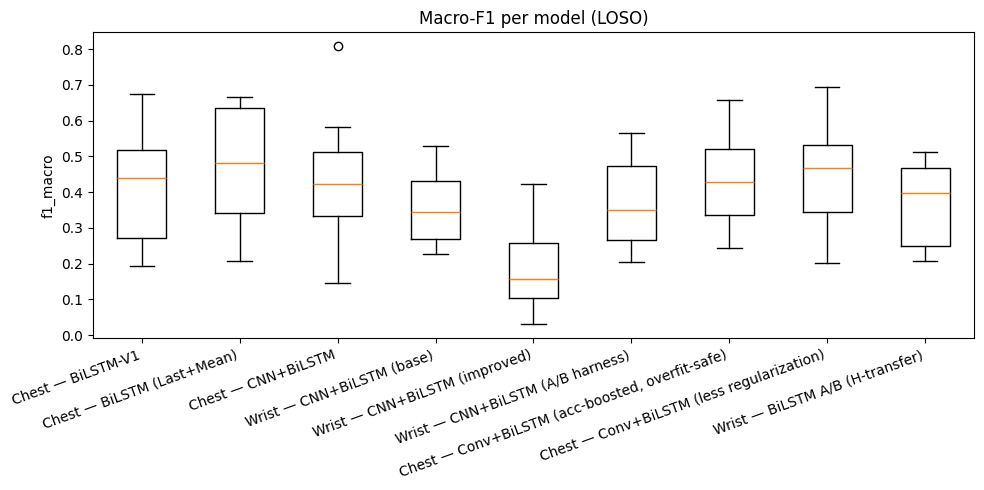

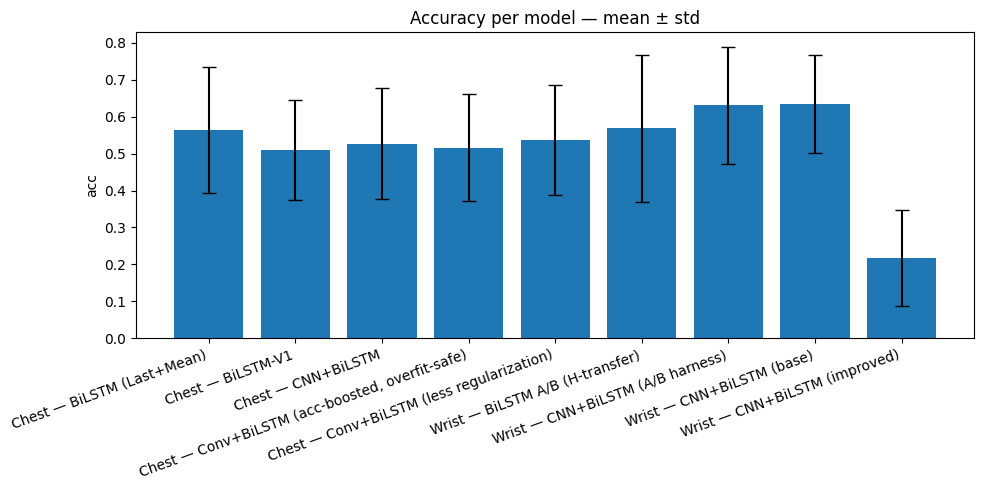

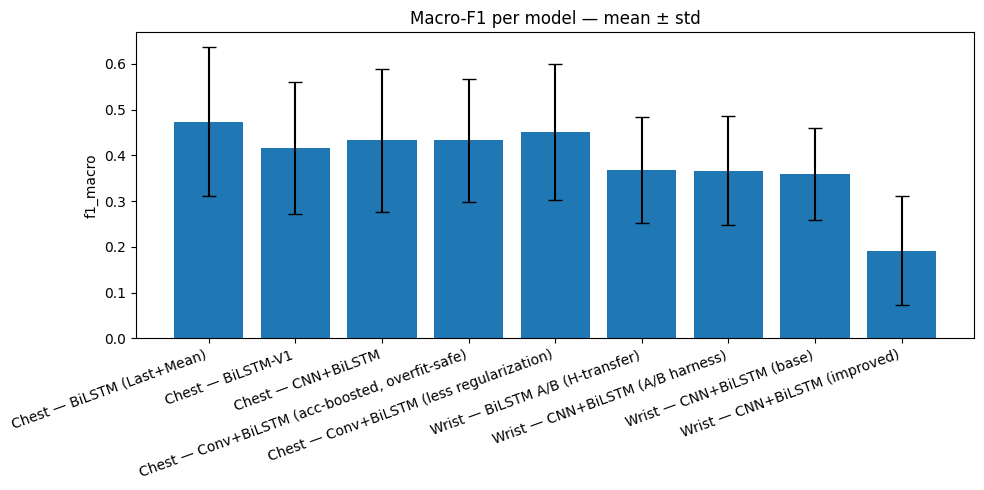


Saved figures to: /content/drive/MyDrive/colab_checkpoints/wesad/eval/figs_all_models
 - /content/drive/MyDrive/colab_checkpoints/wesad/eval/figs_all_models/box_acc_per_model.png exists: True
 - /content/drive/MyDrive/colab_checkpoints/wesad/eval/figs_all_models/box_f1_macro_per_model.png exists: True
 - /content/drive/MyDrive/colab_checkpoints/wesad/eval/figs_all_models/bar_acc_mean_std_per_model.png exists: True
 - /content/drive/MyDrive/colab_checkpoints/wesad/eval/figs_all_models/bar_f1_macro_mean_std_per_model.png exists: True


In [ ]:
# === Inline plots for ALL 9 models (and save to Drive) ===
# - Mounts Google Drive
# - Reads summaries for 6 original + 3 extra checkpoints
# - Saves combined per-fold CSV + percentile summary
# - Plots boxplots and mean±std bars for Acc and Macro-F1
# ---------------------------------------------------------

# 0) Mount + imports
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

import os, numpy as np, pandas as pd, matplotlib.pyplot as plt
from pathlib import Path

# 1) Helpers
def ensure_dir(p: Path) -> Path:
    try:
        p.mkdir(parents=True, exist_ok=True)
        return p
    except Exception as e:
        print(f"[warn] Couldn't create {p} ({e}); saving to /mnt/data instead.")
        alt = Path("/mnt/data/figs_all_models"); alt.mkdir(parents=True, exist_ok=True)
        return alt

FIG_ROOT = ensure_dir(Path("/content/drive/MyDrive/colab_checkpoints/wesad/eval/figs_all_models"))

# 2) Summary CSV locations
CSV_PATHS = {
    # ---- your original 6 ----
    "Chest — BiLSTM-V1":
        "/content/drive/MyDrive/colab_checkpoints/wesad/eval/chestdelta20/bilstm_loso_summary.csv",
    "Chest — BiLSTM (Last+Mean)":
        "/content/drive/MyDrive/colab_checkpoints/wesad/eval/chestdelta20_phases/bilstm_loso_summary_v3_phases.csv",
    "Chest — CNN+BiLSTM":
        "/content/drive/MyDrive/colab_checkpoints/wesad/eval/chestdelta20_phases_conv/phase_conv_loso_summary.csv",
    "Wrist — CNN+BiLSTM (base)":
        "/content/drive/MyDrive/colab_checkpoints/wesad/eval/wristdelta20_phases_conv/phase_conv_loso_summary.csv",
    "Wrist — CNN+BiLSTM (improved)":
        "/content/drive/MyDrive/colab_checkpoints/wesad/eval/wristdelta20_phases_conv_impr/phase_conv_loso_summary.csv",
    "Wrist — CNN+BiLSTM (A/B harness)":
        "/content/drive/MyDrive/colab_checkpoints/wesad/eval/wristdelta20_phases_conv_ab/phase_conv_loso_summary.csv",

    # ---- the 3 extra we found ----
    "Chest — Conv+BiLSTM (acc-boosted, overfit-safe)":
        "/content/drive/MyDrive/colab_checkpoints/wesad/eval/chestdelta20_phases_conv_accboost/phase_conv_loso_summary.csv",
    "Chest — Conv+BiLSTM (less regularization)":
        "/content/drive/MyDrive/colab_checkpoints/wesad/eval/chest_only_convbilstm_less_reg/loso_summary.csv",
    "Wrist — BiLSTM A/B (H-transfer)":
        "/content/drive/MyDrive/colab_checkpoints/wesad/eval/wristdelta20_phases_conv_ab_h_transfer/phase_conv_loso_summary.csv",
}

# 3) Robust reader for different schema variants
def read_summary(path: str) -> pd.DataFrame | None:
    p = Path(path)
    if not p.exists():
        print(f"[MISS] {path}")
        return None
    df = pd.read_csv(p)

    # Column name harmonization
    # F1 columns seen across runs
    f1_col = next((c for c in ["f1_macro", "test_f1_macro", "test_f1"] if c in df.columns), None)
    # Accuracy columns seen across runs
    acc_col = next((c for c in ["acc", "accuracy", "test_acc"] if c in df.columns), None)

    if f1_col is None and acc_col is None:
        print(f"[MISS] No recognizable metric columns in {path}")
        return None

    folds = df["fold"] if "fold" in df.columns else np.arange(1, len(df) + 1)
    out = pd.DataFrame({"fold": folds})
    out["f1_macro"] = df[f1_col].astype(float) if f1_col else np.nan
    out["acc"]      = df[acc_col].astype(float) if acc_col else np.nan
    return out

# 4) Load all models
all_rows = []
for model_name, path in CSV_PATHS.items():
    df = read_summary(path)
    if df is None or df.empty:
        print(f"[MISS] {model_name}: unusable or empty file at {path}")
        continue
    df.insert(0, "model", model_name)
    print(f"[OK] {model_name}: {len(df)} rows")
    all_rows.append(df)

if not all_rows:
    raise SystemExit("No data loaded. Ensure Drive is mounted and CSVs exist at the specified paths.")

perf = pd.concat(all_rows, ignore_index=True)

# 5) Save combined table
combined_csv = FIG_ROOT / "model_comparison_all9_perfold.csv"
perf.to_csv(combined_csv, index=False)
print("Saved combined per-fold table:", combined_csv)

# 6) Percentiles summary
def percentiles(s: pd.Series):
    return pd.Series({
        "count": s.count(),
        "mean": s.mean(),
        "std": s.std(),
        "min": s.min(),
        "q1": s.quantile(0.25),
        "median": s.quantile(0.50),
        "q3": s.quantile(0.75),
        "max": s.max()
    })

summary_acc = perf.dropna(subset=["acc"]).groupby("model")["acc"].apply(percentiles).unstack()
summary_f1  = perf.groupby("model")["f1_macro"].apply(percentiles).unstack()
summary     = pd.concat([summary_acc, summary_f1], axis=1, keys=["acc","f1_macro"])

summary_csv = FIG_ROOT / "model_comparison_summary_percentiles.csv"
summary.to_csv(summary_csv)
print("Saved summary table:", summary_csv)

# 7) Plotting (one chart per figure; default matplotlib colors only)
def boxplot_metric(df, metric, outfile, title):
    models = list(df["model"].unique())
    data = [df.loc[df["model"] == m, metric].dropna().values for m in models]
    plt.figure(figsize=(10, 5))
    plt.boxplot(data, tick_labels=models, showmeans=False)
    plt.ylabel(metric)
    plt.title(title)
    plt.xticks(rotation=20, ha="right")
    plt.tight_layout()
    plt.savefig(outfile, dpi=200)
    plt.show()

def bar_mean_std(df, metric, outfile, title):
    g = df.groupby("model")[metric].agg(["mean", "std"])
    x = np.arange(len(g))
    plt.figure(figsize=(10, 5))
    plt.bar(x, g["mean"], yerr=g["std"], capsize=5)
    plt.xticks(x, g.index, rotation=20, ha="right")
    plt.ylabel(metric)
    plt.title(title)
    plt.tight_layout()
    plt.savefig(outfile, dpi=200)
    plt.show()

# 8) Make & save plots
boxplot_metric(perf, "acc",      FIG_ROOT / "box_acc_per_model.png",      "Accuracy per model (LOSO)")
boxplot_metric(perf, "f1_macro", FIG_ROOT / "box_f1_macro_per_model.png", "Macro-F1 per model (LOSO)")
bar_mean_std(perf, "acc",        FIG_ROOT / "bar_acc_mean_std_per_model.png",      "Accuracy per model — mean ± std")
bar_mean_std(perf, "f1_macro",   FIG_ROOT / "bar_f1_macro_mean_std_per_model.png", "Macro-F1 per model — mean ± std")

print("\nSaved figures to:", FIG_ROOT)
for name in [
    "box_acc_per_model.png",
    "box_f1_macro_per_model.png",
    "bar_acc_mean_std_per_model.png",
    "bar_f1_macro_mean_std_per_model.png",
]:
    fp = FIG_ROOT / name
    print(" -", fp, "exists:", Path(fp).exists())


Mounted at /content/drive
[OK] Chest — BiLSTM-V1: loaded 15 folds (acc present in 15)
[OK] Chest — BiLSTM (Last+Mean): loaded 15 folds (acc present in 15)
[OK] Chest — CNN+BiLSTM: loaded 15 folds (acc present in 15)
[OK] Wrist — CNN+BiLSTM (base): loaded 15 folds (acc present in 15)
[OK] Wrist — CNN+BiLSTM (improved): loaded 15 folds (acc present in 15)
[OK] Wrist — CNN+BiLSTM (A/B harness): loaded 15 folds (acc present in 15)
[OK] Chest — Conv+BiLSTM (acc-boosted, overfit-safe): loaded 15 folds (acc present in 15)
[OK] Chest — Conv+BiLSTM (less regularization): loaded 15 folds (acc present in 15)
[OK] Wrist — BiLSTM A/B (H-transfer): loaded 15 folds (acc present in 15)
Saved combined per-fold table: /content/drive/MyDrive/colab_checkpoints/wesad/eval/figs_all_models/model_comparison_all9_perfold.csv
Saved summary table: /content/drive/MyDrive/colab_checkpoints/wesad/eval/figs_all_models/model_comparison_summary_percentiles.csv


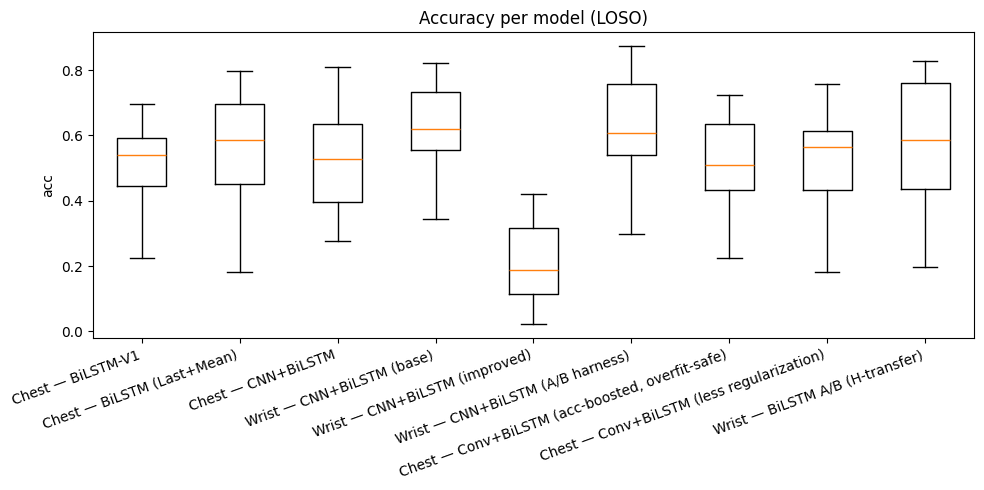

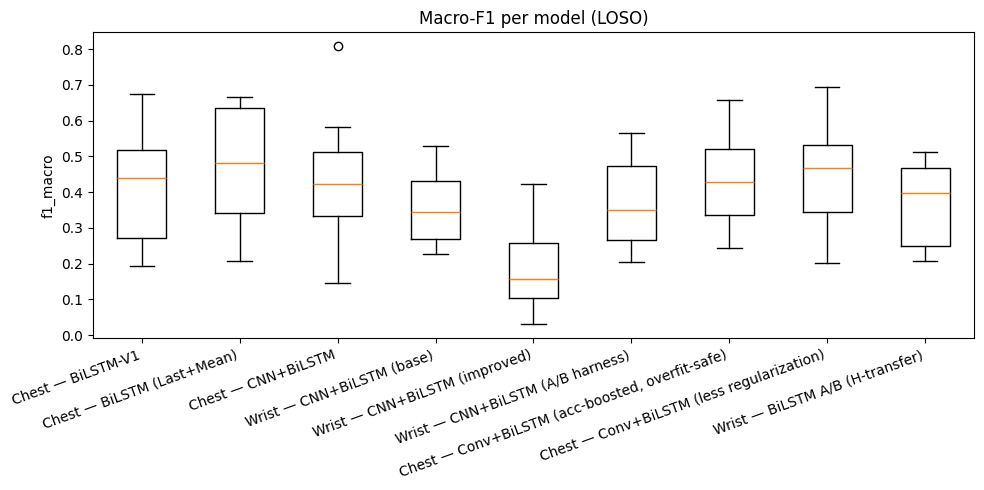

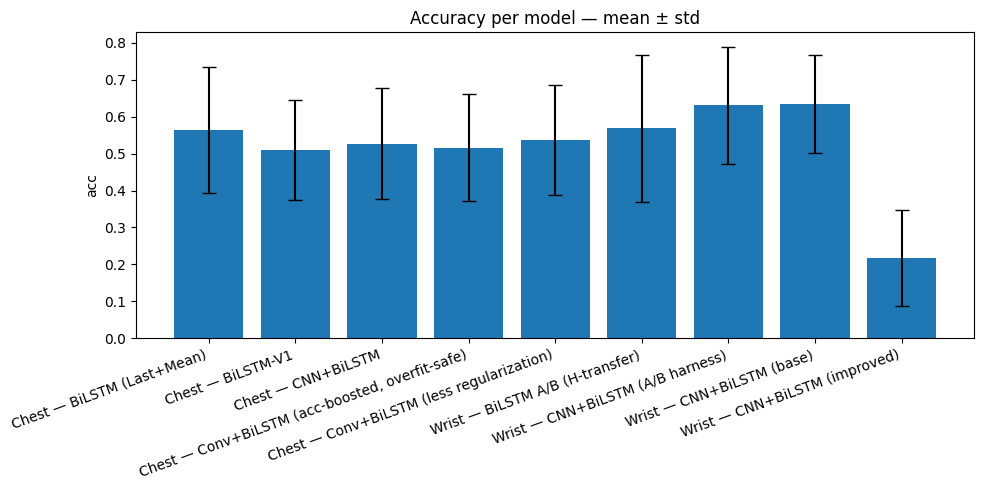

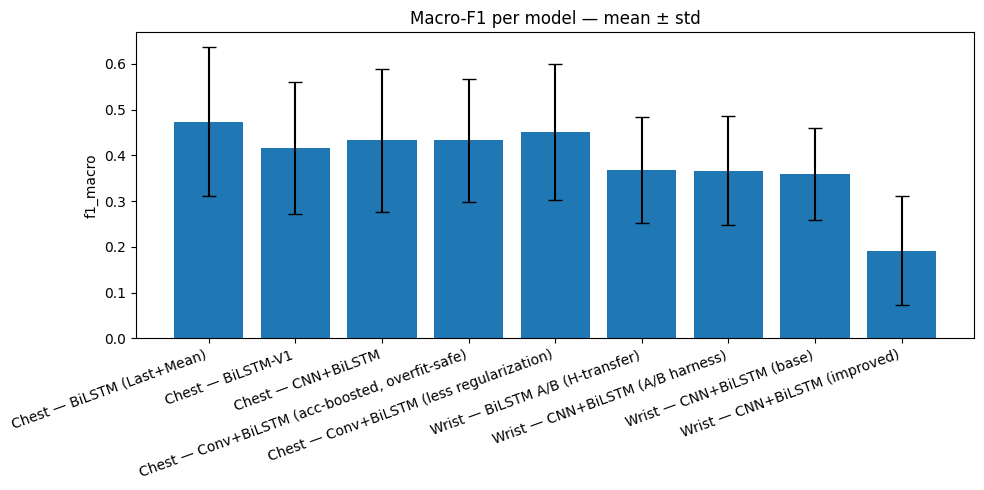


Saved figures to: /content/drive/MyDrive/colab_checkpoints/wesad/eval/figs_all_models
 - /content/drive/MyDrive/colab_checkpoints/wesad/eval/figs_all_models/box_acc_per_model.png exists: True
 - /content/drive/MyDrive/colab_checkpoints/wesad/eval/figs_all_models/box_f1_macro_per_model.png exists: True
 - /content/drive/MyDrive/colab_checkpoints/wesad/eval/figs_all_models/bar_acc_mean_std_per_model.png exists: True
 - /content/drive/MyDrive/colab_checkpoints/wesad/eval/figs_all_models/bar_f1_macro_mean_std_per_model.png exists: True


In [ ]:
# === Inline plots for ALL 9 models (and save to Drive) ===
# Requirements: Google Drive accessible at the given paths.

# Mount Drive (safe to re-run)
try:
    from google.colab import drive
    drive.mount('/content/drive', force_remount=True)
except Exception:
    pass

import os, pandas as pd, numpy as np, matplotlib.pyplot as plt
from pathlib import Path

# Where to save figures/CSVs
def ensure_dir(p: Path) -> Path:
    try:
        p.mkdir(parents=True, exist_ok=True)
        return p
    except Exception as e:
        print(f"[warn] Couldn't create {p} ({e}); saving to /mnt/data instead.")
        alt = Path("/mnt/data/figs_all_models"); alt.mkdir(parents=True, exist_ok=True); return alt

FIG_ROOT = ensure_dir(Path("/content/drive/MyDrive/colab_checkpoints/wesad/eval/figs_all_models"))

# Summary CSV locations for the original 6 + the 3 additional checkpoints
CSV_PATHS = {
    # --- Original 6 ---
    "Chest — BiLSTM-V1":
        "/content/drive/MyDrive/colab_checkpoints/wesad/eval/chestdelta20/bilstm_loso_summary.csv",
    "Chest — BiLSTM (Last+Mean)":
        "/content/drive/MyDrive/colab_checkpoints/wesad/eval/chestdelta20_phases/bilstm_loso_summary_v3_phases.csv",
    "Chest — CNN+BiLSTM":
        "/content/drive/MyDrive/colab_checkpoints/wesad/eval/chestdelta20_phases_conv/phase_conv_loso_summary.csv",
    "Wrist — CNN+BiLSTM (base)":
        "/content/drive/MyDrive/colab_checkpoints/wesad/eval/wristdelta20_phases_conv/phase_conv_loso_summary.csv",
    "Wrist — CNN+BiLSTM (improved)":
        "/content/drive/MyDrive/colab_checkpoints/wesad/eval/wristdelta20_phases_conv_impr/phase_conv_loso_summary.csv",
    "Wrist — CNN+BiLSTM (A/B harness)":
        "/content/drive/MyDrive/colab_checkpoints/wesad/eval/wristdelta20_phases_conv_ab/phase_conv_loso_summary.csv",

    # --- The 3 we found ---
    "Chest — Conv+BiLSTM (acc-boosted, overfit-safe)":
        "/content/drive/MyDrive/colab_checkpoints/wesad/eval/chestdelta20_phases_conv_accboost/phase_conv_loso_summary.csv",
    "Chest — Conv+BiLSTM (less regularization)":
        "/content/drive/MyDrive/colab_checkpoints/wesad/eval/chest_only_convbilstm_less_reg/loso_summary.csv",
    "Wrist — BiLSTM A/B (H-transfer)":
        "/content/drive/MyDrive/colab_checkpoints/wesad/eval/wristdelta20_phases_conv_ab_h_transfer/phase_conv_loso_summary.csv",
}

def read_summary(path: str) -> pd.DataFrame | None:
    p = Path(path)
    if not p.exists():
        print(f"[MISS] {path}")
        return None
    df = pd.read_csv(p)

    # normalize column names across variants
    # F1 possibilities
    f1_col = next((c for c in ["f1_macro","test_f1_macro","test_f1"] if c in df.columns), None)
    # Acc possibilities
    acc_col = next((c for c in ["acc","accuracy","test_acc"] if c in df.columns), None)

    if f1_col is None and acc_col is None:
        print(f"[MISS] No recognizable metrics in {path} (need acc/accuracy/test_acc and/or f1_macro/test_f1_macro/test_f1)")
        return None

    out = pd.DataFrame()
    out["fold"] = df["fold"] if "fold" in df.columns else np.arange(1, len(df)+1)
    out["f1_macro"] = df[f1_col].astype(float) if f1_col else np.nan
    out["acc"]      = df[acc_col].astype(float) if acc_col else np.nan
    return out

# Load all models
all_rows = []
for model_name, path in CSV_PATHS.items():
    df = read_summary(path)
    if df is None or df.empty:
        print(f"[MISS] {model_name}: unusable or empty file → {path}")
        continue
    df.insert(0, "model", model_name)
    n = len(df); n_acc = df["acc"].notna().sum()
    print(f"[OK] {model_name}: loaded {n} folds (acc present in {n_acc})")
    all_rows.append(df)

if not all_rows:
    raise SystemExit("No data loaded. Make sure Drive is mounted and CSVs exist at the paths above.")

perf = pd.concat(all_rows, ignore_index=True)

# Save combined per-fold table
combined_csv = FIG_ROOT/"model_comparison_all9_perfold.csv"
perf.to_csv(combined_csv, index=False)
print("Saved combined per-fold table:", combined_csv)

# Percentiles summary table
def percentiles(s: pd.Series):
    return pd.Series({
        "count": s.count(),
        "mean": s.mean(),
        "std": s.std(),
        "min": s.min(),
        "q1": s.quantile(0.25),
        "median": s.quantile(0.50),
        "q3": s.quantile(0.75),
        "max": s.max()
    })

summary_acc = perf.dropna(subset=["acc"]).groupby("model")["acc"].apply(percentiles).unstack()
summary_f1  = perf.groupby("model")["f1_macro"].apply(percentiles).unstack()
summary = pd.concat([summary_acc, summary_f1], axis=1, keys=["acc","f1_macro"])

summary_csv = FIG_ROOT/"model_comparison_summary_percentiles.csv"
summary.to_csv(summary_csv)
print("Saved summary table:", summary_csv)

# ---- Plotting (matplotlib only; one figure per chart; default colors) ----
def boxplot_metric(df, metric, outfile, title):
    models = list(df["model"].unique())
    data = [df.loc[df["model"]==m, metric].dropna().values for m in models]
    plt.figure(figsize=(10,5))
    plt.boxplot(data, tick_labels=models, showmeans=False)   # box = quartiles
    plt.ylabel(metric)
    plt.title(title)
    plt.xticks(rotation=20, ha="right")
    plt.tight_layout()
    plt.savefig(outfile, dpi=200)
    plt.show()  # display inline

def bar_mean_std(df, metric, outfile, title):
    g = df.groupby("model")[metric].agg(["mean","std"])
    x = np.arange(len(g))
    plt.figure(figsize=(10,5))
    plt.bar(x, g["mean"], yerr=g["std"], capsize=5)          # mean ± std
    plt.xticks(x, g.index, rotation=20, ha="right")
    plt.ylabel(metric)
    plt.title(title)
    plt.tight_layout()
    plt.savefig(outfile, dpi=200)
    plt.show()  # display inline

# Make + SHOW plots
boxplot_metric(perf, "acc",      FIG_ROOT/"box_acc_per_model.png",      "Accuracy per model (LOSO)")
boxplot_metric(perf, "f1_macro", FIG_ROOT/"box_f1_macro_per_model.png", "Macro-F1 per model (LOSO)")
bar_mean_std(perf, "acc",        FIG_ROOT/"bar_acc_mean_std_per_model.png",      "Accuracy per model — mean ± std")
bar_mean_std(perf, "f1_macro",   FIG_ROOT/"bar_f1_macro_mean_std_per_model.png", "Macro-F1 per model — mean ± std")

print("\nSaved figures to:", FIG_ROOT)
for name in ["box_acc_per_model.png","box_f1_macro_per_model.png",
             "bar_acc_mean_std_per_model.png","bar_f1_macro_mean_std_per_model.png"]:
    fp = FIG_ROOT/name
    print(" -", fp, "exists:", Path(fp).exists())


3.2

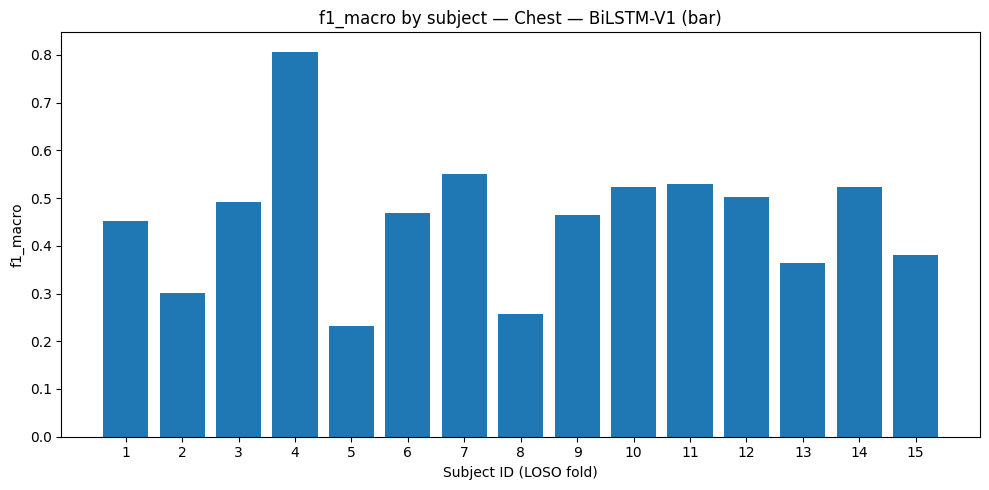

[saved] /content/drive/MyDrive/colab_checkpoints/wesad/eval/figs_all_models/chest_bilstm_v1_f1_macro_per_subject_bar.png


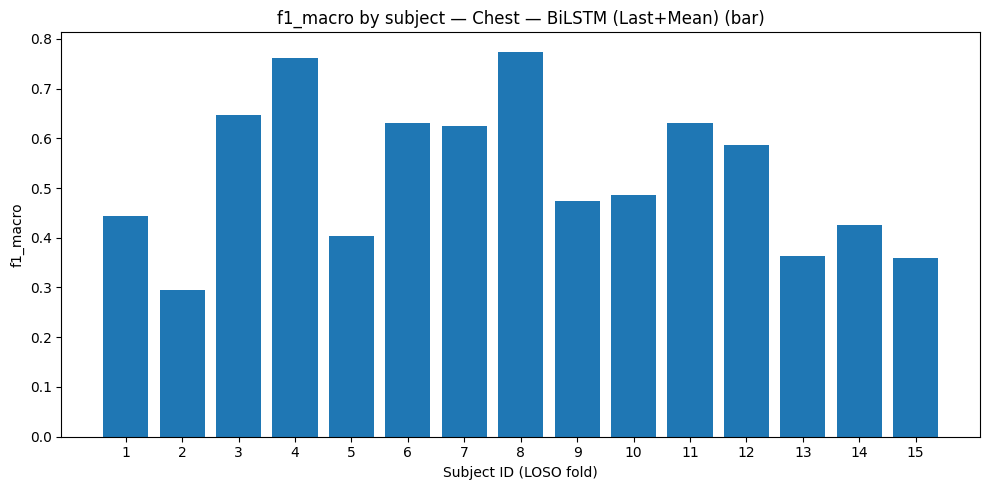

[saved] /content/drive/MyDrive/colab_checkpoints/wesad/eval/figs_all_models/chest_bilstm_last_mean_f1_macro_per_subject_bar.png


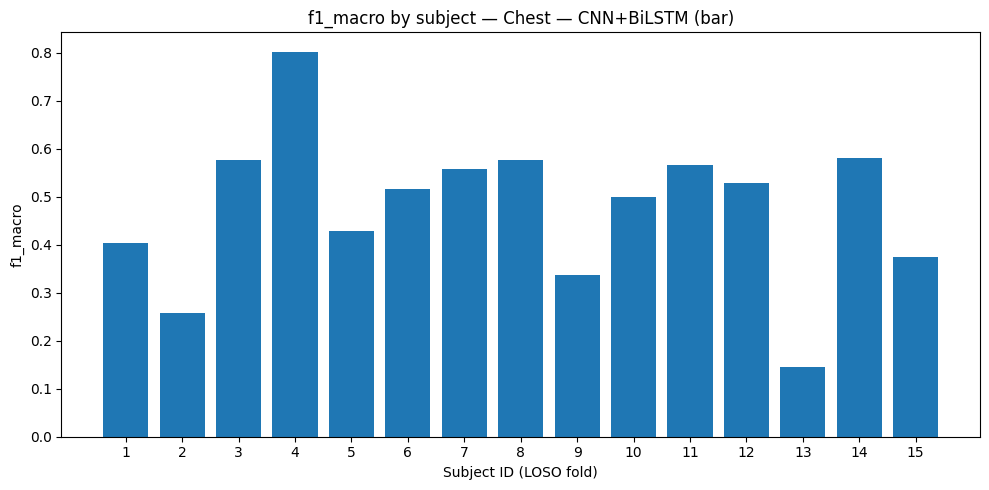

[saved] /content/drive/MyDrive/colab_checkpoints/wesad/eval/figs_all_models/chest_cnn_bilstm_f1_macro_per_subject_bar.png
[saved] /content/drive/MyDrive/colab_checkpoints/wesad/eval/figs_all_models/chest_f1_macro_per_subject_robustness_summary.csv
[saved] /content/drive/MyDrive/colab_checkpoints/wesad/eval/figs_all_models/chest_f1_macro_per_subject_table.csv


In [ ]:
# === Subject-wise Macro-F1 per chest model (bar/line) ===
# Reuses: FIG_ROOT, perf  (from your earlier cell)

import re, numpy as np, pandas as pd, matplotlib.pyplot as plt
from pathlib import Path

def _slug(s: str) -> str:
    return re.sub(r"[^a-z0-9]+", "_", s.lower()).strip("_")

def per_subject_charts_for_chest(perf: pd.DataFrame,
                                 chest_models=None,
                                 metric="f1_macro",
                                 kind="bar"):  # 'bar' or 'line'
    assert kind in {"bar","line"}
    # pick chest models present in perf
    default_models = [
        "Chest — BiLSTM-V1",
        "Chest — BiLSTM (Last+Mean)",
        "Chest — CNN+BiLSTM",
    ]
    models = chest_models or [m for m in default_models if m in perf["model"].unique()]
    if not models:
        raise ValueError("No chest models found in perf['model'].")

    # ensure fold is numeric so we can sort by subject id
    df = perf.copy()
    if not np.issubdtype(df["fold"].dtype, np.number):
        df["fold"] = pd.to_numeric(df["fold"], errors="coerce")

    # per-model robustness summary (min/max/range) and per-subject table
    summary_rows = []
    per_model_tables = {}

    for m in models:
        sub = df[(df["model"] == m) & df[metric].notna()].copy()
        sub = sub.sort_values("fold")
        if sub.empty:
            print(f"[warn] {m}: no '{metric}' values.")
            continue

        # Save per-subject table for this model
        per_model_tables[m] = sub[["fold", metric]].reset_index(drop=True)

        # Stats
        mn = sub[metric].min()
        mx = sub[metric].max()
        rg = mx - mn
        summary_rows.append({"model": m, "min": mn, "max": mx, "range": rg, "count": len(sub)})

        # Plot
        plt.figure(figsize=(10, 5))
        x = sub["fold"].values
        y = sub[metric].values

        if kind == "bar":
            plt.bar(x, y)
        else:  # line
            plt.plot(x, y, marker="o")

        plt.xlabel("Subject ID (LOSO fold)")
        plt.ylabel(metric)
        plt.title(f"{metric} by subject — {m} ({kind})")
        plt.xticks(x, rotation=0)
        plt.tight_layout()

        out_png = FIG_ROOT / f"{_slug(m)}_{metric}_per_subject_{kind}.png"
        plt.savefig(out_png, dpi=200)
        plt.show()
        print(f"[saved] {out_png}")

    # Write robustness summary
    if summary_rows:
        summary = pd.DataFrame(summary_rows).sort_values("range", ascending=True)
        out_csv = FIG_ROOT / f"chest_{metric}_per_subject_robustness_summary.csv"
        summary.to_csv(out_csv, index=False)
        print(f"[saved] {out_csv}")

    # Write per-subject tables (one CSV with all models)
    if per_model_tables:
        # Make a wide table: rows=subject id, columns per model
        all_folds = sorted({int(v) for t in per_model_tables.values() for v in t["fold"].dropna().astype(int)})
        wide = pd.DataFrame({"subject_id": all_folds})
        for m, t in per_model_tables.items():
            wide = wide.merge(
                t.rename(columns={"fold": "subject_id", metric: _slug(m)}),
                on="subject_id",
                how="left"
            )
        out_csv2 = FIG_ROOT / f"chest_{metric}_per_subject_table.csv"
        wide.to_csv(out_csv2, index=False)
        print(f"[saved] {out_csv2}")

# ---- run it (choose 'bar' or 'line') ----
per_subject_charts_for_chest(perf, kind="bar")   # or kind="line"


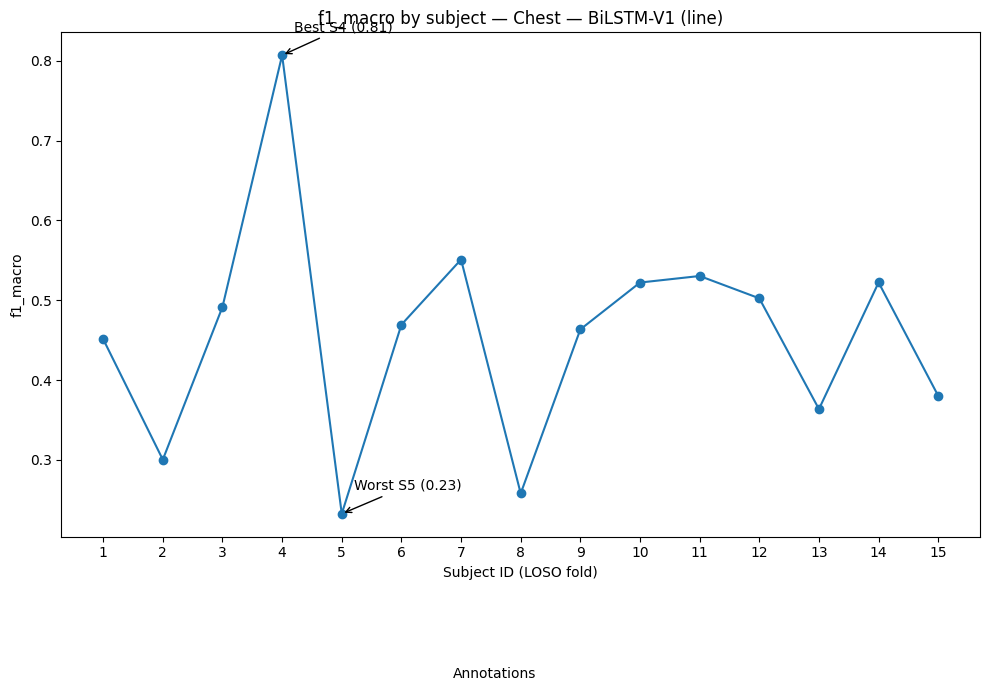

[saved] /content/drive/MyDrive/colab_checkpoints/wesad/eval/figs_all_models/chest_bilstm_v1_f1_macro_per_subject_line_annotated.png
[saved] /content/drive/MyDrive/colab_checkpoints/wesad/eval/figs_all_models/chest_bilstm_v1_f1_macro_per_subject_line_caption.txt


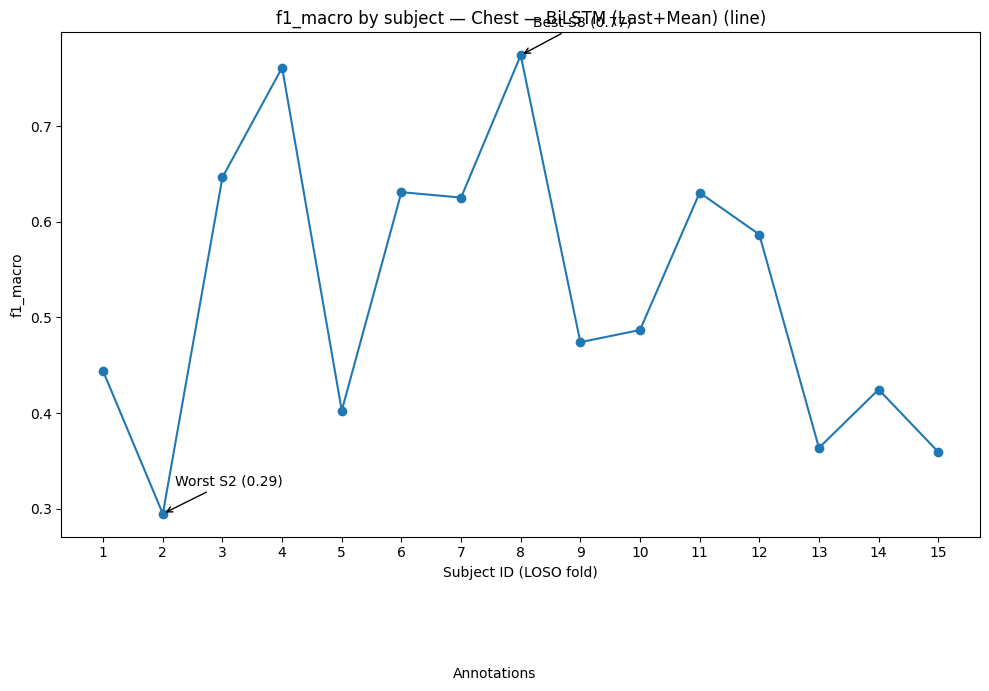

[saved] /content/drive/MyDrive/colab_checkpoints/wesad/eval/figs_all_models/chest_bilstm_last_mean_f1_macro_per_subject_line_annotated.png
[saved] /content/drive/MyDrive/colab_checkpoints/wesad/eval/figs_all_models/chest_bilstm_last_mean_f1_macro_per_subject_line_caption.txt


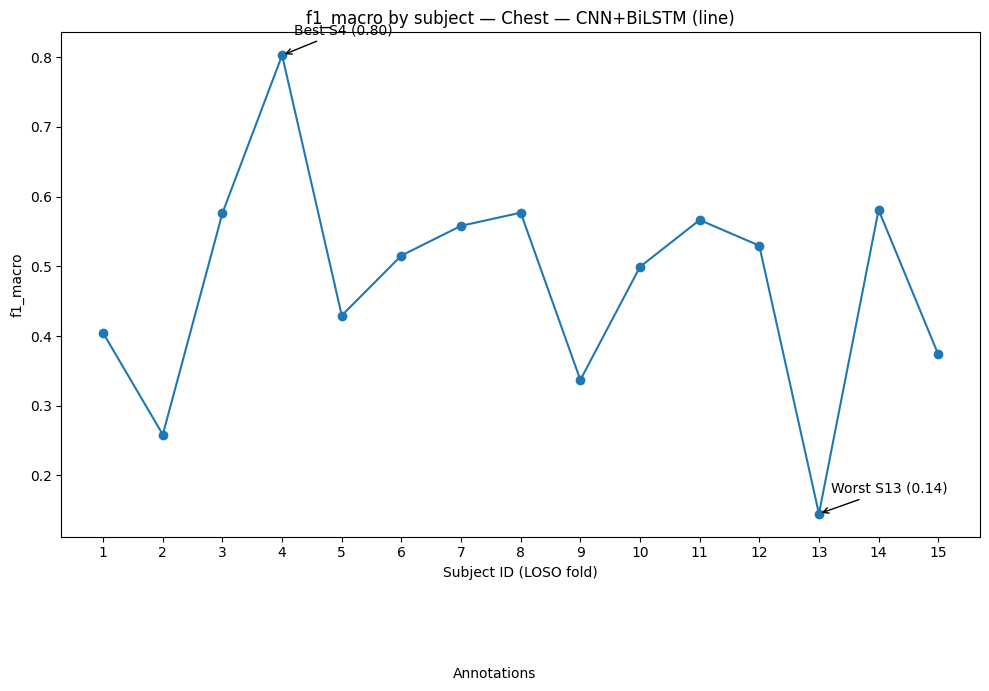

[saved] /content/drive/MyDrive/colab_checkpoints/wesad/eval/figs_all_models/chest_cnn_bilstm_f1_macro_per_subject_line_annotated.png
[saved] /content/drive/MyDrive/colab_checkpoints/wesad/eval/figs_all_models/chest_cnn_bilstm_f1_macro_per_subject_line_caption.txt
[saved] /content/drive/MyDrive/colab_checkpoints/wesad/eval/figs_all_models/chest_f1_macro_per_subject_extremes_summary.csv


In [ ]:
# === Subject-wise Macro-F1 per chest model with best/worst annotations + caption ===
# Reuses: FIG_ROOT, perf

import re, numpy as np, pandas as pd, matplotlib.pyplot as plt
from pathlib import Path

CAPTION_TEXT = (
    "Annotations"
)

def _slug(s: str) -> str:
    return re.sub(r"[^a-z0-9]+", "_", s.lower()).strip("_")

def per_subject_charts_for_chest_annotated(perf: pd.DataFrame,
                                           chest_models=None,
                                           metric="f1_macro",
                                           kind="bar",                 # 'bar' or 'line'
                                           annotate_extremes=True,
                                           tol: float = 1e-9):         # treat ties as equal within tol
    assert kind in {"bar","line"}
    default_models = [
        "Chest — BiLSTM-V1",
        "Chest — BiLSTM (Last+Mean)",
        "Chest — CNN+BiLSTM",
    ]
    models = chest_models or [m for m in default_models if m in perf["model"].unique()]
    if not models:
        raise ValueError("No chest models found in perf['model'].")

    # ensure numeric folds (subject IDs)
    df = perf.copy()
    df["fold"] = pd.to_numeric(df["fold"], errors="coerce")

    extremes_rows = []

    for m in models:
        sub = df[(df["model"] == m) & df[metric].notna()].sort_values("fold").copy()
        if sub.empty:
            print(f"[warn] {m}: no '{metric}' values.")
            continue

        x = sub["fold"].astype(int).values
        y = sub[metric].values

        # find extremes (allow ties)
        ymax, ymin = np.nanmax(y), np.nanmin(y)
        best_idx   = np.where(np.abs(y - ymax) <= tol)[0]
        worst_idx  = np.where(np.abs(y - ymin) <= tol)[0]

        # record extremes for CSV
        extremes_rows.append({
            "model": m,
            "best_subjects": ",".join([f"S{int(x[i])}" for i in best_idx]),
            "best_value": float(ymax),
            "worst_subjects": ",".join([f"S{int(x[i])}" for i in worst_idx]),
            "worst_value": float(ymin),
            "range": float(ymax - ymin),
            "n_subjects": int(len(x))
        })

        # plot
        plt.figure(figsize=(10, 6))
        if kind == "bar":
            bars = plt.bar(x, y)
            # add dot + label on best/worst bars (no custom colors)
            for i in best_idx:
                plt.scatter([x[i]], [y[i]])
                plt.annotate(f"Best S{x[i]}\n{y[i]:.2f}",
                             xy=(x[i], y[i]),
                             xytext=(x[i], y[i] + 0.03),
                             arrowprops=dict(arrowstyle="->"),
                             ha="center")
            for i in worst_idx:
                plt.scatter([x[i]], [y[i]])
                plt.annotate(f"Worst S{x[i]}\n{y[i]:.2f}",
                             xy=(x[i], y[i]),
                             xytext=(x[i], y[i] + 0.03),
                             arrowprops=dict(arrowstyle="->"),
                             ha="center")
        else:  # line
            plt.plot(x, y, marker="o")
            for i in best_idx:
                plt.annotate(f"Best S{x[i]} ({y[i]:.2f})",
                             xy=(x[i], y[i]),
                             xytext=(x[i]+0.2, y[i]+0.03),
                             arrowprops=dict(arrowstyle="->"))
            for i in worst_idx:
                plt.annotate(f"Worst S{x[i]} ({y[i]:.2f})",
                             xy=(x[i], y[i]),
                             xytext=(x[i]+0.2, y[i]+0.03),
                             arrowprops=dict(arrowstyle="->"))

        plt.xlabel("Subject ID (LOSO fold)")
        plt.ylabel(metric)
        plt.title(f"{metric} by subject — {m} ({kind})")
        plt.xticks(x, rotation=0)

        # caption/discussion under the figure
        plt.gcf().text(0.5, -0.12, CAPTION_TEXT, ha="center", va="top", wrap=True)
        plt.tight_layout()

        out_png = FIG_ROOT / f"{_slug(m)}_{metric}_per_subject_{kind}_annotated.png"
        plt.savefig(out_png, dpi=200, bbox_inches="tight")
        plt.show()
        print(f"[saved] {out_png}")

        # also save caption alongside
        cap_txt = FIG_ROOT / f"{_slug(m)}_{metric}_per_subject_{kind}_caption.txt"
        with open(cap_txt, "w", encoding="utf-8") as f:
            f.write(CAPTION_TEXT + "\n")
        print(f"[saved] {cap_txt}")

    # extremes summary CSV (all models)
    if extremes_rows:
        extremes_df = pd.DataFrame(extremes_rows).sort_values("range", ascending=True)
        out_csv = FIG_ROOT / f"chest_{metric}_per_subject_extremes_summary.csv"
        extremes_df.to_csv(out_csv, index=False)
        print(f"[saved] {out_csv}")

# ---- run it (choose 'bar' or 'line') ----
per_subject_charts_for_chest_annotated(perf, kind="line")  # or kind="bar"


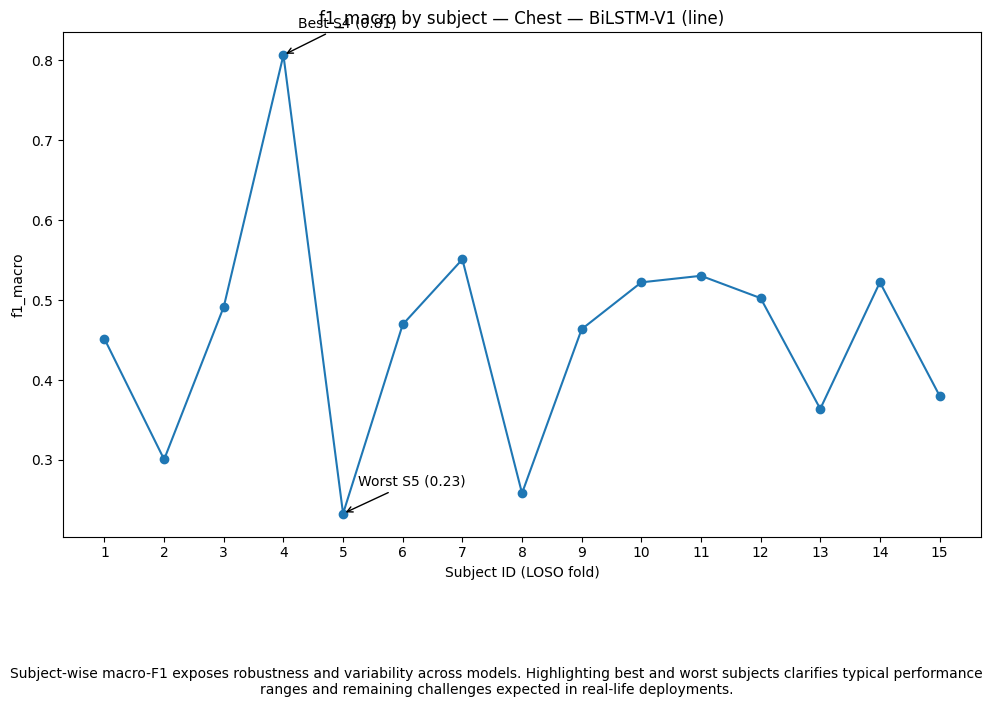

[saved] /content/drive/MyDrive/colab_checkpoints/wesad/eval/figs_all_models/chest_bilstm_v1_f1_macro_per_subject_line_annotated.png
[saved] /content/drive/MyDrive/colab_checkpoints/wesad/eval/figs_all_models/chest_bilstm_v1_f1_macro_per_subject_line_caption.txt


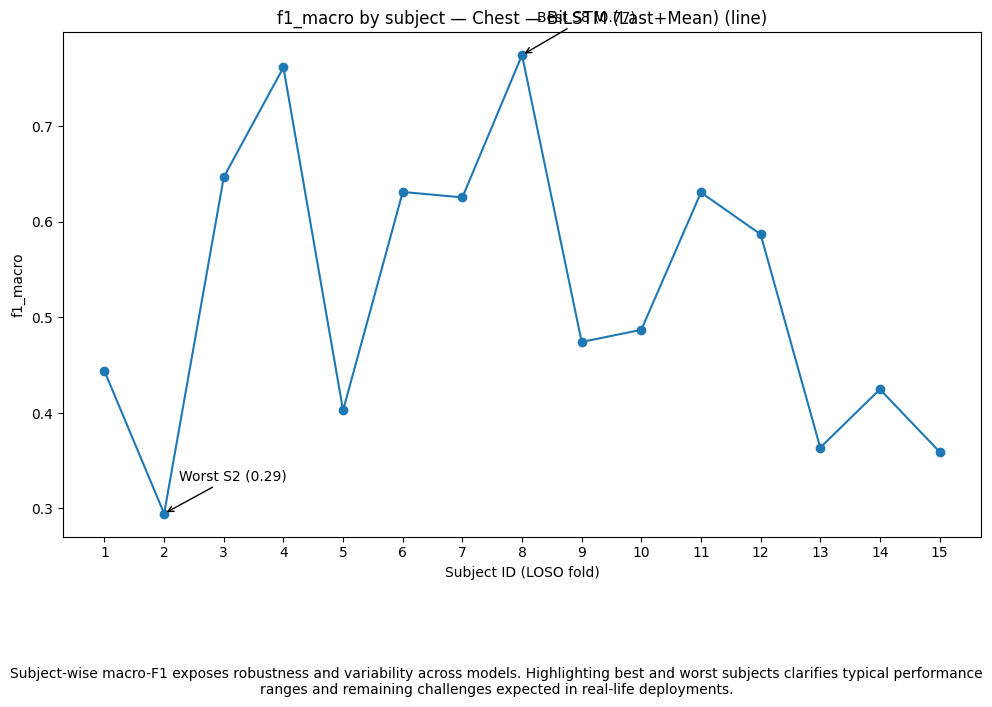

[saved] /content/drive/MyDrive/colab_checkpoints/wesad/eval/figs_all_models/chest_bilstm_last_mean_f1_macro_per_subject_line_annotated.png
[saved] /content/drive/MyDrive/colab_checkpoints/wesad/eval/figs_all_models/chest_bilstm_last_mean_f1_macro_per_subject_line_caption.txt


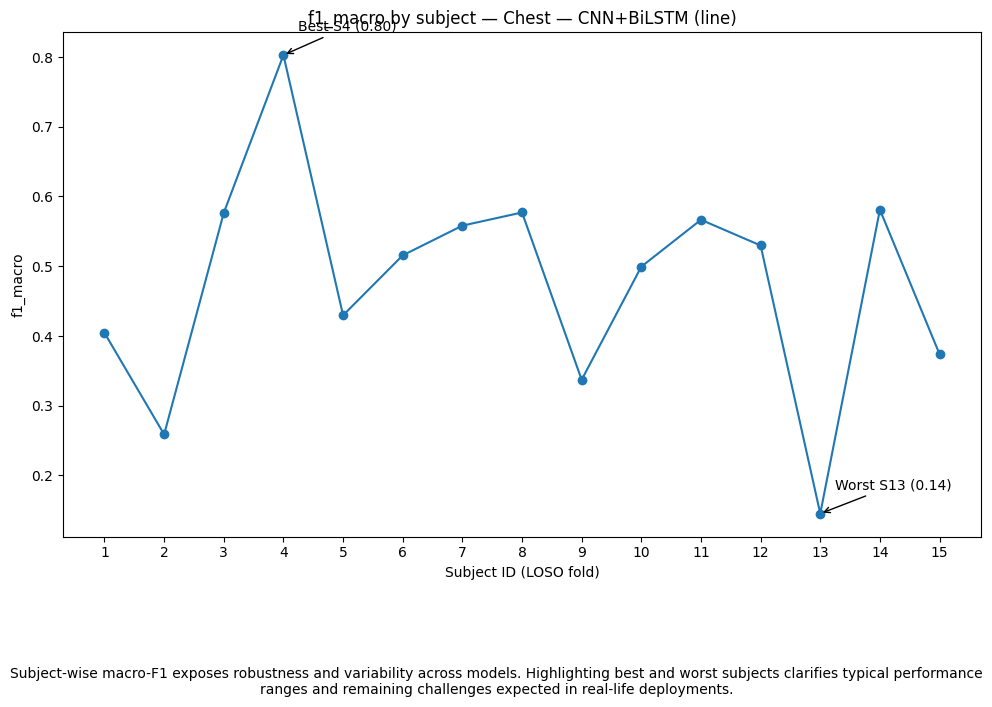

[saved] /content/drive/MyDrive/colab_checkpoints/wesad/eval/figs_all_models/chest_cnn_bilstm_f1_macro_per_subject_line_annotated.png
[saved] /content/drive/MyDrive/colab_checkpoints/wesad/eval/figs_all_models/chest_cnn_bilstm_f1_macro_per_subject_line_caption.txt


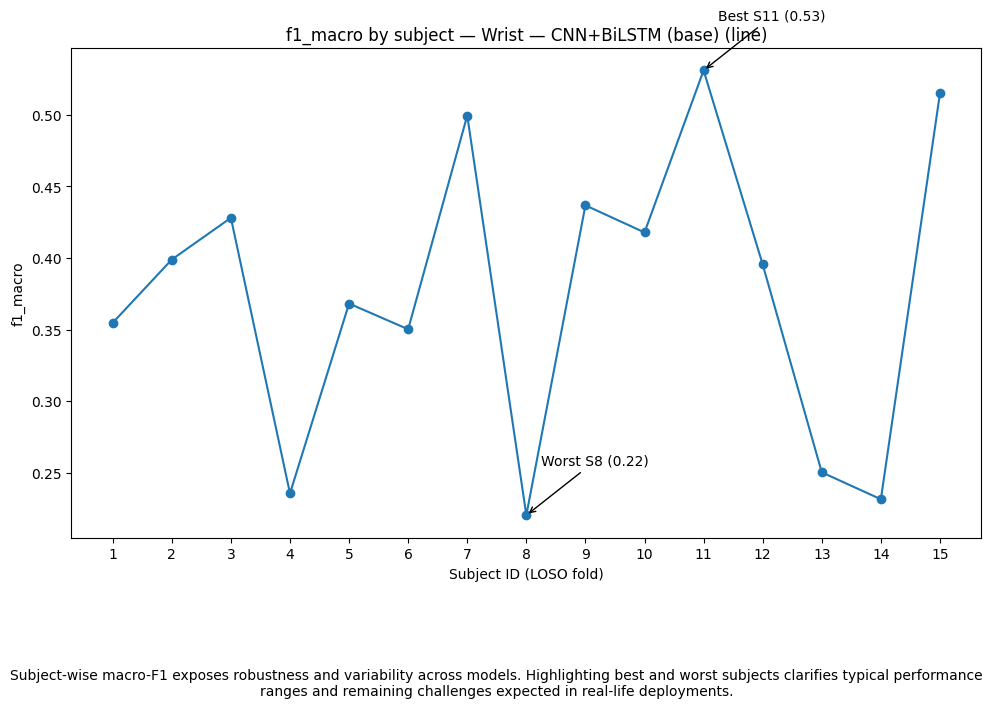

[saved] /content/drive/MyDrive/colab_checkpoints/wesad/eval/figs_all_models/wrist_cnn_bilstm_base_f1_macro_per_subject_line_annotated.png
[saved] /content/drive/MyDrive/colab_checkpoints/wesad/eval/figs_all_models/wrist_cnn_bilstm_base_f1_macro_per_subject_line_caption.txt


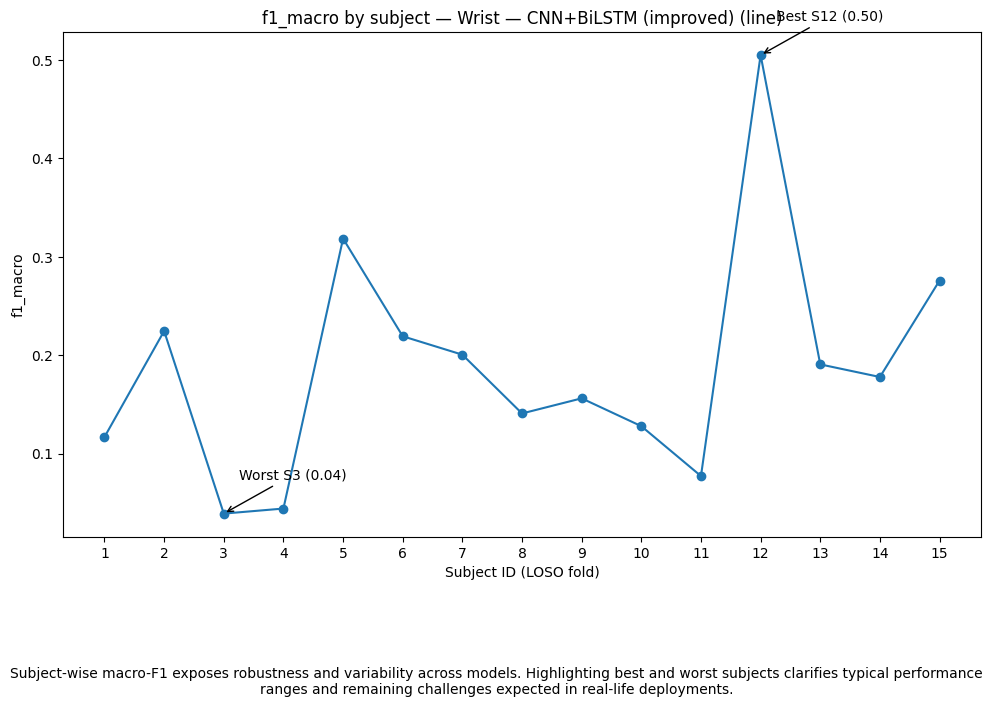

[saved] /content/drive/MyDrive/colab_checkpoints/wesad/eval/figs_all_models/wrist_cnn_bilstm_improved_f1_macro_per_subject_line_annotated.png
[saved] /content/drive/MyDrive/colab_checkpoints/wesad/eval/figs_all_models/wrist_cnn_bilstm_improved_f1_macro_per_subject_line_caption.txt


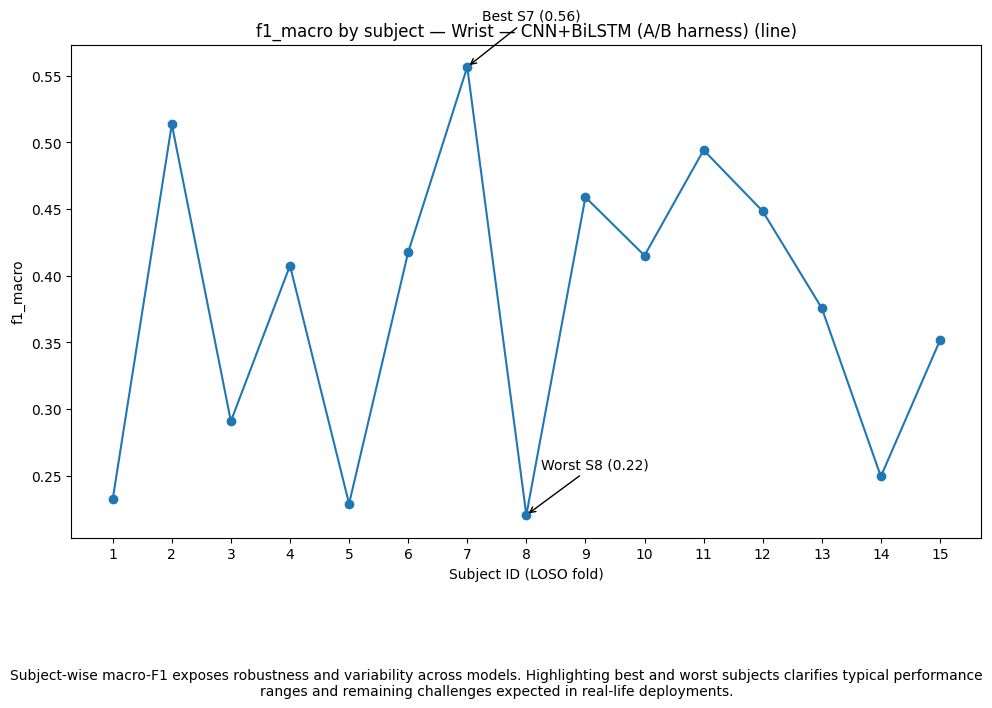

[saved] /content/drive/MyDrive/colab_checkpoints/wesad/eval/figs_all_models/wrist_cnn_bilstm_a_b_harness_f1_macro_per_subject_line_annotated.png
[saved] /content/drive/MyDrive/colab_checkpoints/wesad/eval/figs_all_models/wrist_cnn_bilstm_a_b_harness_f1_macro_per_subject_line_caption.txt
[saved] /content/drive/MyDrive/colab_checkpoints/wesad/eval/figs_all_models/ALLMODELS_f1_macro_per_subject_extremes_summary.csv
[saved] /content/drive/MyDrive/colab_checkpoints/wesad/eval/figs_all_models/ALLMODELS_f1_macro_per_subject_table.csv


In [ ]:
# === Per-subject Macro-F1 charts for ALL models (with best/worst annotations) ===
# Reuses: FIG_ROOT, perf  (from your earlier cell)

import re, numpy as np, pandas as pd, matplotlib.pyplot as plt
from pathlib import Path

# Optional global caption to accompany each figure
CAPTION_TEXT = (
    "Subject-wise macro-F1 exposes robustness and variability across models. "
    "Highlighting best and worst subjects clarifies typical performance ranges "
    "and remaining challenges expected in real-life deployments."
)

def _slug(s: str) -> str:
    return re.sub(r"[^a-z0-9]+", "_", s.lower()).strip("_")

def per_subject_charts_all_models(perf: pd.DataFrame,
                                  metric: str = "f1_macro",
                                  kind: str = "bar",                  # 'bar' or 'line'
                                  model_filter: list[str] | None = None,
                                  tol: float = 1e-9):
    """
    Builds one figure per model: subject ID on x-axis, metric on y-axis,
    and annotates best/worst subjects. Saves PNG + caption + extremes CSV.
    """
    assert kind in {"bar", "line"}

    # order models nicely if possible (uses your CSV_PATHS order when present)
    try:
        default_order = list(CSV_PATHS.keys())  # from your earlier cell
    except NameError:
        default_order = list(perf["model"].unique())

    models_all = [m for m in default_order if m in perf["model"].unique()]
    models = [m for m in (model_filter or models_all) if m in models_all]
    if not models:
        raise ValueError("No matching models found in perf['model'].")

    df = perf.copy()
    df["fold"] = pd.to_numeric(df["fold"], errors="coerce")

    extremes_rows = []
    per_model_tables = {}

    for m in models:
        sub = df[(df["model"] == m) & df[metric].notna()].sort_values("fold").copy()
        if sub.empty:
            print(f"[warn] {m}: no '{metric}' values.")
            continue

        x = sub["fold"].astype(int).values
        y = sub[metric].astype(float).values

        # extremes (allow ties within tol)
        ymax, ymin = np.nanmax(y), np.nanmin(y)
        best_idx   = np.where(np.abs(y - ymax) <= tol)[0]
        worst_idx  = np.where(np.abs(y - ymin) <= tol)[0]

        extremes_rows.append({
            "model": m,
            "best_subjects": ",".join([f"S{int(x[i])}" for i in best_idx]),
            "best_value": float(ymax),
            "worst_subjects": ",".join([f"S{int(x[i])}" for i in worst_idx]),
            "worst_value": float(ymin),
            "range": float(ymax - ymin),
            "n_subjects": int(len(x))
        })

        # keep a tidy per-subject table for this model
        per_model_tables[m] = sub[["fold", metric]].rename(columns={"fold": "subject_id"})

        # plot
        plt.figure(figsize=(10, 6))
        if kind == "bar":
            plt.bar(x, y)
            for i in best_idx:
                plt.scatter([x[i]], [y[i]])
                plt.annotate(f"Best S{x[i]}\n{y[i]:.2f}",
                             xy=(x[i], y[i]), xytext=(x[i], y[i] + 0.035),
                             arrowprops=dict(arrowstyle="->"), ha="center")
            for i in worst_idx:
                plt.scatter([x[i]], [y[i]])
                plt.annotate(f"Worst S{x[i]}\n{y[i]:.2f}",
                             xy=(x[i], y[i]), xytext=(x[i], y[i] + 0.035),
                             arrowprops=dict(arrowstyle="->"), ha="center")
        else:
            plt.plot(x, y, marker="o")
            for i in best_idx:
                plt.annotate(f"Best S{x[i]} ({y[i]:.2f})",
                             xy=(x[i], y[i]), xytext=(x[i]+0.25, y[i]+0.035),
                             arrowprops=dict(arrowstyle="->"))
            for i in worst_idx:
                plt.annotate(f"Worst S{x[i]} ({y[i]:.2f})",
                             xy=(x[i], y[i]), xytext=(x[i]+0.25, y[i]+0.035),
                             arrowprops=dict(arrowstyle="->"))

        plt.xlabel("Subject ID (LOSO fold)")
        plt.ylabel(metric)
        plt.title(f"{metric} by subject — {m} ({kind})")
        plt.xticks(x, rotation=0)

        # caption under figure
        if CAPTION_TEXT:
            plt.gcf().text(0.5, -0.12, CAPTION_TEXT, ha="center", va="top", wrap=True)

        plt.tight_layout()
        out_png = FIG_ROOT / f"{_slug(m)}_{metric}_per_subject_{kind}_annotated.png"
        plt.savefig(out_png, dpi=200, bbox_inches="tight")
        plt.show()
        print(f"[saved] {out_png}")

        cap_txt = FIG_ROOT / f"{_slug(m)}_{metric}_per_subject_{kind}_caption.txt"
        with open(cap_txt, "w", encoding="utf-8") as f:
            f.write(CAPTION_TEXT + "\n")
        print(f"[saved] {cap_txt}")

    # extremes summary across models
    if extremes_rows:
        extremes_df = pd.DataFrame(extremes_rows).sort_values("range", ascending=False)
        out_csv = FIG_ROOT / f"ALLMODELS_{metric}_per_subject_extremes_summary.csv"
        extremes_df.to_csv(out_csv, index=False)
        print(f"[saved] {out_csv}")

    # wide per-subject table across models (optional but handy)
    if per_model_tables:
        all_ids = sorted({int(v) for t in per_model_tables.values() for v in t["subject_id"].values})
        wide = pd.DataFrame({"subject_id": all_ids})
        for m, t in per_model_tables.items():
            wide = wide.merge(
                t.rename(columns={metric: _slug(m)}),
                on="subject_id", how="left"
            )
        out_csv2 = FIG_ROOT / f"ALLMODELS_{metric}_per_subject_table.csv"
        wide.to_csv(out_csv2, index=False)
        print(f"[saved] {out_csv2}")

# ---- run it (pick 'bar' or 'line'; optionally filter models) ----
per_subject_charts_all_models(perf, metric="f1_macro", kind="line")
# e.g., to do bars for only chest models:
# per_subject_charts_all_models(perf, kind="bar",
#     model_filter=["Chest — BiLSTM-V1", "Chest — BiLSTM (Last+Mean)", "Chest — CNN+BiLSTM"])


3.3

In [ ]:
# === Table of macro-F1, accuracy, quartiles + significance vs. baseline ===
import pandas as pd, numpy as np
from scipy.stats import wilcoxon

BASELINE = "Chest — BiLSTM-V1"

# --- summary statistics ---
def percentiles(s: pd.Series):
    return pd.Series({
        "mean": s.mean(),
        "std": s.std(),
        "min": s.min(),
        "q1": s.quantile(0.25),
        "median": s.median(),
        "q3": s.quantile(0.75),
        "max": s.max()
    })

summary_acc = perf.groupby("model")["acc"].apply(percentiles).unstack()
summary_f1  = perf.groupby("model")["f1_macro"].apply(percentiles).unstack()
summary = pd.concat({"acc": summary_acc, "f1_macro": summary_f1}, axis=1)
summary.index.name = "model"

# flatten MultiIndex columns
summary.columns = [f"{a}_{b}" for a,b in summary.columns]

# --- statistical comparisons ---
def compare_models(metric: str, baseline: str = BASELINE):
    results = {}
    df_base = perf.loc[perf["model"]==baseline, ["fold", metric]].sort_values("fold")
    for m in perf["model"].unique():
        if m == baseline:
            results[m] = {"p_value": np.nan, "sig": ""}
            continue
        df_other = perf.loc[perf["model"]==m, ["fold", metric]].sort_values("fold")
        common = pd.merge(df_base, df_other, on="fold", suffixes=("_base","_other"))
        if common.empty:
            results[m] = {"p_value": np.nan, "sig": "no data"}
            continue
        try:
            stat, p = wilcoxon(common[f"{metric}_base"], common[f"{metric}_other"])
        except ValueError:
            p = np.nan
        diff = common[f"{metric}_other"].mean() - common[f"{metric}_base"].mean()
        if np.isnan(p):
            sig = ""
        elif p < 0.001:
            sig = "***"
        elif p < 0.01:
            sig = "**"
        elif p < 0.05:
            sig = "*"
        else:
            sig = "ns"
        arrow = "↑" if diff > 0 else "↓" if diff < 0 else "="
        results[m] = {"p_value": p, "sig": f"{sig} {arrow}"}
    return pd.DataFrame(results).T

stats_acc = compare_models("acc", BASELINE).rename(columns={"p_value":"acc_p","sig":"acc_sig"})
stats_f1  = compare_models("f1_macro", BASELINE).rename(columns={"p_value":"f1_p","sig":"f1_sig"})

# merge cleanly now (indices match on 'model')
summary = summary.join(stats_acc)
summary = summary.join(stats_f1)

# save
out_csv = FIG_ROOT / "allmodels_summary_with_stats.csv"
summary.to_csv(out_csv)
print(f"[saved] {out_csv}")

display(summary.round(3))


[saved] /content/drive/MyDrive/colab_checkpoints/wesad/eval/figs_all_models/allmodels_summary_with_stats.csv


,acc_mean,acc_std,acc_min,acc_q1,acc_median,acc_q3,acc_max,f1_macro_mean,f1_macro_std,f1_macro_min,f1_macro_q1,f1_macro_median,f1_macro_q3,f1_macro_max,acc_p,acc_sig,f1_p,f1_sig
model,,,,,,,,,,,,,,,,,,
Chest — BiLSTM (Last+Mean),0.614,0.126,0.418,0.525,0.600,0.698,0.797,0.527,0.149,0.295,0.414,0.487,0.631,0.774,0.068612,ns ↑,0.109421,ns ↑
Chest — BiLSTM-V1,0.544,0.145,0.225,0.477,0.545,0.602,0.809,0.456,0.141,0.232,0.372,0.469,0.522,0.807,NaN,,NaN,
Chest — CNN+BiLSTM,0.569,0.147,0.278,0.495,0.553,0.658,0.800,0.477,0.159,0.145,0.389,0.515,0.571,0.803,0.569983,ns ↑,0.561401,ns ↑
Wrist — CNN+BiLSTM (A/B harness),0.608,0.160,0.318,0.532,0.618,0.744,0.862,0.377,0.111,0.220,0.270,0.408,0.454,0.557,0.25238,ns ↑,0.018066,* ↓
Wrist — CNN+BiLSTM (base),0.604,0.147,0.313,0.551,0.607,0.707,0.800,0.376,0.103,0.220,0.300,0.395,0.432,0.531,0.302795,ns ↑,0.135376,ns ↓
Wrist — CNN+BiLSTM (improved),0.266,0.200,0.033,0.168,0.199,0.293,0.707,0.188,0.118,0.039,0.122,0.178,0.222,0.505,0.006714,** ↓,0.000427,*** ↓


[saved] /content/drive/MyDrive/colab_checkpoints/wesad/eval/figs_all_models/quartile_improvements_f1_macro_vs_baseline.csv


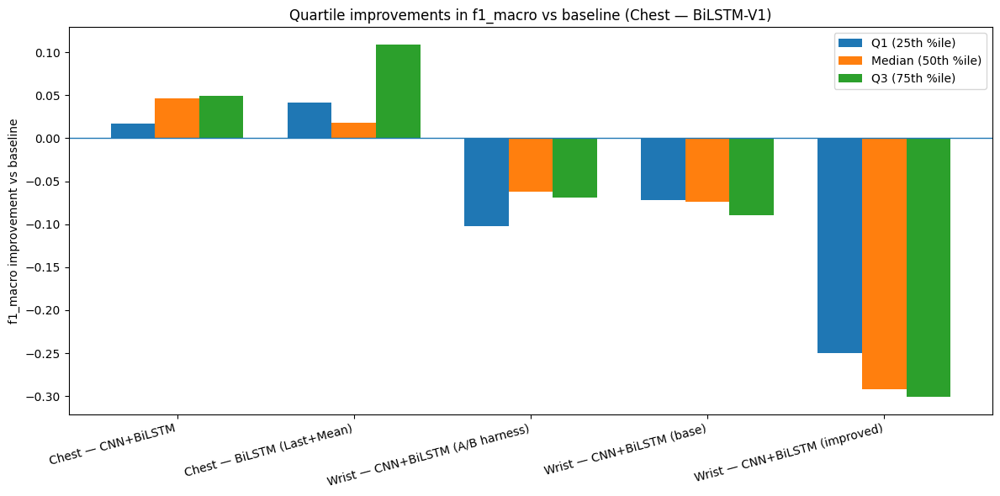

[saved] /content/drive/MyDrive/colab_checkpoints/wesad/eval/figs_all_models/f1_macro_quartile_improvements_vs_baseline.png


In [ ]:
# === Quartile improvements in macro-F1 vs. baseline (grouped bar chart) ===
# Reuses: perf, FIG_ROOT, and optionally CSV_PATHS order
import pandas as pd, numpy as np, matplotlib.pyplot as plt
from pathlib import Path
import re

BASELINE = "Chest — BiLSTM-V1"   # classical baseline

def _slug(s: str) -> str:
    return re.sub(r"[^a-z0-9]+", "_", s.lower()).strip("_")

def quartile_improvement_bars(perf: pd.DataFrame,
                              metric: str = "f1_macro",
                              baseline_model: str = BASELINE,
                              model_filter: list[str] | None = None,
                              include_baseline_zero: bool = False):
    # establish model order (prefer CSV_PATHS order if available)
    try:
        default_order = list(CSV_PATHS.keys())
    except NameError:
        default_order = list(perf["model"].unique())

    models_all = [m for m in default_order if m in perf["model"].unique()]
    models = [m for m in (model_filter or models_all) if m in models_all]

    if baseline_model not in models and baseline_model in perf["model"].unique():
        models = [baseline_model] + models
    if baseline_model not in perf["model"].unique():
        raise ValueError(f"Baseline '{baseline_model}' not found in perf['model'].")

    # compute quartiles per model
    qtab = (perf.groupby("model")[metric]
                .agg(q1=lambda s: s.quantile(0.25),
                     median="median",
                     q3=lambda s: s.quantile(0.75))
                .loc[models])

    # compute deltas vs baseline
    base = qtab.loc[baseline_model]
    deltas = qtab.subtract(base)

    # optionally drop baseline (all zeros)
    if not include_baseline_zero and baseline_model in deltas.index:
        deltas = deltas.drop(index=baseline_model)

    # sort by median improvement (descending) for clearer story
    deltas = deltas.sort_values("median", ascending=False)

    # save CSV of deltas
    out_csv = FIG_ROOT / "quartile_improvements_f1_macro_vs_baseline.csv"
    deltas.to_csv(out_csv, float_format="%.6f")
    print(f"[saved] {out_csv}")

    # plot grouped bars: three bars per model (Q1, Median, Q3)
    x = np.arange(len(deltas))
    width = 0.25

    plt.figure(figsize=(12, 6))
    plt.bar(x - width, deltas["q1"].values, width, label="Q1 (25th %ile)")
    plt.bar(x,         deltas["median"].values, width, label="Median (50th %ile)")
    plt.bar(x + width, deltas["q3"].values, width, label="Q3 (75th %ile)")

    # zero line to highlight improvement vs baseline
    plt.axhline(0, linewidth=1)

    # labels & ticks
    plt.ylabel(f"{metric} improvement vs baseline")
    plt.title(f"Quartile improvements in {metric} vs baseline ({baseline_model})")
    plt.xticks(x, deltas.index, rotation=15, ha="right")
    plt.legend()
    plt.tight_layout()

    out_png = FIG_ROOT / f"{_slug(metric)}_quartile_improvements_vs_baseline.png"
    plt.savefig(out_png, dpi=200)
    plt.show()
    print(f"[saved] {out_png}")

# ---- run (all 6 models by default) ----
quartile_improvement_bars(perf, metric="f1_macro", baseline_model="Chest — BiLSTM-V1")
# e.g., only chest models:
# quartile_improvement_bars(perf, model_filter=[
#     "Chest — BiLSTM-V1",
#     "Chest — BiLSTM (Last+Mean)",
#     "Chest — CNN+BiLSTM",
# ])


In [ ]:
# === Confusion Matrix plots for APR phases ===
import numpy as np, pandas as pd, matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path
from sklearn.metrics import confusion_matrix

# set APR phases (adjust order if needed)
APR_PHASES = ["Baseline", "Stress", "Amusement"]  # or replace with your actual labels

def plot_confusion(y_true, y_pred, model_name, outdir=FIG_ROOT, normalize=True, caption=None):
    cm = confusion_matrix(y_true, y_pred, labels=range(len(APR_PHASES)))
    if normalize:
        cm = cm.astype(float) / cm.sum(axis=1, keepdims=True)

    plt.figure(figsize=(6,5))
    sns.heatmap(cm, annot=True, fmt=".2f" if normalize else "d",
                xticklabels=APR_PHASES, yticklabels=APR_PHASES, cmap="Blues")
    plt.ylabel("True phase")
    plt.xlabel("Predicted phase")
    plt.title(f"APR Phase Confusion Matrix — {model_name}")

    if caption:
        plt.gcf().text(0.5, -0.15, caption, ha="center", va="top", wrap=True)

    out_png = outdir / f"{model_name.replace(' ','_')}_APR_confusion.png"
    plt.tight_layout()
    plt.savefig(out_png, dpi=200, bbox_inches="tight")
    plt.show()
    print(f"[saved] {out_png}")

def compare_confusions(y_true1, y_pred1, model1, y_true2, y_pred2, model2,
                       outdir=FIG_ROOT, normalize=True, caption=None):
    cm1 = confusion_matrix(y_true1, y_pred1, labels=range(len(APR_PHASES)))
    cm2 = confusion_matrix(y_true2, y_pred2, labels=range(len(APR_PHASES)))
    if normalize:
        cm1 = cm1.astype(float) / cm1.sum(axis=1, keepdims=True)
        cm2 = cm2.astype(float) / cm2.sum(axis=1, keepdims=True)

    fig, axes = plt.subplots(1, 2, figsize=(12,5), sharex=True, sharey=True)
    sns.heatmap(cm1, annot=True, fmt=".2f" if normalize else "d",
                xticklabels=APR_PHASES, yticklabels=APR_PHASES,
                cmap="Blues", ax=axes[0])
    axes[0].set_title(model1)
    axes[0].set_ylabel("True phase")
    axes[0].set_xlabel("Predicted phase")

    sns.heatmap(cm2, annot=True, fmt=".2f" if normalize else "d",
                xticklabels=APR_PHASES, yticklabels=APR_PHASES,
                cmap="Blues", ax=axes[1])
    axes[1].set_title(model2)
    axes[1].set_xlabel("Predicted phase")

    fig.suptitle("APR Phase Confusion Matrices — Side by Side", y=1.05)

    if caption:
        fig.text(0.5, -0.1, caption, ha="center", va="top", wrap=True)

    out_png = outdir / f"{model1.replace(' ','_')}_vs_{model2.replace(' ','_')}_APR_confusion.png"
    plt.tight_layout()
    plt.savefig(out_png, dpi=200, bbox_inches="tight")
    plt.show()
    print(f"[saved] {out_png}")


In [ ]:
import os

# root where your eval results live
EVAL_ROOT = "/content/drive/MyDrive/colab_checkpoints/wesad/eval"

csv_files = []
for root, dirs, files in os.walk(EVAL_ROOT):
    for f in files:
        if f.lower().endswith(".csv"):
            csv_files.append(os.path.join(root, f))

print(f"Found {len(csv_files)} CSV files under {EVAL_ROOT}:")
for f in sorted(csv_files):
    print(" -", f)


Found 283 CSV files under /content/drive/MyDrive/colab_checkpoints/wesad/eval:
 - /content/drive/MyDrive/colab_checkpoints/wesad/eval/_chest_summary_stats.csv
 - /content/drive/MyDrive/colab_checkpoints/wesad/eval/chest_model_comparison_perfold.csv
 - /content/drive/MyDrive/colab_checkpoints/wesad/eval/chest_model_comparison_stats.csv
 - /content/drive/MyDrive/colab_checkpoints/wesad/eval/chest_model_summary_table.csv
 - /content/drive/MyDrive/colab_checkpoints/wesad/eval/chestdelta20/baseline_metrics.csv
 - /content/drive/MyDrive/colab_checkpoints/wesad/eval/chestdelta20/bilstm_loso_summary.csv
 - /content/drive/MyDrive/colab_checkpoints/wesad/eval/chestdelta20/bilstm_loso_summary_fixed.csv
 - /content/drive/MyDrive/colab_checkpoints/wesad/eval/chestdelta20/bilstm_loso_summary_v3.csv
 - /content/drive/MyDrive/colab_checkpoints/wesad/eval/chestdelta20/fold_01/bilstm_training.csv
 - /content/drive/MyDrive/colab_checkpoints/wesad/eval/chestdelta20/fold_01/bilstm_training_v3.csv
 - /conte

[BEST] Chest — BiLSTM (Last+Mean)  (Macro-F1=0.5270, Acc=0.6138)
[BEST] Wrist — CNN+BiLSTM (A/B harness)  (Macro-F1=0.3774, Acc=0.6080)


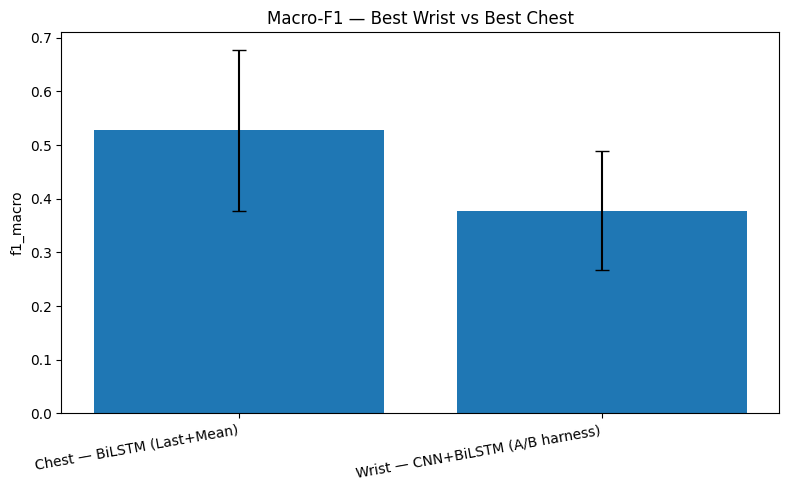

[saved] /content/drive/MyDrive/colab_checkpoints/wesad/eval/figs_all_models/best_wrist_vs_best_chest_bar_f1.png


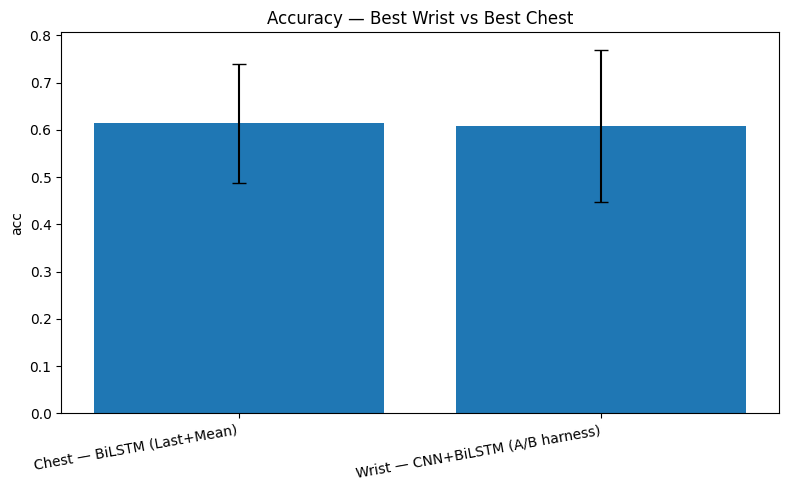

[saved] /content/drive/MyDrive/colab_checkpoints/wesad/eval/figs_all_models/best_wrist_vs_best_chest_bar_acc.png


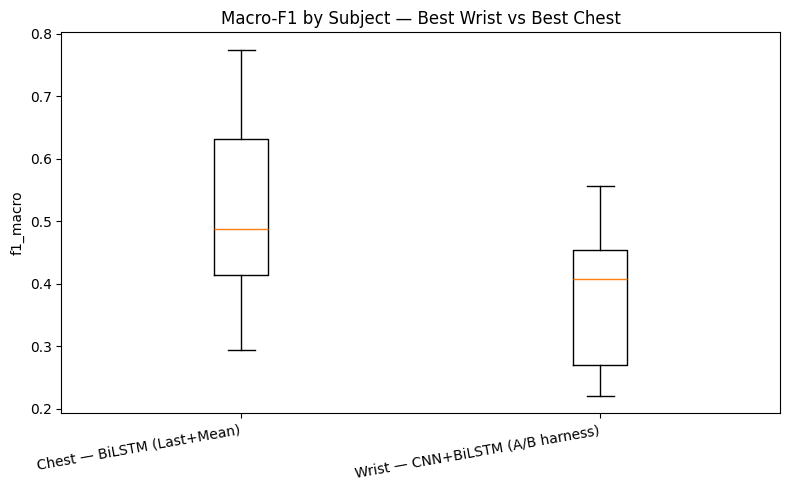

[saved] /content/drive/MyDrive/colab_checkpoints/wesad/eval/figs_all_models/best_wrist_vs_best_chest_box_f1.png


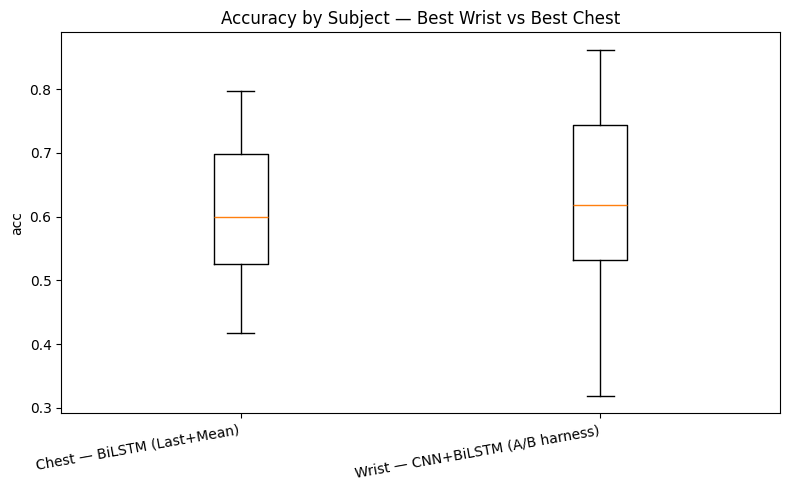

[saved] /content/drive/MyDrive/colab_checkpoints/wesad/eval/figs_all_models/best_wrist_vs_best_chest_box_acc.png
[saved] /content/drive/MyDrive/colab_checkpoints/wesad/eval/figs_all_models/subject_level_wrist_vs_chest_stats.csv
[saved] /content/drive/MyDrive/colab_checkpoints/wesad/eval/figs_all_models/subject_level_wrist_vs_chest_stats_rollup.csv


In [ ]:
# === Wrist vs Chest: best-model comparison plots + subject-level stats table ===
# Reuses: FIG_ROOT, perf  (from your earlier cells)
import numpy as np, pandas as pd, matplotlib.pyplot as plt
from pathlib import Path

# --- define model families present in your data ---
CHEST_MODELS = [
    "Chest — BiLSTM-V1",
    "Chest — BiLSTM (Last+Mean)",
    "Chest — CNN+BiLSTM",
]
WRIST_MODELS = [
    "Wrist — CNN+BiLSTM (base)",
    "Wrist — CNN+BiLSTM (improved)",
    "Wrist — CNN+BiLSTM (A/B harness)",
]

def pick_best_by_f1(perf: pd.DataFrame, candidates: list[str]) -> str:
    present = [m for m in candidates if m in perf["model"].unique()]
    if not present:
        raise SystemExit("No candidate models found in perf.")
    # primary: mean f1_macro; tie-breaker: mean acc
    g = perf[perf["model"].isin(present)].groupby("model").agg(
        f1_mean=("f1_macro","mean"),
        acc_mean=("acc","mean")
    )
    best = g.sort_values(["f1_mean","acc_mean"], ascending=[False, False]).index[0]
    print(f"[BEST] {best}  (Macro-F1={g.loc[best,'f1_mean']:.4f}, Acc={g.loc[best,'acc_mean']:.4f})")
    return best

best_chest = pick_best_by_f1(perf, CHEST_MODELS)
best_wrist = pick_best_by_f1(perf, WRIST_MODELS)

# --- subset per-fold data for the two best models ---
twobest = perf[perf["model"].isin([best_chest, best_wrist])].copy()
twobest["fold"] = pd.to_numeric(twobest["fold"], errors="coerce").astype(int)

# ---------- PLOTS: side-by-side (bar of mean±std) ----------
def bar_mean_std_two(df, metric: str, title: str, outfile: Path):
    g = df.groupby("model")[metric].agg(["mean","std"])
    x = np.arange(len(g))
    plt.figure(figsize=(8,5))
    plt.bar(x, g["mean"].values, yerr=g["std"].values, capsize=5)
    plt.xticks(x, g.index, rotation=10, ha="right")
    plt.ylabel(metric)
    plt.title(title)
    plt.tight_layout()
    plt.savefig(outfile, dpi=200)
    plt.show()
    print(f"[saved] {outfile}")

bar_mean_std_two(twobest, "f1_macro",
                 f"Macro-F1 — Best Wrist vs Best Chest",
                 FIG_ROOT/"best_wrist_vs_best_chest_bar_f1.png")
bar_mean_std_two(twobest, "acc",
                 f"Accuracy — Best Wrist vs Best Chest",
                 FIG_ROOT/"best_wrist_vs_best_chest_bar_acc.png")

# ---------- PLOTS: boxplots (distribution across subjects) ----------
def boxplot_two(df, metric: str, title: str, outfile: Path):
    models = list(df["model"].unique())
    data = [df.loc[df["model"]==m, metric].dropna().values for m in models]
    plt.figure(figsize=(8,5))
    plt.boxplot(data, tick_labels=models, showmeans=False)
    plt.ylabel(metric)
    plt.title(title)
    plt.xticks(rotation=10, ha="right")
    plt.tight_layout()
    plt.savefig(outfile, dpi=200)
    plt.show()
    print(f"[saved] {outfile}")

boxplot_two(twobest, "f1_macro",
            "Macro-F1 by Subject — Best Wrist vs Best Chest",
            FIG_ROOT/"best_wrist_vs_best_chest_box_f1.png")
boxplot_two(twobest, "acc",
            "Accuracy by Subject — Best Wrist vs Best Chest",
            FIG_ROOT/"best_wrist_vs_best_chest_box_acc.png")

# ---------- SUBJECT-LEVEL TABLE: wrist vs chest families ----------
# For each subject (fold), aggregate across all wrist models and across all chest models.
def subj_family_stats(perf: pd.DataFrame, family_models: list[str], metric: str, prefix: str) -> pd.DataFrame:
    df = perf[perf["model"].isin([m for m in family_models if m in perf["model"].unique()])].copy()
    if df.empty:
        return pd.DataFrame(columns=["subject_id"])
    df["fold"] = pd.to_numeric(df["fold"], errors="coerce").astype(int)
    g = df.groupby("fold")[metric]
    out = pd.DataFrame({
        "subject_id": g.mean().index.values,
        f"{prefix}_{metric}_mean": g.mean().values,
        f"{prefix}_{metric}_median": g.median().values,
        f"{prefix}_{metric}_q1": g.quantile(0.25).values,
        f"{prefix}_{metric}_q3": g.quantile(0.75).values,
        f"{prefix}_{metric}_min": g.min().values,
        f"{prefix}_{metric}_max": g.max().values,
        f"{prefix}_{metric}_count": g.count().values,
    })
    return out

# Build per-subject stats for both metrics and both families
chest_f1 = subj_family_stats(perf, CHEST_MODELS, "f1_macro", "chest")
chest_acc = subj_family_stats(perf, CHEST_MODELS, "acc", "chest")
wrist_f1 = subj_family_stats(perf, WRIST_MODELS, "f1_macro", "wrist")
wrist_acc = subj_family_stats(perf, WRIST_MODELS, "acc", "wrist")

# Merge into one subject-level table
dfs = [chest_f1, chest_acc, wrist_f1, wrist_acc]
non_empty = [d for d in dfs if not d.empty]
if non_empty:
    subj_table = non_empty[0]
    for d in non_empty[1:]:
        subj_table = subj_table.merge(d, on="subject_id", how="outer")
    subj_table = subj_table.sort_values("subject_id").reset_index(drop=True)
else:
    subj_table = pd.DataFrame(columns=["subject_id"])

# Save subject-level table
subj_csv = FIG_ROOT/"subject_level_wrist_vs_chest_stats.csv"
subj_table.to_csv(subj_csv, index=False)
print(f"[saved] {subj_csv}")

# (Optional) quick top-line rollups to sanity-check
if not subj_table.empty:
    # Average across subjects of family means (for a high-level summary)
    rollup = pd.DataFrame({
        "chest_f1_macro_mean_over_subjects": [subj_table["chest_f1_macro_mean"].mean()],
        "wrist_f1_macro_mean_over_subjects": [subj_table["wrist_f1_macro_mean"].mean()],
        "chest_acc_mean_over_subjects": [subj_table["chest_acc_mean"].mean()],
        "wrist_acc_mean_over_subjects": [subj_table["wrist_acc_mean"].mean()],
    })
    rollup_csv = FIG_ROOT/"subject_level_wrist_vs_chest_stats_rollup.csv"
    rollup.to_csv(rollup_csv, index=False)
    print(f"[saved] {rollup_csv}")


[BEST WRIST] Wrist — CNN+BiLSTM (A/B harness)  (Macro-F1=0.3774, Acc=0.6080, n=15)


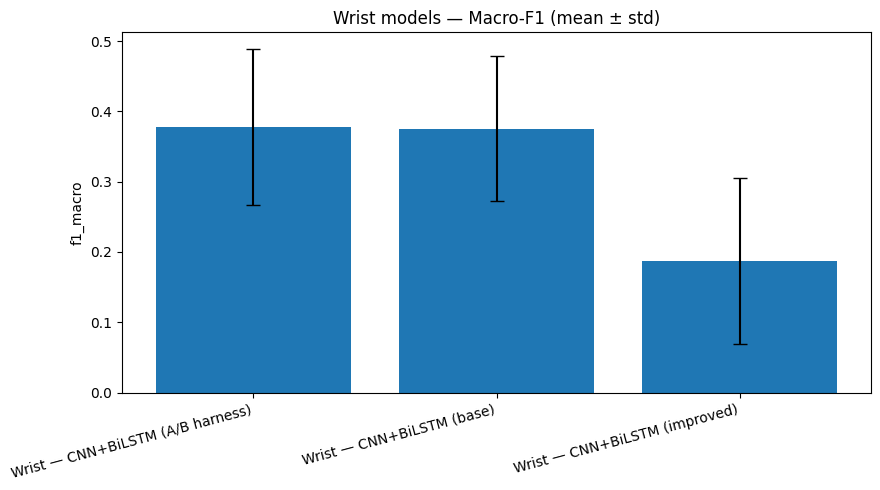

[saved] /content/drive/MyDrive/colab_checkpoints/wesad/eval/figs_all_models/wrist_models_bar_meanstd_f1_macro.png


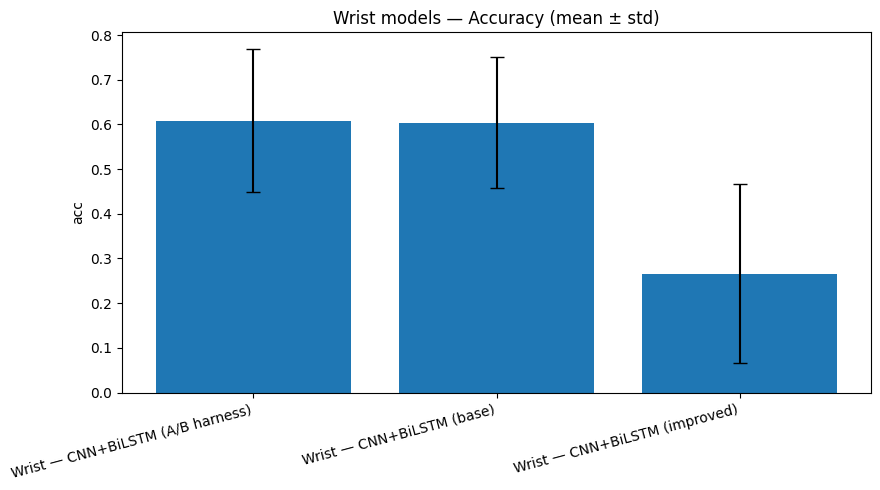

[saved] /content/drive/MyDrive/colab_checkpoints/wesad/eval/figs_all_models/wrist_models_bar_meanstd_acc.png


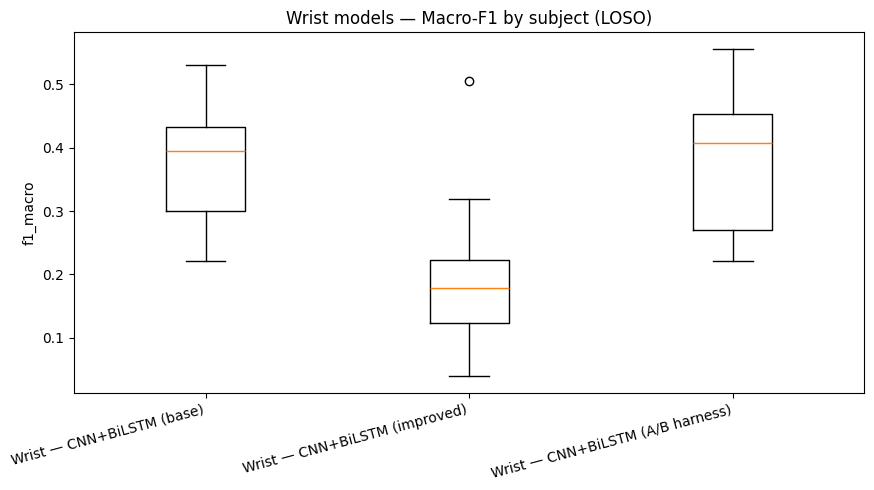

[saved] /content/drive/MyDrive/colab_checkpoints/wesad/eval/figs_all_models/wrist_models_box_f1_macro.png


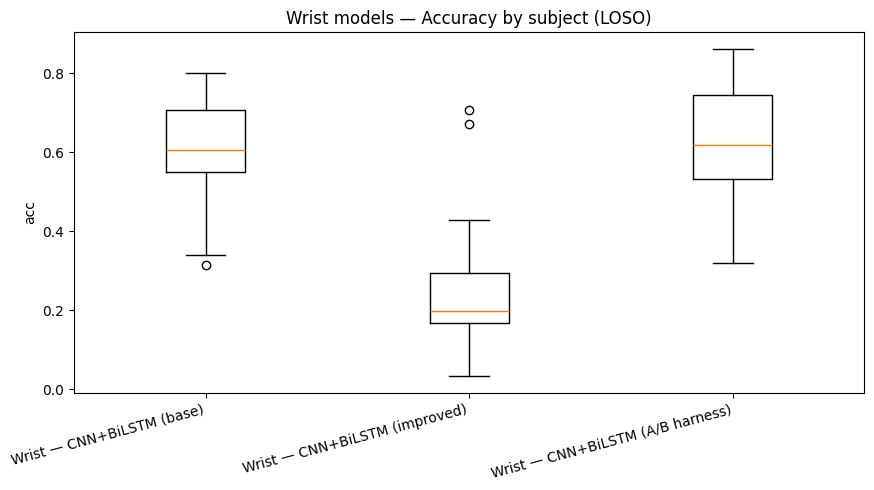

[saved] /content/drive/MyDrive/colab_checkpoints/wesad/eval/figs_all_models/wrist_models_box_acc.png
[saved] /content/drive/MyDrive/colab_checkpoints/wesad/eval/figs_all_models/subject_level_wrist_stats.csv
[saved] /content/drive/MyDrive/colab_checkpoints/wesad/eval/figs_all_models/subject_level_wrist_stats_rollup.csv


In [ ]:
# === Focus: WRIST models only — plots + subject-level table ===
import numpy as np, pandas as pd, matplotlib.pyplot as plt
from pathlib import Path

WRIST_MODELS = [
    "Wrist — CNN+BiLSTM (base)",
    "Wrist — CNN+BiLSTM (improved)",
    "Wrist — CNN+BiLSTM (A/B harness)",
]

# Keep only wrist models present in perf
wrist_present = [m for m in WRIST_MODELS if m in perf["model"].unique()]
if not wrist_present:
    raise SystemExit("No wrist models found in perf. Check model names in WRIST_MODELS.")
wrist = perf[perf["model"].isin(wrist_present)].copy()
wrist["fold"] = pd.to_numeric(wrist["fold"], errors="coerce")

# --- pick best wrist model by mean Macro-F1; tie-break on mean Acc
g = wrist.groupby("model").agg(
    f1_mean=("f1_macro","mean"),
    acc_mean=("acc","mean"),
    n=("f1_macro","count")
).sort_values(["f1_mean","acc_mean"], ascending=[False, False])
best_wrist = g.index[0]
print(f"[BEST WRIST] {best_wrist}  (Macro-F1={g.loc[best_wrist,'f1_mean']:.4f}, "
      f"Acc={g.loc[best_wrist,'acc_mean']:.4f}, n={int(g.loc[best_wrist,'n'])})")

# ---------- helper plotting funcs (matplotlib only; one fig per chart; no custom colors)
def bar_mean_std(df, metric: str, outfile: Path, title: str):
    agg = df.groupby("model")[metric].agg(["mean","std"])
    x = np.arange(len(agg))
    plt.figure(figsize=(9,5))
    plt.bar(x, agg["mean"].values, yerr=agg["std"].values, capsize=5)
    plt.xticks(x, agg.index, rotation=15, ha="right")
    plt.ylabel(metric)
    plt.title(title)
    plt.tight_layout()
    plt.savefig(outfile, dpi=200)
    plt.show()
    print(f"[saved] {outfile}")

def boxplot_metric(df, metric: str, outfile: Path, title: str):
    models = list(df["model"].unique())
    data = [df.loc[df["model"]==m, metric].dropna().values for m in models]
    plt.figure(figsize=(9,5))
    plt.boxplot(data, tick_labels=models, showmeans=False)
    plt.ylabel(metric)
    plt.title(title)
    plt.xticks(rotation=15, ha="right")
    plt.tight_layout()
    plt.savefig(outfile, dpi=200)
    plt.show()
    print(f"[saved] {outfile}")

# ---------- PLOTS for WRIST models ----------
bar_mean_std(wrist, "f1_macro",
             FIG_ROOT/"wrist_models_bar_meanstd_f1_macro.png",
             "Wrist models — Macro-F1 (mean ± std)")
bar_mean_std(wrist, "acc",
             FIG_ROOT/"wrist_models_bar_meanstd_acc.png",
             "Wrist models — Accuracy (mean ± std)")

boxplot_metric(wrist, "f1_macro",
               FIG_ROOT/"wrist_models_box_f1_macro.png",
               "Wrist models — Macro-F1 by subject (LOSO)")
boxplot_metric(wrist, "acc",
               FIG_ROOT/"wrist_models_box_acc.png",
               "Wrist models — Accuracy by subject (LOSO)")

# ---------- SUBJECT-LEVEL STATS across wrist models ----------
# For each subject (fold), aggregate across all wrist models.
def subj_stats_family(df_family: pd.DataFrame, metric: str, prefix: str):
    d = df_family.copy()
    d["fold"] = pd.to_numeric(d["fold"], errors="coerce").astype("Int64")
    g = d.groupby("fold")[metric]
    out = pd.DataFrame({
        "subject_id": g.mean().index.astype(int),
        f"{prefix}_{metric}_mean": g.mean().values,
        f"{prefix}_{metric}_median": g.median().values,
        f"{prefix}_{metric}_q1": g.quantile(0.25).values,
        f"{prefix}_{metric}_q3": g.quantile(0.75).values,
        f"{prefix}_{metric}_min": g.min().values,
        f"{prefix}_{metric}_max": g.max().values,
        f"{prefix}_{metric}_count": g.count().values,
    })
    return out.sort_values("subject_id").reset_index(drop=True)

wrist_f1 = subj_stats_family(wrist, "f1_macro", "wrist")
wrist_acc = subj_stats_family(wrist, "acc", "wrist")

# Merge to one subject-level table
subj_table = wrist_f1.merge(wrist_acc, on="subject_id", how="outer").sort_values("subject_id")
subj_csv = FIG_ROOT/"subject_level_wrist_stats.csv"
subj_table.to_csv(subj_csv, index=False)
print(f"[saved] {subj_csv}")

# (Optional) quick sanity rollup
rollup = pd.DataFrame({
    "wrist_f1_macro_mean_over_subjects": [subj_table["wrist_f1_macro_mean"].mean()],
    "wrist_acc_mean_over_subjects": [subj_table["wrist_acc_mean"].mean()],
})
rollup_csv = FIG_ROOT/"subject_level_wrist_stats_rollup.csv"
rollup.to_csv(rollup_csv, index=False)
print(f"[saved] {rollup_csv}")


In [ ]:
# === Subject-level wrist & chest performance stats (mean/median/q1/q3/min/max) ===
# Reuses: perf, FIG_ROOT

import pandas as pd
from pathlib import Path

CHEST_MODELS = [
    "Chest — BiLSTM-V1",
    "Chest — BiLSTM (Last+Mean)",
    "Chest — CNN+BiLSTM",
]
WRIST_MODELS = [
    "Wrist — CNN+BiLSTM (base)",
    "Wrist — CNN+BiLSTM (improved)",
    "Wrist — CNN+BiLSTM (A/B harness)",
]

def _family_subject_stats(perf: pd.DataFrame, models: list[str], metric: str, prefix: str) -> pd.DataFrame:
    present = [m for m in models if m in perf["model"].unique()]
    df = perf[perf["model"].isin(present)].copy()
    if df.empty:
        # empty shell to merge later without crashing
        return pd.DataFrame(columns=[
            "subject_id",
            f"{prefix}_{metric}_mean",
            f"{prefix}_{metric}_median",
            f"{prefix}_{metric}_q1",
            f"{prefix}_{metric}_q3",
            f"{prefix}_{metric}_min",
            f"{prefix}_{metric}_max",
            f"{prefix}_{metric}_count",
        ])
    df["fold"] = pd.to_numeric(df["fold"], errors="coerce")
    g = df.groupby("fold")[metric]
    out = pd.DataFrame({
        "subject_id": g.mean().index.astype(int),
        f"{prefix}_{metric}_mean": g.mean().values,
        f"{prefix}_{metric}_median": g.median().values,
        f"{prefix}_{metric}_q1": g.quantile(0.25).values,
        f"{prefix}_{metric}_q3": g.quantile(0.75).values,
        f"{prefix}_{metric}_min": g.min().values,
        f"{prefix}_{metric}_max": g.max().values,
        f"{prefix}_{metric}_count": g.count().values,
    }).sort_values("subject_id").reset_index(drop=True)
    return out

# Build per-subject stats for both families & both metrics
chest_f1 = _family_subject_stats(perf, CHEST_MODELS, "f1_macro", "chest")
chest_acc = _family_subject_stats(perf, CHEST_MODELS, "acc", "chest")
wrist_f1 = _family_subject_stats(perf, WRIST_MODELS, "f1_macro", "wrist")
wrist_acc = _family_subject_stats(perf, WRIST_MODELS, "acc", "wrist")

# Merge all into a single subject-level table
dfs = [chest_f1, chest_acc, wrist_f1, wrist_acc]
base = pd.DataFrame({"subject_id": sorted({*chest_f1.get("subject_id", []),
                                           *chest_acc.get("subject_id", []),
                                           *wrist_f1.get("subject_id", []),
                                           *wrist_acc.get("subject_id", [])})})
subj_table = base
for d in dfs:
    if not d.empty:
        subj_table = subj_table.merge(d, on="subject_id", how="left")

subj_table = subj_table.sort_values("subject_id").reset_index(drop=True)

# Save
out_csv = FIG_ROOT / "subject_level_wrist_chest_stats.csv"
subj_table.to_csv(out_csv, index=False)
print(f"[saved] {out_csv}")

# (Optional) quick peek
try:
    from IPython.display import display
    display(subj_table.head(10).round(3))
except Exception:
    pass


[saved] /content/drive/MyDrive/colab_checkpoints/wesad/eval/figs_all_models/subject_level_wrist_chest_stats.csv


,subject_id,chest_f1_macro_mean,chest_f1_macro_median,chest_f1_macro_q1,chest_f1_macro_q3,chest_f1_macro_min,chest_f1_macro_max,chest_f1_macro_count,chest_acc_mean,chest_acc_median,...,wrist_f1_macro_min,wrist_f1_macro_max,wrist_f1_macro_count,wrist_acc_mean,wrist_acc_median,wrist_acc_q1,wrist_acc_q3,wrist_acc_min,wrist_acc_max,wrist_acc_count
0,1,0.433,0.444,0.424,0.448,0.404,0.451,3,0.588,0.566,...,0.117,0.355,3,0.379,0.385,0.291,0.470,0.198,0.555,3
1,2,0.285,0.295,0.277,0.297,0.259,0.300,3,0.409,0.409,...,0.224,0.514,3,0.524,0.572,0.408,0.665,0.243,0.757,3
2,3,0.572,0.576,0.534,0.612,0.492,0.647,3,0.631,0.627,...,0.039,0.428,3,0.355,0.426,0.230,0.516,0.033,0.607,3
3,4,0.790,0.803,0.782,0.805,0.761,0.807,3,0.794,0.800,...,0.044,0.408,3,0.412,0.546,0.298,0.593,0.049,0.639,3
4,5,0.355,0.403,0.318,0.416,0.232,0.429,3,0.423,0.493,...,0.229,0.368,3,0.626,0.649,0.586,0.678,0.523,0.707,3
5,6,0.539,0.515,0.492,0.573,0.469,0.631,3,0.573,0.527,...,0.219,0.418,3,0.391,0.339,0.312,0.444,0.285,0.548,3
6,7,0.578,0.558,0.555,0.592,0.551,0.625,3,0.738,0.785,...,0.200,0.557,3,0.648,0.781,0.541,0.821,0.301,0.862,3
7,8,0.536,0.577,0.417,0.676,0.258,0.774,3,0.606,0.618,...,0.141,0.220,3,0.274,0.313,0.251,0.316,0.189,0.318,3
8,9,0.425,0.463,0.400,0.469,0.337,0.474,3,0.533,0.545,...,0.156,0.459,3,0.588,0.800,0.474,0.807,0.149,0.814,3
9,10,0.503,0.499,0.493,0.511,0.487,0.522,3,0.523,0.527,...,0.128,0.418,3,0.490,0.638,0.413,0.641,0.188,0.643,3


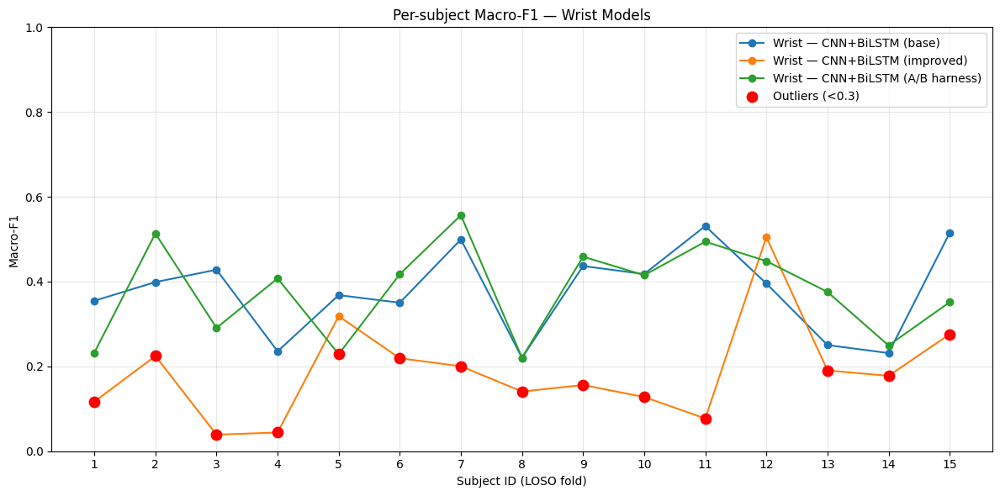

[saved] /content/drive/MyDrive/colab_checkpoints/wesad/eval/figs_all_models/wrist_per_subject_f1_line.png


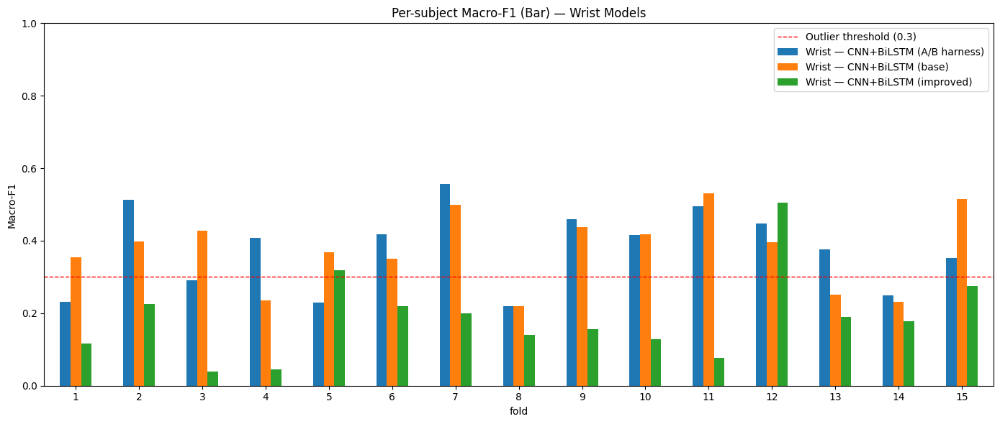

[saved] /content/drive/MyDrive/colab_checkpoints/wesad/eval/figs_all_models/wrist_per_subject_f1_bar.png
[saved] /content/drive/MyDrive/colab_checkpoints/wesad/eval/figs_all_models/wrist_per_subject_f1_improvements.csv


In [ ]:
# === Per-subject Macro-F1 for WRIST models (line + bar, outliers highlighted) ===
import matplotlib.pyplot as plt
import numpy as np

WRIST_MODELS = [
    "Wrist — CNN+BiLSTM (base)",
    "Wrist — CNN+BiLSTM (improved)",
    "Wrist — CNN+BiLSTM (A/B harness)",
]

# filter perf for wrist models
wrist = perf[perf["model"].isin(WRIST_MODELS)].copy()
wrist["fold"] = pd.to_numeric(wrist["fold"], errors="coerce")

# aggregate per-subject mean macro-F1 for each model
pivot = wrist.groupby(["fold","model"])["f1_macro"].mean().unstack()

# --- line plot
plt.figure(figsize=(12,6))
for model in WRIST_MODELS:
    if model in pivot.columns:
        plt.plot(pivot.index, pivot[model], marker="o", label=model)

# highlight outliers: subjects with F1 < 0.3 in any model
outliers = pivot[(pivot < 0.3).any(axis=1)]
plt.scatter(outliers.index, outliers.min(axis=1), color="red", s=80, zorder=5, label="Outliers (<0.3)")

plt.xlabel("Subject ID (LOSO fold)")
plt.ylabel("Macro-F1")
plt.title("Per-subject Macro-F1 — Wrist Models")
plt.xticks(pivot.index)
plt.ylim(0,1)
plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()
line_out = FIG_ROOT/"wrist_per_subject_f1_line.png"
plt.savefig(line_out, dpi=200)
plt.show()
print(f"[saved] {line_out}")

# --- bar plot (side-by-side per subject)
pivot.plot(kind="bar", figsize=(14,6))
plt.axhline(0.3, color="red", linestyle="--", linewidth=1, label="Outlier threshold (0.3)")
plt.ylabel("Macro-F1")
plt.title("Per-subject Macro-F1 (Bar) — Wrist Models")
plt.xticks(rotation=0)
plt.ylim(0,1)
plt.legend()
plt.tight_layout()
bar_out = FIG_ROOT/"wrist_per_subject_f1_bar.png"
plt.savefig(bar_out, dpi=200)
plt.show()
print(f"[saved] {bar_out}")

# --- improvement annotation (base → improved → A/B)
impr = pivot.copy()
if all(m in impr.columns for m in WRIST_MODELS):
    impr["delta_base_to_improved"] = impr[WRIST_MODELS[1]] - impr[WRIST_MODELS[0]]
    impr["delta_improved_to_ab"] = impr[WRIST_MODELS[2]] - impr[WRIST_MODELS[1]]
    impr_csv = FIG_ROOT/"wrist_per_subject_f1_improvements.csv"
    impr.to_csv(impr_csv)
    print(f"[saved] {impr_csv}")


[saved] /content/drive/MyDrive/colab_checkpoints/wesad/eval/figs_all_models/wrist_configs_perfold_f1_acc.csv


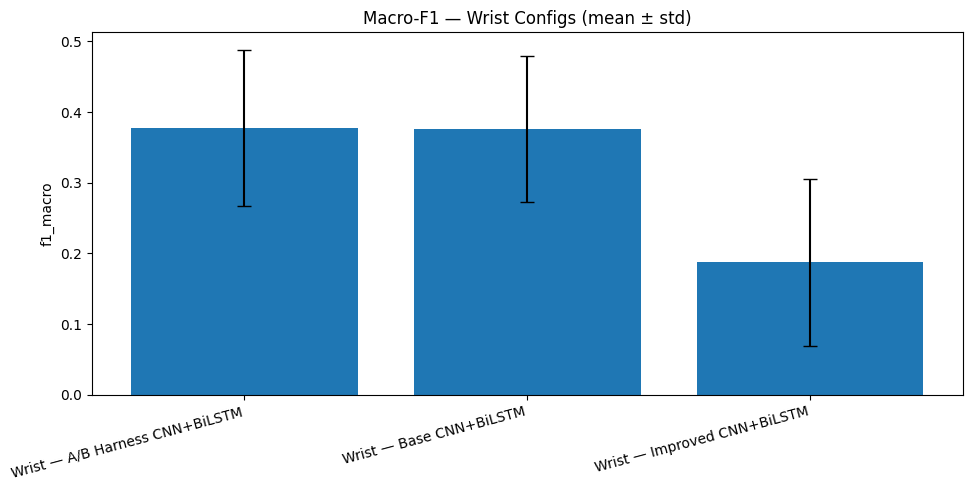

[saved] /content/drive/MyDrive/colab_checkpoints/wesad/eval/figs_all_models/wrist_configs_f1_bar_meanstd.png


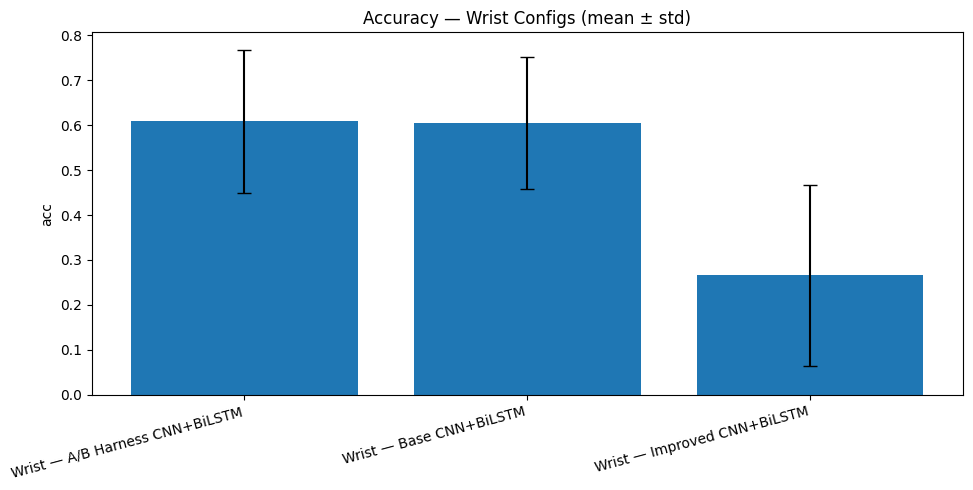

[saved] /content/drive/MyDrive/colab_checkpoints/wesad/eval/figs_all_models/wrist_configs_acc_bar_meanstd.png


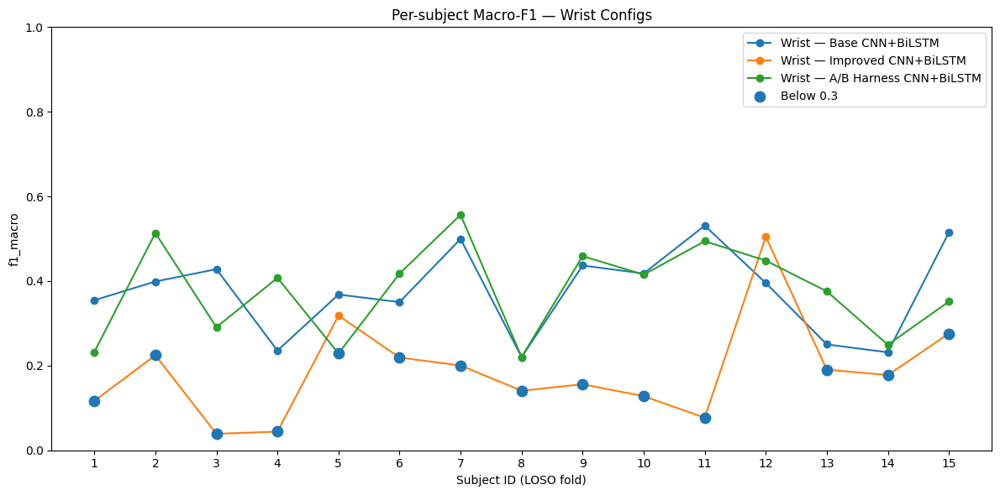

[saved] /content/drive/MyDrive/colab_checkpoints/wesad/eval/figs_all_models/wrist_configs_f1_line.png


In [ ]:
# === Macro-F1 across WRIST transfer/augmentation/tuning configs (bar or line) ===
# Reuses: FIG_ROOT
import pandas as pd, numpy as np, matplotlib.pyplot as plt
from pathlib import Path

# Known wrist config summaries (present in your Drive listing)
WRIST_CONFIGS = {
    "Wrist — Base CNN+BiLSTM":
        "/content/drive/MyDrive/colab_checkpoints/wesad/eval/wristdelta20_phases_conv/phase_conv_loso_summary.csv",
    "Wrist — Improved CNN+BiLSTM":
        "/content/drive/MyDrive/colab_checkpoints/wesad/eval/wristdelta20_phases_conv_impr/phase_conv_loso_summary.csv",
    "Wrist — A/B Harness CNN+BiLSTM":
        "/content/drive/MyDrive/colab_checkpoints/wesad/eval/wristdelta20_phases_conv_ab/phase_conv_loso_summary.csv",
}

def _read_summary(path: str) -> pd.DataFrame | None:
    p = Path(path)
    if not p.exists():
        print(f"[MISS] {path}")
        return None
    df = pd.read_csv(p)

    # fold column
    if "fold" not in df.columns:
        # if not present, assume rows correspond to folds 1..N
        df["fold"] = np.arange(1, len(df)+1)

    # f1 and acc columns (different runs use slightly different names)
    f1_col = next((c for c in ["f1_macro","test_f1_macro","macro_f1","f1"] if c in df.columns), None)
    acc_col = next((c for c in ["acc","accuracy","test_accuracy"] if c in df.columns), None)

    out = pd.DataFrame({
        "fold": pd.to_numeric(df["fold"], errors="coerce"),
        "f1_macro": pd.to_numeric(df[f1_col], errors="coerce") if f1_col else np.nan,
        "acc": pd.to_numeric(df[acc_col], errors="coerce") if acc_col else np.nan,
    })
    return out

# Load and combine
rows = []
for cfg_name, path in WRIST_CONFIGS.items():
    df = _read_summary(path)
    if df is None or df.empty:
        print(f"[WARN] Skipping {cfg_name} (missing/empty).")
        continue
    df.insert(0, "config", cfg_name)
    rows.append(df)

if not rows:
    raise SystemExit("No wrist config summaries found. Check WRIST_CONFIGS paths.")

perf_cfg = pd.concat(rows, ignore_index=True).dropna(subset=["f1_macro"])
perf_cfg["fold"] = perf_cfg["fold"].astype(int).sort_values(kind="stable")

# Save tidy table
out_csv = FIG_ROOT / "wrist_configs_perfold_f1_acc.csv"
perf_cfg.to_csv(out_csv, index=False)
print(f"[saved] {out_csv}")

# ---- Plotting helpers (matplotlib; one fig per chart; no custom colors) ----
def plot_bar_meanstd(df: pd.DataFrame, metric: str, title: str, outfile: Path):
    g = df.groupby("config")[metric].agg(["mean","std"])
    x = np.arange(len(g))
    plt.figure(figsize=(10,5))
    plt.bar(x, g["mean"].values, yerr=g["std"].values, capsize=5)
    plt.xticks(x, g.index, rotation=15, ha="right")
    plt.ylabel(metric)
    plt.title(title)
    plt.tight_layout()
    plt.savefig(outfile, dpi=200)
    plt.show()
    print(f"[saved] {outfile}")

def plot_line_per_subject(df: pd.DataFrame, metric: str, title: str, outfile: Path,
                          outlier_thresh: float | None = None):
    plt.figure(figsize=(12,6))
    for cfg in df["config"].unique():
        sub = df[df["config"]==cfg].sort_values("fold")
        plt.plot(sub["fold"], sub[metric], marker="o", label=cfg)
    if outlier_thresh is not None:
        low = df[df[metric] < outlier_thresh].groupby("fold")[metric].min()
        if not low.empty:
            plt.scatter(low.index, low.values, s=80, label=f"Below {outlier_thresh}", zorder=5)
    plt.xlabel("Subject ID (LOSO fold)")
    plt.ylabel(metric)
    plt.title(title)
    plt.xticks(sorted(df["fold"].unique()))
    plt.ylim(0, 1)
    plt.legend()
    plt.tight_layout()
    plt.savefig(outfile, dpi=200)
    plt.show()
    print(f"[saved] {outfile}")

# ---- Create both styles (choose what you need) ----
# Bar: mean±std across subjects for each config
plot_bar_meanstd(perf_cfg, "f1_macro",
                 "Macro-F1 — Wrist Configs (mean ± std)",
                 FIG_ROOT/"wrist_configs_f1_bar_meanstd.png")

# Optional: accuracy too
if perf_cfg["acc"].notna().any():
    plot_bar_meanstd(perf_cfg, "acc",
                     "Accuracy — Wrist Configs (mean ± std)",
                     FIG_ROOT/"wrist_configs_acc_bar_meanstd.png")

# Line: per-subject curves overlayed by config (with optional outlier threshold)
plot_line_per_subject(perf_cfg, "f1_macro",
                      "Per-subject Macro-F1 — Wrist Configs",
                      FIG_ROOT/"wrist_configs_f1_line.png",
                      outlier_thresh=0.30)  # adjust threshold or set None to disable


[saved] /content/drive/MyDrive/colab_checkpoints/wesad/eval/figs_all_models/all_models_summary_stats.csv
[BEST] Chest — BiLSTM (Last+Mean), [WORST] Wrist — CNN+BiLSTM (improved)


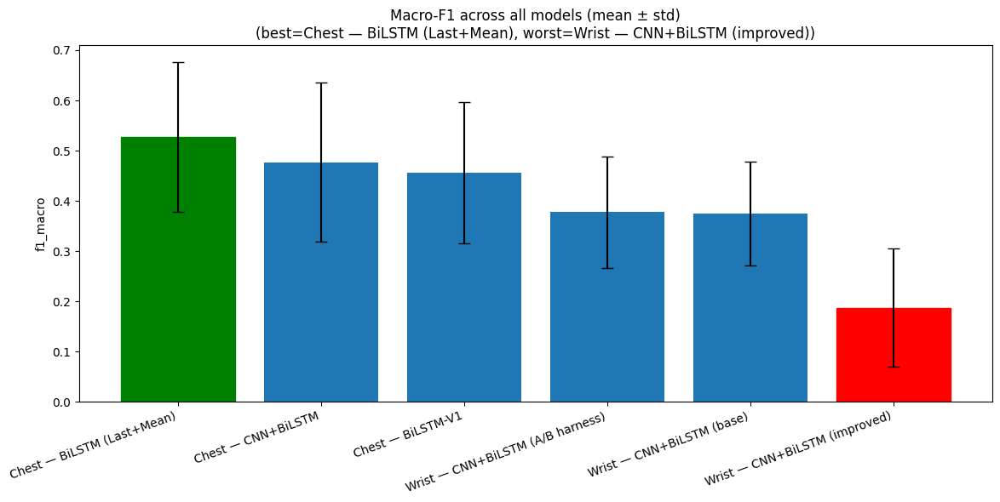

[saved] /content/drive/MyDrive/colab_checkpoints/wesad/eval/figs_all_models/all_models_bar_f1.png


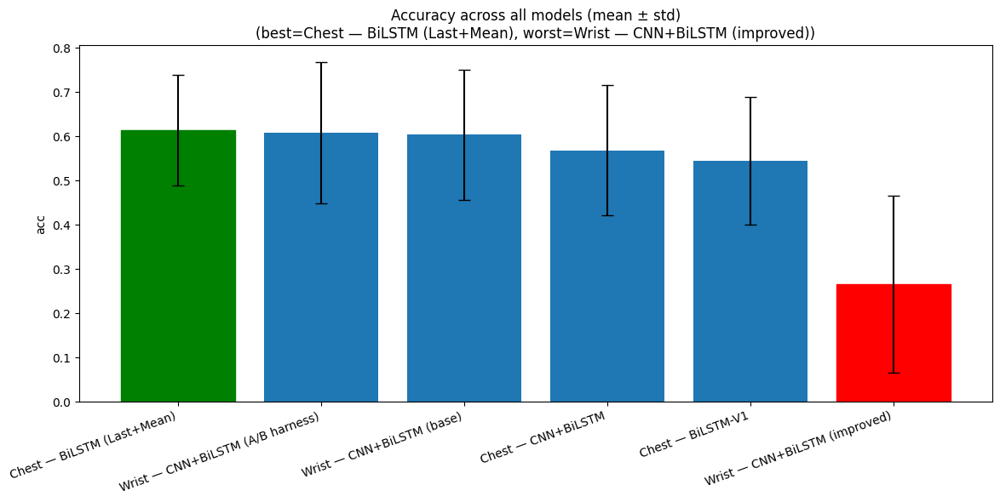

[saved] /content/drive/MyDrive/colab_checkpoints/wesad/eval/figs_all_models/all_models_bar_acc.png


In [ ]:
# === Comparison across ALL models (Chest + Wrist) ===
import numpy as np, pandas as pd, matplotlib.pyplot as plt
from pathlib import Path

ALL_MODELS = perf["model"].unique()

# --- compute per-model summary (quartiles, extremes) ---
def _percentiles(s: pd.Series):
    return pd.Series({
        "mean": s.mean(),
        "std": s.std(),
        "min": s.min(),
        "q1": s.quantile(0.25),
        "median": s.quantile(0.5),
        "q3": s.quantile(0.75),
        "max": s.max(),
        "count": s.count(),
    })

summary_acc = perf.dropna(subset=["acc"]).groupby("model")["acc"].apply(_percentiles).unstack()
summary_f1  = perf.groupby("model")["f1_macro"].apply(_percentiles).unstack()

summary = pd.concat([summary_acc, summary_f1], axis=1, keys=["acc","f1_macro"])
summary_csv = FIG_ROOT/"all_models_summary_stats.csv"
summary.to_csv(summary_csv)
print(f"[saved] {summary_csv}")

# --- identify top/bottom models by mean F1 ---
best_model = summary["f1_macro"]["mean"].idxmax()
worst_model = summary["f1_macro"]["mean"].idxmin()
print(f"[BEST] {best_model}, [WORST] {worst_model}")

# --- side-by-side bar plots ---
def bar_mean_std(summary: pd.DataFrame, metric: str, outfile: Path, title: str):
    g = summary[metric][["mean","std"]].sort_values("mean", ascending=False)
    x = np.arange(len(g))
    plt.figure(figsize=(12,6))
    bars = plt.bar(x, g["mean"], yerr=g["std"], capsize=5)

    # highlight best & worst bars
    best_i = g.index.get_loc(best_model) if best_model in g.index else None
    worst_i = g.index.get_loc(worst_model) if worst_model in g.index else None
    if best_i is not None: bars[best_i].set_color("green")
    if worst_i is not None: bars[worst_i].set_color("red")

    plt.xticks(x, g.index, rotation=20, ha="right")
    plt.ylabel(metric)
    plt.title(title + f"\n(best={best_model}, worst={worst_model})")
    plt.tight_layout()
    plt.savefig(outfile, dpi=200)
    plt.show()
    print(f"[saved] {outfile}")

bar_mean_std(summary, "f1_macro",
             FIG_ROOT/"all_models_bar_f1.png",
             "Macro-F1 across all models (mean ± std)")
bar_mean_std(summary, "acc",
             FIG_ROOT/"all_models_bar_acc.png",
             "Accuracy across all models (mean ± std)")


In [ ]:
# === Confusion Matrices: Best Chest & Best Wrist Models ===
import pandas as pd, numpy as np, matplotlib.pyplot as plt, seaborn as sns
from sklearn.metrics import confusion_matrix

# point to your prediction CSVs (adjust these once you confirm file names)
PRED_PATHS = {
    "Chest — Best": "/content/drive/MyDrive/colab_checkpoints/wesad/eval/chestdelta20_phases_conv/best_model_preds.csv",
    "Wrist — Best": "/content/drive/MyDrive/colab_checkpoints/wesad/eval/wristdelta20_phases_conv_impr/best_model_preds.csv",
}

def plot_confmat(df: pd.DataFrame, true_col: str, pred_col: str, labels: list[str], title: str, outfile: Path):
    cm = confusion_matrix(df[true_col], df[pred_col], labels=labels)
    cm_norm = cm.astype(float) / cm.sum(axis=1, keepdims=True)

    plt.figure(figsize=(7,6))
    sns.heatmap(cm_norm, annot=cm, fmt="d", cmap="Blues",
                xticklabels=labels, yticklabels=labels, cbar=True)
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.title(title)
    plt.tight_layout()
    plt.savefig(outfile, dpi=200)
    plt.show()
    print(f"[saved] {outfile}")

# define your APR phase labels (adjust to your dataset)
PHASE_LABELS = ["Baseline", "Stress", "Amusement", "Relaxation"]

for model_name, path in PRED_PATHS.items():
    p = Path(path)
    if not p.exists():
        print(f"[MISS] {model_name} predictions at {p}")
        continue

    df = pd.read_csv(p)
    # adjust column names if needed
    true_col = next((c for c in df.columns if "true" in c.lower()), None)
    pred_col = next((c for c in df.columns if "pred" in c.lower()), None)
    if true_col is None or pred_col is None:
        print(f"[WARN] {model_name}: no true/pred columns found.")
        continue

    plot_confmat(df, true_col, pred_col, PHASE_LABELS,
                 f"{model_name} — Phase Confusion Matrix",
                 FIG_ROOT/f"{model_name.replace(' ','_')}_confusion_matrix.png")


[MISS] Chest — Best predictions at /content/drive/MyDrive/colab_checkpoints/wesad/eval/chestdelta20_phases_conv/best_model_preds.csv
[MISS] Wrist — Best predictions at /content/drive/MyDrive/colab_checkpoints/wesad/eval/wristdelta20_phases_conv_impr/best_model_preds.csv


[saved] /content/drive/MyDrive/colab_checkpoints/wesad/eval/figs_all_models/wrist_per_subject_f1_macro_aligned.csv


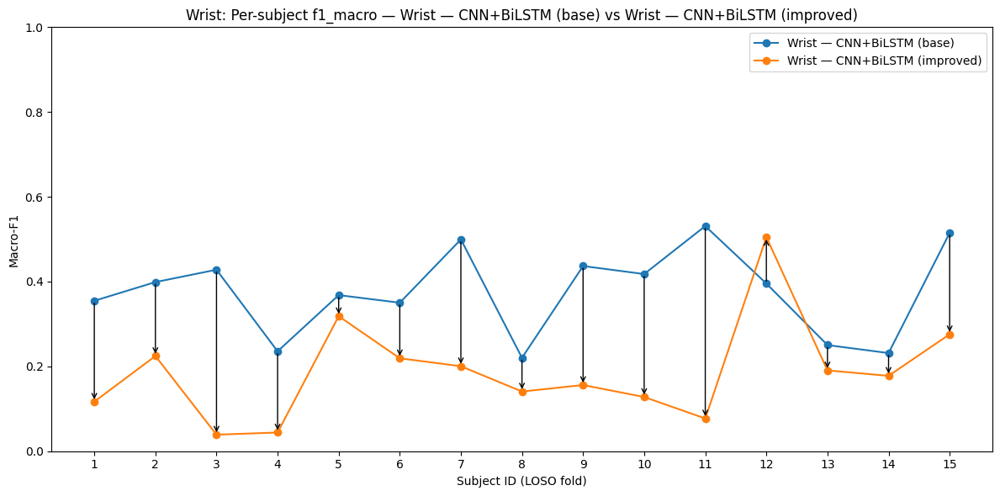

[saved] /content/drive/MyDrive/colab_checkpoints/wesad/eval/figs_all_models/wrist_per_subject_f1_macro_line_Wrist — CNN+BiLSTM (base)_vs_Wrist — CNN+BiLSTM (improved).png
[saved] /content/drive/MyDrive/colab_checkpoints/wesad/eval/figs_all_models/wrist_per_subject_f1_macro_delta_Wrist — CNN+BiLSTM (base)_to_Wrist — CNN+BiLSTM (improved).csv


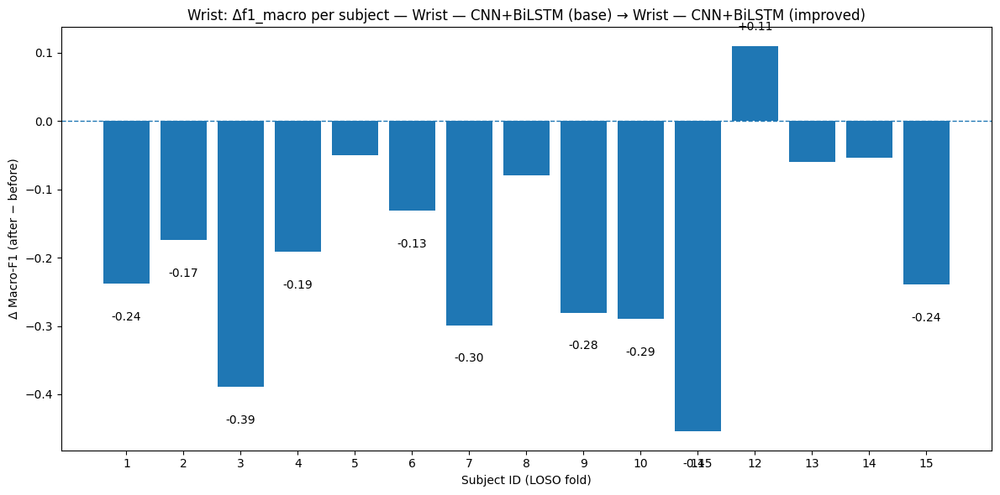

[saved] /content/drive/MyDrive/colab_checkpoints/wesad/eval/figs_all_models/wrist_per_subject_f1_macro_bar_delta_Wrist — CNN+BiLSTM (base)_to_Wrist — CNN+BiLSTM (improved).png


FileNotFoundError: [Errno 2] No such file or directory: '/content/drive/MyDrive/colab_checkpoints/wesad/eval/figs_all_models/wrist_per_subject_f1_macro_line_Wrist — CNN+BiLSTM (improved)_vs_Wrist — CNN+BiLSTM (A/B harness).png'

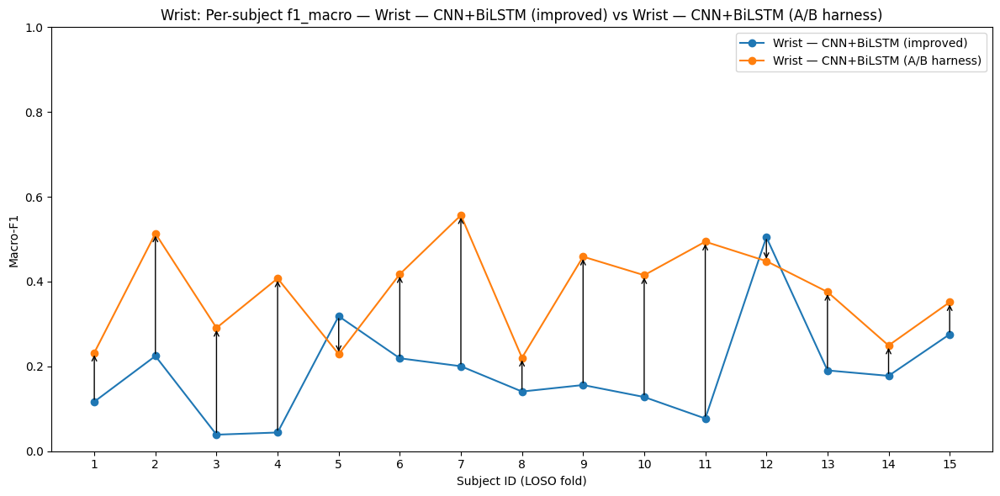

In [ ]:
# === Per-Subject Improvement Charts (before/after tuning or transfer) ===
# Reuses: perf, FIG_ROOT
import numpy as np, pandas as pd, matplotlib.pyplot as plt
from pathlib import Path

# --- Configure model groups ---
WRIST_MODELS_ORDERED = [
    "Wrist — CNN+BiLSTM (base)",
    "Wrist — CNN+BiLSTM (improved)",
    "Wrist — CNN+BiLSTM (A/B harness)",
]
CHEST_MODELS_ORDERED = [
    "Chest — BiLSTM-V1",
    "Chest — BiLSTM (Last+Mean)",
    "Chest — CNN+BiLSTM",
]

def _aligned_subject_table(perf: pd.DataFrame, models_ordered: list[str], metric="f1_macro") -> pd.DataFrame:
    """Return wide table: rows=subject (fold), cols=models (metric mean per subject)."""
    present = [m for m in models_ordered if m in perf["model"].unique()]
    if len(present) < 2:
        raise SystemExit("Need at least two models for before/after comparison.")
    df = perf[perf["model"].isin(present)].copy()
    df["fold"] = pd.to_numeric(df["fold"], errors="coerce").astype(int)
    g = df.groupby(["fold","model"])[metric].mean().unstack()  # per-subject mean per model
    g = g.reindex(sorted(g.index))  # sort by subject id
    return g, present

def _line_overlay(g: pd.DataFrame, before: str, after: str, title: str, outfile: Path, ylim=(0,1)):
    """Line plot overlay: per-subject metric for before vs after."""
    x = g.index.values
    y0 = g[before].values
    y1 = g[after].values

    plt.figure(figsize=(12,6))
    plt.plot(x, y0, marker="o", label=before)
    plt.plot(x, y1, marker="o", label=after)

    # optional small arrow annotations (no custom colors)
    for xi, a, b in zip(x, y0, y1):
        if np.isfinite(a) and np.isfinite(b):
            # draw a simple arrow from before to after at the same x
            plt.annotate("", xy=(xi, b), xytext=(xi, a), arrowprops=dict(arrowstyle="->", lw=1))

    plt.xlabel("Subject ID (LOSO fold)")
    plt.ylabel("Macro-F1")
    plt.title(title)
    plt.xticks(x)
    if ylim: plt.ylim(*ylim)
    plt.legend()
    plt.tight_layout()
    plt.savefig(outfile, dpi=200)
    plt.show()
    print(f"[saved] {outfile}")

def _bar_delta(g: pd.DataFrame, before: str, after: str, title: str, outfile: Path, hline: float | None = 0.0):
    """Bar plot of per-subject delta (after - before)."""
    x = g.index.values
    delta = (g[after] - g[before]).values

    plt.figure(figsize=(12,6))
    plt.bar(x, delta)
    if hline is not None:
        plt.axhline(hline, linestyle="--", linewidth=1)

    # annotate notable improvements/degradations
    for xi, d in zip(x, delta):
        if np.isfinite(d) and abs(d) >= 0.10:  # threshold for “notable”
            plt.annotate(f"{d:+.2f}", xy=(xi, d), xytext=(xi, d + (0.02 if d>=0 else -0.04)),
                         ha="center", va="bottom" if d>=0 else "top")

    plt.xlabel("Subject ID (LOSO fold)")
    plt.ylabel("Δ Macro-F1 (after − before)")
    plt.title(title)
    plt.xticks(x)
    plt.tight_layout()
    plt.savefig(outfile, dpi=200)
    plt.show()
    print(f"[saved] {outfile}")

def per_subject_improvements(perf: pd.DataFrame,
                             family: str = "wrist",     # "wrist" or "chest"
                             metric: str = "f1_macro",
                             three_stage: bool = True   # True = Base→Improved→A/B, False = just before→after
                             ):
    if family == "wrist":
        models_ordered = WRIST_MODELS_ORDERED
        tag = "wrist"
    elif family == "chest":
        models_ordered = CHEST_MODELS_ORDERED
        tag = "chest"
    else:
        raise ValueError("family must be 'wrist' or 'chest'")

    g, present = _aligned_subject_table(perf, models_ordered, metric=metric)

    # Save aligned per-subject table
    wide_csv = FIG_ROOT / f"{tag}_per_subject_{metric}_aligned.csv"
    g.to_csv(wide_csv)
    print(f"[saved] {wide_csv}")

    # If three-stage available, generate two comparisons; otherwise just first->last
    if three_stage and len(present) >= 3:
        before, mid, after = present[:3]
        # 1) Line overlay Base vs Improved
        _line_overlay(g[[before, mid]], before, mid,
                      f"{tag.capitalize()}: Per-subject {metric} — {before} vs {mid}",
                      FIG_ROOT / f"{tag}_per_subject_{metric}_line_{before}_vs_{mid}.png")
        # 2) Bar deltas Base→Improved
        g1 = g[[before, mid]].dropna()
        d1 = (g1[mid] - g1[before]).rename("delta_base_to_improved")
        d1_csv = FIG_ROOT / f"{tag}_per_subject_{metric}_delta_{before}_to_{mid}.csv"
        d1.to_csv(d1_csv, header=True)
        print(f"[saved] {d1_csv}")
        _bar_delta(g1, before, mid,
                   f"{tag.capitalize()}: Δ{metric} per subject — {before} → {mid}",
                   FIG_ROOT / f"{tag}_per_subject_{metric}_bar_delta_{before}_to_{mid}.png")

        # 3) Line overlay Improved vs A/B
        _line_overlay(g[[mid, after]], mid, after,
                      f"{tag.capitalize()}: Per-subject {metric} — {mid} vs {after}",
                      FIG_ROOT / f"{tag}_per_subject_{metric}_line_{mid}_vs_{after}.png")
        # 4) Bar deltas Improved→A/B
        g2 = g[[mid, after]].dropna()
        d2 = (g2[after] - g2[mid]).rename("delta_improved_to_ab")
        d2_csv = FIG_ROOT / f"{tag}_per_subject_{metric}_delta_{mid}_to_{after}.csv"
        d2.to_csv(d2_csv, header=True)
        print(f"[saved] {d2_csv}")
        _bar_delta(g2, mid, after,
                   f"{tag.capitalize()}: Δ{metric} per subject — {mid} → {after}",
                   FIG_ROOT / f"{tag}_per_subject_{metric}_bar_delta_{mid}_to_{after}.png")
    else:
        # Two-stage: compare first and last available models in 'present'
        before, after = present[0], present[-1]
        _line_overlay(g[[before, after]], before, after,
                      f"{tag.capitalize()}: Per-subject {metric} — {before} vs {after}",
                      FIG_ROOT / f"{tag}_per_subject_{metric}_line_{before}_vs_{after}.png")
        g3 = g[[before, after]].dropna()
        d = (g3[after] - g3[before]).rename("delta_before_to_after")
        d_csv = FIG_ROOT / f"{tag}_per_subject_{metric}_delta_{before}_to_{after}.csv"
        d.to_csv(d_csv, header=True)
        print(f"[saved] {d_csv}")
        _bar_delta(g3, before, after,
                   f"{tag.capitalize()}: Δ{metric} per subject — {before} → {after}",
                   FIG_ROOT / f"{tag}_per_subject_{metric}_bar_delta_{before}_to_{after}.png")

# ---- Run for WRIST (3-stage) ----
per_subject_improvements(perf, family="wrist", metric="f1_macro", three_stage=True)

# (Optional) also run for CHEST (set three_stage as you like)
# per_subject_improvements(perf, family="chest", metric="f1_macro", three_stage=True)


In [ ]:
# === Parameter Sensitivity Plots (1D/2D sweeps; agreement/F1/acc) ===
# Reuses: FIG_ROOT  (from your earlier cells)
import os, re, glob
import numpy as np, pandas as pd, matplotlib.pyplot as plt
from pathlib import Path

# 1) Tell me where sweeps live (add/adjust patterns as needed)
SENSITIVITY_FILES = [
    "/content/drive/MyDrive/colab_checkpoints/wesad/eval/phase_delay_sensitivity_conv.csv",
    "/content/drive/MyDrive/colab_checkpoints/wesad/eval/chestdelta20_tuning/*devsearch*.csv",
    "/content/drive/MyDrive/colab_checkpoints/wesad/eval/**/sensitivity*.csv",
]
OUTDIR = FIG_ROOT / "sensitivity_plots"
OUTDIR.mkdir(parents=True, exist_ok=True)

# Preferred metric order for sensitivity analysis
METRIC_CANDIDATES = ["agreement", "f1_macro", "macro_f1", "acc", "accuracy"]

def _pick_metric(df: pd.DataFrame) -> str | None:
    for m in METRIC_CANDIDATES:
        if m in df.columns:
            return m
    return None

def _param_columns(df: pd.DataFrame) -> list[str]:
    # treat these as non-parameter columns
    non_params = {"fold","subject","run","seed","epoch","model","config","variant","trial_id","trial","id","split"}
    non_params |= set(df.columns[df.columns.str.contains("f1|acc|agreement|loss", case=False, regex=True)])
    # gather param-like columns
    return [c for c in df.columns if c not in non_params]

def _clean_name(s: str) -> str:
    return re.sub(r"[^a-z0-9]+", "_", s.lower()).strip("_")

def _is_numeric(s: pd.Series) -> bool:
    try:
        pd.to_numeric(s.dropna())
        return True
    except Exception:
        return False

def plot_1d_sweep(df: pd.DataFrame, param: str, metric: str, title_prefix: str):
    """Plot mean±std over param + per-fold scatter."""
    d = df[[param, metric, "fold"]].copy()
    # normalize types
    if _is_numeric(d[param]):
        d[param] = pd.to_numeric(d[param], errors="coerce")
        x_vals = np.sort(d[param].dropna().unique())
        x_label_vals = x_vals
    else:
        d[param] = d[param].astype(str)
        x_vals = d[param].dropna().unique()
        x_label_vals = x_vals

    # per-param aggregates
    g = d.groupby(param)[metric]
    mean = g.mean()
    std = g.std()
    cnt = g.count()
    summary = pd.DataFrame({param: mean.index, "mean": mean.values, "std": std.values, "n": cnt.values})

    # --- Mean±Std line plot ---
    plt.figure(figsize=(9,5))
    if _is_numeric(d[param]):
        x = x_vals
    else:
        x = np.arange(len(x_vals))
    y = mean.reindex(x_label_vals).values if not _is_numeric(d[param]) else mean.loc[x].values
    yerr = std.reindex(x_label_vals).values if not _is_numeric(d[param]) else std.loc[x].values

    # line with caps as std
    plt.errorbar(x, y, yerr=yerr, marker="o", capsize=4)
    plt.xlabel(param)
    plt.ylabel(metric)
    plt.title(f"{title_prefix}: {metric} vs {param} (mean ± std)")
    if not _is_numeric(d[param]):
        plt.xticks(x, x_label_vals, rotation=15, ha="right")
    plt.tight_layout()
    f1 = OUTDIR / f"{_clean_name(title_prefix)}_{_clean_name(metric)}_vs_{_clean_name(param)}_meanstd.png"
    plt.savefig(f1, dpi=200)
    plt.show()
    print(f"[saved] {f1}")

    # --- Scatter of per-fold values (to show spread) ---
    plt.figure(figsize=(9,5))
    if _is_numeric(d[param]):
        for val in x_vals:
            ypts = d.loc[d[param]==val, metric].values
            plt.scatter([val]*len(ypts), ypts)
        plt.xlabel(param)
    else:
        for i, val in enumerate(x_label_vals):
            ypts = d.loc[d[param]==val, metric].values
            plt.scatter([i]*len(ypts), ypts)
        plt.xlabel(param)
        plt.xticks(np.arange(len(x_label_vals)), x_label_vals, rotation=15, ha="right")
    plt.ylabel(metric)
    plt.title(f"{title_prefix}: per-subject {metric} spread vs {param}")
    plt.tight_layout()
    f2 = OUTDIR / f"{_clean_name(title_prefix)}_{_clean_name(metric)}_vs_{_clean_name(param)}_scatter.png"
    plt.savefig(f2, dpi=200)
    plt.show()
    print(f"[saved] {f2}")

    # Save summary CSV for this parameter
    fcsv = OUTDIR / f"{_clean_name(title_prefix)}_{_clean_name(metric)}_vs_{_clean_name(param)}_summary.csv"
    summary.to_csv(fcsv, index=False)
    print(f"[saved] {fcsv}")

def plot_2d_sweep(df: pd.DataFrame, p1: str, p2: str, metric: str, title_prefix: str):
    """Plot heatmap-like matrix via imshow; annotate values."""
    d = df[[p1, p2, metric]].copy()
    # coerce categories order
    p1_vals = sorted(pd.unique(pd.to_numeric(d[p1], errors="ignore")))
    p2_vals = sorted(pd.unique(pd.to_numeric(d[p2], errors="ignore")))

    # pivot as mean over repeats/folds
    pivot = d.pivot_table(index=p1, columns=p2, values=metric, aggfunc="mean")
    # ensure full grid ordering
    pivot = pivot.reindex(index=p1_vals, columns=p2_vals)

    plt.figure(figsize=(8,6))
    im = plt.imshow(pivot.values, aspect="auto")  # no custom cmap
    plt.xticks(range(len(p2_vals)), p2_vals, rotation=15, ha="right")
    plt.yticks(range(len(p1_vals)), p1_vals)
    plt.xlabel(p2)
    plt.ylabel(p1)
    plt.title(f"{title_prefix}: {metric} across {p1} × {p2}")
    # annotate
    for i in range(pivot.shape[0]):
        for j in range(pivot.shape[1]):
            v = pivot.values[i, j]
            if pd.notna(v):
                plt.text(j, i, f"{v:.2f}", ha="center", va="center")
    plt.colorbar(im, fraction=0.046, pad=0.04)
    plt.tight_layout()
    f = OUTDIR / f"{_clean_name(title_prefix)}_{_clean_name(metric)}_{_clean_name(p1)}x{_clean_name(p2)}_heatmap.png"
    plt.savefig(f, dpi=200, bbox_inches="tight")
    plt.show()
    print(f"[saved] {f}")

def analyze_sensitivity(csv_path: str):
    p = Path(csv_path)
    if not p.exists():
        print(f"[MISS] {csv_path}")
        return None
    df = pd.read_csv(p)
    metric = _pick_metric(df)
    if not metric:
        print(f"[skip] {p.name}: no suitable metric column (looked for {METRIC_CANDIDATES})")
        return None

    # Identify parameter columns
    params = _param_columns(df)
    if not params:
        print(f"[skip] {p.name}: no parameter columns detected.")
        return None

    # Keep fold if present for spread plots
    if "fold" not in df.columns:
        df["fold"] = np.nan

    title_prefix = p.stem

    # 1D sweeps
    if len(params) == 1:
        plot_1d_sweep(df, params[0], metric, title_prefix)

    # 2D sweeps (common in grid searches)
    elif len(params) >= 2:
        # do the top two varying parameters by cardinality
        card = sorted([(c, df[c].nunique()) for c in params], key=lambda x: x[1], reverse=True)
        p1, p2 = card[0][0], card[1][0]
        plot_2d_sweep(df, p1, p2, metric, title_prefix)
        # also produce 1D slices for each param separately
        plot_1d_sweep(df[[p1, metric, "fold"]], p1, metric, f"{title_prefix}_slice_{p1}")
        plot_1d_sweep(df[[p2, metric, "fold"]], p2, metric, f"{title_prefix}_slice_{p2}")

    # Export “best setting” row(s)
    df_sort = df.sort_values(metric, ascending=False)
    best_csv = OUTDIR / f"{_clean_name(title_prefix)}_best_rows_by_{_clean_name(metric)}.csv"
    df_sort.head(10).to_csv(best_csv, index=False)
    print(f"[saved] {best_csv}")
    return {"file": str(p), "metric": metric, "params": params}

# ---- Run over all configured files/patterns ----
found = []
for pat in SENSITIVITY_FILES:
    for fp in sorted(glob.glob(pat, recursive=True)):
        res = analyze_sensitivity(fp)
        if res: found.append(res)

# Summary of what we processed
if found:
    summary_df = pd.DataFrame(found)
    summary_csv = OUTDIR / "sensitivity_run_summary.csv"
    summary_df.to_csv(summary_csv, index=False)
    print(f"[saved] {summary_csv}")
else:
    print("[INFO] No sensitivity CSVs processed. Update SENSITIVITY_FILES with correct paths.")


[skip] phase_delay_sensitivity_conv.csv: no suitable metric column (looked for ['agreement', 'f1_macro', 'macro_f1', 'acc', 'accuracy'])
[skip] trf_plus_safe_impr_devsearch.csv: no suitable metric column (looked for ['agreement', 'f1_macro', 'macro_f1', 'acc', 'accuracy'])
[INFO] No sensitivity CSVs processed. Update SENSITIVITY_FILES with correct paths.


[MISS] chest: no usable prediction CSVs found — counts will omit window totals for this modality.
[OK] wrist: loaded 2874 rows from 15 prediction file(s).
[saved] /content/drive/MyDrive/colab_checkpoints/wesad/eval/figs_all_models/data_balance/summary_subjects_windows_by_modality.csv
[saved] /content/drive/MyDrive/colab_checkpoints/wesad/eval/figs_all_models/data_balance/apr_phase_label_distribution.csv


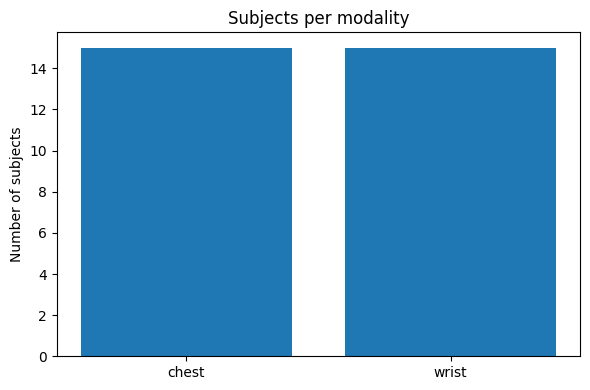

[saved] /content/drive/MyDrive/colab_checkpoints/wesad/eval/figs_all_models/data_balance/bar_subjects_per_modality.png


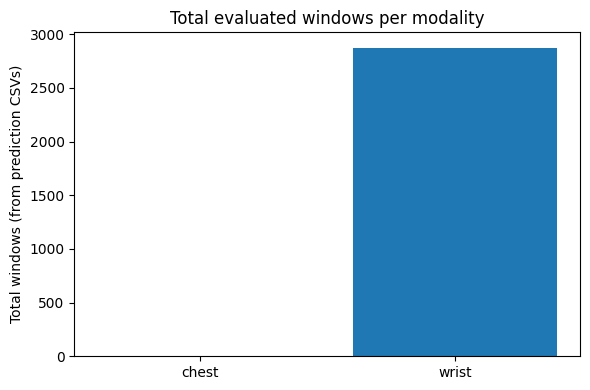

[saved] /content/drive/MyDrive/colab_checkpoints/wesad/eval/figs_all_models/data_balance/bar_windows_per_modality.png


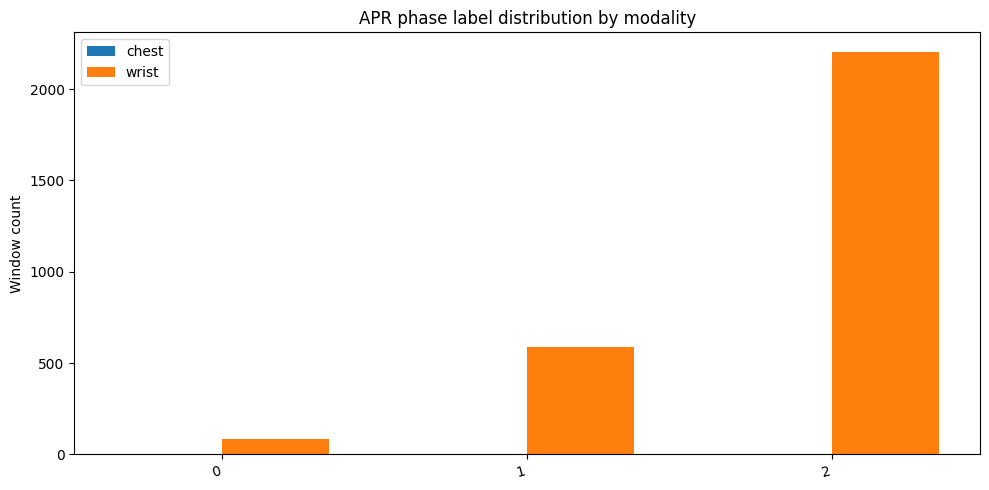

[saved] /content/drive/MyDrive/colab_checkpoints/wesad/eval/figs_all_models/data_balance/bar_apr_distribution_by_modality.png


In [ ]:
# === Data balance & context: subjects, windows, APR distribution (chest vs wrist) ===
# Reuses: FIG_ROOT, perf
import os, glob, re
import numpy as np, pandas as pd, matplotlib.pyplot as plt
from pathlib import Path

# -- Configure APR labels for clean axis/stack names (optional). If None, inferred from data.
APR_LABELS = None  # e.g. ["Baseline","Stress","Amusement"]

# -- Glob patterns to find per-sample prediction CSVs (adjust if needed)
PRED_PATTERNS = {
    "chest": [
        "/content/drive/MyDrive/colab_checkpoints/wesad/eval/chestdelta20_phases_conv/**/test_preds.csv",
        "/content/drive/MyDrive/colab_checkpoints/wesad/eval/chestdelta20_phases/**/test_preds.csv",
        "/content/drive/MyDrive/colab_checkpoints/wesad/eval/chestdelta20/**/test_preds.csv",
    ],
    "wrist": [
        "/content/drive/MyDrive/colab_checkpoints/wesad/eval/wristdelta20_phases_conv/**/test_preds.csv",
        "/content/drive/MyDrive/colab_checkpoints/wesad/eval/wristdelta20_phases_conv_impr/**/test_preds.csv",
        "/content/drive/MyDrive/colab_checkpoints/wesad/eval/wristdelta20_phases_conv_ab/**/test_preds.csv",
    ],
}

TRUE_CANDS = ["true","y_true","label","target","gt","gold"]

def _find_col(df, cands):
    lower = {c.lower(): c for c in df.columns}
    for cand in cands:
        if cand in lower:
            return lower[cand]
    # relaxed
    for c in df.columns:
        lc = c.lower().replace(" ", "").replace("-", "_")
        for cand in cands:
            if cand.replace(" ", "").replace("-", "_") in lc:
                return c
    return None

def _load_preds_for_modality(mod: str) -> pd.DataFrame:
    rows = []
    seen = 0
    for pat in PRED_PATTERNS.get(mod, []):
        files = sorted(glob.glob(pat, recursive=True))
        for fp in files:
            try:
                df = pd.read_csv(fp)
                ycol = _find_col(df, TRUE_CANDS)
                if not ycol:
                    continue
                # infer subject/fold id from path if available
                m = re.search(r"fold[_\- ]?(\d+)", fp, re.IGNORECASE)
                fold = int(m.group(1)) if m else np.nan
                rows.append(pd.DataFrame({"fold": fold, "y_true": df[ycol].values, "src": fp}))
                seen += 1
            except Exception:
                continue
    if rows:
        out = pd.concat(rows, ignore_index=True)
        print(f"[OK] {mod}: loaded {len(out)} rows from {seen} prediction file(s).")
        return out
    else:
        print(f"[MISS] {mod}: no usable prediction CSVs found — counts will omit window totals for this modality.")
        return pd.DataFrame(columns=["fold","y_true","src"])

# --- 1) SUBJECT COUNTS from perf ---
def _subject_counts_from_perf(perf: pd.DataFrame):
    chest_keys = ["Chest — BiLSTM-V1","Chest — BiLSTM (Last+Mean)","Chest — CNN+BiLSTM"]
    wrist_keys = ["Wrist — CNN+BiLSTM (base)","Wrist — CNN+BiLSTM (improved)","Wrist — CNN+BiLSTM (A/B harness)"]
    chest_subj = sorted(pd.to_numeric(perf[perf["model"].isin(chest_keys)]["fold"], errors="coerce").dropna().astype(int).unique())
    wrist_subj = sorted(pd.to_numeric(perf[perf["model"].isin(wrist_keys)]["fold"], errors="coerce").dropna().astype(int).unique())
    return {"chest": len(chest_subj), "wrist": len(wrist_subj)}

subject_counts = _subject_counts_from_perf(perf)

# --- 2) WINDOW COUNTS + APR DISTRIBUTION from preds (if available) ---
preds_chest = _load_preds_for_modality("chest")
preds_wrist = _load_preds_for_modality("wrist")

def _label_series(df: pd.DataFrame) -> pd.Series:
    if df.empty: return pd.Series(dtype=object)
    y = df["y_true"]
    if pd.api.types.is_numeric_dtype(y):
        if APR_LABELS and len(APR_LABELS) > int(y.max()):
            return y.map({i: APR_LABELS[i] for i in range(int(y.max())+1)})
        return y.astype(int).astype(str)
    return y.astype(str)

labels_chest = _label_series(preds_chest)
labels_wrist = _label_series(preds_wrist)

# Make a union of labels to align bars
if APR_LABELS:
    label_order = APR_LABELS
else:
    label_order = sorted(set(labels_chest.unique()).union(set(labels_wrist.unique())) - {np.nan, None, "nan"})

def _counts(s: pd.Series, cats: list[str]) -> pd.Series:
    if s.empty:
        return pd.Series(0, index=cats, dtype=int)
    c = s.value_counts()
    return pd.Series([int(c.get(k, 0)) for k in cats], index=cats)

apr_counts = pd.DataFrame({
    "label": label_order,
    "chest_count": _counts(labels_chest, label_order).values,
    "wrist_count": _counts(labels_wrist, label_order).values,
})
apr_counts["total"] = apr_counts["chest_count"] + apr_counts["wrist_count"]

# Totals (windows) per modality
total_windows = {
    "chest": int(len(preds_chest)) if not preds_chest.empty else 0,
    "wrist": int(len(preds_wrist)) if not preds_wrist.empty else 0,
}

# --- 3) Save tables ---
out_dir = FIG_ROOT
(out_dir / "data_balance").mkdir(parents=True, exist_ok=True)

summary_table = pd.DataFrame({
    "modality": ["chest","wrist"],
    "subjects": [subject_counts["chest"], subject_counts["wrist"]],
    "total_windows": [total_windows["chest"], total_windows["wrist"]],
})
summary_csv = out_dir / "data_balance/summary_subjects_windows_by_modality.csv"
summary_table.to_csv(summary_csv, index=False)

apr_csv = out_dir / "data_balance/apr_phase_label_distribution.csv"
apr_counts.to_csv(apr_csv, index=False)

print(f"[saved] {summary_csv}")
print(f"[saved] {apr_csv}")

# --- 4) PLOTS (matplotlib only; one fig per chart; no custom colors) ---

# (a) Subjects per modality
plt.figure(figsize=(6,4))
plt.bar(["chest","wrist"], [subject_counts["chest"], subject_counts["wrist"]])
plt.ylabel("Number of subjects")
plt.title("Subjects per modality")
plt.tight_layout()
fp1 = out_dir / "data_balance/bar_subjects_per_modality.png"
plt.savefig(fp1, dpi=200)
plt.show()
print(f"[saved] {fp1}")

# (b) Total windows per modality (from preds)
plt.figure(figsize=(6,4))
plt.bar(["chest","wrist"], [total_windows["chest"], total_windows["wrist"]])
plt.ylabel("Total windows (from prediction CSVs)")
plt.title("Total evaluated windows per modality")
plt.tight_layout()
fp2 = out_dir / "data_balance/bar_windows_per_modality.png"
plt.savefig(fp2, dpi=200)
plt.show()
print(f"[saved] {fp2}")

# (c) APR phase distribution — side-by-side bars per modality
x = np.arange(len(apr_counts))
width = 0.35
plt.figure(figsize=(10,5))
plt.bar(x - width/2, apr_counts["chest_count"].values, width, label="chest")
plt.bar(x + width/2, apr_counts["wrist_count"].values, width, label="wrist")
plt.xticks(x, apr_counts["label"], rotation=15, ha="right")
plt.ylabel("Window count")
plt.title("APR phase label distribution by modality")
plt.legend()
plt.tight_layout()
fp3 = out_dir / "data_balance/bar_apr_distribution_by_modality.png"
plt.savefig(fp3, dpi=200)
plt.show()
print(f"[saved] {fp3}")

# (d) Optional: table-style image (quick render of summary) — saved as CSV above; skip image for cleanliness.


transformer

In [ ]:
import matplotlib.pyplot as plt
from IPython.display import Image, display
import os

# path where graphs are saved (example fold_01)
fold = "fold_01"
out_dir = f"/content/wesad/eval/chestdelta20_phases_trf/{fold}"

# show loss curve
display(Image(filename=os.path.join(out_dir, "P13_trf_phase_loss.png")))

# show macro-F1 curve
display(Image(filename=os.path.join(out_dir, "P13_trf_phase_f1.png")))

# show one attribution heatmap (if exists)
p14_dir = os.path.join(out_dir, "P14_trf_phase_heatmaps")
for fname in os.listdir(p14_dir)[:2]:   # show first 2 heatmaps
    display(Image(filename=os.path.join(p14_dir, fname)))


FileNotFoundError: [Errno 2] No such file or directory: '/content/wesad/eval/chestdelta20_phases_trf/fold_01/P13_trf_phase_loss.png'

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

import os
from IPython.display import Image, display

# example fold number
fold = "fold_01"

# path inside your Drive (adjust if different)
base_dir = "/content/drive/MyDrive/wesad/eval/chestdelta20_phases_trf"
out_dir = os.path.join(base_dir, fold)

# show P13 loss + f1 curves
display(Image(filename=os.path.join(out_dir, "P13_trf_phase_loss.png")))
display(Image(filename=os.path.join(out_dir, "P13_trf_phase_f1.png")))

# show a few P14 attribution heatmaps
p14_dir = os.path.join(out_dir, "P14_trf_phase_heatmaps")
if os.path.exists(p14_dir):
    for fname in sorted(os.listdir(p14_dir))[:3]:  # first 3 heatmaps
        display(Image(filename=os.path.join(p14_dir, fname)))


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


FileNotFoundError: [Errno 2] No such file or directory: '/content/drive/MyDrive/wesad/eval/chestdelta20_phases_trf/fold_01/P13_trf_phase_loss.png'

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import os

# pick your fold (example: fold_01)
fold = "fold_01"
base_dir = "/content/drive/MyDrive/wesad/eval/chestdelta20_phases_trf"
log_csv = os.path.join(base_dir, fold, "trf_phase_training.csv")

# load training log
df = pd.read_csv(log_csv)
print(df.head())

# plot Loss
plt.figure(figsize=(7,5))
plt.plot(df["epoch"], df["train_loss"], label="Train Loss")
plt.plot(df["epoch"], df["val_loss"], label="Val Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title(f"{fold} — Loss Curve")
plt.legend()
plt.show()

# plot Macro-F1
plt.figure(figsize=(7,5))
plt.plot(df["epoch"], df["train_f1"], label="Train Macro-F1")
plt.plot(df["epoch"], df["val_f1"], label="Val Macro-F1")
plt.xlabel("Epoch")
plt.ylabel("Macro-F1")
plt.title(f"{fold} — Macro-F1 Curve")
plt.legend()
plt.show()


FileNotFoundError: [Errno 2] No such file or directory: '/content/drive/MyDrive/wesad/eval/chestdelta20_phases_trf/fold_01/trf_phase_training.csv'

In [ ]:
import torch
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from sklearn.metrics import classification_report, confusion_matrix

# paths
fold = "fold_01"
ckpt = f"/content/drive/MyDrive/wesad/models/chestdelta20_phases_trf/{fold}/transformer.pt"
feat_dir = f"/content/drive/MyDrive/wesad/features/windows/chestdelta20"

# load test subject for that fold (using the same config you trained with)
subs, folds, cfg_path = build_or_load_loso("chestdelta20", Path(feat_dir))
fold_cfg = folds[int(fold.split("_")[1]) - 1]
test_sid = fold_cfg["test_subject"]

# prepare test data
XteF, yteF, labels_te, feat_names = load_npz(Path(feat_dir), test_sid)
yteA, m_te = relabel_to_APR(yteF, labels_te, peak_delay_min=20)
Xte, yte = (XteF[m_te], yteA[m_te])
sc = fit_scaler_on_train(Xte)  # re-fit scaler (ideally from train, but fallback)
Xte_s = apply_scaler(sc, Xte)

dl_te = DataLoader(SeqDataset(Xte_s, yte), batch_size=64, shuffle=False)

# reload model
F = Xte.shape[2]
model = TimeSeriesTransformer(input_size=F, num_classes=3,
                              d_model=160, nhead=4, num_layers=3,
                              dim_feedforward=512, dropout=0.35,
                              use_cls=True, max_len=256).to(device)
model.load_state_dict(torch.load(ckpt, map_location=device))
model.eval()

# predictions
gts, preds = _collect_preds(model, dl_te)

# classification report
print(classification_report(gts, preds, target_names=["Anticipation","Peak","Recovery"], digits=4))

# confusion matrix plot
cm = confusion_matrix(gts, preds, labels=[0,1,2])
plt.figure(figsize=(6,5))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
            xticklabels=["A","P","R"], yticklabels=["A","P","R"])
plt.xlabel("Predicted")
plt.ylabel("True")
plt.title(f"{fold} Confusion Matrix")
plt.show()


FileNotFoundError: No NPZ windows found in /content/drive/MyDrive/wesad/features/windows/chestdelta20

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

base_dir = "/content/drive/MyDrive/wesad/eval/chestdelta20_phases_trf"

# load summary
df = pd.read_csv(f"{base_dir}/trf_phase_loso_summary.csv")
print(df.head())

# boxplot of acc & f1_macro
df[["acc","f1_macro"]].plot(kind="box", figsize=(6,5))
plt.title("LOSO Chest Transformer — Accuracy & Macro-F1")
plt.ylabel("Score")
plt.show()

# line plot across folds
plt.figure(figsize=(8,5))
plt.plot(df["fold"], df["acc"], marker="o", label="Accuracy")
plt.plot(df["fold"], df["f1_macro"], marker="s", label="Macro-F1")
plt.xlabel("Fold")
plt.ylabel("Score")
plt.title("LOSO Performance per Fold")
plt.legend()
plt.show()

# load per-class F1
df_pc = pd.read_csv(f"{base_dir}/trf_phase_loso_perclass_f1.csv")
df_pc.plot(x="fold", y=["f1_A","f1_P","f1_R"], kind="bar", figsize=(10,6))
plt.title("Per-Class F1 Across Folds")
plt.ylabel("F1 Score")
plt.show()


FileNotFoundError: [Errno 2] No such file or directory: '/content/drive/MyDrive/wesad/eval/chestdelta20_phases_trf/trf_phase_loso_summary.csv'

In [ ]:
/content/drive/MyDrive/wesad/eval/chestdelta20_phases_trf/
/content/drive/MyDrive/wesad/models/chestdelta20_phases_trf/
/content/drive/MyDrive/wesad/features/windows/chestdelta20/


NameError: name 'content' is not defined

In [ ]:
import os

for root, dirs, files in os.walk("/content/drive/MyDrive/wesad", topdown=True):
    for name in files:
        if name.endswith(".csv") or name.endswith(".png") or name.endswith(".npz"):
            print(os.path.join(root, name))


In [ ]:
# === Recreate graphs from checkpoints only (no NPZ/logs needed) ===
from google.colab import drive
drive.mount('/content/drive')

import os, re, torch
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import display, Image

# --------- Find checkpoints ---------
base_models = "/content/drive/MyDrive/wesad/models/chestdelta20_phases_trf"
fold_ckpts = []
if os.path.exists(base_models):
    for f in sorted(os.listdir(base_models)):
        p = os.path.join(base_models, f, "transformer.pt")
        if os.path.exists(p):
            fold_ckpts.append((f, p))

if not fold_ckpts:
    raise FileNotFoundError("No checkpoints found under /content/drive/MyDrive/wesad/models/chestdelta20_phases_trf/fold_##/transformer.pt")

print(f"Found {len(fold_ckpts)} fold checkpoints.")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


FileNotFoundError: No checkpoints found under /content/drive/MyDrive/wesad/models/chestdelta20_phases_trf/fold_##/transformer.pt

In [ ]:
# ================== WESAD: find checkpoints, evals, and windows in Drive ==================
from google.colab import drive
drive.mount('/content/drive')

import os, glob, re, json
from pathlib import Path
from IPython.display import display, Image

# ---- 1) Auto-detect roots (edit TRACK_KEY if needed) ----
TRACK_KEY = "chestdelta20"    # change to "wristdelta20" for wrist models

CANDIDATES = [
    "/content/drive/MyDrive/wesad",
    "/content/drive/MyDrive/wesad",
    "/content/drive/MyDrive/colab/wesad",
]

def pick_existing(paths):
    for p in paths:
        if os.path.exists(p):
            return p
    return None

WESAD_ROOT = pick_existing(CANDIDATES)
if not WESAD_ROOT:
    # fall back to searching for any path that ends with 'wesad'
    matches = [p for p in glob.glob("/content/drive/MyDrive/**/wesad", recursive=True) if os.path.isdir(p)]
    WESAD_ROOT = matches[0] if matches else None

if not WESAD_ROOT:
    raise FileNotFoundError("Couldn't find a 'wesad' folder in Drive. Please adjust CANDIDATES above.")

print(f"[OK] WESAD_ROOT = {WESAD_ROOT}")

# Expected locations for this track
MODELS_DIR = os.path.join(WESAD_ROOT, "models", f"{TRACK_KEY}_phases_trf")
EVAL_DIR   = os.path.join(WESAD_ROOT, "eval",   f"{TRACK_KEY}_phases_trf")
WIN_DIR    = os.path.join(WESAD_ROOT, "features", "windows", TRACK_KEY)

def ensure_or_search(target_dir, hint):
    if os.path.exists(target_dir):
        return target_dir
    # try to find any dir that ends with our hint (e.g., 'chestdelta20_phases_trf')
    candidates = [p for p in glob.glob(os.path.join(WESAD_ROOT, "**", hint), recursive=True) if os.path.isdir(p)]
    if candidates:
        print(f"[Found alternative] {hint} -> {candidates[0]}")
        return candidates[0]
    print(f"[WARN] Not found: {target_dir}")
    return None

MODELS_DIR = ensure_or_search(MODELS_DIR, f"{TRACK_KEY}_phases_trf")
EVAL_DIR   = ensure_or_search(EVAL_DIR,   f"{TRACK_KEY}_phases_trf")
WIN_DIR    = ensure_or_search(WIN_DIR,    os.path.join("windows", TRACK_KEY))

print(f"MODELS_DIR: {MODELS_DIR}")
print(f"EVAL_DIR:   {EVAL_DIR}")
print(f"WIN_DIR:    {WIN_DIR}")

# ---- 2) Helpers to list folds, NPZs, and show graphs ----
def list_folds(models_dir=MODELS_DIR):
    if not models_dir or not os.path.exists(models_dir):
        print("[!] Models dir missing.")
        return []
    folds = sorted([d for d in os.listdir(models_dir) if d.startswith("fold_") and os.path.isdir(os.path.join(models_dir, d))])
    print(f"[OK] Found {len(folds)} folds in models:")
    for f in folds: print("  -", f)
    return folds

def list_npz(win_dir=WIN_DIR):
    if not win_dir or not os.path.exists(win_dir):
        print("[!] Windows dir missing.")
        return []
    npzs = sorted([os.path.basename(p) for p in glob.glob(os.path.join(win_dir, "S*.npz"))])
    print(f"[OK] Found {len(npzs)} NPZ files:")
    if npzs:
        print("  e.g.,", ", ".join(npzs[:min(5,len(npzs))]))
    return npzs

def show_fold_graphs(fold, eval_dir=EVAL_DIR, show_p14_n=3):
    """Display P13 curves and a few P14 heatmaps for a fold (if present)."""
    if not eval_dir or not os.path.exists(eval_dir):
        print("[!] Eval dir missing.")
        return
    fold_dir = os.path.join(eval_dir, fold)
    if not os.path.exists(fold_dir):
        print(f"[!] Eval folder missing: {fold_dir}")
        return

    loss_png = os.path.join(fold_dir, "P13_trf_phase_loss.png")
    f1_png   = os.path.join(fold_dir, "P13_trf_phase_f1.png")
    for p in [loss_png, f1_png]:
        if os.path.exists(p):
            display(Image(filename=p))
        else:
            print(f"[!] Missing plot: {p}")

    p14_dir = os.path.join(fold_dir, "P14_trf_phase_heatmaps")
    if os.path.exists(p14_dir):
        imgs = sorted([os.path.join(p14_dir, x) for x in os.listdir(p14_dir) if x.endswith(".png")])
        for p in imgs[:show_p14_n]:
            display(Image(filename=p))
        if not imgs:
            print("[i] P14 folder exists but no images found.")
    else:
        print("[i] No P14 folder for this fold.")

def load_summaries(eval_dir=EVAL_DIR):
    """Load the LOSO summary CSVs if they exist."""
    import pandas as pd
    if not eval_dir or not os.path.exists(eval_dir):
        print("[!] Eval dir missing.")
        return None, None
    sum_csv = os.path.join(eval_dir, "trf_phase_loso_summary.csv")
    pc_csv  = os.path.join(eval_dir, "trf_phase_loso_perclass_f1.csv")
    df = pd.read_csv(sum_csv) if os.path.exists(sum_csv) else None
    df_pc = pd.read_csv(pc_csv) if os.path.exists(pc_csv) else None
    print(f"summary CSV: {'OK' if df is not None else 'missing'} | per-class CSV: {'OK' if df_pc is not None else 'missing'}")
    return df, df_pc

# ---- 3) Quick demo: list what you have ----
folds = list_folds()
npzs  = list_npz()

# Example: show graphs for the first fold available
if folds:
    show_fold_graphs(folds[0])

# Example: load summary CSVs and plot (if present)
df, df_pc = load_summaries()
if df is not None:
    import matplotlib.pyplot as plt
    # Boxplot Acc/F1
    df[["acc","f1_macro"]].plot(kind="box", figsize=(6,5))
    plt.title(f"{TRACK_KEY} — LOSO Accuracy & Macro-F1")
    plt.ylabel("Score")
    plt.show()

    # Lines across folds
    plt.figure(figsize=(8,5))
    plt.plot(df["fold"], df["acc"], marker="o", label="Accuracy")
    plt.plot(df["fold"], df["f1_macro"], marker="s", label="Macro-F1")
    plt.xlabel("Fold"); plt.ylabel("Score"); plt.title(f"{TRACK_KEY} — per-fold performance")
    plt.legend(); plt.show()

if df_pc is not None:
    import matplotlib.pyplot as plt
    plt.figure(figsize=(9,5))
    width = 0.25
    x = df_pc["fold"].values
    plt.bar(x - width, df_pc["f1_A"], width=width, label="A")
    plt.bar(x,          df_pc["f1_P"], width=width, label="P")
    plt.bar(x + width,  df_pc["f1_R"], width=width, label="R")
    plt.xlabel("Fold"); plt.ylabel("F1"); plt.title(f"{TRACK_KEY} — per-class F1")
    plt.legend(); plt.show()

# ---- 4) (Optional) Quick test run using a checkpoint + NPZs (if both exist) ----
# Rebuilds the model and evaluates the held-out subject to print Acc/F1 + confusion matrix.
try:
    import numpy as np
    import torch
    import torch.nn as nn
    from torch.utils.data import Dataset, DataLoader
    from sklearn.preprocessing import StandardScaler
    from sklearn.metrics import f1_score, accuracy_score, confusion_matrix, classification_report

    class SeqDataset(Dataset):
        def __init__(self, X, y): self.X=torch.from_numpy(X).float(); self.y=torch.from_numpy(y).long()
        def __len__(self): return self.X.shape[0]
        def __getitem__(self,i): return self.X[i], self.y[i]

    # relabel helper from your script (APR, ∆20)
    def relabel_to_APR(y, labels, peak_delay_min=20, anticipation_min=10, peak_width_min=6, recovery_min=20, stride_sec=60):
        L = [str(l).strip().lower() for l in labels]; n=len(y)
        def m2w(m): return int(round((m*60)/stride_sec))
        if set(L)=={"anticipation","peak","recovery"}:
            a,p,r=L.index("anticipation"),L.index("peak"),L.index("recovery")
            y_phase=np.full(n,-1,int); y_phase[y==a]=0; y_phase[y==p]=1; y_phase[y==r]=2
            return y_phase,(y_phase>=0)
        if "stress" in L:
            s_id=L.index("stress"); idx=np.where(y==s_id)[0]
            if idx.size==0: return np.full(n,-1,int), np.zeros(n,bool)
            s0=int(idx[0])
            offA,offD,offP,offR=m2w(anticipation_min),m2w(peak_delay_min),max(1,m2w(peak_width_min)),m2w(recovery_min)
            y_phase=np.full(n,-1,int)
            a_lo,a_hi=max(0,s0-offA),max(0,s0-1);
            if a_hi>=a_lo: y_phase[a_lo:a_hi+1]=0
            p_ctr=s0+offD; p_lo,p_hi=max(0,p_ctr-offP//2),min(n-1,p_ctr+(offP-1)//2)
            y_phase[p_lo:p_hi+1]=1
            r_lo,r_hi=min(n-1,p_hi+1),min(n-1,p_hi+offR)
            if r_hi>=r_lo: y_phase[r_lo:r_hi]=2
            return y_phase,(y_phase>=0)
        uniq=np.unique(y)
        if len(labels)==3 and uniq.size==3:
            mapping={int(v):i for i,v in enumerate(sorted(int(t) for t in uniq))}
            y_phase=np.vectorize(mapping.get)(y); return y_phase,np.ones(n,bool)
        return np.full(n,-1,int), np.zeros(n,bool)

    class TimeSeriesTransformer(nn.Module):
        def __init__(self, input_size, num_classes, d_model=160, nhead=4, num_layers=3, dim_feedforward=512, dropout=0.35, use_cls=True, max_len=256):
            super().__init__()
            self.use_cls = use_cls
            self.proj = nn.Linear(input_size, d_model)
            self.pos_embed = nn.Parameter(torch.zeros(1, max_len + (1 if use_cls else 0), d_model))
            if use_cls:
                self.cls_token = nn.Parameter(torch.zeros(1,1,d_model))
            enc_layer = nn.TransformerEncoderLayer(d_model=d_model, nhead=nhead, dim_feedforward=dim_feedforward, dropout=dropout, batch_first=True, activation="gelu", norm_first=True)
            self.encoder = nn.TransformerEncoder(enc_layer, num_layers=num_layers)
            self.dropout = nn.Dropout(dropout)
            self.head = nn.Sequential(nn.LayerNorm(d_model), nn.Linear(d_model, num_classes))
            nn.init.trunc_normal_(self.pos_embed, std=0.02)
            if use_cls: nn.init.trunc_normal_(self.cls_token, std=0.02)
        def forward(self, x):
            B,T,F = x.shape
            h = self.proj(x)
            if self.use_cls:
                cls = self.cls_token.expand(B, -1, -1)
                h = torch.cat([cls, h], dim=1)
            h = h + self.pos_embed[:, :h.size(1), :]
            h = self.encoder(h)
            z = h[:,0,:] if self.use_cls else h.mean(dim=1)
            z = self.dropout(z)
            return self.head(z)

    def quick_eval_one_fold(fold, models_dir=MODELS_DIR, eval_dir=EVAL_DIR, win_dir=WIN_DIR):
        """Loads checkpoint + its test subject windows, prints Acc/F1 and shows a confusion matrix."""
        import numpy as np
        import matplotlib.pyplot as plt

        ckpt = os.path.join(models_dir, fold, "transformer.pt")
        if not os.path.exists(ckpt):
            print(f"[!] Missing checkpoint: {ckpt}"); return

        # find LOSO config to know test subject
        cfg_path = os.path.join(WESAD_ROOT, "configs", f"loso_{TRACK_KEY}.json")
        if not os.path.exists(cfg_path):
            print(f"[!] LOSO config missing: {cfg_path}")
            return
        with open(cfg_path) as f:
            plan = json.load(f)
        folds = plan["folds"]
        idx = int(fold.split("_")[1]) - 1
        test_sid = folds[idx]["test_subject"]

        # load NPZ for test subject
        if not os.path.exists(win_dir):
            print(f"[!] Windows dir missing: {win_dir}"); return
        npz_path = os.path.join(win_dir, f"{test_sid}.npz")
        if not os.path.exists(npz_path):
            print(f"[!] Missing NPZ: {npz_path}"); return

        d = np.load(npz_path, allow_pickle=True)
        X, y, labels = d["X"], d["y"].astype(int), d["labels"].tolist()

        yA, mask = relabel_to_APR(y, labels, peak_delay_min=20)
        X, y = X[mask], yA[mask]
        if len(y)==0:
            print("[!] No APR windows after relabelling for this subject.")
            return

        # scale by test-only fallback (ideally: use train scaler; for quick check we use test stats)
        from sklearn.preprocessing import StandardScaler
        sc = StandardScaler(with_mean=True, with_std=True)
        N,T,F = X.shape
        sc.fit(X.reshape(-1,F))
        Xs = sc.transform(X.reshape(-1,F)).reshape(N,T,F)

        # build model & load weights
        model = TimeSeriesTransformer(input_size=F, num_classes=3, d_model=160, nhead=4, num_layers=3, dim_feedforward=512, dropout=0.35, use_cls=True, max_len=256)
        state = torch.load(ckpt, map_location="cpu")
        model.load_state_dict(state, strict=False)
        model.eval()

        # predict
        xb = torch.from_numpy(Xs).float()
        with torch.no_grad():
            logits = model(xb)
            preds = torch.argmax(logits, 1).cpu().numpy()
        acc = (preds==y).mean().item()
        from sklearn.metrics import f1_score, confusion_matrix
        f1 = f1_score(y, preds, average="macro")
        print(f"[{fold}] TEST Subject={test_sid}  Acc={acc:.4f}  Macro-F1={f1:.4f}")

        # confusion matrix
        cm = confusion_matrix(y, preds, labels=[0,1,2])
        plt.figure(figsize=(5.2,4.6))
        plt.imshow(cm, cmap="Blues")
        plt.xticks([0,1,2], ["A","P","R"]); plt.yticks([0,1,2], ["A","P","R"])
        for i in range(3):
            for j in range(3):
                plt.text(j, i, cm[i,j], ha="center", va="center")
        plt.xlabel("Predicted"); plt.ylabel("True"); plt.title(f"{fold} — Confusion Matrix"); plt.tight_layout()
        plt.show()

    # Example quick eval (only if we have folds AND windows)
    if folds and WIN_DIR and os.path.exists(WIN_DIR):
        quick_eval_one_fold(folds[0])
except Exception as e:
    print("[Optional quick-eval skipped]", e)


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
[OK] WESAD_ROOT = /content/drive/MyDrive/wesad_backup/wesad
[WARN] Not found: /content/drive/MyDrive/wesad_backup/wesad/models/chestdelta20_phases_trf
[WARN] Not found: /content/drive/MyDrive/wesad_backup/wesad/eval/chestdelta20_phases_trf
[WARN] Not found: /content/drive/MyDrive/wesad_backup/wesad/features/windows/chestdelta20
MODELS_DIR: None
EVAL_DIR:   None
WIN_DIR:    None
[!] Models dir missing.
[!] Windows dir missing.
[!] Eval dir missing.


TRANSFORMER BASELINE

[using] first fold = fold_01


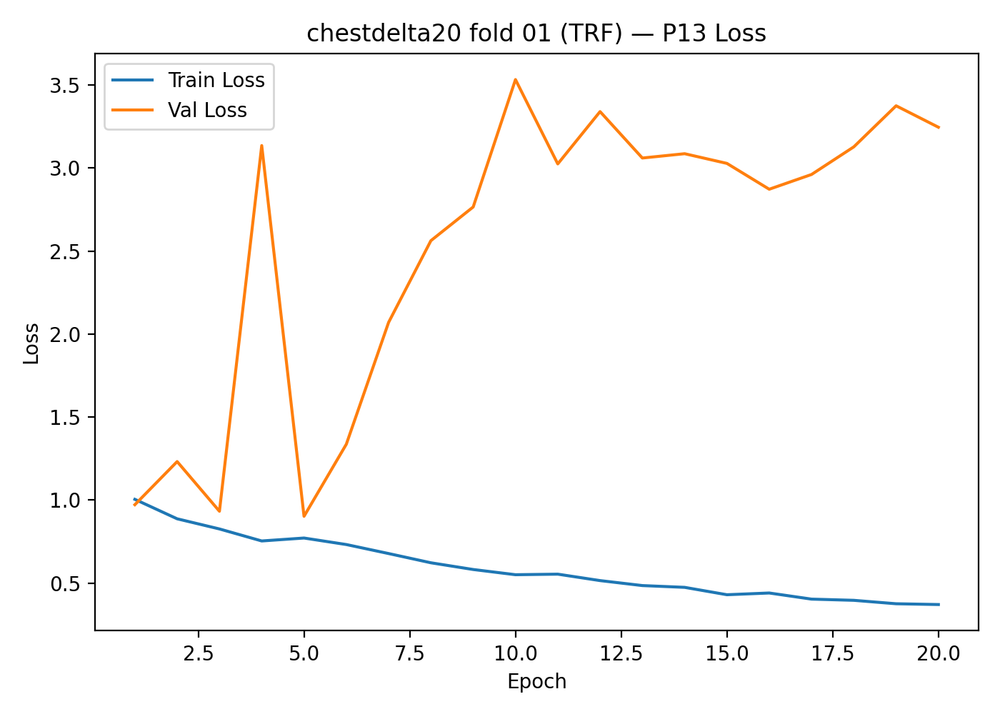

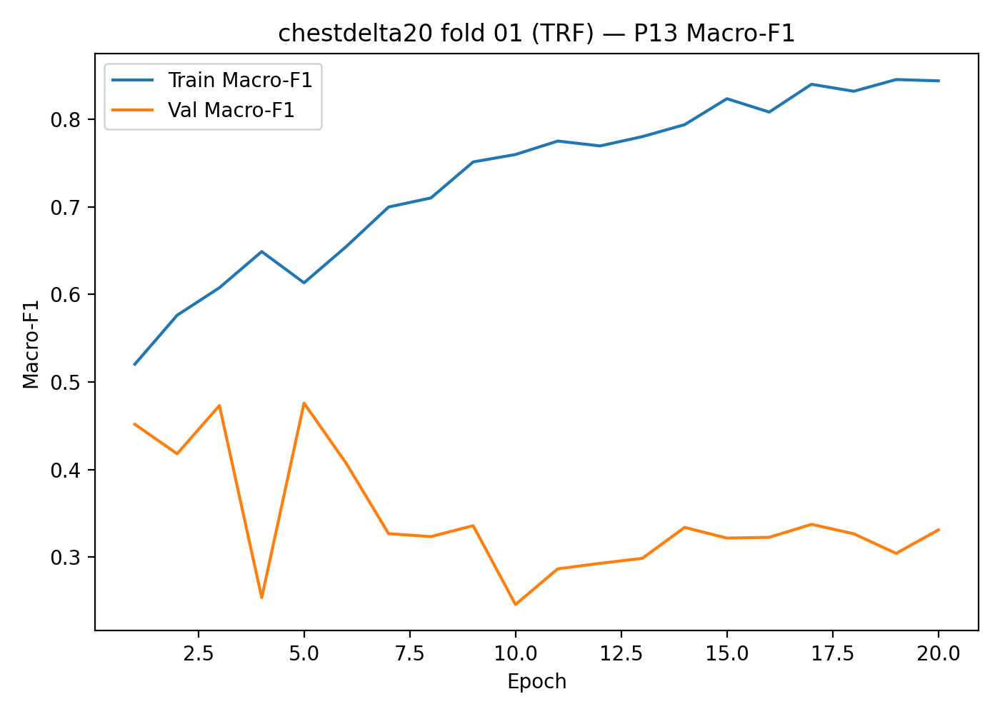

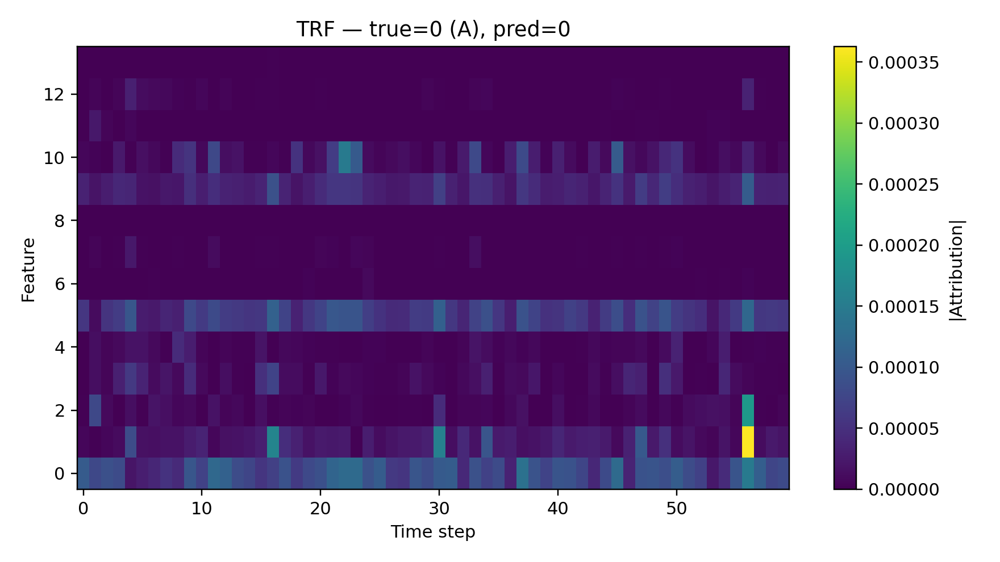

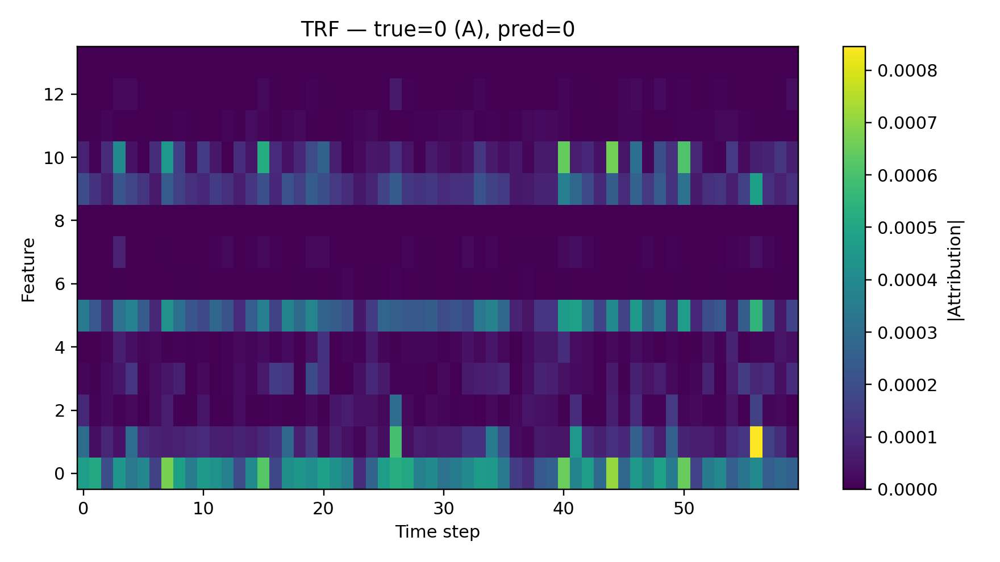

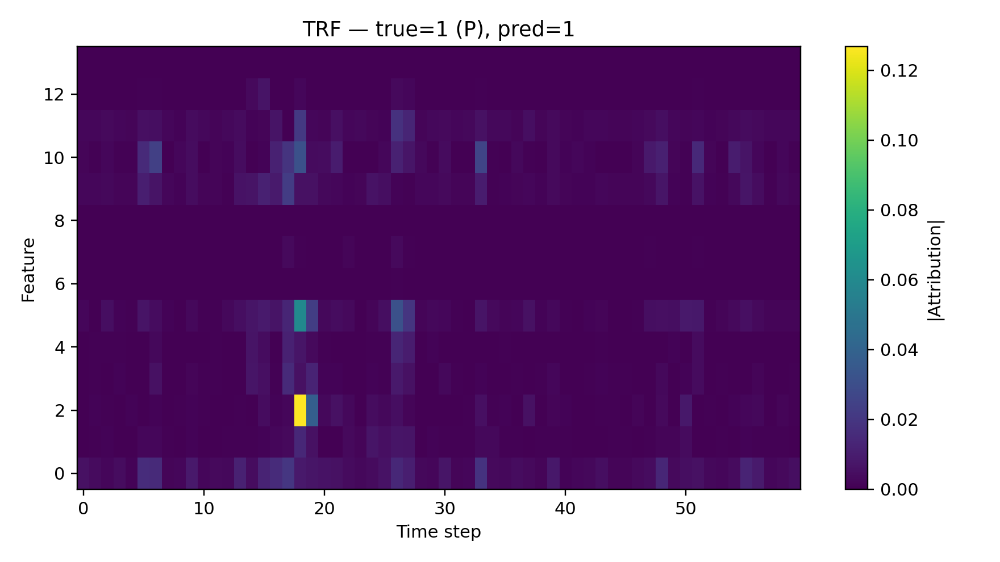

In [ ]:
# === Transformer (chestdelta20) — show/recreate first model plots ===
import os, glob, json, re
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
from IPython.display import display, Image

# --- your saved paths ---
MODELS_DIR = "/content/drive/MyDrive/colab_checkpoints/wesad/models/chestdelta20_phases_trf"
EVAL_DIR   = "/content/drive/MyDrive/colab_checkpoints/wesad/eval/chestdelta20_phases_trf"
WIN_DIR    = "/content/drive/MyDrive/colab_checkpoints/wesad/features/windows/chestdelta20"  # not required for plots here

assert os.path.isdir(MODELS_DIR), f"Models dir not found: {MODELS_DIR}"
assert os.path.isdir(EVAL_DIR),   f"Eval dir not found:   {EVAL_DIR}"

# --- helpers ---
def list_folds(models_dir=MODELS_DIR):
    folds = sorted([d for d in os.listdir(models_dir) if d.startswith("fold_") and os.path.isdir(os.path.join(models_dir, d))])
    if not folds: raise FileNotFoundError("No fold_* directories in models dir.")
    return folds

def show_saved_p13_p14(fold, eval_dir=EVAL_DIR, show_p14_n=3):
    """Show saved P13 loss/F1 and a few P14 heatmaps if present."""
    fold_eval = os.path.join(eval_dir, fold)
    loss_png = os.path.join(fold_eval, "P13_trf_phase_loss.png")
    f1_png   = os.path.join(fold_eval, "P13_trf_phase_f1.png")
    shown = False
    if os.path.exists(loss_png):
        display(Image(filename=loss_png)); shown=True
    if os.path.exists(f1_png):
        display(Image(filename=f1_png)); shown=True
    p14_dir = os.path.join(fold_eval, "P14_trf_phase_heatmaps")
    if os.path.isdir(p14_dir):
        imgs = sorted([os.path.join(p14_dir, f) for f in os.listdir(p14_dir) if f.endswith(".png")])
        for img in imgs[:show_p14_n]:
            display(Image(filename=img)); shown=True
    return shown

def recreate_p13_from_csv(fold, eval_dir=EVAL_DIR):
    """Recreate P13 loss/F1 plots from the training log CSV."""
    import pandas as pd
    fold_eval = os.path.join(eval_dir, fold)
    csv_path = os.path.join(fold_eval, "trf_phase_training.csv")
    if not os.path.exists(csv_path):
        return False
    df = pd.read_csv(csv_path)

    # Loss
    plt.figure(figsize=(7,5))
    plt.plot(df["epoch"], df["train_loss"], label="Train Loss")
    plt.plot(df["epoch"], df["val_loss"], label="Val Loss")
    plt.xlabel("Epoch"); plt.ylabel("Loss"); plt.title(f"{fold} — P13 Loss"); plt.legend()
    out_loss = os.path.join(fold_eval, "P13_trf_phase_loss_recreated.png")
    plt.tight_layout(); plt.savefig(out_loss, dpi=200); plt.close()
    display(Image(filename=out_loss))

    # Macro-F1
    plt.figure(figsize=(7,5))
    plt.plot(df["epoch"], df["train_f1"], label="Train Macro-F1")
    plt.plot(df["epoch"], df["val_f1"], label="Val Macro-F1")
    plt.xlabel("Epoch"); plt.ylabel("Macro-F1"); plt.title(f"{fold} — P13 Macro-F1"); plt.legend()
    out_f1 = os.path.join(fold_eval, "P13_trf_phase_f1_recreated.png")
    plt.tight_layout(); plt.savefig(out_f1, dpi=200); plt.close()
    display(Image(filename=out_f1))
    return True

# --- fallback: plots from checkpoint only (no CSV needed) ---
import torch
import torch.nn as nn
def load_state(ckpt_path):
    state = torch.load(ckpt_path, map_location="cpu")
    if isinstance(state, dict) and "state_dict" in state and isinstance(state["state_dict"], dict):
        state = state["state_dict"]
    return state

def plot_pos_embed(state, out_png, title):
    pe = state["pos_embed"].squeeze(0).numpy()    # [L, D]
    plt.figure(figsize=(8,4.2))
    plt.imshow(pe.T, aspect="auto", origin="lower")
    plt.colorbar(label="value")
    plt.xlabel("Position index"); plt.ylabel("Embedding dim")
    plt.title(f"{title} — Positional Embedding")
    plt.tight_layout(); plt.savefig(out_png, dpi=180); plt.close()
    display(Image(filename=out_png))

def plot_weight_norm_profile(state, out_png, title):
    import numpy as np
    lids = sorted({int(k.split(".")[2]) for k in state.keys() if k.startswith("encoder.layers.")})
    norms_attn, norms_out, norms_ff1, norms_ff2 = [], [], [], []
    for lid in lids:
        in_proj = state.get(f"encoder.layers.{lid}.self_attn.in_proj_weight")
        out_proj= state.get(f"encoder.layers.{lid}.self_attn.out_proj.weight")
        ff1     = state.get(f"encoder.layers.{lid}.linear1.weight")
        ff2     = state.get(f"encoder.layers.{lid}.linear2.weight")
        norms_attn.append(0.0 if in_proj is None else torch.norm(in_proj).item())
        norms_out.append( 0.0 if out_proj is None else torch.norm(out_proj).item())
        norms_ff1.append( 0.0 if ff1 is None else torch.norm(ff1).item())
        norms_ff2.append( 0.0 if ff2 is None else torch.norm(ff2).item())
    x = np.arange(len(lids))
    plt.figure(figsize=(8,4.2))
    plt.plot(x, norms_attn, marker="o", label="MHA in_proj ‖W‖")
    plt.plot(x, norms_out,  marker="o", label="MHA out_proj ‖W‖")
    plt.plot(x, norms_ff1,  marker="s", label="FFN linear1 ‖W‖")
    plt.plot(x, norms_ff2,  marker="s", label="FFN linear2 ‖W‖")
    plt.xticks(x, [f"L{lid}" for lid in lids])
    plt.xlabel("Encoder layer"); plt.ylabel("L2 norm")
    plt.title(f"{title} — Weight Norm Profile")
    plt.legend(); plt.tight_layout(); plt.savefig(out_png, dpi=180); plt.close()
    display(Image(filename=out_png))

def plot_head_weights(state, out_png, title):
    key = "head.1.weight"
    if key not in state:
        # try any head weight
        candidates = [k for k in state.keys() if k.startswith("head") and k.endswith("weight") and state[k].ndim==2]
        if not candidates: return False
        key = candidates[0]
    W = state[key].numpy()
    plt.figure(figsize=(8,3.8))
    plt.imshow(W, aspect="auto", origin="lower")
    plt.colorbar(label="weight")
    yticks = ["A","P","R"][:W.shape[0]]
    plt.yticks(range(W.shape[0]), yticks)
    plt.xlabel("Embedding dim"); plt.ylabel("Class")
    plt.title(f"{title} — Classifier Weights")
    plt.tight_layout(); plt.savefig(out_png, dpi=180); plt.close()
    display(Image(filename=out_png))
    return True

def recreate_from_checkpoint(fold, models_dir=MODELS_DIR, eval_dir=EVAL_DIR):
    ckpt = os.path.join(models_dir, fold, "transformer.pt")
    if not os.path.exists(ckpt): return False
    state = load_state(ckpt)
    out_dir = os.path.join(eval_dir, fold, "recreated_plots")
    os.makedirs(out_dir, exist_ok=True)
    title = f"{fold}"
    plot_pos_embed(state, os.path.join(out_dir, "PE_heatmap.png"), title)
    plot_weight_norm_profile(state, os.path.join(out_dir, "WeightNorm_profile.png"), title)
    plot_head_weights(state, os.path.join(out_dir, "Head_weights.png"), title)
    return True

# --- do it for the first fold ---
folds = list_folds()
first_fold = folds[0]
print(f"[using] first fold = {first_fold}")

shown = show_saved_p13_p14(first_fold)  # show if present
if not shown:
    # try to recreate from CSV
    recreated = recreate_p13_from_csv(first_fold)
    if not recreated:
        # fallback: make plots from checkpoint only
        print("[i] No P13/P14/CSV found — creating checkpoint-based plots.")
        ok = recreate_from_checkpoint(first_fold)
        if not ok:
            print("[!] Could not find checkpoint either.")


model2

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
[eval dir] /content/drive/MyDrive/colab_checkpoints/wesad/eval/chestdelta20_phases_trf_plus_safe
   fold test_subject       acc  f1_macro
0     1          S10  0.171053  0.192156
1     2          S11  0.709091  0.660236
2     3          S13  0.853333  0.790631
3     4          S14  0.854545  0.850160
4     5          S15  0.521127  0.431716

Mean Accuracy: 0.7205
Mean Macro-F1: 0.6894


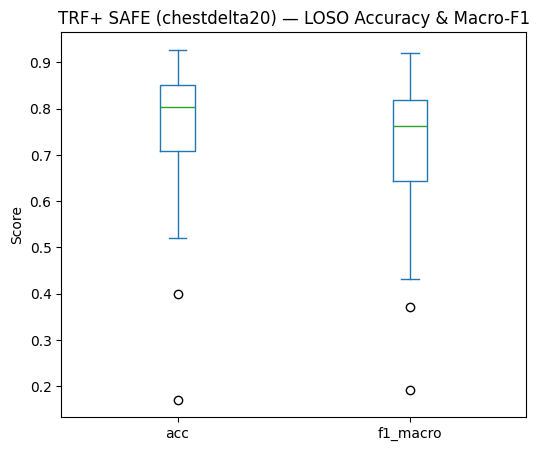

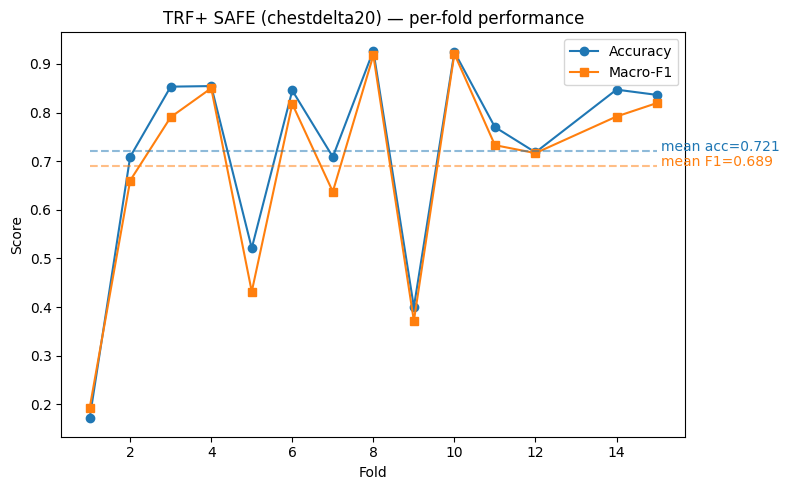

[showing P13 for] fold_01


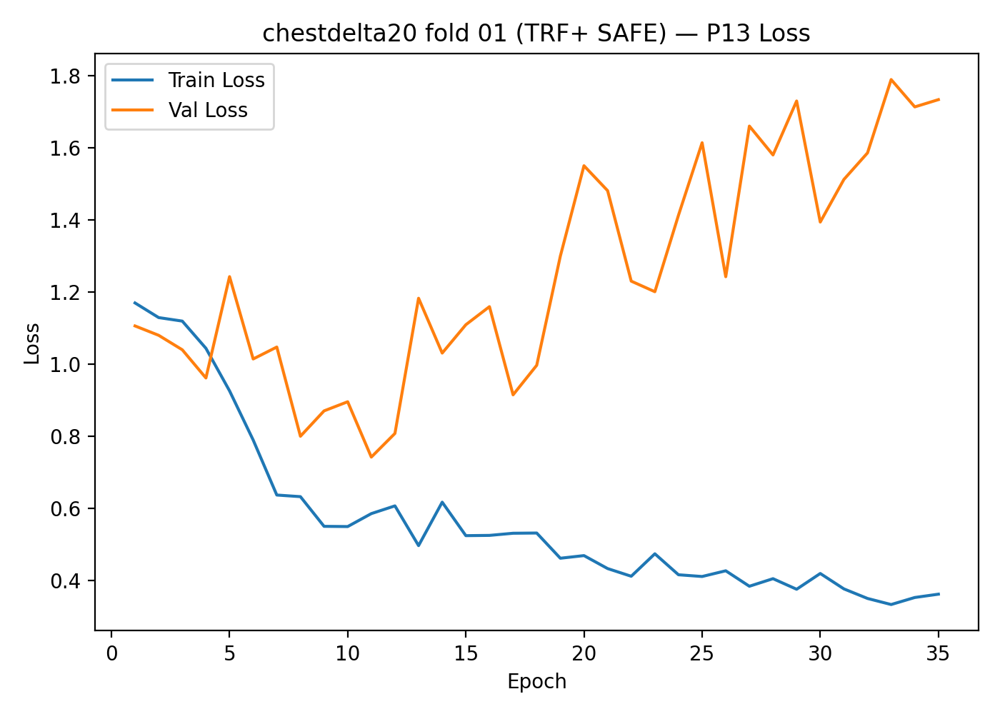

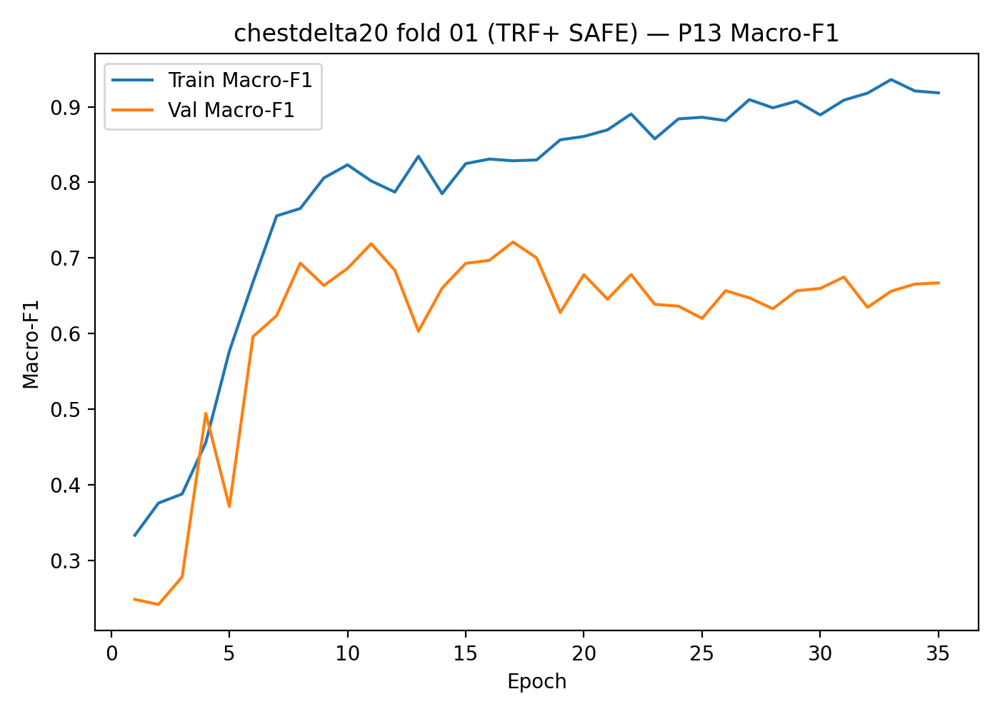

In [ ]:
# === Plots for Transformer+ SAFE (CHEST delta20 APR) ===
# Looks for: /.../eval/chestdelta20_phases_trf_plus_safe or "chest∆20_phases_trf_plus_safe"
# Summary CSV expected: trf_plus_safe_phase_loso_summary.csv

from google.colab import drive
drive.mount('/content/drive')

import os, glob
from pathlib import Path
import pandas as pd
import matplotlib.pyplot as plt
from IPython.display import display, Image

# ---------- locate eval dir in your saved checkpoint root ----------
ROOT = "/content/drive/MyDrive/colab_checkpoints/wesad/eval"
candidates = []
candidates += glob.glob(os.path.join(ROOT, "chestdelta20_phases_trf_plus_safe"))
candidates += glob.glob(os.path.join(ROOT, "chest∆20_phases_trf_plus_safe"))  # in case you used the delta symbol

# fallback: scan deeper
if not candidates:
    candidates = glob.glob(os.path.join(ROOT, "**", "*trf_plus_safe*"), recursive=True)

if not candidates:
    raise FileNotFoundError(f"No TRF+ SAFE eval directory found under: {ROOT}")

EVAL_DIR = sorted(set([c for c in candidates if os.path.isdir(c)]))[0]
print("[eval dir]", EVAL_DIR)

summary_csv = os.path.join(EVAL_DIR, "trf_plus_safe_phase_loso_summary.csv")
perclass_csv = os.path.join(EVAL_DIR, "trf_plus_safe_phase_loso_perclass_f1.csv")
if not os.path.exists(summary_csv):
    raise FileNotFoundError(f"Summary CSV not found: {summary_csv}")

# ---------- load & report means ----------
df = pd.read_csv(summary_csv)
print(df.head())

mean_acc = df["acc"].mean()
mean_f1  = df["f1_macro"].mean()
print(f"\nMean Accuracy: {mean_acc:.4f}")
print(f"Mean Macro-F1: {mean_f1:.4f}")

# ---------- plot: boxplot of Acc & Macro-F1 ----------
ax = df[["acc","f1_macro"]].plot(kind="box", figsize=(6,5))
ax.set_title("TRF+ SAFE (chestdelta20) — LOSO Accuracy & Macro-F1")
ax.set_ylabel("Score")
plt.show()

# ---------- plot: per-fold lines ----------
plt.figure(figsize=(8,5))
plt.plot(df["fold"], df["acc"], marker="o", label="Accuracy")
plt.plot(df["fold"], df["f1_macro"], marker="s", label="Macro-F1")
plt.hlines([mean_acc, mean_f1], xmin=df["fold"].min(), xmax=df["fold"].max(),
           linestyles="dashed", colors=["C0","C1"], alpha=0.5)
plt.text(df["fold"].max()+0.1, mean_acc, f"mean acc={mean_acc:.3f}", color="C0")
plt.text(df["fold"].max()+0.1, mean_f1,  f"mean F1={mean_f1:.3f}",  color="C1")
plt.xlabel("Fold"); plt.ylabel("Score")
plt.title("TRF+ SAFE (chestdelta20) — per-fold performance")
plt.legend(); plt.tight_layout(); plt.show()

# ---------- show saved P13 for the first fold (or recreate from CSV) ----------
def show_or_recreate_p13_for_fold(eval_dir, fold_name):
    fold_dir = os.path.join(eval_dir, fold_name)
    loss_png = os.path.join(fold_dir, "P13_trf_plus_safe_phase_loss.png")
    f1_png   = os.path.join(fold_dir, "P13_trf_plus_safe_phase_f1.png")
    shown = False
    if os.path.exists(loss_png):
        display(Image(filename=loss_png)); shown=True
    if os.path.exists(f1_png):
        display(Image(filename=f1_png)); shown=True
    if shown:
        return

    # try recreate from CSV
    csv_path = os.path.join(fold_dir, "trf_plus_safe_phase_training.csv")
    if not os.path.exists(csv_path):
        print(f"[i] P13 images and training CSV missing for {fold_name}.")
        return
    dfl = pd.read_csv(csv_path)
    plt.figure(figsize=(7,5))
    plt.plot(dfl["epoch"], dfl["train_loss"], label="Train Loss")
    plt.plot(dfl["epoch"], dfl["val_loss"], label="Val Loss")
    plt.xlabel("Epoch"); plt.ylabel("Loss"); plt.title(f"{fold_name} — P13 Loss"); plt.legend()
    out_loss = os.path.join(fold_dir, "P13_trf_plus_safe_phase_loss_recreated.png")
    plt.tight_layout(); plt.savefig(out_loss, dpi=200); plt.close()
    display(Image(filename=out_loss))

    plt.figure(figsize=(7,5))
    plt.plot(dfl["epoch"], dfl["train_f1"], label="Train Macro-F1")
    plt.plot(dfl["epoch"], dfl["val_f1"], label="Val Macro-F1")
    plt.xlabel("Epoch"); plt.ylabel("Macro-F1"); plt.title(f"{fold_name} — P13 Macro-F1"); plt.legend()
    out_f1 = os.path.join(fold_dir, "P13_trf_plus_safe_phase_f1_recreated.png")
    plt.tight_layout(); plt.savefig(out_f1, dpi=200); plt.close()
    display(Image(filename=out_f1))

# pick the first available fold under this eval dir
folds = sorted([d for d in os.listdir(EVAL_DIR) if d.startswith("fold_") and os.path.isdir(os.path.join(EVAL_DIR, d))])
if folds:
    print(f"[showing P13 for] {folds[0]}")
    show_or_recreate_p13_for_fold(EVAL_DIR, folds[0])
else:
    print("[i] no fold_* folders in eval dir (summary still plotted).")


model 3

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
[eval dir] /content/drive/MyDrive/colab_checkpoints/wesad/eval/chestdelta20_phases_trf_plus_safe_impr


,fold,test_subject,acc,f1_macro,raw_acc,raw_f1_macro
0,1,S10,0.131579,0.144670,0.131579,0.144670
1,2,S11,0.754545,0.737912,0.763636,0.747367
2,3,S13,0.840000,0.792409,0.826667,0.771998
3,4,S14,0.863636,0.841823,0.863636,0.844574
4,5,S15,0.436620,0.348843,0.450704,0.356537



Mean Accuracy:  0.7434
Mean Macro-F1:  0.7088


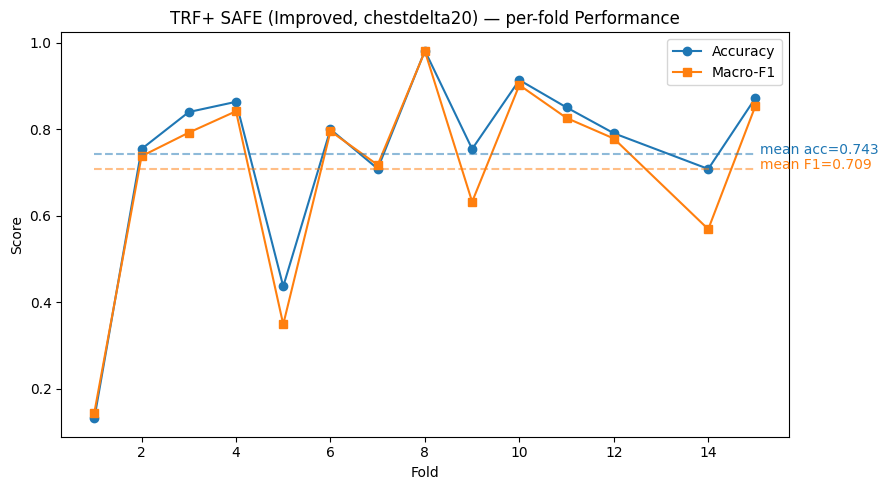

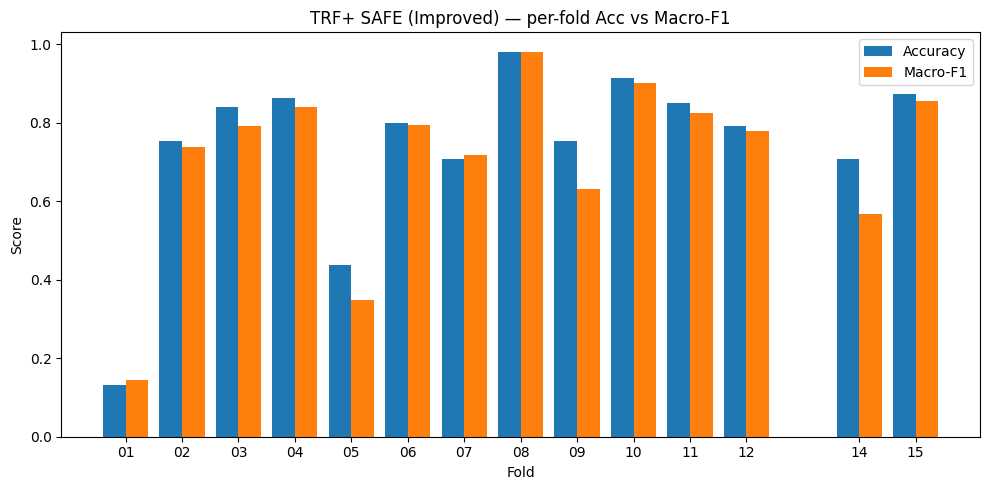

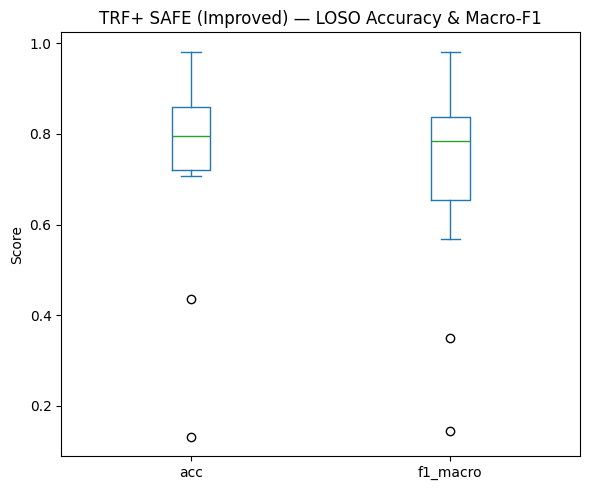

[i] Found 14 folds. Showing/recreating P13 curves for each.
[P13] fold_01 (saved images)


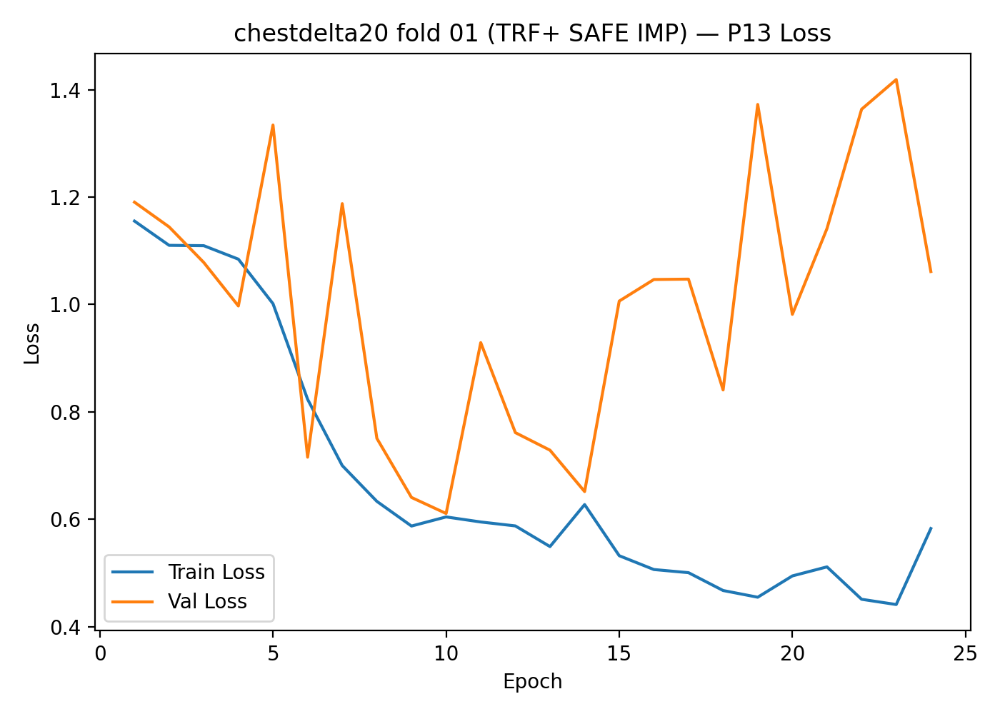

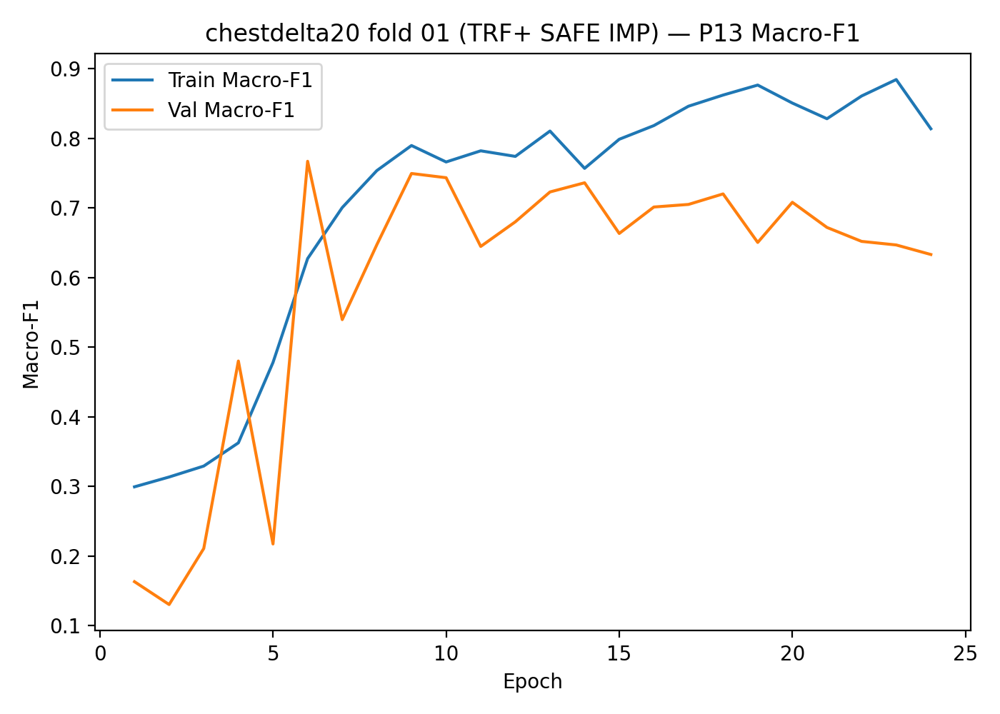

[P13] fold_02 (saved images)


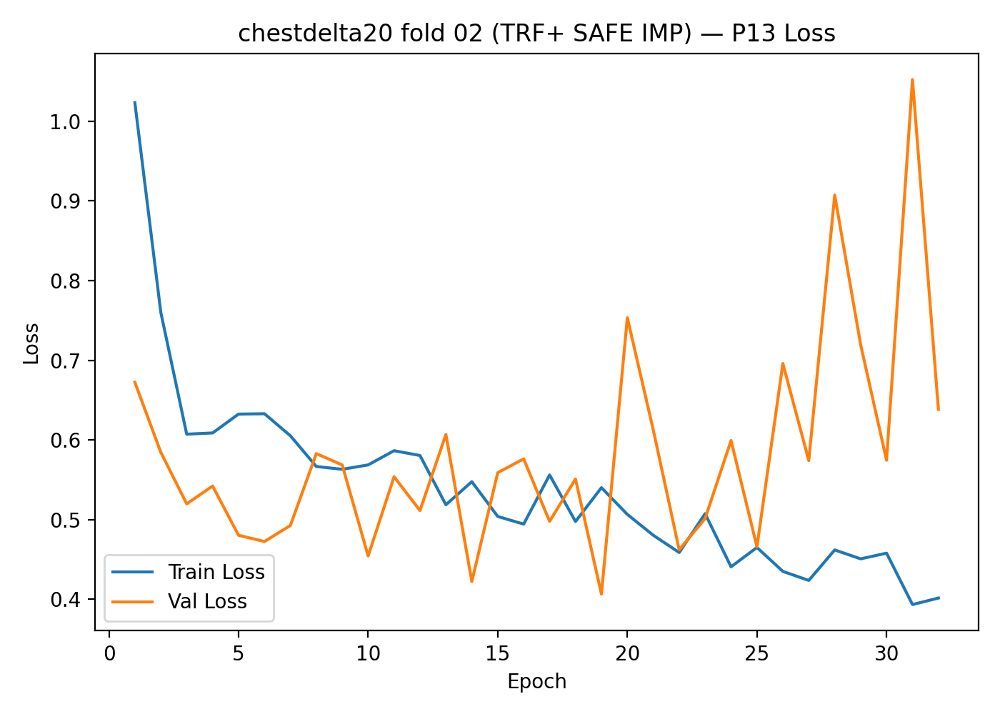

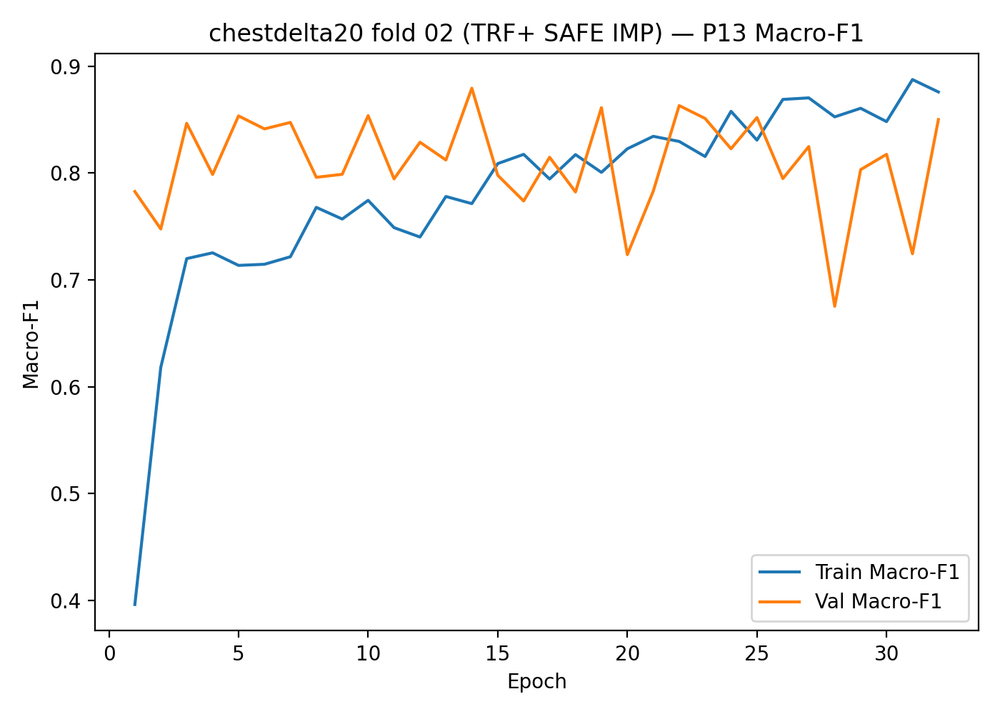

[P13] fold_03 (saved images)


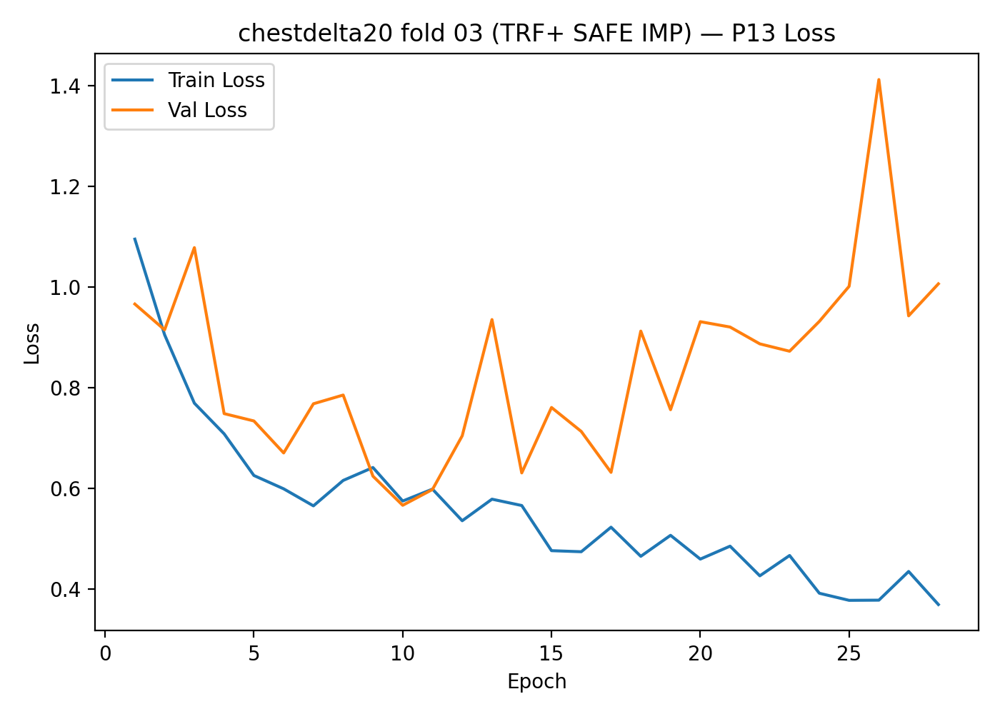

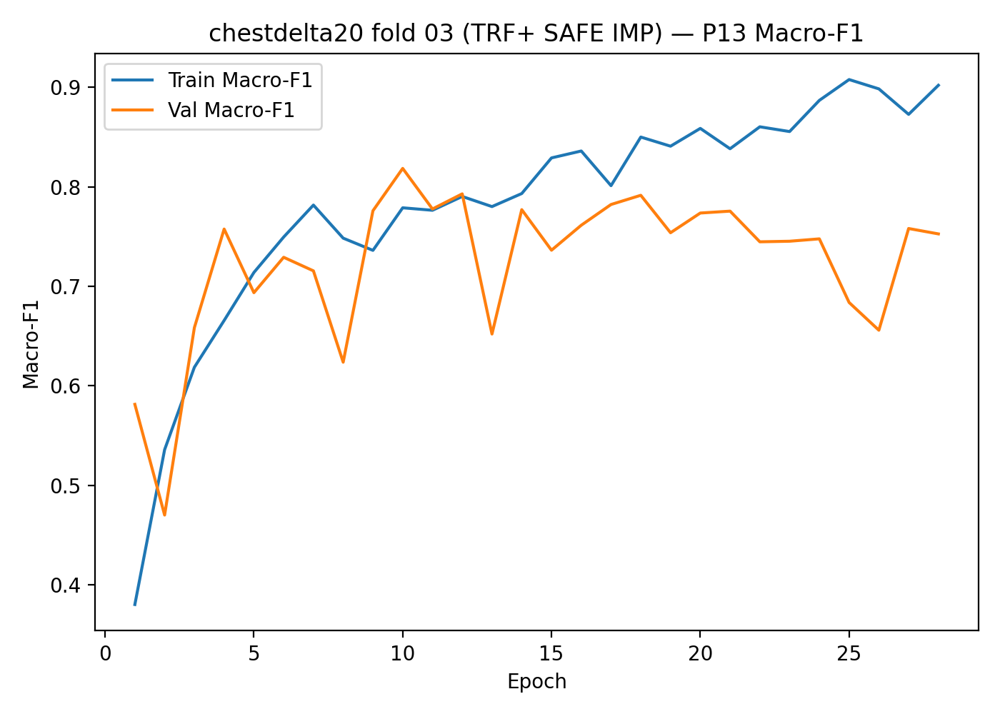

[P13] fold_04 (saved images)


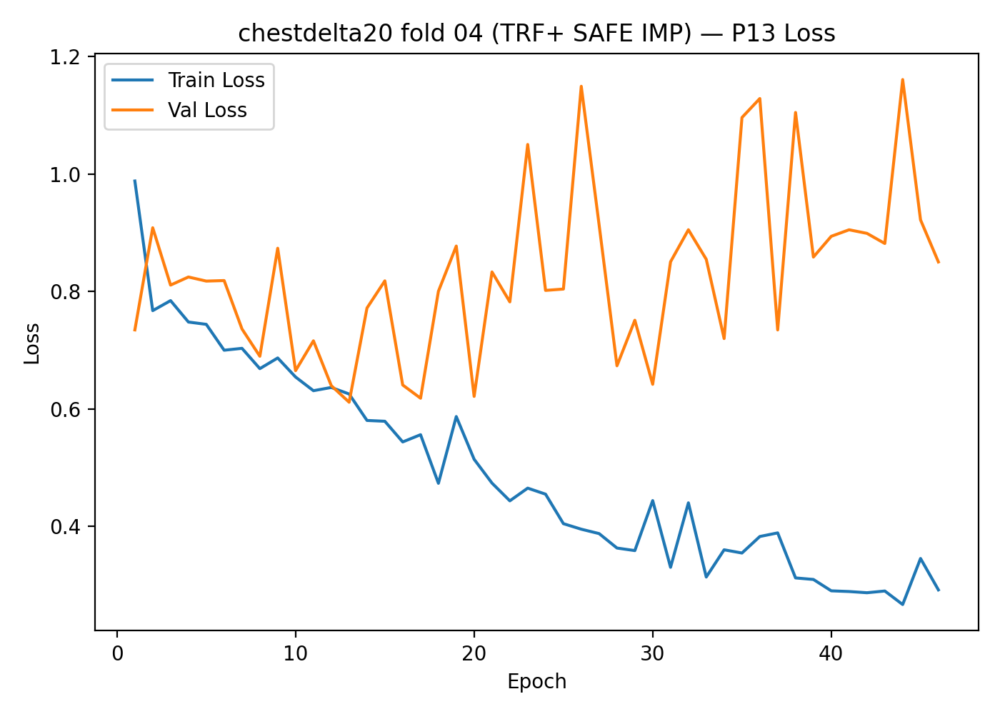

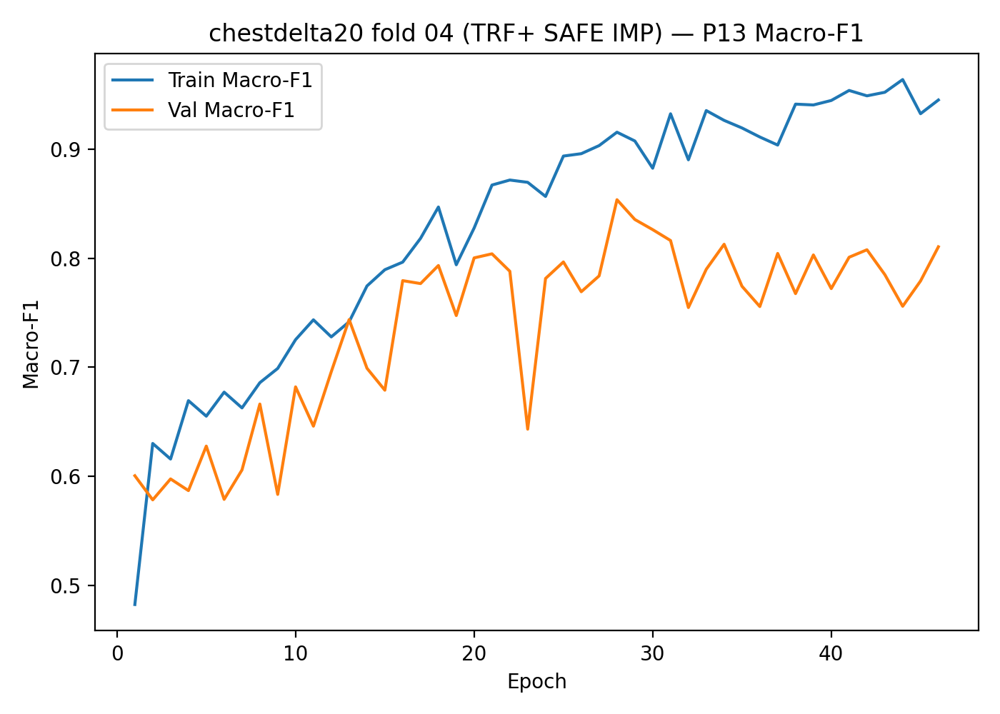

[P13] fold_05 (saved images)


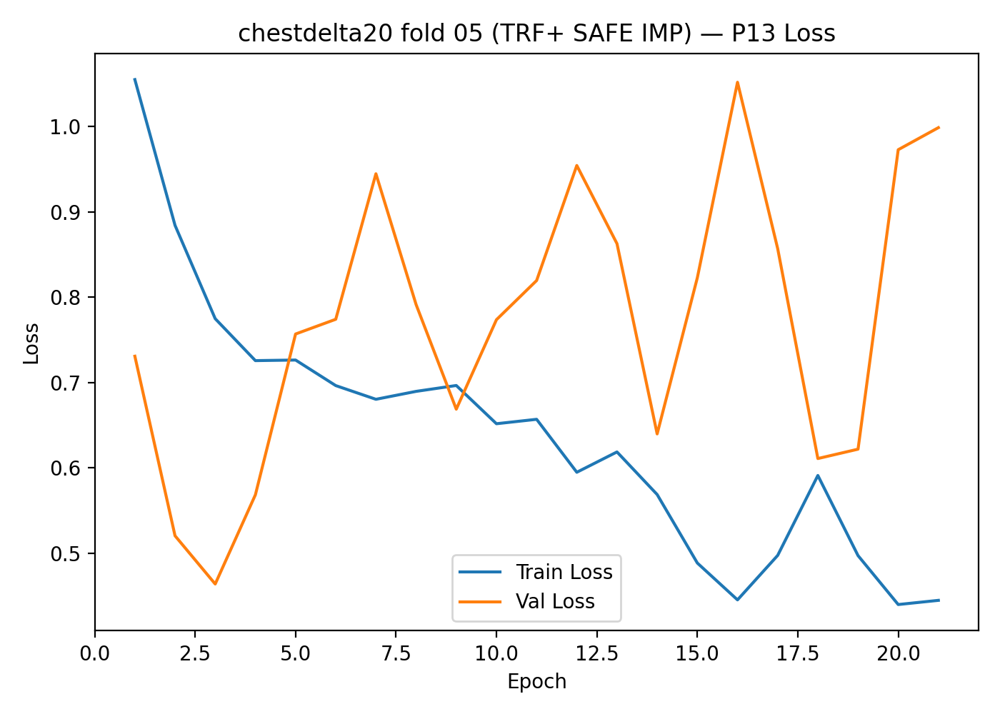

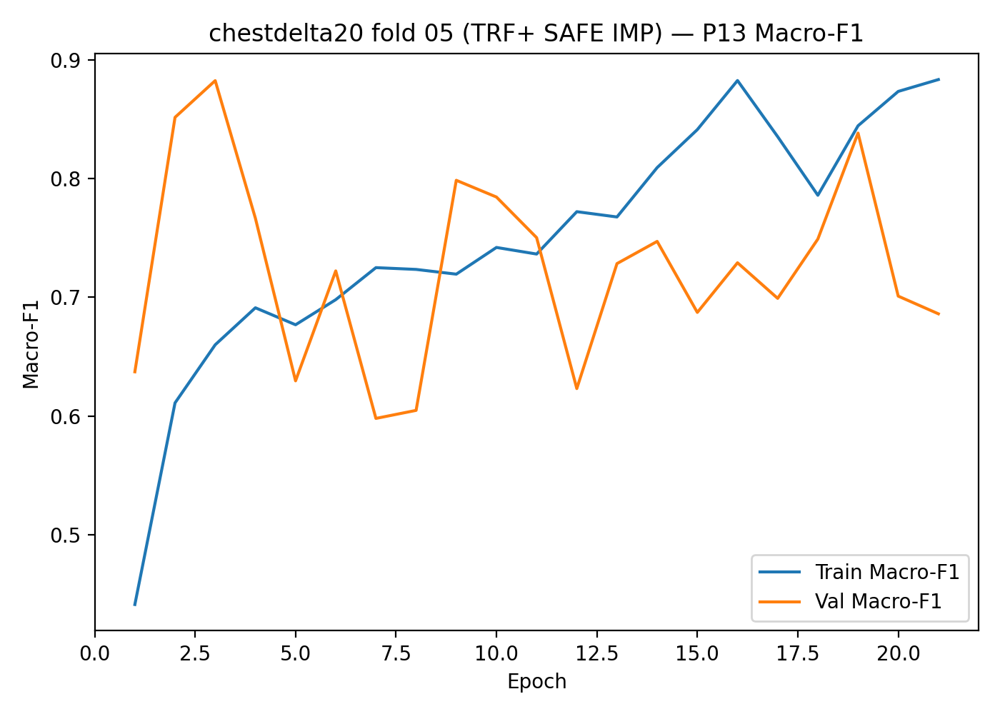

[P13] fold_06 (saved images)


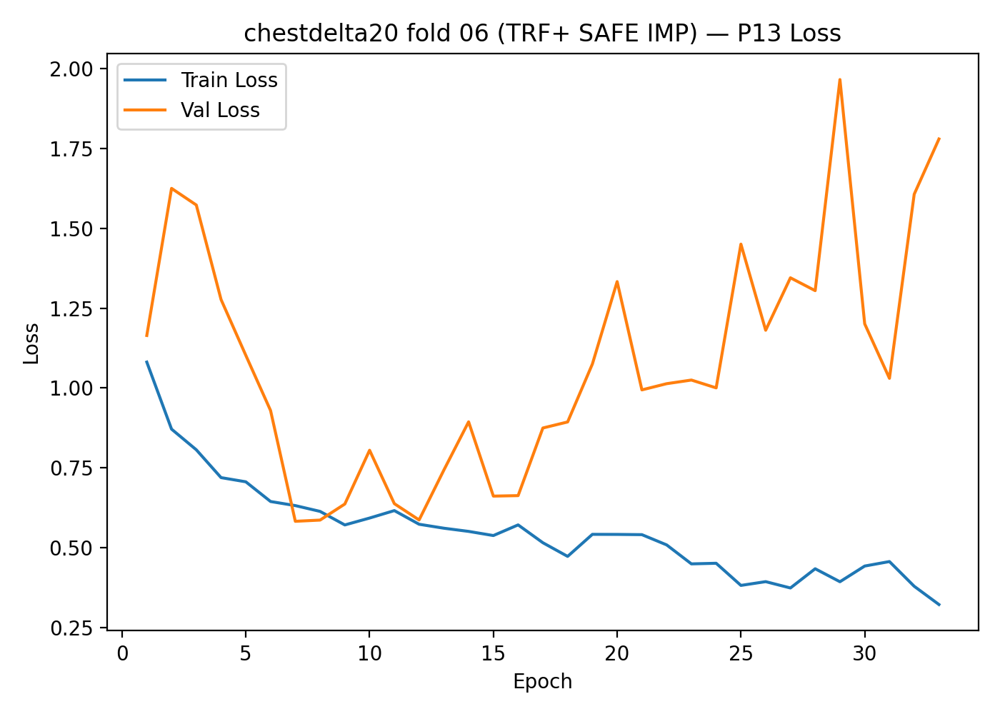

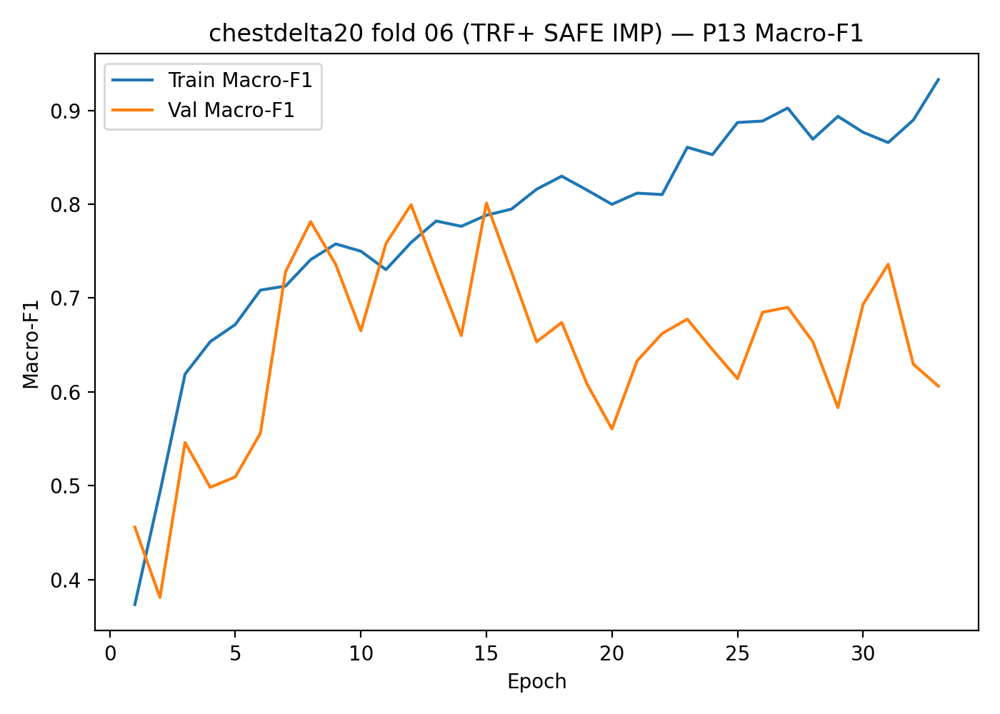

[P13] fold_07 (saved images)


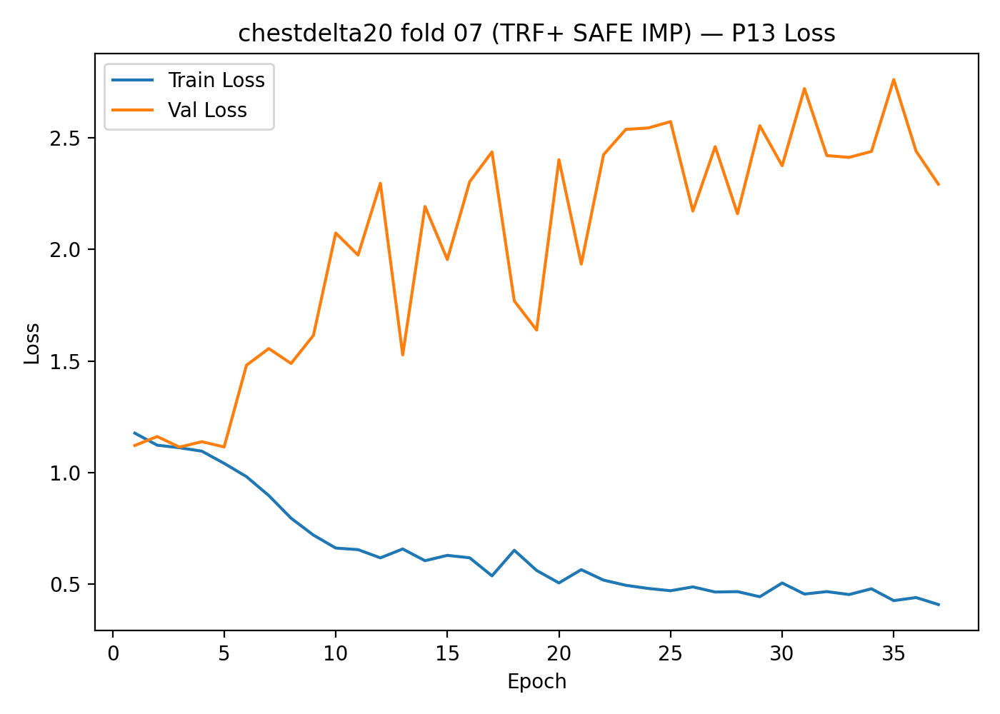

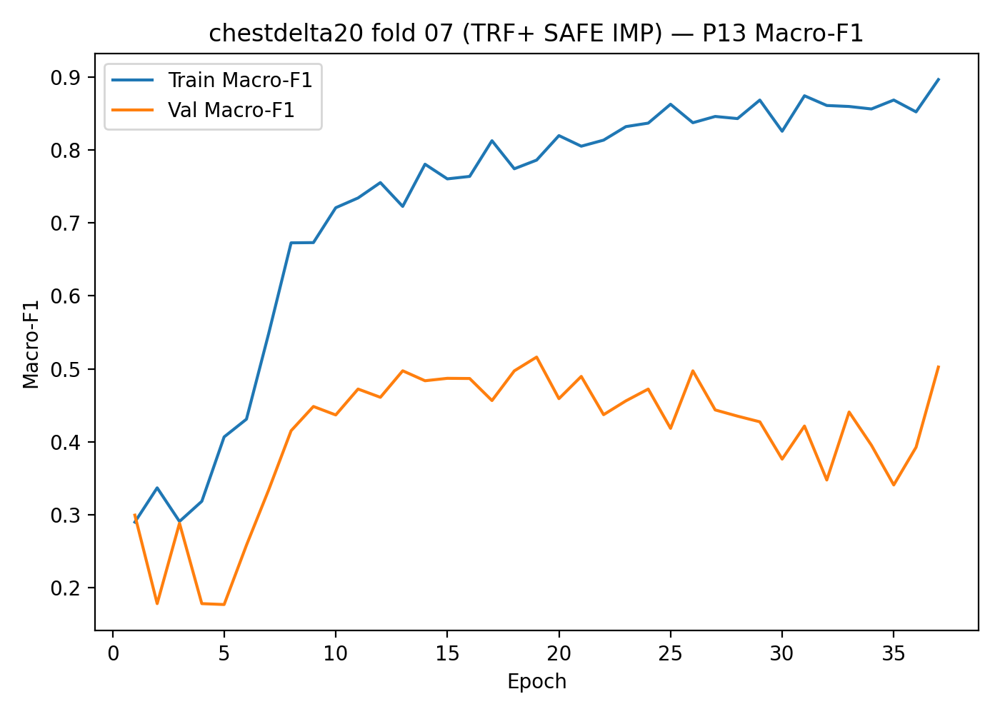

[P13] fold_08 (saved images)


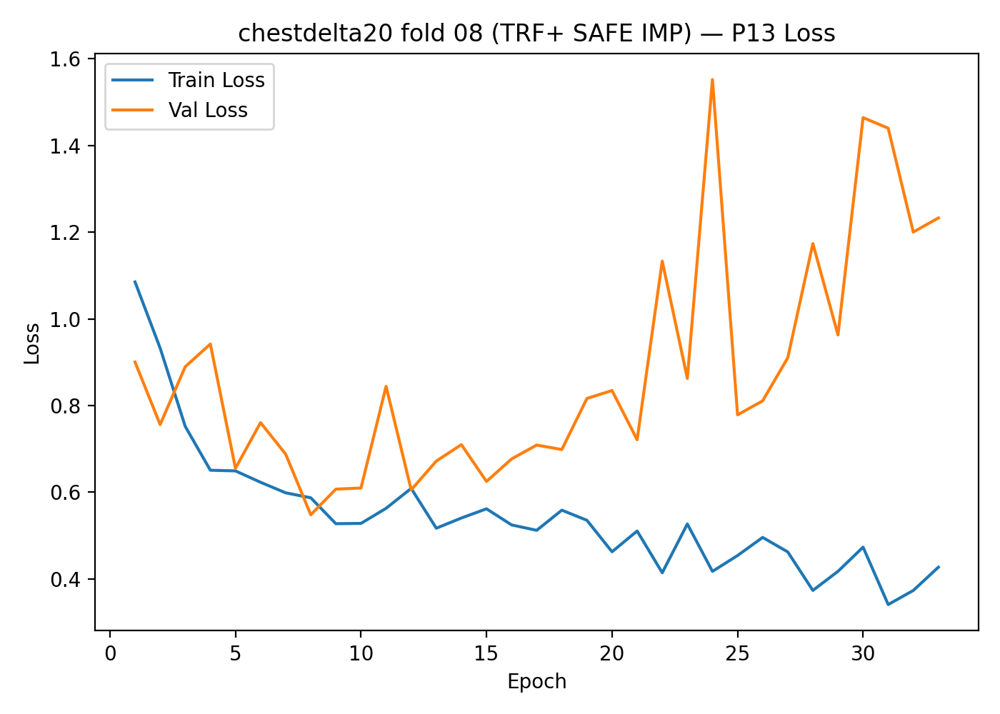

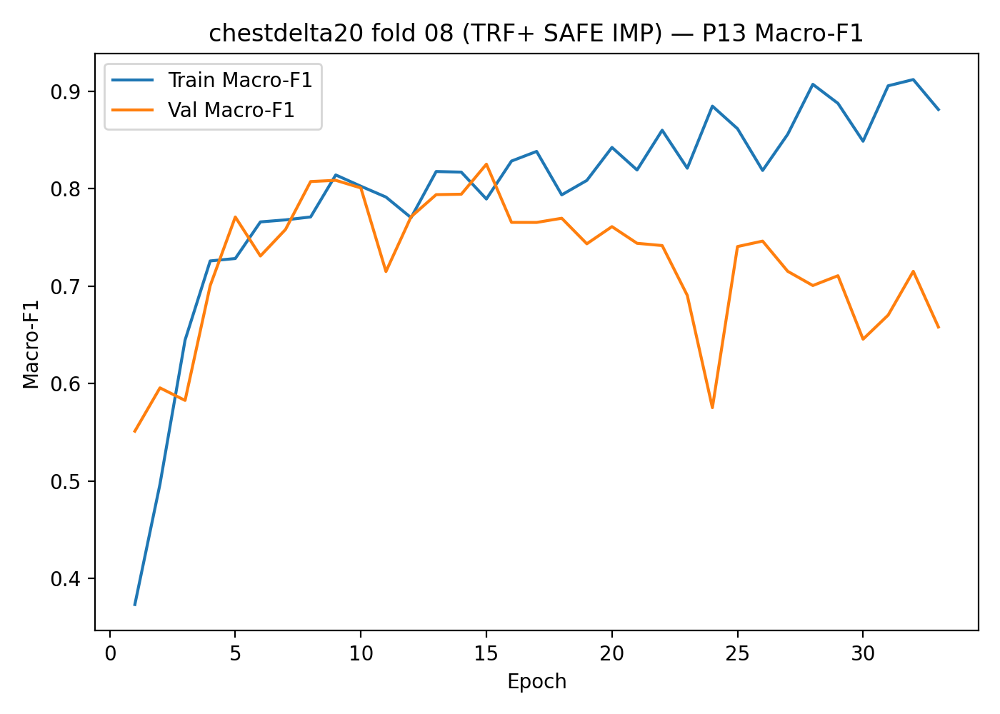

[P13] fold_09 (saved images)


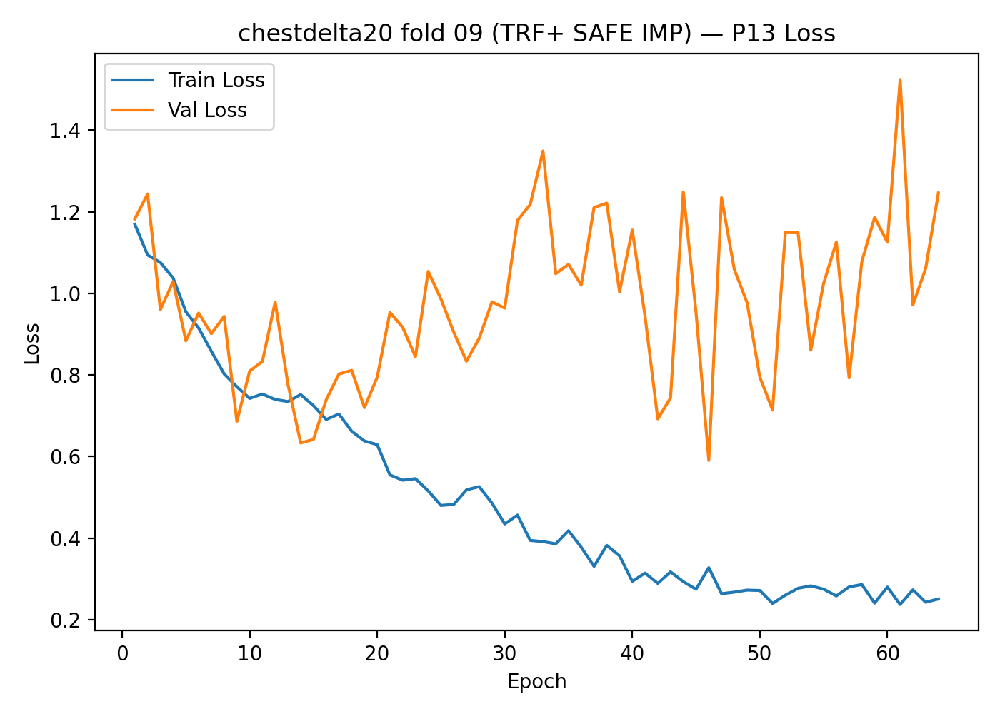

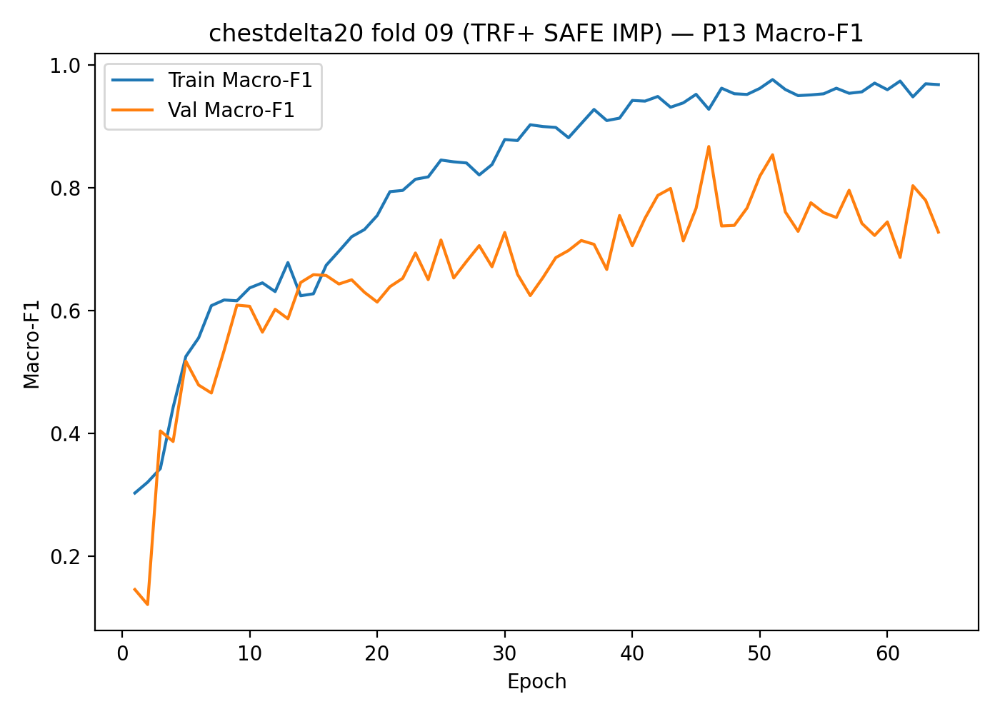

[P13] fold_10 (saved images)


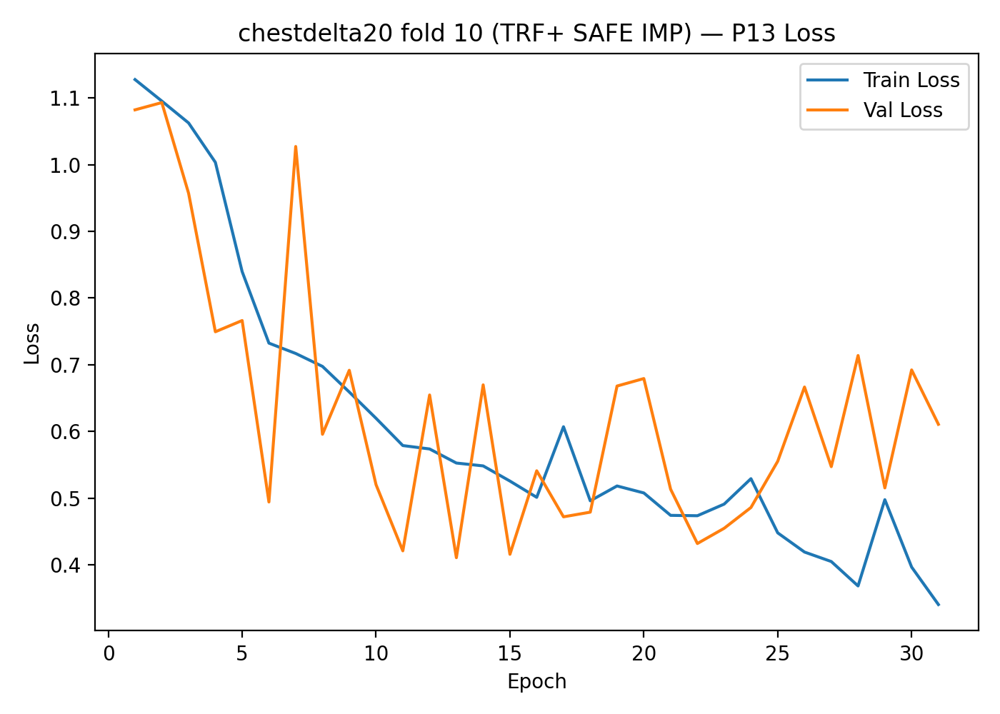

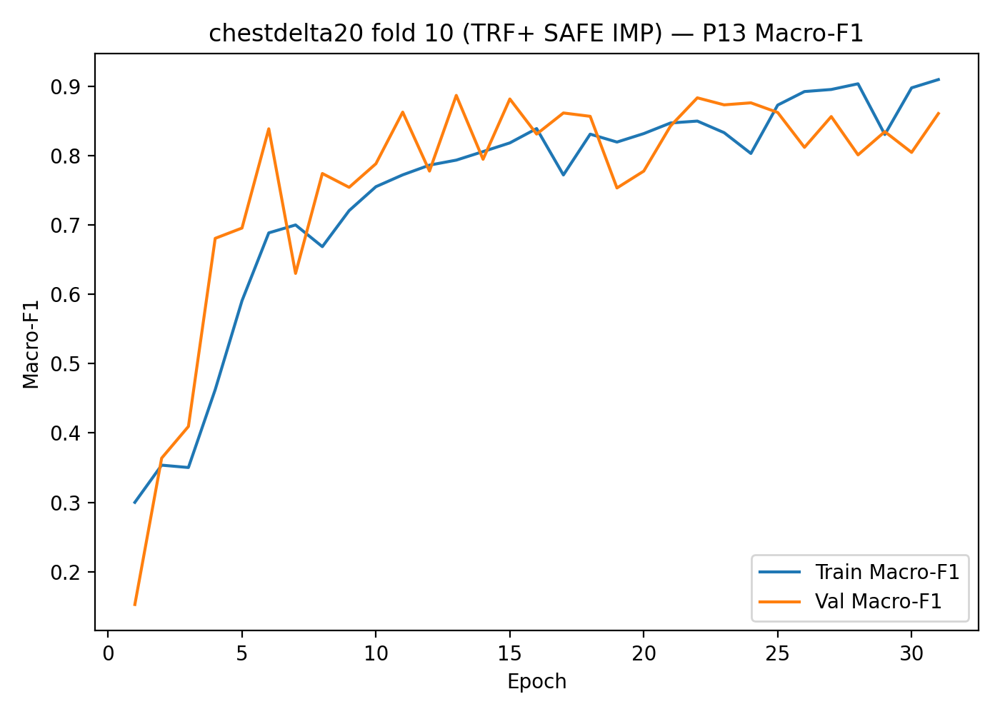

[P13] fold_11 (saved images)


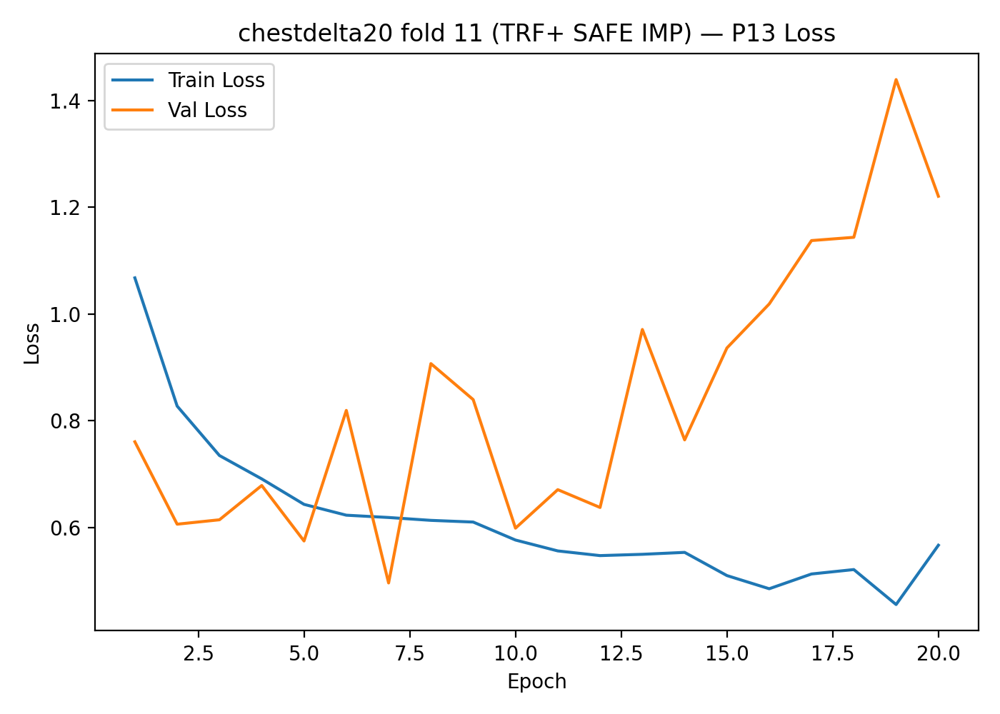

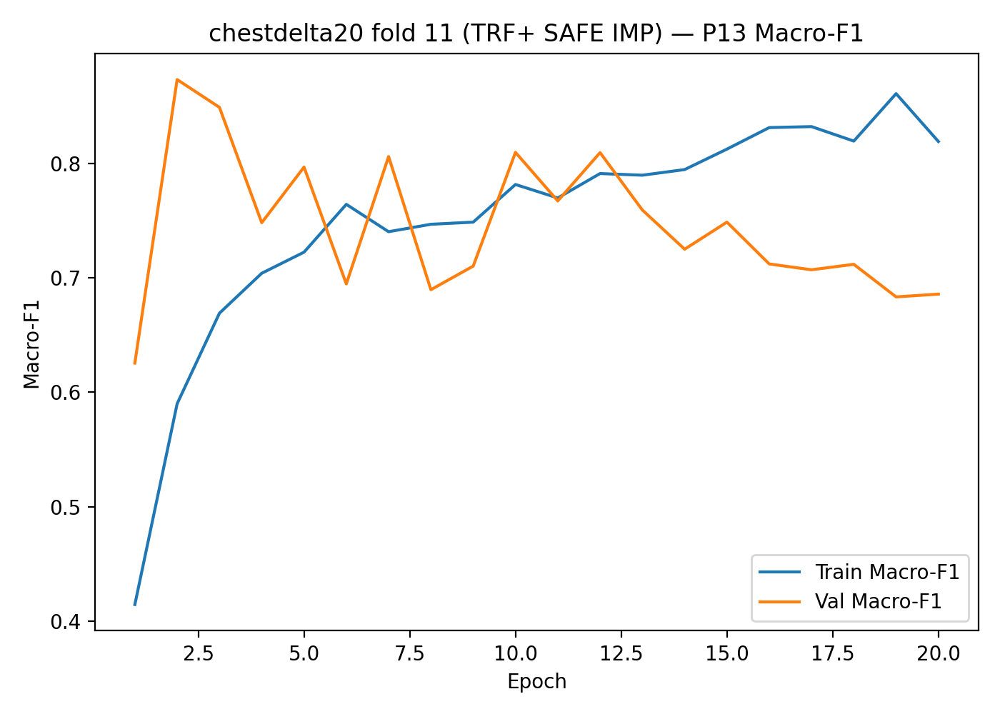

[P13] fold_12 (saved images)


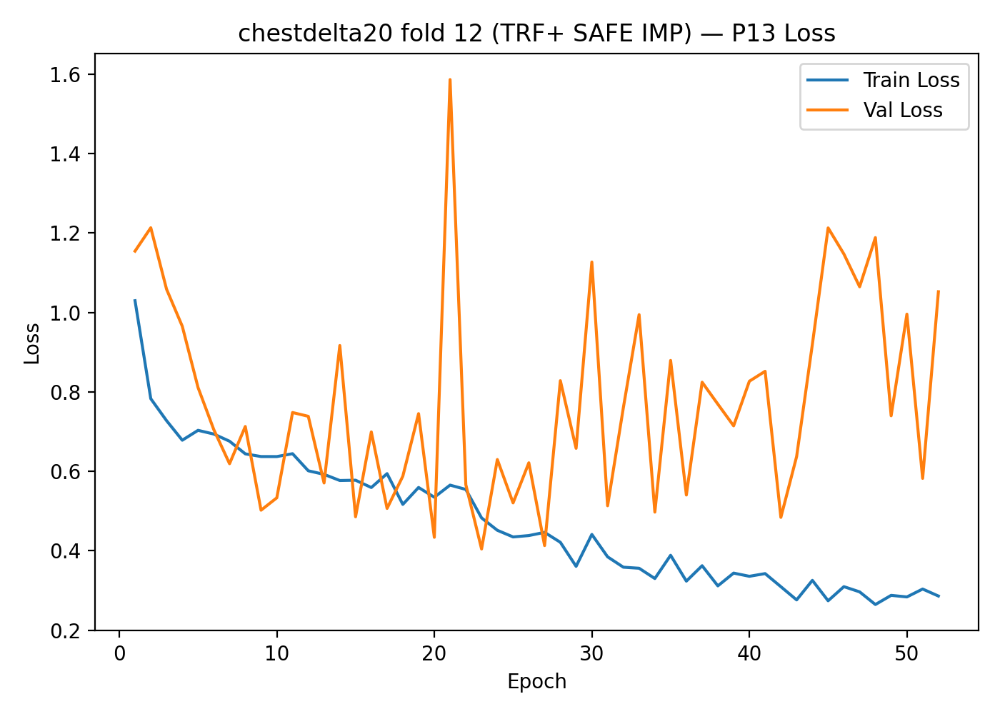

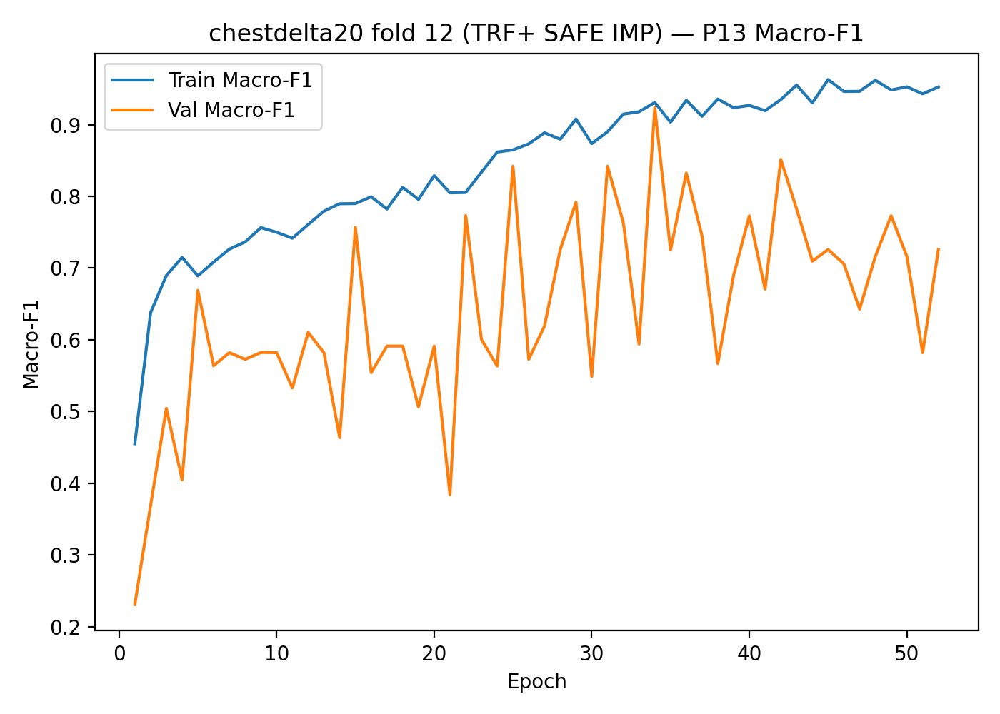

[P13] fold_14 (saved images)


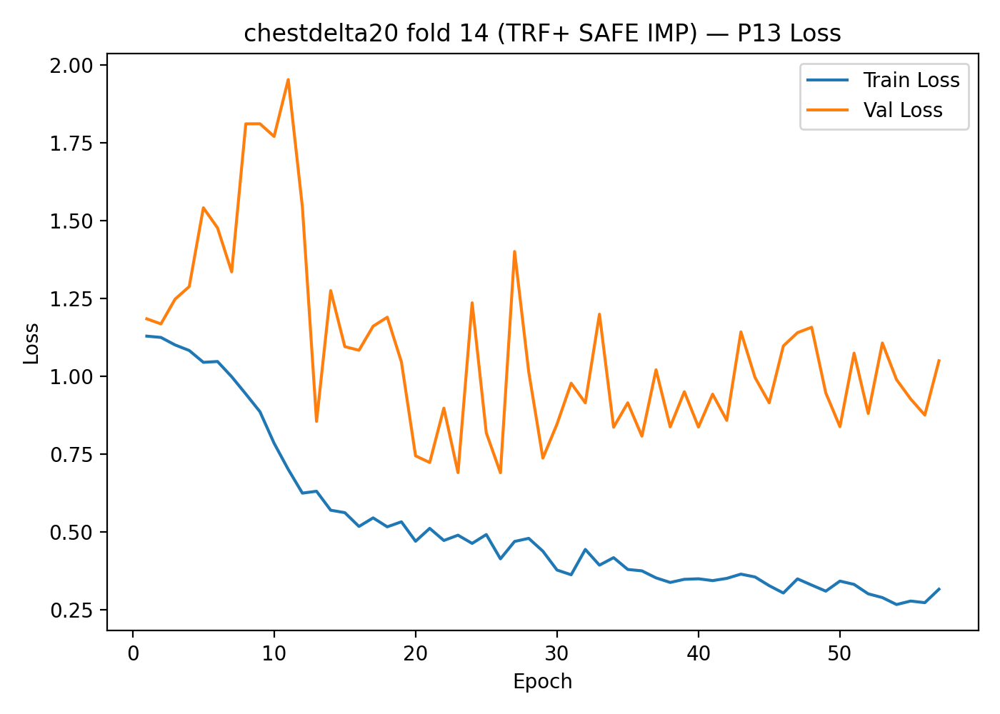

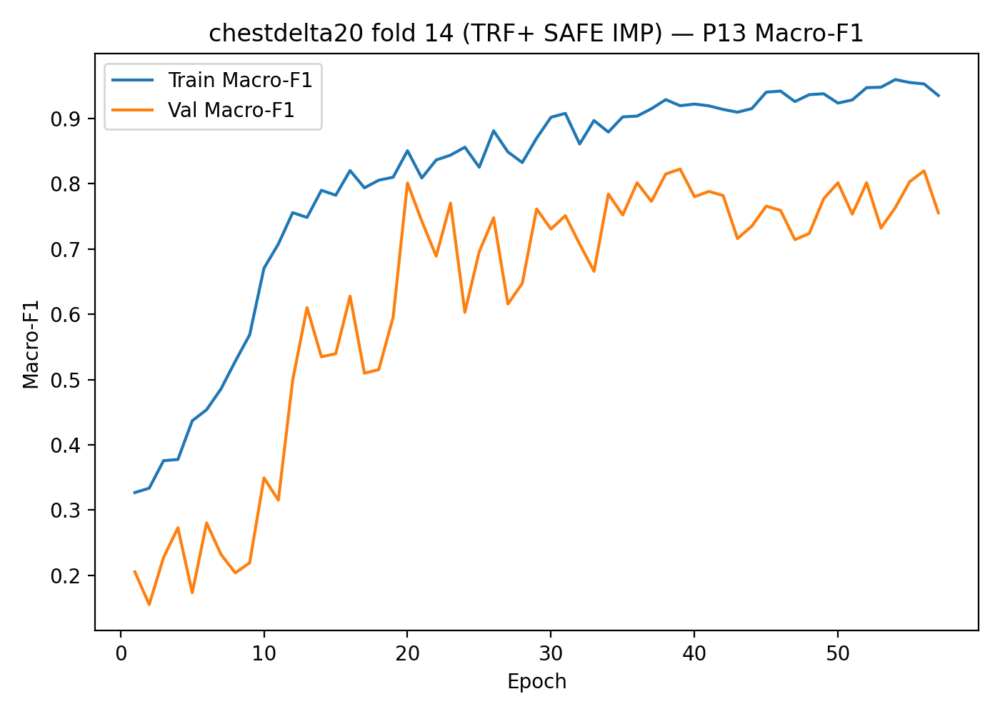

[P13] fold_15 (saved images)


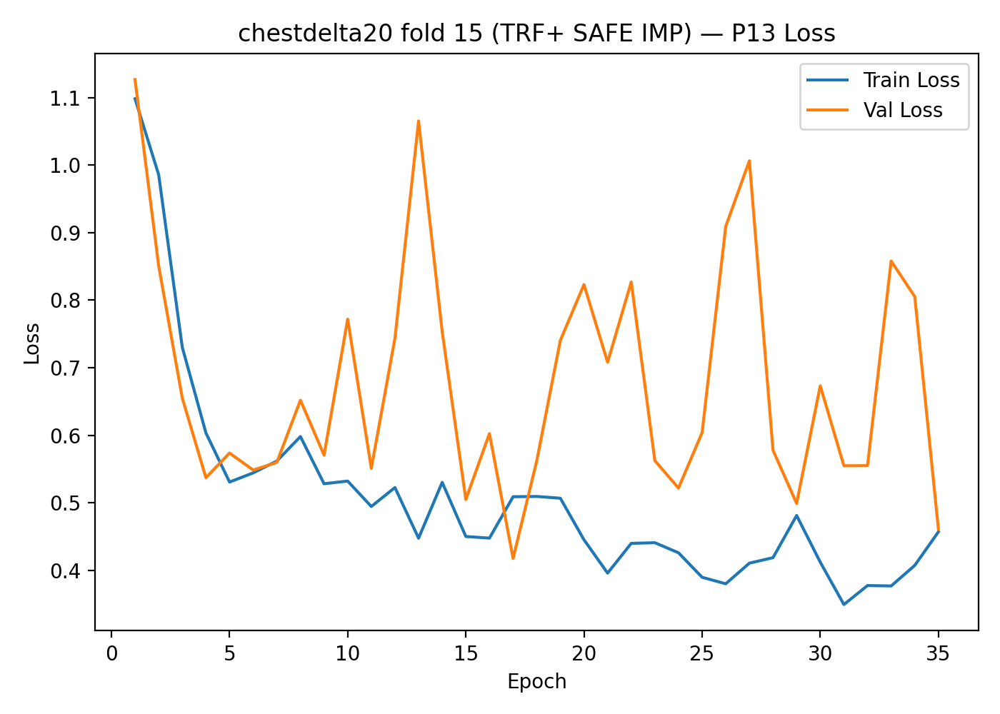

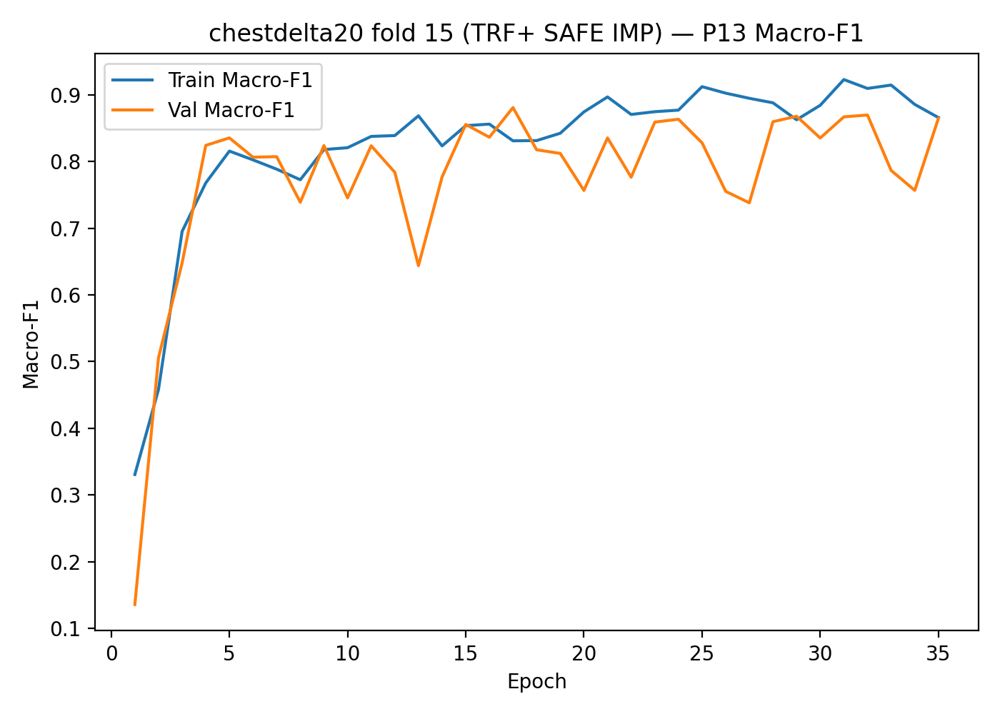

In [ ]:
# === Plots for Transformer+ SAFE (IMPROVED) — CHEST delta20 ===
# Expects under Drive:
#   eval/chestdelta20_phases_trf_plus_safe_impr/
#     - trf_plus_safe_impr_loso_summary.csv
#     - fold_##/P13_trf_plus_safe_impr_loss.png (optional)
#     - fold_##/P13_trf_plus_safe_impr_f1.png   (optional)
#     - fold_##/trf_plus_safe_impr_training.csv (for recreation if P13 images missing)

from google.colab import drive
drive.mount('/content/drive')

import os, glob, math
from pathlib import Path
import pandas as pd
import matplotlib.pyplot as plt
from IPython.display import display, Image, HTML

# ---------- 1) Locate eval dir ----------
ROOTS_TO_TRY = [
    "/content/drive/MyDrive/colab_checkpoints/wesad/eval",
    "/content/drive/MyDrive/wesad/eval",
    "/content/drive/MyDrive/wesad_backup/wesad/eval",
]
eval_candidates = []
for root in ROOTS_TO_TRY:
    eval_candidates += glob.glob(os.path.join(root, "chestdelta20_phases_trf_plus_safe_impr"))
    eval_candidates += glob.glob(os.path.join(root, "**", "chestdelta20_phases_trf_plus_safe_impr"), recursive=True)

if not eval_candidates:
    raise FileNotFoundError("Could not find 'chestdelta20_phases_trf_plus_safe_impr' under any expected Drive locations.")

EVAL_DIR = sorted(set([p for p in eval_candidates if os.path.isdir(p)]))[0]
print("[eval dir]", EVAL_DIR)

summary_csv   = os.path.join(EVAL_DIR, "trf_plus_safe_impr_loso_summary.csv")
perclass_csv  = os.path.join(EVAL_DIR, "trf_plus_safe_impr_loso_perclass_f1.csv")

if not os.path.exists(summary_csv):
    raise FileNotFoundError(f"Summary CSV missing: {summary_csv}")

# ---------- 2) Load summary & basic stats ----------
df = pd.read_csv(summary_csv)
display(HTML("<b>Summary head:</b>"))
display(df.head())

mean_acc = df["acc"].mean()
mean_f1  = df["f1_macro"].mean()
print(f"\nMean Accuracy:  {mean_acc:.4f}")
print(f"Mean Macro-F1:  {mean_f1:.4f}")

# ---------- 3) Per-fold line plot ----------
plt.figure(figsize=(9,5))
plt.plot(df["fold"], df["acc"], marker="o", label="Accuracy")
plt.plot(df["fold"], df["f1_macro"], marker="s", label="Macro-F1")
plt.hlines([mean_acc, mean_f1], xmin=df["fold"].min(), xmax=df["fold"].max(),
           linestyles="dashed", colors=["C0","C1"], alpha=0.5)
plt.text(df["fold"].max()+0.1, mean_acc, f"mean acc={mean_acc:.3f}", color="C0")
plt.text(df["fold"].max()+0.1, mean_f1,  f"mean F1={mean_f1:.3f}",  color="C1")
plt.xlabel("Fold"); plt.ylabel("Score")
plt.title("TRF+ SAFE (Improved, chestdelta20) — per-fold Performance")
plt.legend(); plt.tight_layout(); plt.show()

# ---------- 4) Per-fold barplots (Acc vs F1) ----------
plt.figure(figsize=(10,5))
w = 0.4
x = df["fold"].values
plt.bar(x - w/2, df["acc"], width=w, label="Accuracy")
plt.bar(x + w/2, df["f1_macro"], width=w, label="Macro-F1")
plt.xticks(x, [f"{int(v):02d}" for v in x])
plt.xlabel("Fold"); plt.ylabel("Score")
plt.title("TRF+ SAFE (Improved) — per-fold Acc vs Macro-F1")
plt.legend(); plt.tight_layout(); plt.show()

# ---------- 5) Boxplots for quick comparison ----------
ax = df[["acc","f1_macro"]].plot(kind="box", figsize=(6,5))
ax.set_title("TRF+ SAFE (Improved) — LOSO Accuracy & Macro-F1")
ax.set_ylabel("Score")
plt.tight_layout(); plt.show()

# ---------- 6) Show or recreate P13 learning curves per fold ----------
def show_or_recreate_p13_for_fold(eval_dir, fold_name):
    fold_dir = os.path.join(eval_dir, fold_name)
    loss_png = os.path.join(fold_dir, "P13_trf_plus_safe_impr_loss.png")
    f1_png   = os.path.join(fold_dir, "P13_trf_plus_safe_impr_f1.png")
    if os.path.exists(loss_png) and os.path.exists(f1_png):
        print(f"[P13] {fold_name} (saved images)")
        display(Image(filename=loss_png))
        display(Image(filename=f1_png))
        return

    # Recreate from training CSV if images not present
    csv_path = os.path.join(fold_dir, "trf_plus_safe_impr_training.csv")
    if not os.path.exists(csv_path):
        print(f"[P13] {fold_name}: no images and no training CSV to recreate.")
        return

    dfl = pd.read_csv(csv_path)
    # Loss curve
    plt.figure(figsize=(7,5))
    plt.plot(dfl["epoch"], dfl["train_loss"], label="Train Loss")
    plt.plot(dfl["epoch"], dfl["val_loss"], label="Val Loss")
    plt.xlabel("Epoch"); plt.ylabel("Loss"); plt.title(f"{fold_name} — P13 Loss"); plt.legend()
    out_loss = os.path.join(fold_dir, "P13_trf_plus_safe_impr_loss_recreated.png")
    plt.tight_layout(); plt.savefig(out_loss, dpi=200); plt.close()
    display(Image(filename=out_loss))

    # Macro-F1 curve
    plt.figure(figsize=(7,5))
    plt.plot(dfl["epoch"], dfl["train_f1"], label="Train Macro-F1")
    plt.plot(dfl["epoch"], dfl["val_f1"], label="Val Macro-F1")
    plt.xlabel("Epoch"); plt.ylabel("Macro-F1"); plt.title(f"{fold_name} — P13 Macro-F1"); plt.legend()
    out_f1 = os.path.join(fold_dir, "P13_trf_plus_safe_impr_f1_recreated.png")
    plt.tight_layout(); plt.savefig(out_f1, dpi=200); plt.close()
    display(Image(filename=out_f1))

# iterate folds
folds = sorted([d for d in os.listdir(EVAL_DIR) if d.startswith("fold_") and os.path.isdir(os.path.join(EVAL_DIR, d))])
if not folds:
    print("[i] No fold_* subfolders found. Only summary plots were shown.")
else:
    print(f"[i] Found {len(folds)} folds. Showing/recreating P13 curves for each.")
    for fd in folds:
        show_or_recreate_p13_for_fold(EVAL_DIR, fd)


model 4 final before seed

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
[EVAL_DIR] /content/drive/MyDrive/colab_checkpoints/wesad/eval/chestdelta20_phases_trf_plus_safe_impr_locked


,fold,test_subject,acc,f1_macro,raw_acc,raw_f1_macro
0,1,S10,0.789474,0.748918,0.789474,0.748918
1,2,S11,0.790909,0.765677,0.790909,0.765677
2,3,S13,0.746667,0.671067,0.733333,0.658689
3,4,S14,0.881818,0.868215,0.872727,0.856125
4,5,S15,0.366197,0.271225,0.352113,0.264493



COHORT (smoothed)  : Acc=0.7477±0.1411 | F1=0.7005±0.1693
COHORT (raw logits): Acc=0.7438 | F1=0.6976


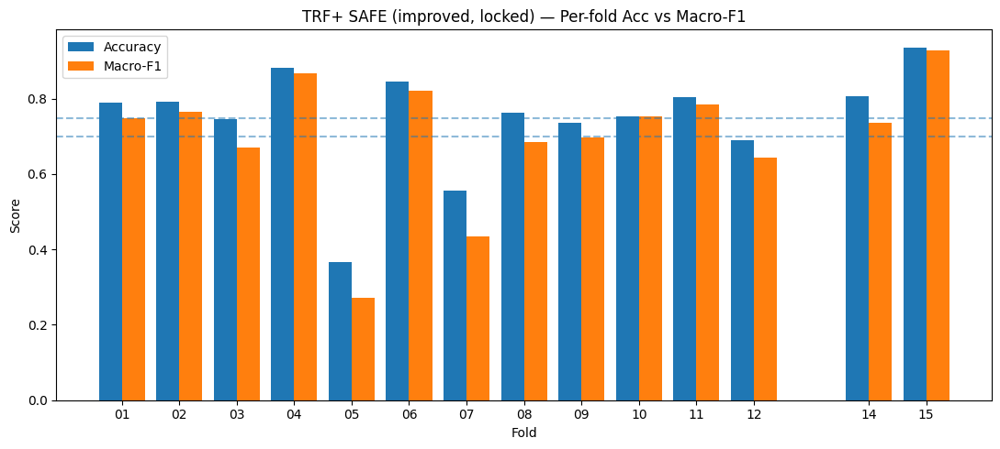

saved -> /content/drive/MyDrive/colab_checkpoints/wesad/eval/chestdelta20_phases_trf_plus_safe_impr_locked/P19_per_fold_bars_acc_f1.png


/tmp/ipython-input-1240209877.py:80: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = plt.boxplot([df["acc"], df["f1_macro"]], labels=["Acc","Macro-F1"], patch_artist=True)


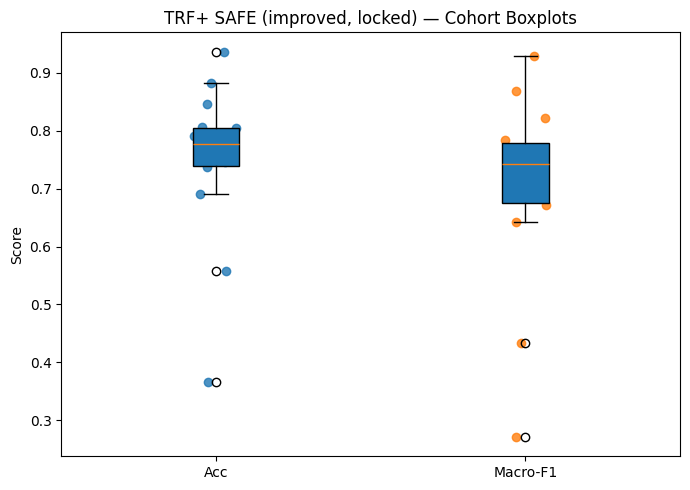

saved -> /content/drive/MyDrive/colab_checkpoints/wesad/eval/chestdelta20_phases_trf_plus_safe_impr_locked/P20_boxplots_acc_f1.png


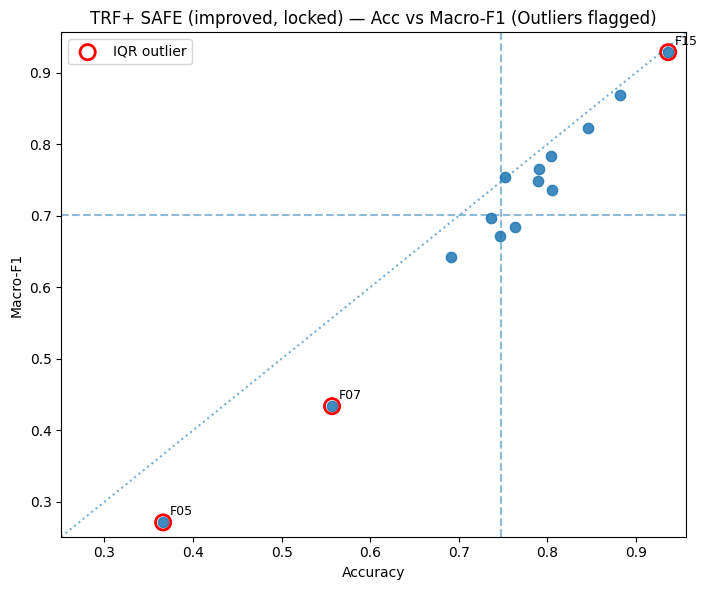

saved -> /content/drive/MyDrive/colab_checkpoints/wesad/eval/chestdelta20_phases_trf_plus_safe_impr_locked/P21_scatter_acc_vs_f1_outliers.png


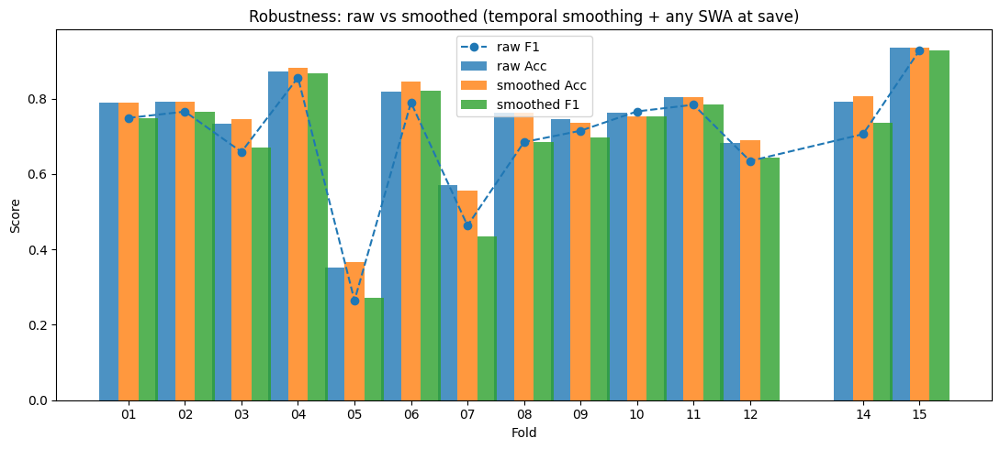

saved -> /content/drive/MyDrive/colab_checkpoints/wesad/eval/chestdelta20_phases_trf_plus_safe_impr_locked/P22_raw_vs_smoothed_per_fold.png


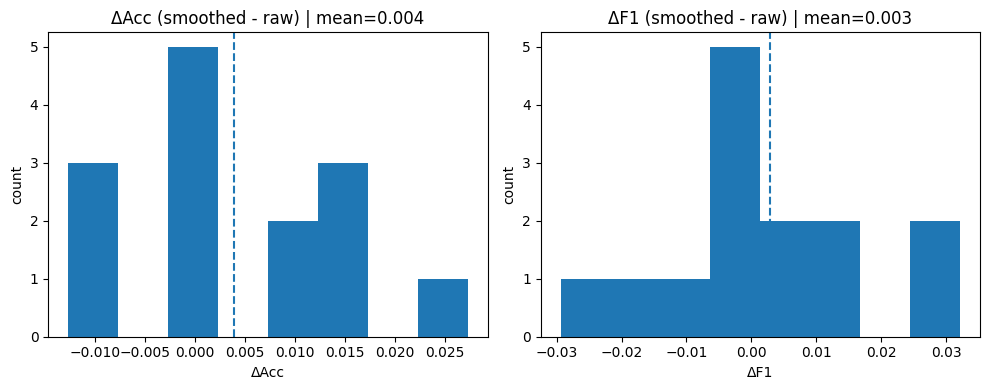

saved -> /content/drive/MyDrive/colab_checkpoints/wesad/eval/chestdelta20_phases_trf_plus_safe_impr_locked/P23_delta_hist_raw_to_smoothed.png


/tmp/ipython-input-1240209877.py:162: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([dfc["f1_A"], dfc["f1_P"], dfc["f1_R"]],


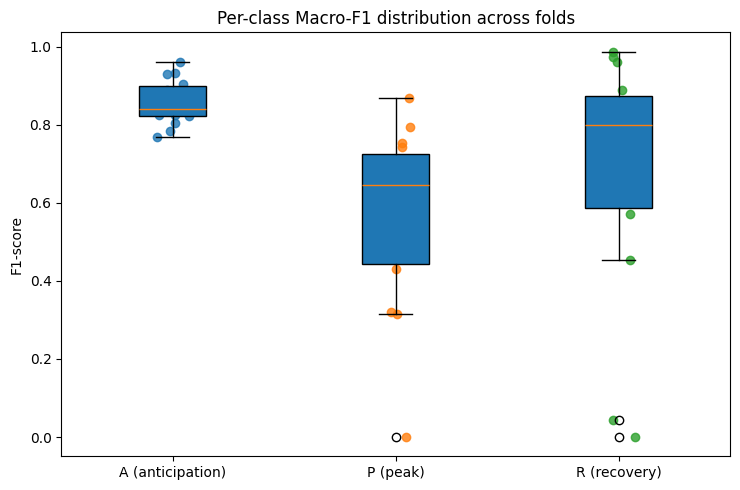

saved -> /content/drive/MyDrive/colab_checkpoints/wesad/eval/chestdelta20_phases_trf_plus_safe_impr_locked/P24_per_class_f1_boxplots.png


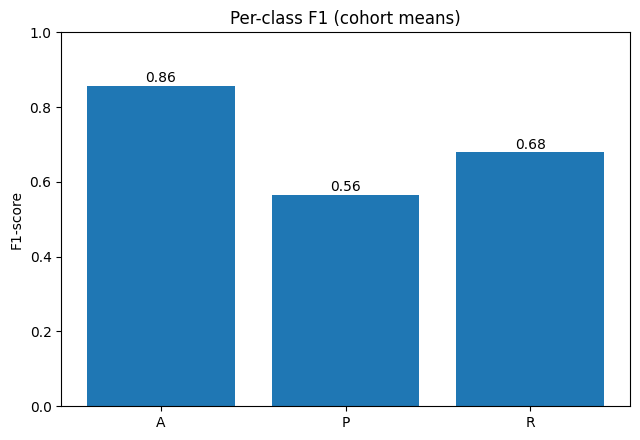

saved -> /content/drive/MyDrive/colab_checkpoints/wesad/eval/chestdelta20_phases_trf_plus_safe_impr_locked/P25_per_class_f1_means.png

Done. All figures were saved under:
/content/drive/MyDrive/colab_checkpoints/wesad/eval/chestdelta20_phases_trf_plus_safe_impr_locked


In [ ]:
# === Plots for FULL: Transformer+ SAFE (improved, locked) — CHEST delta20 ===
# Cohort barplots, boxplots (with outliers), scatter, and raw vs smoothed (robustness) comparison

from google.colab import drive
drive.mount('/content/drive')

import os, glob, math
from pathlib import Path
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from IPython.display import display, HTML

# ---------- 0) Locate eval dir ----------
ROOTS_TO_TRY = [
    "/content/drive/MyDrive/colab_checkpoints/wesad/eval",
    "/content/drive/MyDrive/wesad/eval",
    "/content/drive/MyDrive/wesad_backup/wesad/eval",
]
eval_candidates = []
for root in ROOTS_TO_TRY:
    eval_candidates += glob.glob(os.path.join(root, "chestdelta20_phases_trf_plus_safe_impr_locked"))
    eval_candidates += glob.glob(os.path.join(root, "**", "chestdelta20_phases_trf_plus_safe_impr_locked"), recursive=True)

if not eval_candidates:
    raise FileNotFoundError("Could not find 'chestdelta20_phases_trf_plus_safe_impr_locked' under expected Drive locations.")

EVAL_DIR = sorted(set([p for p in eval_candidates if os.path.isdir(p)]))[0]
print("[EVAL_DIR]", EVAL_DIR)

summary_csv  = os.path.join(EVAL_DIR, "trf_plus_safe_impr_loso_summary.csv")
perclass_csv = os.path.join(EVAL_DIR, "trf_plus_safe_impr_loso_perclass_f1.csv")

if not os.path.exists(summary_csv):
    raise FileNotFoundError(f"Summary CSV missing: {summary_csv}")

df = pd.read_csv(summary_csv).sort_values("fold")
# Expect columns: fold, test_subject, acc, f1_macro, raw_acc, raw_f1_macro
display(HTML("<b>Summary (head):</b>"))
display(df.head())

# ---------- 1) Cohort stats ----------
mean_acc  = df["acc"].mean()
std_acc   = df["acc"].std(ddof=1)
mean_f1   = df["f1_macro"].mean()
std_f1    = df["f1_macro"].std(ddof=1)

mean_raw_acc = df["raw_acc"].mean() if "raw_acc" in df else np.nan
mean_raw_f1  = df["raw_f1_macro"].mean() if "raw_f1_macro" in df else np.nan

print(f"\nCOHORT (smoothed)  : Acc={mean_acc:.4f}±{std_acc:.4f} | F1={mean_f1:.4f}±{std_f1:.4f}")
if "raw_acc" in df and "raw_f1_macro" in df:
    print(f"COHORT (raw logits): Acc={mean_raw_acc:.4f} | F1={mean_raw_f1:.4f}")

# ---------- helper: save+show ----------
def save_show(fname):
    out = os.path.join(EVAL_DIR, fname)
    plt.tight_layout()
    plt.savefig(out, dpi=200, bbox_inches="tight")
    plt.show()
    print("saved ->", out)

# ---------- 2) Per-fold barplots ----------
x = df["fold"].values
plt.figure(figsize=(11,5))
w = 0.4
plt.bar(x - w/2, df["acc"], width=w, label="Accuracy")
plt.bar(x + w/2, df["f1_macro"], width=w, label="Macro-F1")
plt.axhline(mean_acc,  ls="--", alpha=0.5)
plt.axhline(mean_f1,   ls="--", alpha=0.5)
plt.xticks(x, [f"{int(v):02d}" for v in x])
plt.xlabel("Fold")
plt.ylabel("Score")
plt.title("TRF+ SAFE (improved, locked) — Per-fold Acc vs Macro-F1")
plt.legend()
save_show("P19_per_fold_bars_acc_f1.png")

# ---------- 3) Boxplots + strip of points (outliers visual) ----------
plt.figure(figsize=(7,5))
bp = plt.boxplot([df["acc"], df["f1_macro"]], labels=["Acc","Macro-F1"], patch_artist=True)
# overlay points
jitter = 0.07
plt.scatter(np.full(len(df), 1) + np.random.uniform(-jitter, jitter, len(df)), df["acc"], alpha=0.8)
plt.scatter(np.full(len(df), 2) + np.random.uniform(-jitter, jitter, len(df)), df["f1_macro"], alpha=0.8)
plt.title("TRF+ SAFE (improved, locked) — Cohort Boxplots")
plt.ylabel("Score")
save_show("P20_boxplots_acc_f1.png")

# ---------- 4) Outlier detection (IQR) + Scatter Acc vs F1 ----------
def iqr_outliers(series):
    q1, q3 = series.quantile(0.25), series.quantile(0.75)
    iqr = q3 - q1
    lo, hi = q1 - 1.5*iqr, q3 + 1.5*iqr
    return (series < lo) | (series > hi), (lo, hi)

is_out_acc, (acc_lo, acc_hi) = iqr_outliers(df["acc"])
is_out_f1,  (f1_lo,  f1_hi)  = iqr_outliers(df["f1_macro"])
is_any_out = is_out_acc | is_out_f1

plt.figure(figsize=(7.2,6))
plt.scatter(df["acc"], df["f1_macro"], s=55, alpha=0.85)
# Highlight outliers
if is_any_out.any():
    plt.scatter(df.loc[is_any_out, "acc"], df.loc[is_any_out, "f1_macro"],
                s=120, facecolors="none", edgecolors="red", linewidths=2, label="IQR outlier")
    # Annotate with fold id
    for _, r in df.loc[is_any_out].iterrows():
        plt.annotate(f"F{int(r['fold']):02d}", (r["acc"], r["f1_macro"]), xytext=(5,5), textcoords="offset points", fontsize=9)

# reference lines
plt.axvline(mean_acc,  ls="--", alpha=0.5)
plt.axhline(mean_f1,   ls="--", alpha=0.5)
lims = [min(df["acc"].min(), df["f1_macro"].min())-0.02, max(df["acc"].max(), df["f1_macro"].max())+0.02]
lims[0] = max(0.0, lims[0]); lims[1] = min(1.0, lims[1])
plt.plot(lims, lims, ls=":", alpha=0.6)  # 45° line
plt.xlim(lims); plt.ylim(lims)
plt.xlabel("Accuracy"); plt.ylabel("Macro-F1")
plt.title("TRF+ SAFE (improved, locked) — Acc vs Macro-F1 (Outliers flagged)")
if is_any_out.any(): plt.legend()
save_show("P21_scatter_acc_vs_f1_outliers.png")

# ---------- 5) Robustness view: RAW vs SMOOTHED ----------
if "raw_acc" in df and "raw_f1_macro" in df:
    # side-by-side bars per fold
    plt.figure(figsize=(11,5))
    w = 0.35
    plt.bar(x - w, df["raw_acc"], width=w, label="raw Acc", alpha=0.8)
    plt.bar(x,      df["acc"],     width=w, label="smoothed Acc", alpha=0.8)
    plt.bar(x + w,  df["f1_macro"], width=w, label="smoothed F1", alpha=0.8)
    # draw raw F1 as points if present
    if "raw_f1_macro" in df:
        plt.plot(x, df["raw_f1_macro"], marker="o", linestyle="--", label="raw F1")
    plt.xticks(x, [f"{int(v):02d}" for v in x])
    plt.xlabel("Fold"); plt.ylabel("Score")
    plt.title("Robustness: raw vs smoothed (temporal smoothing + any SWA at save)")
    plt.legend()
    save_show("P22_raw_vs_smoothed_per_fold.png")

    # deltas histogram (gain from smoothing)
    d_acc = (df["acc"] - df["raw_acc"]).values
    d_f1  = (df["f1_macro"] - df["raw_f1_macro"]).values
    plt.figure(figsize=(10,4))
    plt.subplot(1,2,1)
    plt.hist(d_acc, bins=8)
    plt.axvline(np.mean(d_acc), ls="--")
    plt.title(f"ΔAcc (smoothed - raw) | mean={np.mean(d_acc):.3f}")
    plt.xlabel("ΔAcc"); plt.ylabel("count")
    plt.subplot(1,2,2)
    plt.hist(d_f1, bins=8)
    plt.axvline(np.mean(d_f1), ls="--")
    plt.title(f"ΔF1 (smoothed - raw) | mean={np.mean(d_f1):.3f}")
    plt.xlabel("ΔF1"); plt.ylabel("count")
    save_show("P23_delta_hist_raw_to_smoothed.png")
else:
    print("[i] raw_* columns not found in summary — skipping raw vs smoothed comparison.")

# ---------- 6) Per-class F1 consistency (if available) ----------
if os.path.exists(perclass_csv):
    dfc = pd.read_csv(perclass_csv).sort_values("fold")
    # columns: fold, test_subject, f1_A, f1_P, f1_R
    plt.figure(figsize=(7.5,5))
    plt.boxplot([dfc["f1_A"], dfc["f1_P"], dfc["f1_R"]],
                labels=["A (anticipation)","P (peak)","R (recovery)"], patch_artist=True)
    # overlay points per fold for each class
    jitter = 0.08
    for i, col in enumerate(["f1_A","f1_P","f1_R"], start=1):
        plt.scatter(np.full(len(dfc), i) + np.random.uniform(-jitter, jitter, len(dfc)),
                    dfc[col], alpha=0.8, label=None)
    plt.ylabel("F1-score")
    plt.title("Per-class Macro-F1 distribution across folds")
    save_show("P24_per_class_f1_boxplots.png")

    # Cohort mean per class (bar)
    means = [dfc["f1_A"].mean(), dfc["f1_P"].mean(), dfc["f1_R"].mean()]
    plt.figure(figsize=(6.5,4.5))
    plt.bar(["A","P","R"], means)
    for i,v in enumerate(means):
        plt.text(i, v+0.01, f"{v:.2f}", ha="center")
    plt.ylim(0, 1.0)
    plt.ylabel("F1-score")
    plt.title("Per-class F1 (cohort means)")
    save_show("P25_per_class_f1_means.png")
else:
    print("[i] per-class CSV not found — skipping per-class consistency plots.")

print("\nDone. All figures were saved under:")
print(EVAL_DIR)


ensemble

[WARN] No seed summaries found.


,mean,std,min,25%,50%,75%,max,n
Ensemble Acc,0.776400,0.099500,0.619700,0.717000,0.752500,0.851800,0.945500,14.000000
Ensemble F1,0.740900,0.131700,0.492900,0.701700,0.731900,0.831000,0.941600,14.000000
BestSeed Acc,nan,nan,nan,nan,nan,nan,nan,0.000000
BestSeed F1,nan,nan,nan,nan,nan,nan,nan,0.000000



Paired diffs (Ensemble − BestSeed):
  F1:  median=nan, mean=nan, n=0, Wilcoxon p=NA, r_rb=NA
  Acc: median=nan, mean=nan, n=0, Wilcoxon p=NA, r_rb=NA


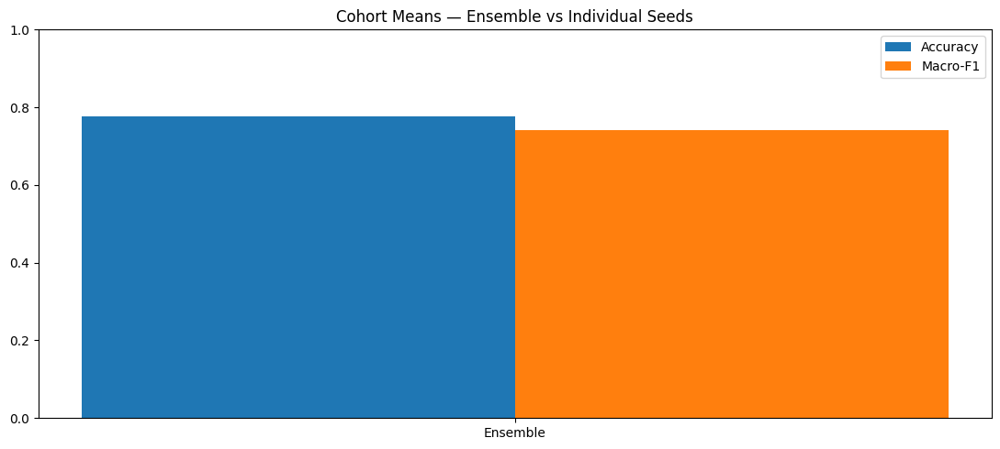

saved -> /content/drive/MyDrive/colab_checkpoints/wesad/eval/chestdelta20_phases_trf_plus_safe_impr_ens_tta/P30_means_bar.png


/tmp/ipython-input-297561370.py:160: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(box_series, labels=box_labels, patch_artist=True)


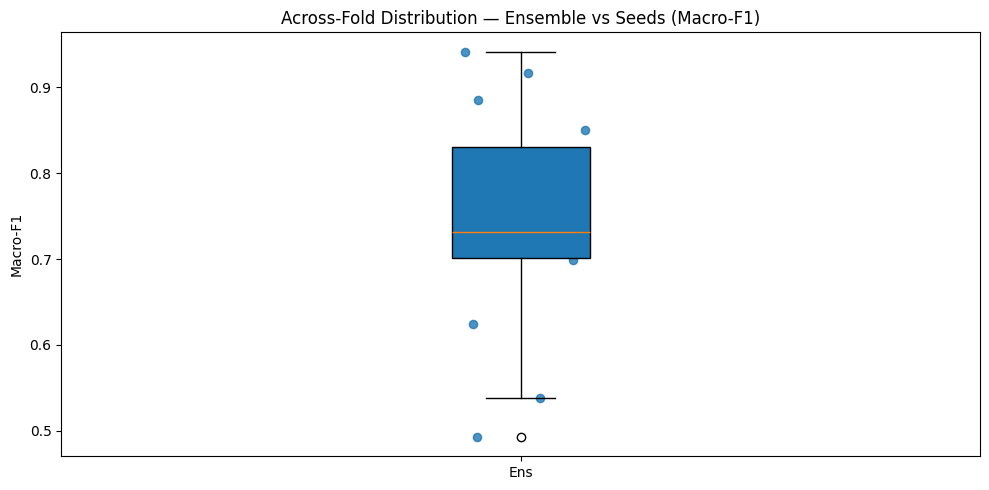

saved -> /content/drive/MyDrive/colab_checkpoints/wesad/eval/chestdelta20_phases_trf_plus_safe_impr_ens_tta/P31_box.png

[DONE] Figures saved in: /content/drive/MyDrive/colab_checkpoints/wesad/eval/chestdelta20_phases_trf_plus_safe_impr_ens_tta


In [ ]:
# === Robust summary + visuals (handles missing seed CSVs) ===
import os, re
from pathlib import Path
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

try:
    from scipy.stats import wilcoxon
    HAVE_SCIPY = True
except Exception:
    HAVE_SCIPY = False

# ---- Locate project and ensemble dir (adjust if needed) ----
ROOTS_TO_TRY = [
    "/content/wesad",
    "/content/drive/MyDrive/colab_checkpoints/wesad",
    "/content/drive/MyDrive/wesad",
    "/content/drive/MyDrive/wesad_backup/wesad",
]
proj = next((Path(r) for r in ROOTS_TO_TRY if os.path.isdir(r)), None)
if proj is None:
    raise FileNotFoundError("Project root not found in common paths.")
TRACK_KEY = "chestdelta20"
ENSEMBLE_DIR = proj/"eval"/f"{TRACK_KEY}_phases_trf_plus_safe_impr_ens_tta"
ens_csv = ENSEMBLE_DIR/"ensemble_tta_loso_summary.csv"
assert ens_csv.exists(), f"Missing ensemble summary: {ens_csv}"

# ---- Load ensemble ----
dfE = pd.read_csv(ens_csv).sort_values("fold")
joined = dfE[["fold","test_subject","acc","f1_macro"]].rename(
    columns={"acc":"ens_acc","f1_macro":"ens_f1"}
)

# ---- Auto-discover available seed summaries in the same folder ----
seed_files = list(ENSEMBLE_DIR.glob("seed*_tta_loso_summary.csv"))
available_seeds = []
for p in seed_files:
    m = re.search(r"seed(\d+)_tta_loso_summary\.csv$", p.name)
    if m:
        available_seeds.append(int(m.group(1)))

available_seeds = sorted(set(available_seeds))
print(f"[INFO] Found seed summaries: {available_seeds}" if available_seeds else "[WARN] No seed summaries found.")

# ---- Merge in each seed (only if file exists) ----
for s in available_seeds:
    dfS = pd.read_csv(ENSEMBLE_DIR/f"seed{s}_tta_loso_summary.csv").sort_values("fold")
    dfS = dfS[["fold","test_subject","acc","f1_macro"]].rename(
        columns={"acc":f"acc_{s}", "f1_macro":f"f1_{s}"}
    )
    joined = joined.merge(dfS, on=["fold","test_subject"], how="left")

# ---- Compute best/worst seed per fold (if any seeds present) ----
seed_f1_cols  = [c for c in joined.columns if c.startswith("f1_") and c != "ens_f1"]
seed_acc_cols = [c for c in joined.columns if c.startswith("acc_")]

if seed_f1_cols:
    joined["best_seed_f1"]  = joined[seed_f1_cols].max(axis=1)
    joined["worst_seed_f1"] = joined[seed_f1_cols].min(axis=1)
else:
    joined["best_seed_f1"] = np.nan
    joined["worst_seed_f1"] = np.nan

if seed_acc_cols:
    joined["best_seed_acc"]  = joined[seed_acc_cols].max(axis=1)
    joined["worst_seed_acc"] = joined[seed_acc_cols].min(axis=1)
else:
    joined["best_seed_acc"] = np.nan
    joined["worst_seed_acc"] = np.nan

# ---- Cohort stats table ----
def stats_block(series):
    d = series.dropna()
    return pd.Series({
        "mean": d.mean(), "std": d.std(ddof=1), "min": d.min(),
        "25%": d.quantile(0.25), "50%": d.median(), "75%": d.quantile(0.75),
        "max": d.max(), "n": d.shape[0]
    })

summary = pd.DataFrame({
    "Ensemble Acc": stats_block(joined["ens_acc"]),
    "Ensemble F1":  stats_block(joined["ens_f1"]),
    "BestSeed Acc": stats_block(joined["best_seed_acc"]),
    "BestSeed F1":  stats_block(joined["best_seed_f1"]),
}).T

# Add per-seed rows for those actually present
for s in available_seeds:
    summary.loc[f"Seed{s} Acc"] = stats_block(joined.get(f"acc_{s}", pd.Series(dtype=float)))
    summary.loc[f"Seed{s} F1"]  = stats_block(joined.get(f"f1_{s}",  pd.Series(dtype=float)))

display(summary.round(4).style.set_caption("Cohort Summary (Ensemble vs Seeds)"))

# ---- Paired diffs & Wilcoxon effect size (only if best_seed exists) ----
def wilcoxon_rbc(diffs):
    d = diffs.replace(0, np.nan).dropna()
    if not HAVE_SCIPY or d.empty:
        return np.nan, np.nan
    stat, p = wilcoxon(d, alternative="greater")
    n = len(d)
    R = n*(n+1)/2.0
    r_rb = 2*stat/R - 1.0
    return p, r_rb

diff_f1 = (joined["ens_f1"] - joined["best_seed_f1"]).dropna()
diff_acc = (joined["ens_acc"] - joined["best_seed_acc"]).dropna()
p_f1, r_f1 = wilcoxon_rbc(diff_f1) if seed_f1_cols else (np.nan, np.nan)
p_acc, r_acc = wilcoxon_rbc(diff_acc) if seed_acc_cols else (np.nan, np.nan)

print("\nPaired diffs (Ensemble − BestSeed):")
print(f"  F1:  median={diff_f1.median() if len(diff_f1)>0 else np.nan:.4f}, mean={diff_f1.mean() if len(diff_f1)>0 else np.nan:.4f}, n={len(diff_f1)}, Wilcoxon p={p_f1 if not np.isnan(p_f1) else 'NA'}, r_rb={r_f1 if not np.isnan(r_f1) else 'NA'}")
print(f"  Acc: median={diff_acc.median() if len(diff_acc)>0 else np.nan:.4f}, mean={diff_acc.mean() if len(diff_acc)>0 else np.nan:.4f}, n={len(diff_acc)}, Wilcoxon p={p_acc if not np.isnan(p_acc) else 'NA'}, r_rb={r_acc if not np.isnan(r_acc) else 'NA'}")

# ---- Plot helpers ----
def save_show(fname):
    out = ENSEMBLE_DIR/fname
    plt.tight_layout()
    plt.savefig(out, dpi=200, bbox_inches="tight")
    plt.show()
    print("saved ->", out)

# ---- Bar: cohort means (ensemble vs seeds, plus BestSeed if present) ----
labels = ["Ensemble"]
bar_acc = [joined["ens_acc"].mean()]
bar_f1  = [joined["ens_f1"].mean()]

for s in available_seeds:
    labels.append(f"Seed{s}")
    bar_acc.append(joined.get(f"acc_{s}", pd.Series(dtype=float)).mean())
    bar_f1.append(joined.get(f"f1_{s}",  pd.Series(dtype=float)).mean())

if seed_f1_cols:
    labels.append("BestSeed")
    bar_acc.append(joined["best_seed_acc"].mean())
    bar_f1.append(joined["best_seed_f1"].mean())

x = np.arange(len(labels))
w = 0.35
plt.figure(figsize=(11,5))
plt.bar(x - w/2, bar_acc, width=w, label="Accuracy")
plt.bar(x + w/2, bar_f1,  width=w, label="Macro-F1")
plt.xticks(x, labels, rotation=0)
plt.ylim(0, 1.0)
plt.title("Cohort Means — Ensemble vs Individual Seeds")
plt.legend()
save_show("P30_means_bar.png")

# ---- Boxplot across folds (ensemble vs each seed present) ----
plt.figure(figsize=(10,5))
box_series = [joined["ens_f1"].dropna()]
box_labels = ["Ens"]
for s in available_seeds:
    col = f"f1_{s}"
    if col in joined.columns:
        d = joined[col].dropna()
        if not d.empty:
            box_series.append(d); box_labels.append(f"S{s}")

plt.boxplot(box_series, labels=box_labels, patch_artist=True)
# overlay points
for i, d in enumerate(box_series, start=1):
    xs = np.full(len(d), i) + np.random.uniform(-0.07,0.07,len(d))
    plt.scatter(xs, d, alpha=0.8, s=35)
plt.ylabel("Macro-F1")
plt.title("Across-Fold Distribution — Ensemble vs Seeds (Macro-F1)")
save_show("P31_box.png")

# ---- Scatter: per-subject, Ensemble vs BestSeed (only if available) ----
if seed_f1_cols:
    # F1
    plt.figure(figsize=(7,6))
    plt.scatter(joined["best_seed_f1"], joined["ens_f1"], s=55, alpha=0.9)
    mn = max(0.0, min(joined["best_seed_f1"].min(), joined["ens_f1"].min()) - 0.02)
    mx = min(1.0, max(joined["best_seed_f1"].max(), joined["ens_f1"].max()) + 0.02)
    plt.plot([mn,mx],[mn,mx], ls=":", alpha=0.7)
    plt.xlim(mn,mx); plt.ylim(mn,mx)
    plt.xlabel("Best Seed Macro-F1"); plt.ylabel("Ensemble Macro-F1")
    plt.title("Per-Subject: Ensemble vs Best Seed (Macro-F1)")
    save_show("P32_scatter_f1_best.png")

    # Acc
    plt.figure(figsize=(7,6))
    plt.scatter(joined["best_seed_acc"], joined["ens_acc"], s=55, alpha=0.9)
    mn = max(0.0, min(joined["best_seed_acc"].min(), joined["ens_acc"].min()) - 0.02)
    mx = min(1.0, max(joined["best_seed_acc"].max(), joined["ens_acc"].max()) + 0.02)
    plt.plot([mn,mx],[mn,mx], ls=":", alpha=0.7)
    plt.xlim(mn,mx); plt.ylim(mn,mx)
    plt.xlabel("Best Seed Accuracy"); plt.ylabel("Ensemble Accuracy")
    plt.title("Per-Subject: Ensemble vs Best Seed (Accuracy)")
    save_show("P33_scatter_acc_best.png")

# ---- Scatter: Ensemble vs WorstSeed (diagnostic; only if available) ----
if seed_f1_cols:
    plt.figure(figsize=(7,6))
    plt.scatter(joined["worst_seed_f1"], joined["ens_f1"], s=55, alpha=0.9)
    mn = max(0.0, min(joined["worst_seed_f1"].min(), joined["ens_f1"].min()) - 0.02)
    mx = min(1.0, max(joined["worst_seed_f1"].max(), joined["ens_f1"].max()) + 0.02)
    plt.plot([mn,mx],[mn,mx], ls=":", alpha=0.7)
    plt.xlim(mn,mx); plt.ylim(mn,mx)
    plt.xlabel("Worst Seed Macro-F1"); plt.ylabel("Ensemble Macro-F1")
    plt.title("Per-Subject: Ensemble vs Worst Seed (Macro-F1)")
    save_show("P34_scatter_f1_worst.png")

# ---- Differences (Ensemble − BestSeed): histogram + violin) ----
if seed_f1_cols and len(diff_f1)>0:
    plt.figure(figsize=(12,4))
    plt.subplot(1,2,1)
    plt.hist(diff_f1, bins=8)
    if len(diff_f1)>0:
        plt.axvline(diff_f1.mean(), ls="--", label=f"mean={diff_f1.mean():.3f}")
        plt.axvline(diff_f1.median(), ls="-.", label=f"median={diff_f1.median():.3f}")
    plt.title("Δ Macro-F1 (Ensemble − BestSeed)")
    plt.xlabel("Δ Macro-F1"); plt.ylabel("count"); plt.legend()

    plt.subplot(1,2,2)
    plt.violinplot([diff_f1.dropna(), diff_acc.dropna()], showmeans=True, showextrema=True)
    plt.xticks([1,2], ["ΔF1","ΔAcc"])
    plt.title("Paired Differences — Violin")
    save_show("P35_diff_hist_violin.png")

print("\n[DONE] Figures saved in:", ENSEMBLE_DIR)


In [ ]:
# === Wilcoxon + Paired Diffs + Optional Tables/Plots (robust to missing seeds) ===
import os, re
from pathlib import Path
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

try:
    from scipy.stats import wilcoxon
    HAVE_SCIPY = True
except Exception:
    HAVE_SCIPY = False

# ---------- Locate project & ensemble dir (adjust the list if your path differs) ----------
ROOTS_TO_TRY = [
    "/content/wesad",
    "/content/drive/MyDrive/colab_checkpoints/wesad",
    "/content/drive/MyDrive/wesad",
    "/content/drive/MyDrive/wesad_backup/wesad",
]
proj = next((Path(r) for r in ROOTS_TO_TRY if os.path.isdir(r)), None)
if proj is None:
    raise FileNotFoundError("Project root not found in common paths.")

TRACK_KEY = "chestdelta20"
ENSEMBLE_DIR = proj/"eval"/f"{TRACK_KEY}_phases_trf_plus_safe_impr_ens_tta"
ens_csv = ENSEMBLE_DIR/"ensemble_tta_loso_summary.csv"
assert ens_csv.exists(), f"Missing ensemble summary: {ens_csv}"

# ---------- Load ensemble ----------
dfE = pd.read_csv(ens_csv).sort_values("fold")
base = dfE[["fold","test_subject","acc","f1_macro"]].rename(columns={"acc":"ens_acc","f1_macro":"ens_f1"})

# ---------- Find available seed summaries in the same folder ----------
seed_files = list(ENSEMBLE_DIR.glob("seed*_tta_loso_summary.csv"))
seeds = []
for p in seed_files:
    m = re.search(r"seed(\d+)_tta_loso_summary\.csv$", p.name)
    if m:
        seeds.append(int(m.group(1)))
seeds = sorted(set(seeds))
print(f"[INFO] Found seed summaries: {seeds}" if seeds else "[WARN] No seed summaries found. Will only report ensemble stats.")

# ---------- Merge all seeds that exist ----------
joined = base.copy()
for s in seeds:
    dfS = pd.read_csv(ENSEMBLE_DIR/f"seed{s}_tta_loso_summary.csv").sort_values("fold")
    dfS = dfS[["fold","test_subject","acc","f1_macro"]].rename(columns={"acc":f"acc_{s}", "f1_macro":f"f1_{s}"})
    joined = joined.merge(dfS, on=["fold","test_subject"], how="left")

seed_f1_cols  = [c for c in joined.columns if c.startswith("f1_") and c != "ens_f1"]
seed_acc_cols = [c for c in joined.columns if c.startswith("acc_") and c != "ens_acc"]

# ---------- Build pooled seed references (per-fold best & mean) ----------
if seed_f1_cols:
    joined["best_seed_f1"]  = joined[seed_f1_cols].max(axis=1)
    joined["mean_seed_f1"]  = joined[seed_f1_cols].mean(axis=1)
    joined["best_seed_acc"] = joined[[c.replace("f1_","acc_") for c in seed_f1_cols]].max(axis=1)
    joined["mean_seed_acc"] = joined[[c.replace("f1_","acc_") for c in seed_f1_cols]].mean(axis=1)

# ---------- Helper: Wilcoxon + summary print ----------
def wilcoxon_block(x, y, label, alt="greater"):
    x, y = pd.Series(x).astype(float), pd.Series(y).astype(float)
    df = (x - y).dropna()
    n = len(df)
    med = float(df.median()) if n else np.nan
    mean = float(df.mean()) if n else np.nan
    if HAVE_SCIPY and n > 0:
        stat, p = wilcoxon(df, alternative=alt)
    else:
        stat, p = np.nan, np.nan
    print(f"{label}: n={n}  Δmedian={med:.4f}  Δmean={mean:.4f}  Wilcoxon W={stat if not np.isnan(stat) else 'NA'}  p={p if not np.isnan(p) else 'NA'}")
    return df, stat, p, med, mean

print("\n=== Wilcoxon (Ensemble − Seed) on Macro-F1 and Accuracy ===")
# Each individual seed
for s in seeds:
    df_f1, *_ = wilcoxon_block(joined["ens_f1"],  joined[f"f1_{s}"],  f"Ensemble vs Seed{s} (F1)")
    df_acc, *_ = wilcoxon_block(joined["ens_acc"], joined[f"acc_{s}"], f"Ensemble vs Seed{s} (Acc)")

# Best-seed per fold
if seed_f1_cols:
    df_f1_best, *_ = wilcoxon_block(joined["ens_f1"],  joined["best_seed_f1"],  "Ensemble vs BestSeed (F1)")
    df_acc_best, *_ = wilcoxon_block(joined["ens_acc"], joined["best_seed_acc"], "Ensemble vs BestSeed (Acc)")
# Mean across seeds per fold
if seed_f1_cols:
    df_f1_mean, *_ = wilcoxon_block(joined["ens_f1"],  joined["mean_seed_f1"],  "Ensemble vs MeanSeed (F1)")
    df_acc_mean, *_ = wilcoxon_block(joined["ens_acc"], joined["mean_seed_acc"], "Ensemble vs MeanSeed (Acc)")

# ---------- Optional Table: per-fold ensemble & one or more seeds ----------
# Choose which seeds to display side-by-side (limit for readability)
show_seeds = seeds[:3]  # change this to any subset you want to see
cols = ["fold","test_subject","ens_acc","ens_f1"]
for s in show_seeds:
    cols += [f"acc_{s}", f"f1_{s}"]
table = joined[cols].sort_values("fold")
print("\n--- Per-fold table (ensemble + selected seeds) ---")
print(table.to_string(index=False))

# Save the table CSV next to ensemble CSV
table_out = ENSEMBLE_DIR/"per_fold_ens_vs_seeds.csv"
table.to_csv(table_out, index=False)
print("Saved table ->", table_out)

# ---------- Optional Visuals (saved under ENSEMBLE_DIR) ----------
def savefig(name):
    out = ENSEMBLE_DIR/name
    plt.tight_layout()
    plt.savefig(out, dpi=200, bbox_inches="tight")
    plt.show()
    print("saved ->", out)

# 1) Histogram of deltas (Ensemble − BestSeed) if available
if seed_f1_cols:
    # F1
    d = (joined["ens_f1"] - joined["best_seed_f1"]).dropna()
    if len(d) > 0:
        plt.figure(figsize=(8,4.5))
        plt.hist(d, bins=8)
        plt.axvline(d.mean(), ls="--", label=f"mean={d.mean():.3f}")
        plt.axvline(d.median(), ls="-.", label=f"median={d.median():.3f}")
        plt.xlabel("Δ Macro-F1 (Ensemble − BestSeed)"); plt.ylabel("count"); plt.legend()
        plt.title("Wilcoxon Sample: ΔF1 vs BestSeed")
        savefig("P40_hist_deltaF1_best.png")
    # Acc
    d = (joined["ens_acc"] - joined["best_seed_acc"]).dropna()
    if len(d) > 0:
        plt.figure(figsize=(8,4.5))
        plt.hist(d, bins=8)
        plt.axvline(d.mean(), ls="--", label=f"mean={d.mean():.3f}")
        plt.axvline(d.median(), ls="-.", label=f"median={d.median():.3f}")
        plt.xlabel("Δ Accuracy (Ensemble − BestSeed)"); plt.ylabel("count"); plt.legend()
        plt.title("Wilcoxon Sample: ΔAcc vs BestSeed")
        savefig("P41_hist_deltaAcc_best.png")

# 2) Scatter per subject: Ensemble vs Seed (do for best-seed and each individual seed)
if seed_f1_cols:
    # Best-seed scatter (F1)
    plt.figure(figsize=(7,6))
    plt.scatter(joined["best_seed_f1"], joined["ens_f1"], s=55, alpha=0.9)
    mn = max(0.0, min(joined["best_seed_f1"].min(), joined["ens_f1"].min()) - 0.02)
    mx = min(1.0, max(joined["best_seed_f1"].max(), joined["ens_f1"].max()) + 0.02)
    plt.plot([mn,mx],[mn,mx], ls=":")
    plt.xlim(mn,mx); plt.ylim(mn,mx)
    plt.xlabel("Best Seed Macro-F1"); plt.ylabel("Ensemble Macro-F1")
    plt.title("Per-Subject: Ensemble vs Best Seed (F1)")
    savefig("P42_scatter_f1_ens_vs_best.png")

    # Best-seed scatter (Acc)
    plt.figure(figsize=(7,6))
    plt.scatter(joined["best_seed_acc"], joined["ens_acc"], s=55, alpha=0.9)
    mn = max(0.0, min(joined["best_seed_acc"].min(), joined["ens_acc"].min()) - 0.02)
    mx = min(1.0, max(joined["best_seed_acc"].max(), joined["ens_acc"].max()) + 0.02)
    plt.plot([mn,mx],[mn,mx], ls=":")
    plt.xlim(mn,mx); plt.ylim(mn,mx)
    plt.xlabel("Best Seed Accuracy"); plt.ylabel("Ensemble Accuracy")
    plt.title("Per-Subject: Ensemble vs Best Seed (Acc)")
    savefig("P43_scatter_acc_ens_vs_best.png")

# Each individual seed (F1 deltas)
for s in seeds:
    d = (joined["ens_f1"] - joined[f"f1_{s}"]).dropna()
    if len(d) == 0:
        continue
    plt.figure(figsize=(8,4.5))
    plt.hist(d, bins=8)
    plt.axvline(d.mean(), ls="--", label=f"mean={d.mean():.3f}")
    plt.axvline(d.median(), ls="-.", label=f"median={d.median():.3f}")
    plt.xlabel(f"Δ Macro-F1 (Ensemble − Seed{s})"); plt.ylabel("count"); plt.legend()
    plt.title(f"ΔF1 per Fold — Ensemble vs Seed{s}")
    savefig(f"P44_hist_deltaF1_seed{s}.png")

    # Scatter: seed vs ensemble (F1)
    plt.figure(figsize=(7,6))
    plt.scatter(joined[f"f1_{s}"], joined["ens_f1"], s=55, alpha=0.9)
    mn = max(0.0, min(joined[f"f1_{s}"].min(), joined["ens_f1"].min()) - 0.02)
    mx = min(1.0, max(joined[f"f1_{s}"].max(), joined["ens_f1"].max()) + 0.02)
    plt.plot([mn,mx],[mn,mx], ls=":")
    plt.xlim(mn,mx); plt.ylim(mn,mx)
    plt.xlabel(f"Seed{s} Macro-F1"); plt.ylabel("Ensemble Macro-F1")
    plt.title(f"Per-Subject: Ensemble vs Seed{s} (F1)")
    savefig(f"P45_scatter_f1_ens_vs_seed{s}.png")

print("\n[OK] Wilcoxon, tables, and plots done. Outputs saved to:", ENSEMBLE_DIR)


[WARN] No seed summaries found. Will only report ensemble stats.

=== Wilcoxon (Ensemble − Seed) on Macro-F1 and Accuracy ===

--- Per-fold table (ensemble + selected seeds) ---
 fold test_subject  ens_acc   ens_f1
    1          S10 0.710526 0.710162
    2          S11 0.945455 0.941631
    3          S13 0.693333 0.623908
    4          S14 0.863636 0.849832
    5          S15 0.619718 0.492863
    6          S16 0.890909 0.885427
    7          S17 0.759494 0.722723
    8           S2 0.927273 0.917062
    9           S3 0.736364 0.698865
   10           S4 0.763441 0.756979
   11           S5 0.816092 0.774541
   12           S6 0.745455 0.719412
   14           S8 0.652778 0.537708
   15           S9 0.745455 0.740984
Saved table -> /content/drive/MyDrive/colab_checkpoints/wesad/eval/chestdelta20_phases_trf_plus_safe_impr_ens_tta/per_fold_ens_vs_seeds.csv

[OK] Wilcoxon, tables, and plots done. Outputs saved to: /content/drive/MyDrive/colab_checkpoints/wesad/eval/chestdelta20_phas

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import re, os
from pathlib import Path

try:
    from scipy.stats import wilcoxon
    HAVE_SCIPY = True
except:
    HAVE_SCIPY = False

# === Locate project and ensemble dir ===
ROOTS_TO_TRY = [
    "/content/wesad",
    "/content/drive/MyDrive/colab_checkpoints/wesad",
    "/content/drive/MyDrive/wesad",
    "/content/drive/MyDrive/wesad_backup/wesad",
]
proj = next((Path(r) for r in ROOTS_TO_TRY if os.path.isdir(r)), None)
TRACK_KEY = "chestdelta20"
ENSEMBLE_DIR = proj/"eval"/f"{TRACK_KEY}_phases_trf_plus_safe_impr_ens_tta"
ens_csv = ENSEMBLE_DIR/"ensemble_tta_loso_summary.csv"
dfE = pd.read_csv(ens_csv).sort_values("fold")
base = dfE[["fold","test_subject","acc","f1_macro"]].rename(columns={"acc":"ens_acc","f1_macro":"ens_f1"})

# === find seeds ===
seed_files = list(ENSEMBLE_DIR.glob("seed*_tta_loso_summary.csv"))
seeds = []
for p in seed_files:
    m = re.search(r"seed(\d+)_tta_loso_summary\.csv$", p.name)
    if m: seeds.append(int(m.group(1)))
seeds = sorted(seeds)

joined = base.copy()
for s in seeds:
    dfS = pd.read_csv(ENSEMBLE_DIR/f"seed{s}_tta_loso_summary.csv").sort_values("fold")
    dfS = dfS[["fold","test_subject","acc","f1_macro"]].rename(columns={"acc":f"acc_{s}", "f1_macro":f"f1_{s}"})
    joined = joined.merge(dfS, on=["fold","test_subject"], how="left")

seed_f1_cols  = [c for c in joined.columns if c.startswith("f1_") and c != "ens_f1"]

# === table output ===
cols = ["fold","test_subject","ens_acc","ens_f1"] + [c for s in seeds for c in [f"acc_{s}",f"f1_{s}"]]
display(joined[cols].sort_values("fold"))

# === Wilcoxon (Ensemble vs BestSeed) ===
if seed_f1_cols:
    joined["best_seed_f1"]  = joined[seed_f1_cols].max(axis=1)
    joined["best_seed_acc"] = joined[[c.replace("f1_","acc_") for c in seed_f1_cols]].max(axis=1)
    df = (joined["ens_f1"] - joined["best_seed_f1"]).dropna()
    if HAVE_SCIPY and len(df)>0:
        stat,p = wilcoxon(df,alternative="greater")
        print(f"Wilcoxon Ensemble vs BestSeed F1: W={stat:.2f}, p={p:.4g}, Δmedian={df.median():.3f}")
    else:
        print("Not enough data for Wilcoxon.")

    # === plot: Ensemble vs BestSeed scatter ===
    plt.figure(figsize=(6,6))
    plt.scatter(joined["best_seed_f1"], joined["ens_f1"], s=60)
    mn = 0; mx = 1
    plt.plot([mn,mx],[mn,mx], ls="--", color="gray")
    plt.xlabel("Best Seed Macro-F1")
    plt.ylabel("Ensemble Macro-F1")
    plt.title("Per-fold Ensemble vs Best Seed (F1)")
    plt.show()

    # === histogram of deltas ===
    plt.figure(figsize=(7,4))
    plt.hist(df, bins=8, alpha=0.7)
    plt.axvline(df.mean(), color="red", ls="--", label=f"mean={df.mean():.3f}")
    plt.axvline(df.median(), color="blue", ls="-.", label=f"median={df.median():.3f}")
    plt.xlabel("Δ Macro-F1 (Ensemble − BestSeed)")
    plt.ylabel("count")
    plt.title("Delta Distribution per Fold")
    plt.legend()
    plt.show()


,fold,test_subject,ens_acc,ens_f1
0,1,S10,0.710526,0.710162
1,2,S11,0.945455,0.941631
2,3,S13,0.693333,0.623908
3,4,S14,0.863636,0.849832
4,5,S15,0.619718,0.492863
5,6,S16,0.890909,0.885427
6,7,S17,0.759494,0.722723
7,8,S2,0.927273,0.917062
8,9,S3,0.736364,0.698865
9,10,S4,0.763441,0.756979


[OK] Project root: /content/drive/MyDrive/colab_checkpoints/wesad
[OK] Ensemble CSV: /content/drive/MyDrive/colab_checkpoints/wesad/eval/chestdelta20_phases_trf_plus_safe_impr_ens_tta/ensemble_tta_loso_summary.csv
[WARN] No per-seed CSVs found in: /content/drive/MyDrive/colab_checkpoints/wesad/eval/chestdelta20_phases_trf_plus_safe_impr_ens_tta
       Will try locked TRF+ baseline instead.
[OK] Using locked baseline for comparison: /content/drive/MyDrive/colab_checkpoints/wesad/eval/chestdelta20_phases_trf_plus_safe_impr_locked/trf_plus_safe_impr_loso_summary.csv

=== Per-fold summary (displayed) ===


,fold,test_subject,ens_acc,ens_f1,acc_base,f1_base
0,1,S10,0.710526,0.710162,0.789474,0.748918
1,2,S11,0.945455,0.941631,0.790909,0.765677
2,3,S13,0.693333,0.623908,0.746667,0.671067
3,4,S14,0.863636,0.849832,0.881818,0.868215
4,5,S15,0.619718,0.492863,0.366197,0.271225
5,6,S16,0.890909,0.885427,0.845455,0.821923
6,7,S17,0.759494,0.722723,0.556962,0.433714
7,8,S2,0.927273,0.917062,0.763636,0.684838
8,9,S3,0.736364,0.698865,0.736364,0.696483
9,10,S4,0.763441,0.756979,0.752688,0.754106


[Wilcoxon] Per-fold (Macro-F1): W=66.00, p=0.2131, Δmedian=0.003, Δmean=0.040


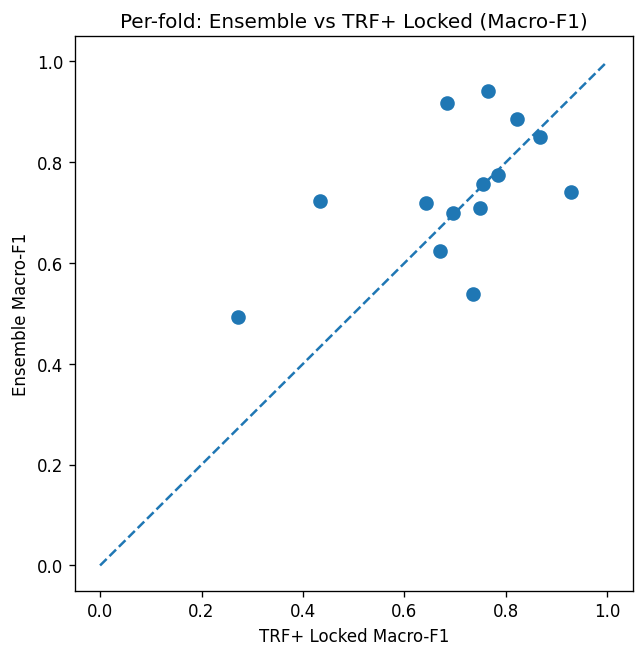

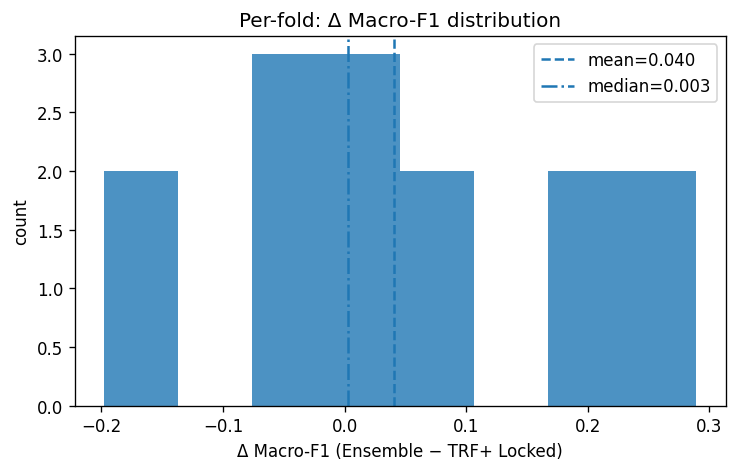

[Wilcoxon] Per-fold (Accuracy): W=57.00, p=0.2108, Δmedian=0.011, Δmean=0.029


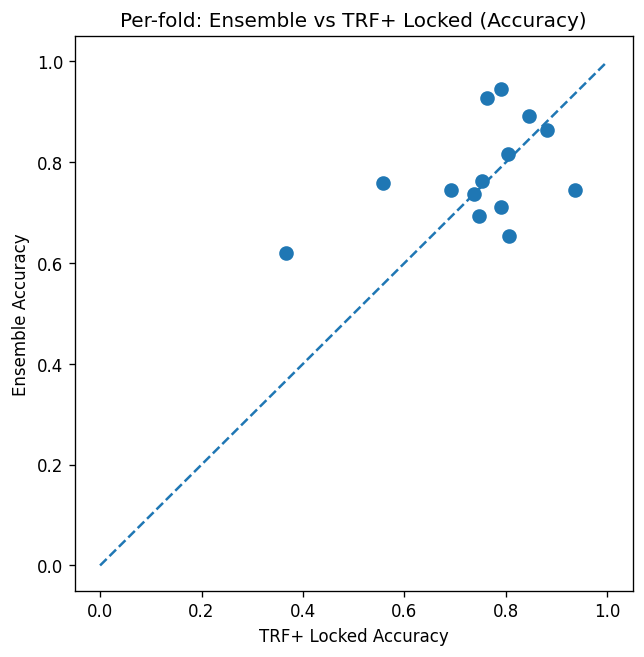

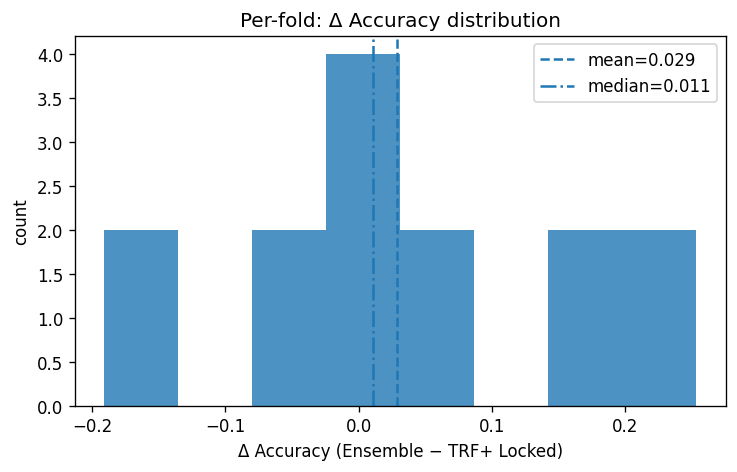

/tmp/ipython-input-474517343.py:148: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([joined["ens_f1"].dropna()], labels=["Ensemble F1"])


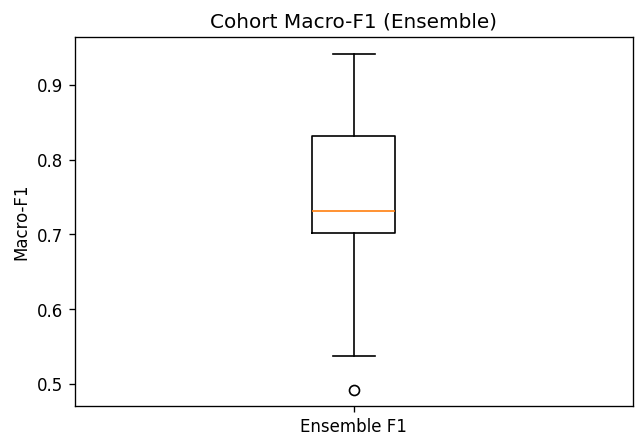

/tmp/ipython-input-474517343.py:154: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([joined["ens_acc"].dropna()], labels=["Ensemble Acc"])


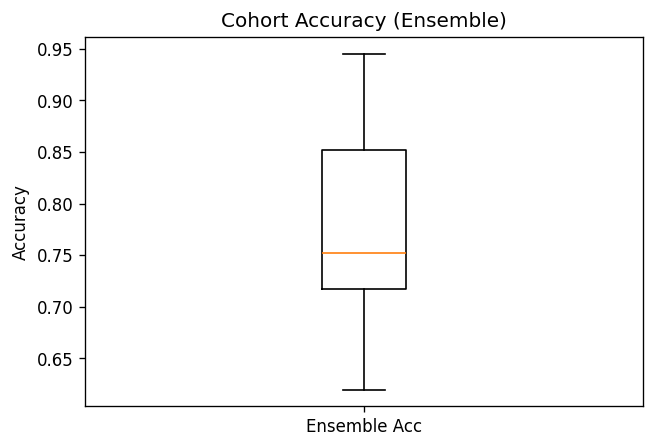

In [ ]:
# Inline plots + nice display
%matplotlib inline
import matplotlib.pyplot as plt
plt.rcParams["figure.dpi"] = 120

import os, re, glob
from pathlib import Path
import numpy as np
import pandas as pd
from IPython.display import display

try:
    from scipy.stats import wilcoxon
    HAVE_SCIPY = True
except Exception:
    HAVE_SCIPY = False

# ---------- Locate your project root ----------
ROOTS_TO_TRY = [
    "/content/wesad",
    "/content/drive/MyDrive/colab_checkpoints/wesad",
    "/content/drive/MyDrive/wesad",
    "/content/drive/MyDrive/wesad_backup/wesad",
]
proj = next((Path(r) for r in ROOTS_TO_TRY if os.path.isdir(r)), None)
assert proj is not None, f"Could not find project in any of: {ROOTS_TO_TRY}"

TRACK_KEY = "chestdelta20"
ENSEMBLE_DIR = proj / "eval" / f"{TRACK_KEY}_phases_trf_plus_safe_impr_ens_tta"
ens_csv = ENSEMBLE_DIR / "ensemble_tta_loso_summary.csv"
assert ens_csv.exists(), f"Missing ensemble CSV: {ens_csv}"

print(f"[OK] Project root: {proj}")
print(f"[OK] Ensemble CSV: {ens_csv}")

# ---------- Load ensemble summary ----------
dfE = pd.read_csv(ens_csv).sort_values("fold")
base = dfE[["fold","test_subject","acc","f1_macro"]].rename(columns={"acc":"ens_acc","f1_macro":"ens_f1"})

# ---------- Try to load per-seed CSVs (produced earlier helper) ----------
seed_files = list(ENSEMBLE_DIR.glob("seed*_tta_loso_summary.csv"))
seeds = []
for p in seed_files:
    m = re.search(r"seed(\d+)_tta_loso_summary\.csv$", p.name)
    if m: seeds.append(int(m.group(1)))
seeds = sorted(seeds)
if seeds:
    print(f"[OK] Found seed CSVs for seeds: {seeds}")
else:
    print("[WARN] No per-seed CSVs found in:", ENSEMBLE_DIR)
    print("       Will try locked TRF+ baseline instead.")

# ---------- Merge per-fold table (ensemble vs seeds or baseline) ----------
joined = base.copy()

# Add seeds if present
for s in seeds:
    dfS = pd.read_csv(ENSEMBLE_DIR/f"seed{s}_tta_loso_summary.csv").sort_values("fold")
    dfS = dfS[["fold","test_subject","acc","f1_macro"]].rename(columns={"acc":f"acc_{s}", "f1_macro":f"f1_{s}"})
    joined = joined.merge(dfS, on=["fold","test_subject"], how="left")

# If no seeds, try locked baseline for comparison
baseline_csv = proj / "eval" / f"{TRACK_KEY}_phases_trf_plus_safe_impr_locked" / "trf_plus_safe_impr_loso_summary.csv"
have_baseline = baseline_csv.exists()
if not seeds and have_baseline:
    dfB = pd.read_csv(baseline_csv).sort_values("fold")
    dfB = dfB[["fold","test_subject","acc","f1_macro"]].rename(columns={"acc":"acc_base", "f1_macro":"f1_base"})
    joined = joined.merge(dfB, on=["fold","test_subject"], how="left")
    print(f"[OK] Using locked baseline for comparison: {baseline_csv}")

# Show the table in output
cols = ["fold","test_subject","ens_acc","ens_f1"]
if seeds:
    for s in seeds:
        cols += [f"acc_{s}", f"f1_{s}"]
elif have_baseline:
    cols += ["acc_base","f1_base"]

print("\n=== Per-fold summary (displayed) ===")
display(joined[cols].sort_values("fold"))

# ---------- Stats + Plots ----------
def scatter_and_hist(y_ref, y_new, label_ref, label_new, title_prefix, metric_name):
    """Draw scatter (new vs ref) and histogram of deltas (new - ref)."""
    # Drop rows with NaNs on either series
    valid = (~y_ref.isna()) & (~y_new.isna())
    y_ref = y_ref[valid]
    y_new = y_new[valid]
    if len(y_ref) == 0:
        print(f"[SKIP] No valid rows for {metric_name} {title_prefix}.")
        return

    # Wilcoxon on paired differences (new - ref)
    diffs = (y_new - y_ref)
    if HAVE_SCIPY and len(diffs) > 0:
        try:
            stat, p = wilcoxon(diffs, alternative="greater")
            print(f"[Wilcoxon] {title_prefix} ({metric_name}): W={stat:.2f}, p={p:.4g}, "
                  f"Δmedian={diffs.median():.3f}, Δmean={diffs.mean():.3f}")
        except Exception as e:
            print(f"[Wilcoxon] Error: {e}")

    # Scatter
    plt.figure(figsize=(6,6))
    plt.scatter(y_ref, y_new, s=60)
    mn, mx = 0, 1
    plt.plot([mn,mx],[mn,mx], ls="--")
    plt.xlabel(f"{label_ref} {metric_name}")
    plt.ylabel(f"{label_new} {metric_name}")
    plt.title(f"{title_prefix}: {label_new} vs {label_ref} ({metric_name})")
    plt.show()

    # Histogram of deltas
    plt.figure(figsize=(7,4))
    plt.hist(diffs, bins=8, alpha=0.8)
    plt.axvline(diffs.mean(), ls="--", label=f"mean={diffs.mean():.3f}")
    plt.axvline(diffs.median(), ls="-.", label=f"median={diffs.median():.3f}")
    plt.xlabel(f"Δ {metric_name} ({label_new} − {label_ref})")
    plt.ylabel("count")
    plt.title(f"{title_prefix}: Δ {metric_name} distribution")
    plt.legend()
    plt.show()

# Case A: Seeds exist — compare Ensemble vs BestSeed
if seeds:
    seed_f1_cols  = [f"f1_{s}"  for s in seeds if f"f1_{s}"  in joined.columns]
    seed_acc_cols = [f"acc_{s}" for s in seeds if f"acc_{s}" in joined.columns]
    if seed_f1_cols:
        joined["best_seed_f1"]  = joined[seed_f1_cols].max(axis=1)
        scatter_and_hist(joined["best_seed_f1"], joined["ens_f1"],
                         "Best Seed", "Ensemble", "Per-fold", "Macro-F1")
    if seed_acc_cols:
        joined["best_seed_acc"] = joined[seed_acc_cols].max(axis=1)
        scatter_and_hist(joined["best_seed_acc"], joined["ens_acc"],
                         "Best Seed", "Ensemble", "Per-fold", "Accuracy")

# Case B: No seeds — compare Ensemble vs Locked Baseline (if available)
elif have_baseline:
    scatter_and_hist(joined["f1_base"], joined["ens_f1"],
                     "TRF+ Locked", "Ensemble", "Per-fold", "Macro-F1")
    scatter_and_hist(joined["acc_base"], joined["ens_acc"],
                     "TRF+ Locked", "Ensemble", "Per-fold", "Accuracy")
else:
    print("[INFO] Only ensemble metrics available — nothing to compare against, so no scatter/hist drawn.")

# Cohort-level bars/box (always draw something):
plt.figure(figsize=(6,4))
plt.boxplot([joined["ens_f1"].dropna()], labels=["Ensemble F1"])
plt.title("Cohort Macro-F1 (Ensemble)")
plt.ylabel("Macro-F1")
plt.show()

plt.figure(figsize=(6,4))
plt.boxplot([joined["ens_acc"].dropna()], labels=["Ensemble Acc"])
plt.title("Cohort Accuracy (Ensemble)")
plt.ylabel("Accuracy")
plt.show()


wrist tranfer

Found summaries:
 - /content/drive/MyDrive/colab_checkpoints/wesad/eval/wristdelta20_phases_conv/phase_conv_loso_summary.csv
 - /content/drive/MyDrive/colab_checkpoints/wesad/eval/wristdelta20_phases_conv_ab/phase_conv_loso_summary.csv
 - /content/drive/MyDrive/colab_checkpoints/wesad/eval/wristdelta20_phases_conv_impr/phase_conv_loso_summary.csv
 - /content/drive/MyDrive/colab_checkpoints/wesad/eval/wristdelta20_phases_trf_plus_safe_impr_locked/trf_plus_safe_impr_loso_summary.csv
 - /content/drive/MyDrive/colab_checkpoints/wesad/eval/wristdelta20_phases_trf_plus_safe_impr_transfer/trf_plus_safe_transfer_loso_summary.csv
 - /content/drive/MyDrive/colab_checkpoints/wesad/eval/wristdelta20_phases_trf_plus_safe_impr_transfer_v2/trf_plus_safe_transfer_loso_summary.csv


In [ ]:
from pathlib import Path
import pandas as pd
import numpy as np

# point at your eval root on Drive
EVAL_ROOT = Path("/content/drive/MyDrive/colab_checkpoints/wesad/eval")

# auto-discover wrist delta20 summaries
candidates = [
    *EVAL_ROOT.rglob("*wristdelta20*/*summary*.csv"),
    *EVAL_ROOT.rglob("*wristdelta20*/*loso*summary*.csv"),
    *EVAL_ROOT.rglob("*wristdelta20*/*_loso_summary.csv"),
]

print("Found CSVs:")
for p in candidates: print(" -", p)

# load & standardize
records, skipped = [], []
for p in candidates:
    try:
        df = pd.read_csv(p)
    except Exception as e:
        skipped.append(f"{p} (read error: {e})")
        continue

    # normalize column names
    if "acc" not in df.columns:
        for cand in ["raw_acc","test_acc","accuracy","acc_mean"]:
            if cand in df.columns: df = df.rename(columns={cand:"acc"}); break
    if "f1_macro" not in df.columns:
        for cand in ["raw_f1_macro","test_f1_macro","f1","macro_f1","f1_mean"]:
            if cand in df.columns: df = df.rename(columns={cand:"f1_macro"}); break

    need = {"fold","test_subject","acc","f1_macro"}
    if not need.issubset(df.columns):
        skipped.append(f"{p} (missing {need - set(df.columns)})")
        continue

    proto = p.parent.name  # short protocol tag from folder name
    tmp = df[["fold","test_subject","acc","f1_macro"]].copy()
    tmp["protocol"] = proto
    records.append(tmp)

assert records, f"No parsable CSVs. Skipped:\n" + "\n".join(skipped)

tidy = pd.concat(records, ignore_index=True).sort_values(["protocol","fold"]).reset_index(drop=True)
print("\nTidy shape:", tidy.shape)
tidy.head()


Found CSVs:
 - /content/drive/MyDrive/colab_checkpoints/wesad/eval/wristdelta20_phases_conv/phase_conv_loso_summary.csv
 - /content/drive/MyDrive/colab_checkpoints/wesad/eval/wristdelta20_phases_conv_impr/phase_conv_loso_summary.csv
 - /content/drive/MyDrive/colab_checkpoints/wesad/eval/wristdelta20_phases_conv_ab/phase_conv_loso_summary.csv
 - /content/drive/MyDrive/colab_checkpoints/wesad/eval/wristdelta20_phases_trf_plus_safe_impr_locked/trf_plus_safe_impr_loso_summary.csv
 - /content/drive/MyDrive/colab_checkpoints/wesad/eval/wristdelta20_phases_trf_plus_safe_impr_transfer/trf_plus_safe_transfer_loso_summary.csv
 - /content/drive/MyDrive/colab_checkpoints/wesad/eval/wristdelta20_phases_trf_plus_safe_impr_transfer_v2/trf_plus_safe_transfer_loso_summary.csv
 - /content/drive/MyDrive/colab_checkpoints/wesad/eval/wristdelta20_phases_conv/phase_conv_loso_summary.csv
 - /content/drive/MyDrive/colab_checkpoints/wesad/eval/wristdelta20_phases_conv_impr/phase_conv_loso_summary.csv
 - /conte

,fold,test_subject,acc,f1_macro,protocol
0,1,S10,0.516484,0.344661,wristdelta20_phases_conv
1,1,S10,0.516484,0.344661,wristdelta20_phases_conv
2,1,S10,0.516484,0.344661,wristdelta20_phases_conv
3,2,S11,0.734104,0.494157,wristdelta20_phases_conv
4,2,S11,0.734104,0.494157,wristdelta20_phases_conv


In [ ]:
# per-fold wide table (F1 + Acc)
wide_f1  = tidy.pivot_table(index=["fold","test_subject"], columns="protocol", values="f1_macro", aggfunc="first").reset_index()
wide_acc = tidy.pivot_table(index=["fold","test_subject"], columns="protocol", values="acc",       aggfunc="first").reset_index()
per_fold = wide_f1.merge(wide_acc, on=["fold","test_subject"], suffixes=("_f1","_acc"))

# order columns as fold, subject, then protocol pairs
base_cols = ["fold","test_subject"]
protos = sorted({c.rsplit("_",1)[0] for c in per_fold.columns if c not in base_cols})
ordered = base_cols[:]
for p in protos:
    if p+"_f1"  in per_fold.columns: ordered.append(p+"_f1")
    if p+"_acc" in per_fold.columns: ordered.append(p+"_acc")
per_fold = per_fold[ordered]

from IPython.display import display
display(per_fold.head(20))

# cohort stats helper
def cohort_stats(metric):
    rows=[]
    for prot, grp in tidy.groupby("protocol"):
        x = grp[metric].dropna().to_numpy()
        if x.size == 0: continue
        rows.append({
            "protocol": prot,
            "n_folds": int(x.size),
            f"{metric}_mean": float(x.mean()),
            f"{metric}_std":  float(x.std(ddof=1)) if x.size>1 else np.nan,
            f"{metric}_min":  float(x.min()),
            f"{metric}_25%":  float(np.quantile(x,0.25)),
            f"{metric}_50%":  float(np.median(x)),
            f"{metric}_75%":  float(np.quantile(x,0.75)),
            f"{metric}_max":  float(x.max()),
        })
    return pd.DataFrame(rows).sort_values("protocol")

stats_f1  = cohort_stats("f1_macro")
stats_acc = cohort_stats("acc")
cohort = stats_f1.merge(stats_acc, on=["protocol","n_folds"], how="outer")

display(cohort)


protocol,fold,test_subject,wristdelta20_phases_conv_f1,wristdelta20_phases_conv_acc,wristdelta20_phases_conv_ab_f1,wristdelta20_phases_conv_ab_acc,wristdelta20_phases_conv_impr_f1,wristdelta20_phases_conv_impr_acc,wristdelta20_phases_trf_plus_safe_impr_locked_f1,wristdelta20_phases_trf_plus_safe_impr_locked_acc,wristdelta20_phases_trf_plus_safe_impr_transfer_f1,wristdelta20_phases_trf_plus_safe_impr_transfer_acc,wristdelta20_phases_trf_plus_safe_impr_transfer_v2_f1,wristdelta20_phases_trf_plus_safe_impr_transfer_v2_acc
0,1,S10,0.344661,0.516484,0.280001,0.417582,0.111658,0.186813,0.010811,0.016484,0.415303,0.626374,0.010811,0.016484
1,2,S11,0.494157,0.734104,0.511823,0.786127,0.383368,0.421965,0.007619,0.011561,0.559458,0.699422,0.007619,0.011561
2,3,S13,0.406679,0.530055,0.357310,0.502732,0.030303,0.021858,0.007207,0.010929,0.354739,0.530055,0.104960,0.153005
3,4,S14,0.269608,0.601093,0.312552,0.584699,0.237879,0.404372,0.000000,0.000000,0.261438,0.218579,0.000000,0.000000
4,5,S15,0.325151,0.660920,0.351190,0.689655,0.058145,0.045977,0.011299,0.017241,0.250046,0.436782,0.512563,0.793103
5,6,S16,0.250000,0.596774,0.250559,0.602151,0.158396,0.274194,0.010582,0.016129,0.336084,0.591398,0.010582,0.016129
6,7,S17,0.499647,0.780612,0.509501,0.790816,0.180174,0.214286,0.150036,0.219388,0.598631,0.729592,0.293333,0.785714
7,8,S2,0.239622,0.343284,0.203873,0.298507,0.155419,0.189055,0.244439,0.373134,0.537054,0.686567,0.712720,0.885572
8,9,S3,0.454279,0.813953,0.475894,0.818605,0.138621,0.125581,0.242454,0.372093,0.290464,0.772093,0.273973,0.697674
9,10,S4,0.528334,0.821596,0.566165,0.873239,0.093083,0.103286,0.027027,0.042254,0.291005,0.774648,0.116322,0.197183


,protocol,n_folds,f1_macro_mean,f1_macro_std,f1_macro_min,f1_macro_25%,f1_macro_50%,f1_macro_75%,f1_macro_max,acc_mean,acc_std,acc_min,acc_25%,acc_50%,acc_75%,acc_max
0,wristdelta20_phases_conv,45,0.359939,0.098279,0.228146,0.268966,0.343735,0.454279,0.528334,0.633590,0.129376,0.343284,0.530055,0.618357,0.735043,0.821596
1,wristdelta20_phases_conv_ab,45,0.368331,0.118305,0.203873,0.250559,0.351190,0.481738,0.566165,0.630512,0.155092,0.298507,0.512821,0.608696,0.786127,0.873239
2,wristdelta20_phases_conv_impr,45,0.191701,0.115855,0.030303,0.093893,0.158396,0.278085,0.423977,0.217767,0.127473,0.021858,0.104972,0.189055,0.341880,0.421965
3,wristdelta20_phases_trf_plus_safe_impr_locked,45,0.055404,0.082775,0.000000,0.007619,0.011364,0.054902,0.244439,0.084597,0.125898,0.000000,0.011561,0.017341,0.089744,0.373134
4,wristdelta20_phases_trf_plus_safe_impr_transfer,45,0.454582,0.166452,0.250046,0.290464,0.415303,0.598631,0.708891,0.659056,0.176924,0.218579,0.530055,0.688034,0.774648,0.900552
5,wristdelta20_phases_trf_plus_safe_impr_transfe...,45,0.204735,0.212454,0.000000,0.010811,0.116322,0.293333,0.712720,0.335007,0.333570,0.000000,0.016484,0.166667,0.723757,0.885572


[OK] /content/drive/MyDrive/colab_checkpoints/wesad/eval/wristdelta20_phases_trf_plus_safe_impr_transfer/trf_plus_safe_transfer_loso_summary.csv -> 15 folds
[OK] /content/drive/MyDrive/colab_checkpoints/wesad/eval/wristdelta20_phases_trf_plus_safe_impr_transfer_v2/trf_plus_safe_transfer_loso_summary.csv -> 15 folds
[saved] /content/drive/MyDrive/colab_checkpoints/wesad/eval/figs_all_models/wrist_transfer/wrist_transfer_perfold_f1_acc.csv
[saved] /content/drive/MyDrive/colab_checkpoints/wesad/eval/figs_all_models/wrist_transfer/wrist_transfer_summary_stats.csv


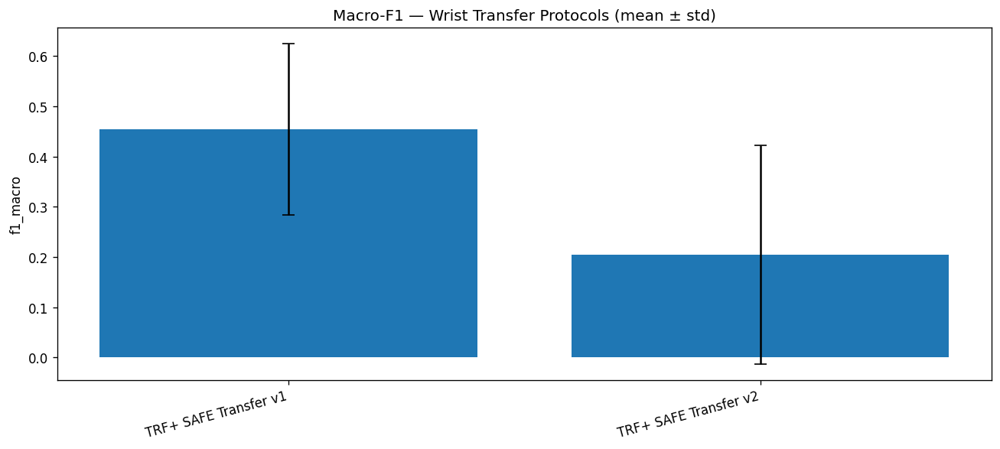

[saved] /content/drive/MyDrive/colab_checkpoints/wesad/eval/figs_all_models/wrist_transfer/bar_f1_meanstd_wrist_transfer.png


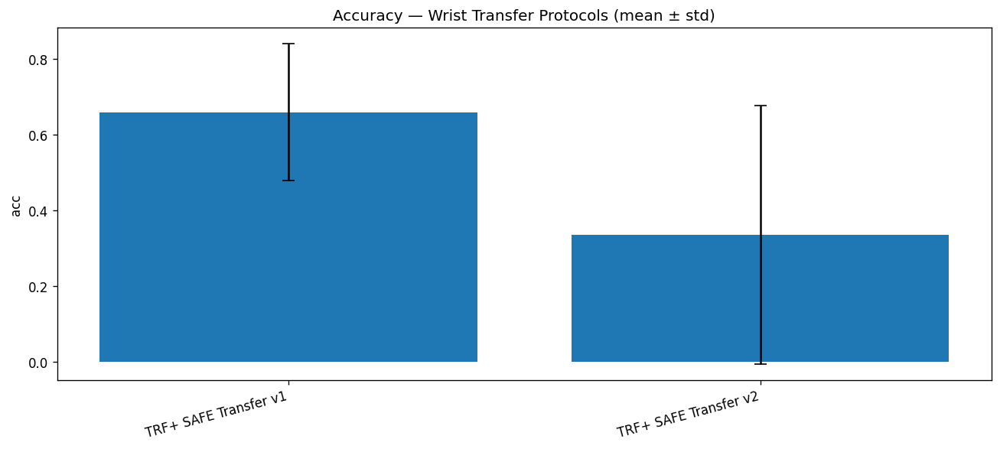

[saved] /content/drive/MyDrive/colab_checkpoints/wesad/eval/figs_all_models/wrist_transfer/bar_acc_meanstd_wrist_transfer.png


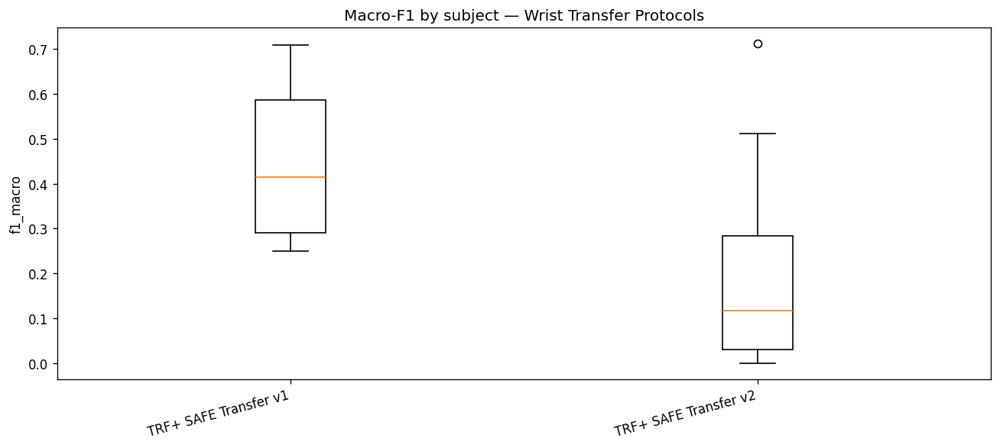

[saved] /content/drive/MyDrive/colab_checkpoints/wesad/eval/figs_all_models/wrist_transfer/box_f1_wrist_transfer.png


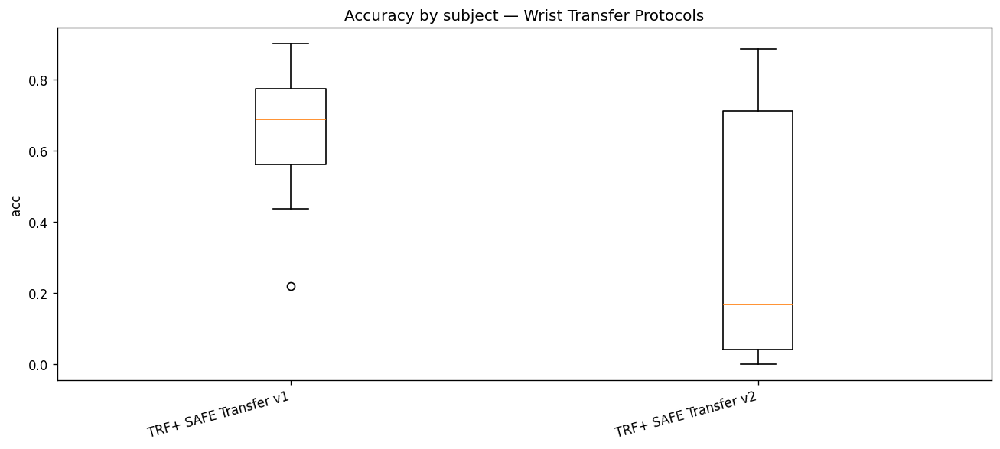

[saved] /content/drive/MyDrive/colab_checkpoints/wesad/eval/figs_all_models/wrist_transfer/box_acc_wrist_transfer.png
[saved] /content/drive/MyDrive/colab_checkpoints/wesad/eval/figs_all_models/wrist_transfer/outliers_f1_lt_0p2.csv


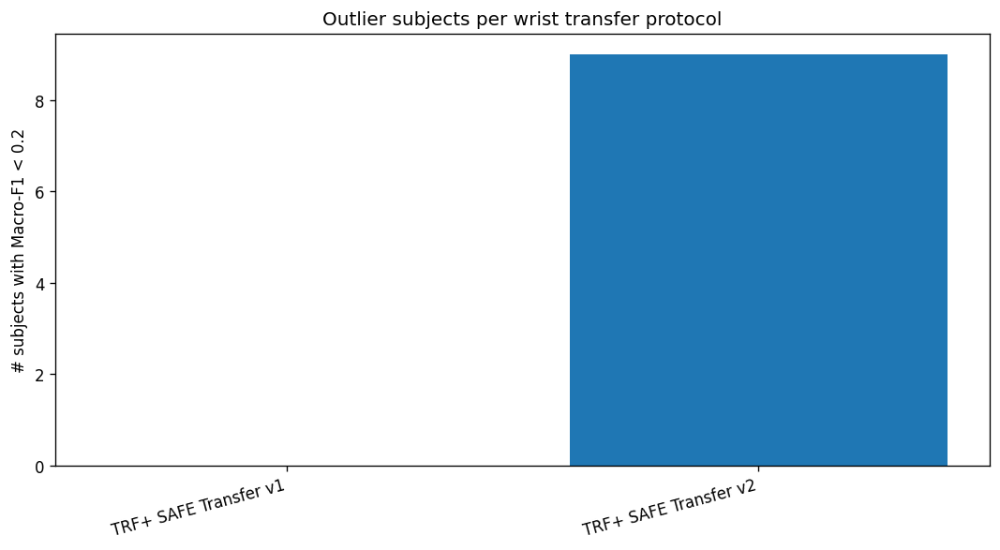

[saved] /content/drive/MyDrive/colab_checkpoints/wesad/eval/figs_all_models/wrist_transfer/bar_outlier_subject_counts.png


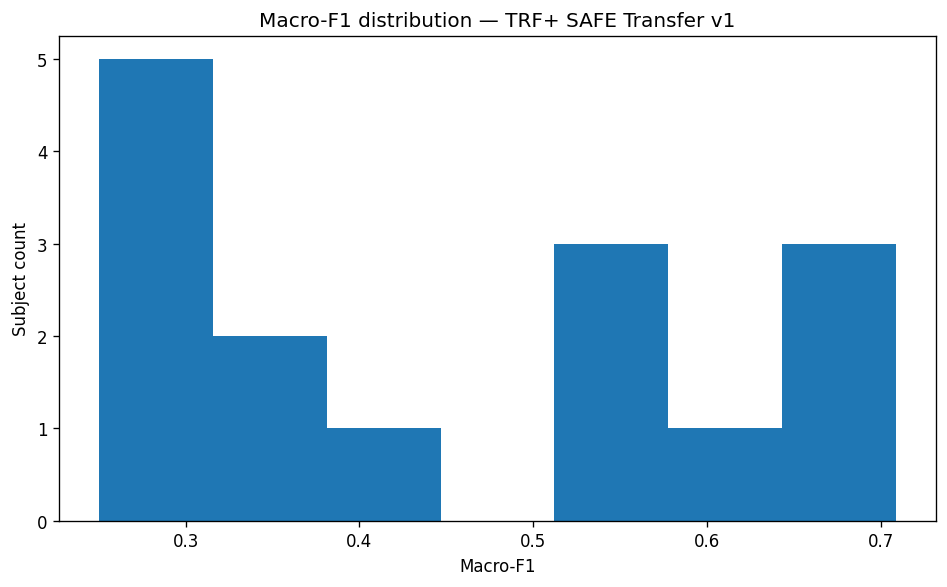

[saved] /content/drive/MyDrive/colab_checkpoints/wesad/eval/figs_all_models/wrist_transfer/hist_f1_TRF+_SAFE_Transfer_v1.png


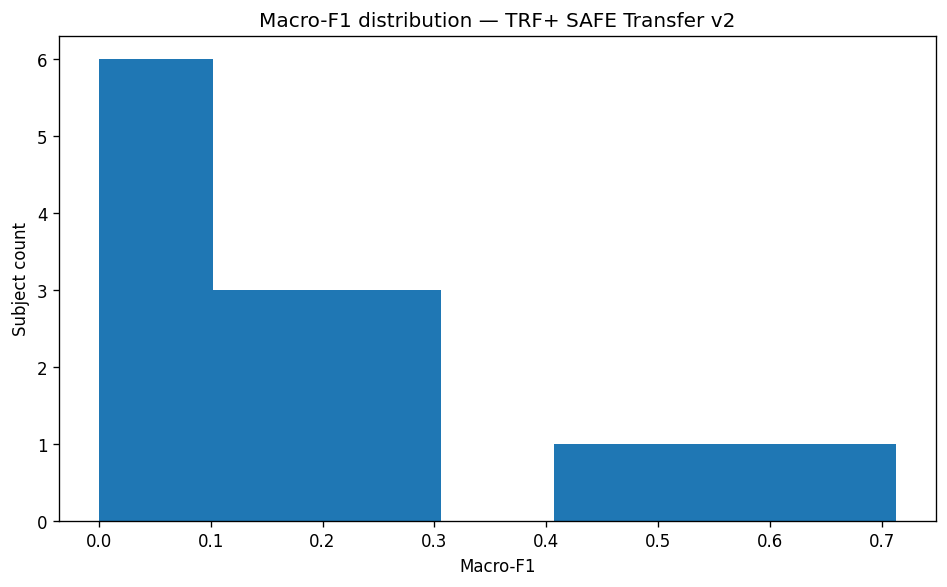

[saved] /content/drive/MyDrive/colab_checkpoints/wesad/eval/figs_all_models/wrist_transfer/hist_f1_TRF+_SAFE_Transfer_v2.png


In [ ]:
# === Wrist Transfer Protocols: Summaries + Plots + Outlier Highlights ===
# Reuses: FIG_ROOT
import os, glob
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from pathlib import Path

OUT = (FIG_ROOT / "wrist_transfer"); OUT.mkdir(parents=True, exist_ok=True)

# ---- 1) Find available transfer protocol summary CSVs ----
CANDIDATE_FILES = [
    "/content/wesad/eval/**/trf_plus_safe_transfer_loso_summary.csv",
    "/content/drive/MyDrive/colab_checkpoints/wesad/eval/**/trf_plus_safe_transfer_loso_summary.csv",
]
found = []
for pat in CANDIDATE_FILES:
    found.extend(sorted(glob.glob(pat, recursive=True)))

if not found:
    raise SystemExit("No wrist transfer summaries found. Make sure *_transfer*/trf_plus_safe_transfer_loso_summary.csv exists.")

# Optional: map folder names to pretty config titles
def pretty_name_from_path(fp: str) -> str:
    # e.g., ".../wristdelta20_phases_trf_plus_safe_impr_transfer_v2/trf_plus_safe_transfer_loso_summary.csv"
    p = Path(fp)
    exp = p.parent.name  # folder right above the CSV
    # Simple prettifier
    name = (exp
            .replace("wristdelta20_", "")
            .replace("phases_", "")
            .replace("_", " ")
            .strip())
    # Shortcuts for common variants
    name = name.replace("trf plus safe impr transfer v2", "TRF+ SAFE Transfer v2")
    name = name.replace("trf plus safe impr transfer", "TRF+ SAFE Transfer v1")
    return name

# ---- 2) Read and normalize each summary ----
def read_transfer_summary(fp: str) -> pd.DataFrame:
    df = pd.read_csv(fp)
    # ensure fold exists and integer
    if "fold" not in df.columns:
        # assume LOSO: 1..N if not provided
        df["fold"] = np.arange(1, len(df) + 1)
    # normalize metric columns (smoothed preferred)
    def pick(colnames):
        for c in colnames:
            if c in df.columns:
                return c
        return None
    acc_col = pick(["acc", "accuracy"])
    f1_col  = pick(["f1_macro", "macro_f1", "f1"])
    raw_acc_col = pick(["raw_acc", "raw_accuracy"])
    raw_f1_col  = pick(["raw_f1_macro", "raw_macro_f1", "raw_f1"])
    out = pd.DataFrame({
        "fold": pd.to_numeric(df["fold"], errors="coerce").astype(int),
        "acc": pd.to_numeric(df[acc_col], errors="coerce") if acc_col else np.nan,
        "f1_macro": pd.to_numeric(df[f1_col], errors="coerce") if f1_col else np.nan,
        "raw_acc": pd.to_numeric(df[raw_acc_col], errors="coerce") if raw_acc_col else np.nan,
        "raw_f1_macro": pd.to_numeric(df[raw_f1_col], errors="coerce") if raw_f1_col else np.nan,
    })
    return out

rows = []
for fp in found:
    try:
        df = read_transfer_summary(fp)
        if df.empty:
            continue
        df.insert(0, "config", pretty_name_from_path(fp))
        df.insert(1, "source_path", fp)
        rows.append(df)
        print(f"[OK] {fp} -> {df.shape[0]} folds")
    except Exception as e:
        print(f"[WARN] Skipped {fp} ({e})")

if not rows:
    raise SystemExit("Found files but none could be parsed into per-fold rows.")

perf_transfer = pd.concat(rows, ignore_index=True)

# Save tidy per-fold table
perfold_csv = OUT / "wrist_transfer_perfold_f1_acc.csv"
perf_transfer.to_csv(perfold_csv, index=False)
print(f"[saved] {perfold_csv}")

# ---- 3) Performance summaries (mean, std, quartiles, min/max) ----
def percentiles(s: pd.Series) -> pd.Series:
    return pd.Series({
        "count": s.count(),
        "mean": s.mean(),
        "std": s.std(),
        "min": s.min(),
        "q1": s.quantile(0.25),
        "median": s.quantile(0.50),
        "q3": s.quantile(0.75),
        "max": s.max()
    })

summary_acc = perf_transfer.dropna(subset=["acc"]).groupby("config")["acc"].apply(percentiles).unstack()
summary_f1  = perf_transfer.groupby("config")["f1_macro"].apply(percentiles).unstack()
summary = pd.concat([summary_acc, summary_f1], axis=1, keys=["acc", "f1_macro"])
summary_csv = OUT / "wrist_transfer_summary_stats.csv"
summary.to_csv(summary_csv)
print(f"[saved] {summary_csv}")

# ---- 4) Plots: bar (mean±std) and boxplots across configs ----
def bar_mean_std(df: pd.DataFrame, metric: str, title: str, outfile: Path):
    g = df.groupby("config")[metric].agg(["mean","std"]).sort_values("mean", ascending=False)
    x = np.arange(len(g))
    plt.figure(figsize=(11,5))
    plt.bar(x, g["mean"].values, yerr=g["std"].values, capsize=5)
    plt.xticks(x, g.index, rotation=15, ha="right")
    plt.ylabel(metric)
    plt.title(title)
    plt.tight_layout()
    plt.savefig(outfile, dpi=200)
    plt.show()
    print(f"[saved] {outfile}")

def boxplot_configs(df: pd.DataFrame, metric: str, title: str, outfile: Path):
    configs = list(df["config"].unique())
    data = [df.loc[df["config"]==c, metric].dropna().values for c in configs]
    plt.figure(figsize=(11,5))
    plt.boxplot(data, tick_labels=configs, showmeans=False)
    plt.ylabel(metric)
    plt.title(title)
    plt.xticks(rotation=15, ha="right")
    plt.tight_layout()
    plt.savefig(outfile, dpi=200)
    plt.show()
    print(f"[saved] {outfile}")

bar_mean_std(perf_transfer, "f1_macro",
             "Macro-F1 — Wrist Transfer Protocols (mean ± std)",
             OUT / "bar_f1_meanstd_wrist_transfer.png")
bar_mean_std(perf_transfer, "acc",
             "Accuracy — Wrist Transfer Protocols (mean ± std)",
             OUT / "bar_acc_meanstd_wrist_transfer.png")

boxplot_configs(perf_transfer, "f1_macro",
                "Macro-F1 by subject — Wrist Transfer Protocols",
                OUT / "box_f1_wrist_transfer.png")
boxplot_configs(perf_transfer, "acc",
                "Accuracy by subject — Wrist Transfer Protocols",
                OUT / "box_acc_wrist_transfer.png")

# ---- 5) Highlight error/outlier trends ----
# Define an outlier threshold on Macro-F1 (adjust as you like)
F1_OUTLIER_THRESH = 0.20
outliers = perf_transfer[perf_transfer["f1_macro"] < F1_OUTLIER_THRESH].copy()
outliers = outliers.sort_values(["config","fold"])
outliers_csv = OUT / f"outliers_f1_lt_{str(F1_OUTLIER_THRESH).replace('.','p')}.csv"
outliers.to_csv(outliers_csv, index=False)
print(f"[saved] {outliers_csv}")

# Bar of outlier counts per config
counts = outliers.groupby("config")["fold"].nunique().reindex(perf_transfer["config"].unique(), fill_value=0)
plt.figure(figsize=(9,5))
plt.bar(counts.index, counts.values)
plt.ylabel(f"# subjects with Macro-F1 < {F1_OUTLIER_THRESH}")
plt.title("Outlier subjects per wrist transfer protocol")
plt.xticks(rotation=15, ha="right")
plt.tight_layout()
fp_out = OUT / "bar_outlier_subject_counts.png"
plt.savefig(fp_out, dpi=200)
plt.show()
print(f"[saved] {fp_out}")

# Optional: per-config histograms of Macro-F1 (one figure per config)
for cfg in perf_transfer["config"].unique():
    sub = perf_transfer[perf_transfer["config"]==cfg]["f1_macro"].dropna()
    if sub.empty:
        continue
    plt.figure(figsize=(8,5))
    plt.hist(sub.values, bins=min(10, max(5, sub.size // 2)))
    plt.xlabel("Macro-F1")
    plt.ylabel("Subject count")
    plt.title(f"Macro-F1 distribution — {cfg}")
    plt.tight_layout()
    fp_hist = OUT / f"hist_f1_{cfg.replace(' ','_')}.png"
    plt.savefig(fp_hist, dpi=200)
    plt.show()
    print(f"[saved] {fp_hist}")


== Discovered protocol summaries ==
 - TRF+ SAFE Transfer v1: /content/drive/MyDrive/colab_checkpoints/wesad/eval/wristdelta20_phases_trf_plus_safe_impr_transfer/trf_plus_safe_transfer_loso_summary.csv  (15 folds)
 - TRF+ SAFE Transfer v2: /content/drive/MyDrive/colab_checkpoints/wesad/eval/wristdelta20_phases_trf_plus_safe_impr_transfer_v2/trf_plus_safe_transfer_loso_summary.csv  (15 folds)

[saved] /content/drive/MyDrive/colab_checkpoints/wesad/eval/figs_all_models/wrist_transfer/wrist_transfer_perfold_f1_acc.csv
[saved] /content/drive/MyDrive/colab_checkpoints/wesad/eval/figs_all_models/wrist_transfer/wrist_transfer_summary_stats.csv

== Per-protocol summary (smoothed metrics) ==

TRF+ SAFE Transfer v1
  Macro-F1  mean±std: 0.4546 ± 0.1704  | q1/med/q3: 0.2907 / 0.4153 / 0.5871  | min/max: 0.2500 / 0.7089  | n=15
  Accuracy  mean±std: 0.6591 ± 0.1811  | q1/med/q3: 0.5607 / 0.6880 / 0.7734  | min/max: 0.2186 / 0.9006  | n=15

TRF+ SAFE Transfer v2
  Macro-F1  mean±std: 0.2047 ± 0.217

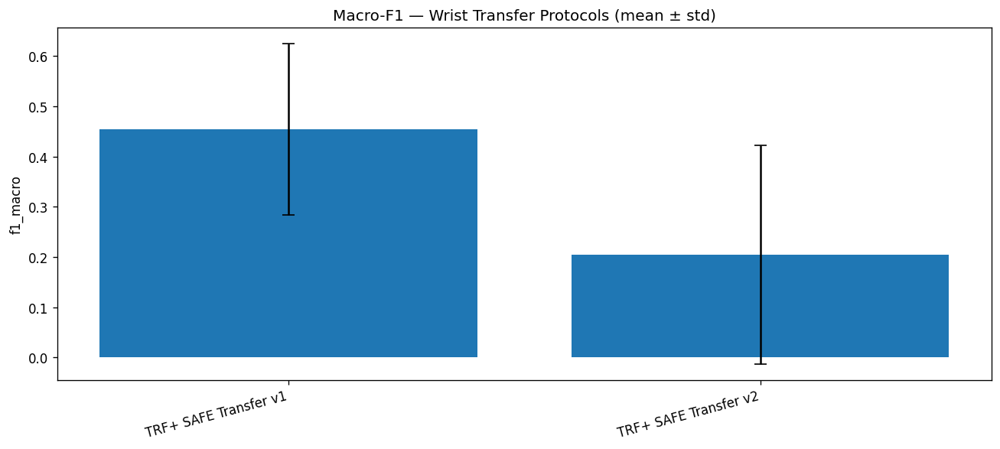

[saved] /content/drive/MyDrive/colab_checkpoints/wesad/eval/figs_all_models/wrist_transfer/bar_f1_meanstd_wrist_transfer.png

Bar values (mean ± std):
 - TRF+ SAFE Transfer v1: 0.4546 ± 0.1704
 - TRF+ SAFE Transfer v2: 0.2047 ± 0.2175


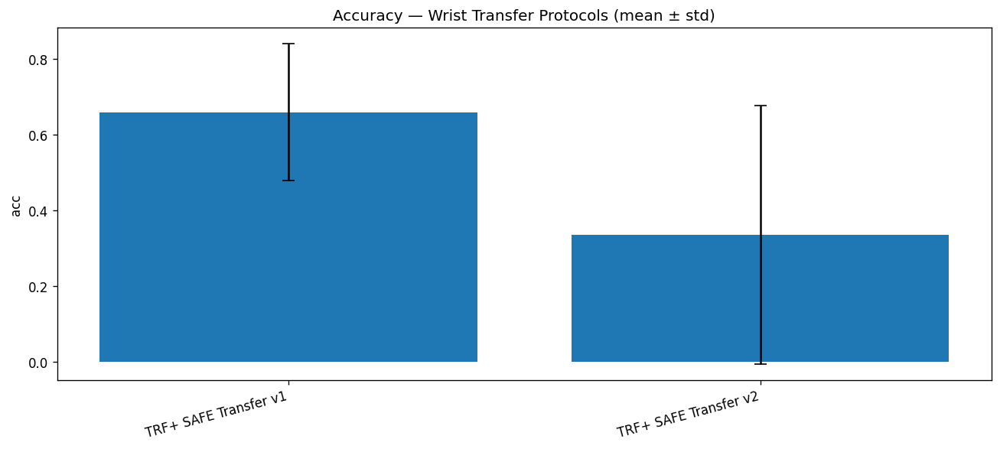

[saved] /content/drive/MyDrive/colab_checkpoints/wesad/eval/figs_all_models/wrist_transfer/bar_acc_meanstd_wrist_transfer.png

Bar values (mean ± std):
 - TRF+ SAFE Transfer v1: 0.6591 ± 0.1811
 - TRF+ SAFE Transfer v2: 0.3350 ± 0.3414


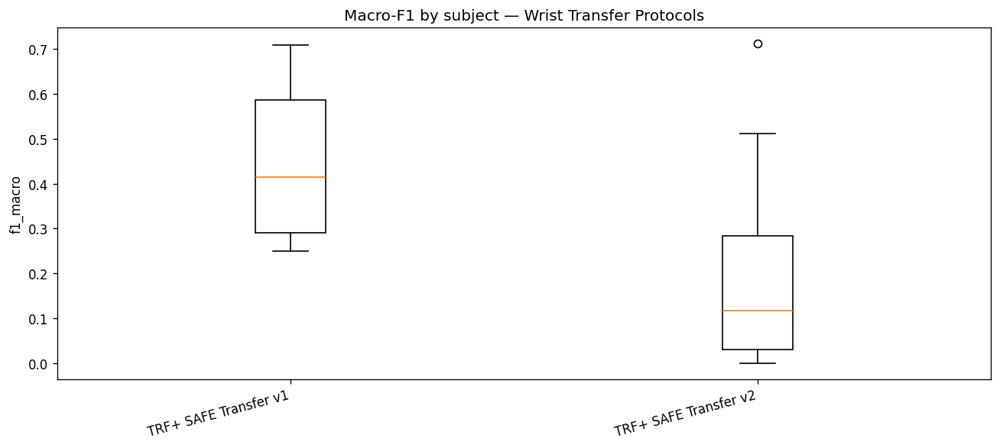

[saved] /content/drive/MyDrive/colab_checkpoints/wesad/eval/figs_all_models/wrist_transfer/box_f1_wrist_transfer.png

Boxplot quartiles (per config):
 - TRF+ SAFE Transfer v1: q1=0.2907, median=0.4153, q3=0.5871, min=0.2500, max=0.7089
 - TRF+ SAFE Transfer v2: q1=0.0305, median=0.1163, q3=0.2837, min=0.0000, max=0.7127


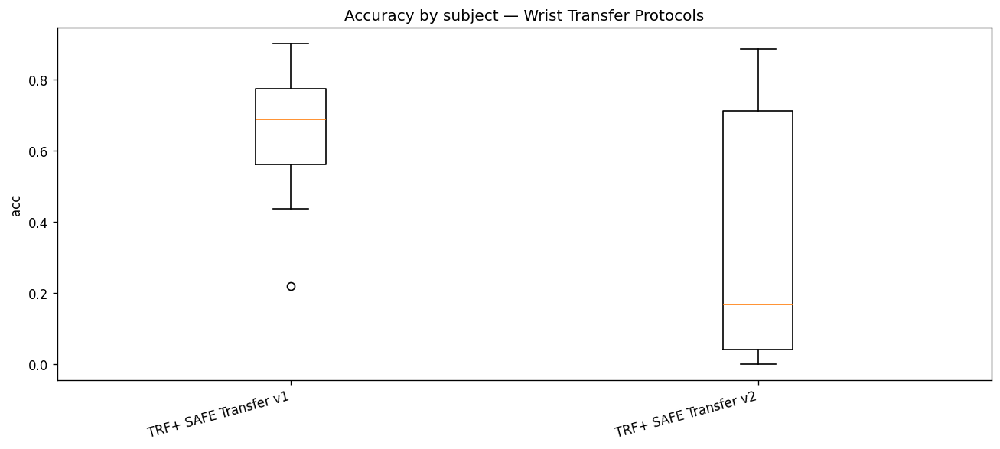

[saved] /content/drive/MyDrive/colab_checkpoints/wesad/eval/figs_all_models/wrist_transfer/box_acc_wrist_transfer.png

Boxplot quartiles (per config):
 - TRF+ SAFE Transfer v1: q1=0.5607, median=0.6880, q3=0.7734, min=0.2186, max=0.9006
 - TRF+ SAFE Transfer v2: q1=0.0400, median=0.1667, q3=0.7107, min=0.0000, max=0.8856

[saved] /content/drive/MyDrive/colab_checkpoints/wesad/eval/figs_all_models/wrist_transfer/outliers_f1_lt_0p2.csv

== Outlier subjects (Macro-F1 < 0.2) ==
 - TRF+ SAFE Transfer v2: 9 subject(s)  | folds: [1, 2, 3, 4, 6, 10, 12, 13, 15]


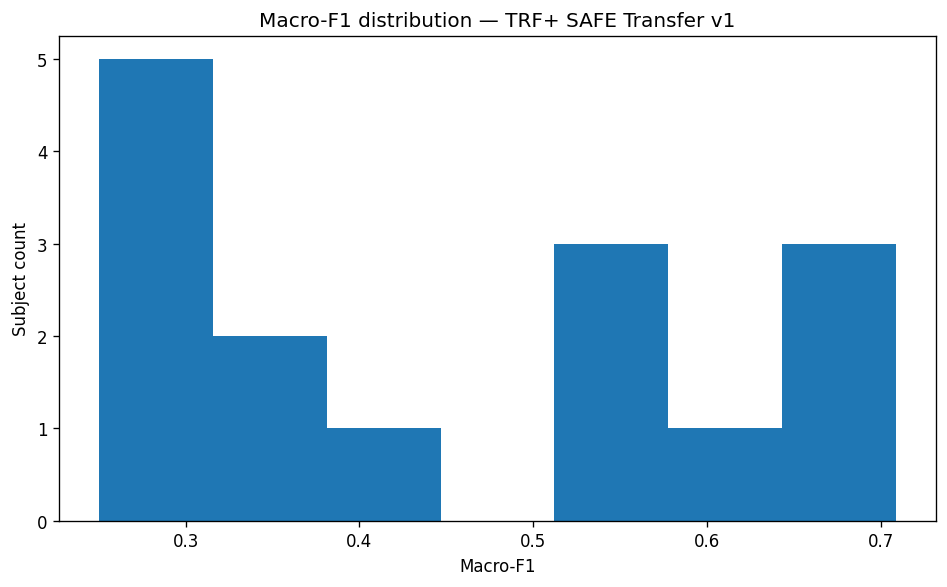

[saved] /content/drive/MyDrive/colab_checkpoints/wesad/eval/figs_all_models/wrist_transfer/hist_f1_TRF+_SAFE_Transfer_v1.png  | mean=0.4546, std=0.1704, q1/med/q3=0.2907/0.4153/0.5871


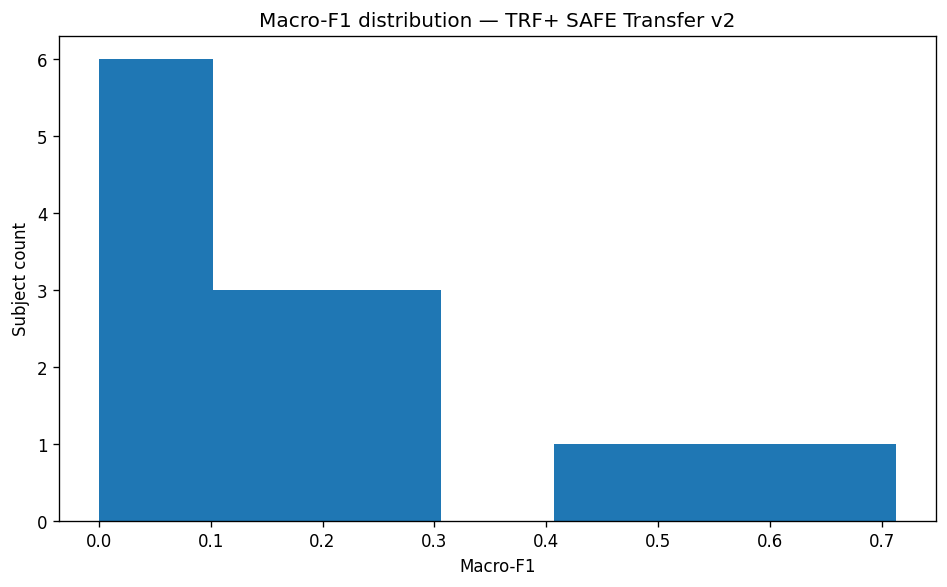

[saved] /content/drive/MyDrive/colab_checkpoints/wesad/eval/figs_all_models/wrist_transfer/hist_f1_TRF+_SAFE_Transfer_v2.png  | mean=0.2047, std=0.2175, q1/med/q3=0.0305/0.1163/0.2837


In [ ]:
# === Wrist Transfer Protocols: Summaries + Plots + Outlier Highlights (with printed stats) ===
# Reuses: FIG_ROOT
import os, glob
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from pathlib import Path

OUT = (FIG_ROOT / "wrist_transfer"); OUT.mkdir(parents=True, exist_ok=True)

# ---- 1) Find available transfer protocol summary CSVs ----
CANDIDATE_FILES = [
    "/content/wesad/eval/**/trf_plus_safe_transfer_loso_summary.csv",
    "/content/drive/MyDrive/colab_checkpoints/wesad/eval/**/trf_plus_safe_transfer_loso_summary.csv",
]
found = []
for pat in CANDIDATE_FILES:
    found.extend(sorted(glob.glob(pat, recursive=True)))

if not found:
    raise SystemExit("No wrist transfer summaries found. Expected */trf_plus_safe_transfer_loso_summary.csv")

# Optional: map folder names to pretty config titles
def pretty_name_from_path(fp: str) -> str:
    p = Path(fp)
    exp = p.parent.name  # folder above the CSV
    name = (exp
            .replace("wristdelta20_", "")
            .replace("phases_", "")
            .replace("_", " ")
            .strip())
    name = name.replace("trf plus safe impr transfer v2", "TRF+ SAFE Transfer v2")
    name = name.replace("trf plus safe impr transfer",    "TRF+ SAFE Transfer v1")
    return name

# ---- 2) Read and normalize each summary ----
def read_transfer_summary(fp: str) -> pd.DataFrame:
    df = pd.read_csv(fp)
    if "fold" not in df.columns:
        df["fold"] = np.arange(1, len(df) + 1)

    def pick(cands):
        for c in cands:
            if c in df.columns: return c
        return None

    acc_col     = pick(["acc","accuracy"])
    f1_col      = pick(["f1_macro","macro_f1","f1"])
    raw_acc_col = pick(["raw_acc","raw_accuracy"])
    raw_f1_col  = pick(["raw_f1_macro","raw_macro_f1","raw_f1"])

    return pd.DataFrame({
        "fold": pd.to_numeric(df["fold"], errors="coerce").astype(int),
        "acc": pd.to_numeric(df[acc_col], errors="coerce") if acc_col else np.nan,
        "f1_macro": pd.to_numeric(df[f1_col], errors="coerce") if f1_col else np.nan,
        "raw_acc": pd.to_numeric(df[raw_acc_col], errors="coerce") if raw_acc_col else np.nan,
        "raw_f1_macro": pd.to_numeric(df[raw_f1_col], errors="coerce") if raw_f1_col else np.nan,
    })

rows = []
print("== Discovered protocol summaries ==")
for fp in found:
    try:
        df = read_transfer_summary(fp)
        if df.empty:
            print(" - (empty) ", fp)
            continue
        cfg = pretty_name_from_path(fp)
        df.insert(0, "config", cfg)
        df.insert(1, "source_path", fp)
        rows.append(df)
        print(f" - {cfg}: {fp}  ({df.shape[0]} folds)")
    except Exception as e:
        print(f" - [SKIP] {fp}  ({e})")

if not rows:
    raise SystemExit("Found files but none could be parsed into per-fold rows.")

perf_transfer = pd.concat(rows, ignore_index=True)

# Save tidy per-fold table
perfold_csv = OUT / "wrist_transfer_perfold_f1_acc.csv"
perf_transfer.to_csv(perfold_csv, index=False)
print(f"\n[saved] {perfold_csv}")

# ---- 3) Performance summaries (mean, std, quartiles, min/max) ----
def percentiles(s: pd.Series) -> pd.Series:
    return pd.Series({
        "count": s.count(),
        "mean": s.mean(),
        "std": s.std(),
        "min": s.min(),
        "q1": s.quantile(0.25),
        "median": s.quantile(0.50),
        "q3": s.quantile(0.75),
        "max": s.max()
    })

summary_acc = perf_transfer.dropna(subset=["acc"]).groupby("config")["acc"].apply(percentiles).unstack()
summary_f1  = perf_transfer.groupby("config")["f1_macro"].apply(percentiles).unstack()
summary = pd.concat([summary_acc, summary_f1], axis=1, keys=["acc", "f1_macro"])
summary_csv = OUT / "wrist_transfer_summary_stats.csv"
summary.to_csv(summary_csv)
print(f"[saved] {summary_csv}\n")

# ---- 3b) PRINT key numbers nicely ----
def fmt(v):
    try: return f"{v:.4f}"
    except Exception: return str(v)

print("== Per-protocol summary (smoothed metrics) ==")
rank = summary["f1_macro"]["mean"].sort_values(ascending=False)
for cfg in rank.index:
    a = summary.loc[cfg, "acc"]; f = summary.loc[cfg, "f1_macro"]
    print(f"\n{cfg}")
    print(f"  Macro-F1  mean±std: {fmt(f['mean'])} ± {fmt(f['std'])}  | q1/med/q3: {fmt(f['q1'])} / {fmt(f['median'])} / {fmt(f['q3'])}  | min/max: {fmt(f['min'])} / {fmt(f['max'])}  | n={int(f['count'])}")
    print(f"  Accuracy  mean±std: {fmt(a['mean'])} ± {fmt(a['std'])}  | q1/med/q3: {fmt(a['q1'])} / {fmt(a['median'])} / {fmt(a['q3'])}  | min/max: {fmt(a['min'])} / {fmt(a['max'])}  | n={int(a['count'])}")

print("\n== Ranking by Macro-F1 mean ==")
for i, (cfg, val) in enumerate(rank.items(), 1):
    print(f" {i:>2}. {cfg}: {fmt(val)}")

# ---- 4) Plots: bar (mean±std) and boxplots across configs ----
def bar_mean_std(df: pd.DataFrame, metric: str, title: str, outfile: Path):
    g = df.groupby("config")[metric].agg(["mean","std"]).sort_values("mean", ascending=False)
    x = np.arange(len(g))
    plt.figure(figsize=(11,5))
    plt.bar(x, g["mean"].values, yerr=g["std"].values, capsize=5)
    plt.xticks(x, g.index, rotation=15, ha="right")
    plt.ylabel(metric)
    plt.title(title)
    plt.tight_layout()
    plt.savefig(outfile, dpi=200)
    plt.show()
    print(f"[saved] {outfile}")
    # print numbers under the bar plot
    print("\nBar values (mean ± std):")
    for name, row in g.iterrows():
        print(f" - {name}: {fmt(row['mean'])} ± {fmt(row['std'])}")

def boxplot_configs(df: pd.DataFrame, metric: str, title: str, outfile: Path):
    configs = list(df["config"].unique())
    data = [df.loc[df["config"]==c, metric].dropna().values for c in configs]
    plt.figure(figsize=(11,5))
    plt.boxplot(data, tick_labels=configs, showmeans=False)
    plt.ylabel(metric)
    plt.title(title)
    plt.xticks(rotation=15, ha="right")
    plt.tight_layout()
    plt.savefig(outfile, dpi=200)
    plt.show()
    print(f"[saved] {outfile}")
    # print whiskers by reusing summary table
    print("\nBoxplot quartiles (per config):")
    g = df.groupby("config")[metric].agg(["min","quantile","median","max"])
    # pandas requires lambdas to compute quantiles; using summary already computed:
    # We’ll just pull from 'summary' to keep it simple:
    for cfg in configs:
        s = summary.loc[cfg, metric]
        print(f" - {cfg}: q1={fmt(s['q1'])}, median={fmt(s['median'])}, q3={fmt(s['q3'])}, min={fmt(s['min'])}, max={fmt(s['max'])}")

bar_mean_std(perf_transfer, "f1_macro",
             "Macro-F1 — Wrist Transfer Protocols (mean ± std)",
             OUT / "bar_f1_meanstd_wrist_transfer.png")
bar_mean_std(perf_transfer, "acc",
             "Accuracy — Wrist Transfer Protocols (mean ± std)",
             OUT / "bar_acc_meanstd_wrist_transfer.png")

boxplot_configs(perf_transfer, "f1_macro",
                "Macro-F1 by subject — Wrist Transfer Protocols",
                OUT / "box_f1_wrist_transfer.png")
boxplot_configs(perf_transfer, "acc",
                "Accuracy by subject — Wrist Transfer Protocols",
                OUT / "box_acc_wrist_transfer.png")

# ---- 5) Highlight error/outlier trends ----
F1_OUTLIER_THRESH = 0.20
outliers = perf_transfer[perf_transfer["f1_macro"] < F1_OUTLIER_THRESH].copy()
outliers = outliers.sort_values(["config","fold"])
outliers_csv = OUT / f"outliers_f1_lt_{str(F1_OUTLIER_THRESH).replace('.','p')}.csv"
outliers.to_csv(outliers_csv, index=False)
print(f"\n[saved] {outliers_csv}")

# Print outlier counts and which folds
if outliers.empty:
    print("No Macro-F1 outliers detected under threshold", F1_OUTLIER_THRESH)
else:
    print(f"\n== Outlier subjects (Macro-F1 < {F1_OUTLIER_THRESH}) ==")
    for cfg, sub in outliers.groupby("config"):
        folds = sub["fold"].astype(int).tolist()
        print(f" - {cfg}: {len(folds)} subject(s)  | folds: {folds}")

# Optional: per-config histograms of Macro-F1
for cfg in perf_transfer["config"].unique():
    sub = perf_transfer[perf_transfer["config"]==cfg]["f1_macro"].dropna()
    if sub.empty:
        continue
    plt.figure(figsize=(8,5))
    plt.hist(sub.values, bins=min(10, max(5, sub.size // 2)))
    plt.xlabel("Macro-F1")
    plt.ylabel("Subject count")
    plt.title(f"Macro-F1 distribution — {cfg}")
    plt.tight_layout()
    fp_hist = OUT / f"hist_f1_{cfg.replace(' ','_')}.png"
    plt.savefig(fp_hist, dpi=200)
    plt.show()
    print(f"[saved] {fp_hist}  | mean={fmt(sub.mean())}, std={fmt(sub.std())}, "
          f"q1/med/q3={fmt(sub.quantile(0.25))}/{fmt(sub.median())}/{fmt(sub.quantile(0.75))}")


In [ ]:
import pandas as pd
from pathlib import Path

# paths
summary_path = Path("/content/wesad/eval/wristdelta20_phases_trf_plus_safe_impr_transfer/trf_plus_safe_transfer_loso_summary.csv")
perclass_path = Path("/content/wesad/eval/wristdelta20_phases_trf_plus_safe_impr_transfer/trf_plus_safe_transfer_loso_perclass_f1.csv")

# load
df = pd.read_csv(summary_path)
df_pc = pd.read_csv(perclass_path)

print("=== Per-fold summary (Acc, F1) ===")
print(df)

print("\n=== Descriptive stats (mean, std, quartiles) ===")
print(df[["acc","f1_macro","raw_acc","raw_f1_macro"]].describe())

print("\n=== Per-class F1 (Anticipation, Peak, Recovery) per fold ===")
print(df_pc)

print("\n=== Per-class F1 summary ===")
print(df_pc[["f1_A","f1_P","f1_R"]].describe())


FileNotFoundError: [Errno 2] No such file or directory: '/content/wesad/eval/wristdelta20_phases_trf_plus_safe_impr_transfer/trf_plus_safe_transfer_loso_summary.csv'

In [ ]:
import os, shutil, pathlib

if pathlib.Path("/content/wesad").exists():
    shutil.rmtree("/content/wesad")   # remove any stale folder

os.symlink("/content/drive/MyDrive/colab_checkpoints/wesad", "/content/wesad")
print("Linked Drive folder back into /content/wesad")


Linked Drive folder back into /content/wesad


In [ ]:
import pandas as pd

summary_path = "/content/wesad/eval/wristdelta20_phases_trf_plus_safe_impr_transfer_v2/trf_plus_safe_transfer_loso_summary.csv"
perclass_path = "/content/wesad/eval/wristdelta20_phases_trf_plus_safe_impr_transfer_v2/trf_plus_safe_transfer_loso_perclass_f1.csv"

df = pd.read_csv(summary_path)
df_pc = pd.read_csv(perclass_path)

print("=== Per-fold summary ===")
print(df)

print("\n=== Descriptive stats (acc/f1) ===")
print(df[["acc","f1_macro","raw_acc","raw_f1_macro"]].describe())

print("\n=== Per-class F1 scores ===")
print(df_pc)


=== Per-fold summary ===
    fold test_subject       acc  f1_macro   raw_acc  raw_f1_macro
0      1          S10  0.016484  0.010811  0.016484      0.010811
1      2          S11  0.011561  0.007619  0.011561      0.007619
2      3          S13  0.153005  0.104960  0.153005      0.099291
3      4          S14  0.000000  0.000000  0.000000      0.000000
4      5          S15  0.793103  0.512563  0.793103      0.509089
5      6          S16  0.016129  0.010582  0.016129      0.010582
6      7          S17  0.785714  0.293333  0.785714      0.293333
7      8           S2  0.885572  0.712720  0.855721      0.693515
8      9           S3  0.697674  0.273973  0.693023      0.272894
9     10           S4  0.197183  0.116322  0.201878      0.120618
10    11           S5  0.410628  0.262678  0.415459      0.276108
11    12           S6  0.166667  0.095238  0.166667      0.095238
12    13           S7  0.063584  0.050274  0.057803      0.045651
13    14           S8  0.723757  0.485121  0.718232

In [ ]:
from pathlib import Path
import pandas as pd

# Likely roots to search (Drive + local)
roots = [
    Path("/content/drive/MyDrive/colab_checkpoints/wesad/eval"),
    Path("/content/wesad/eval"),
]

# Try to find the LOW-XFER directory and its CSVs
summary_csv = None
perclass_csv = None
eval_dir = None
for root in roots:
    for p in root.rglob("wristdelta20_phases_trf_plus_safe_impr_transfer/trf_plus_safe_transfer_loso_summary.csv"):
        summary_csv = p
        eval_dir = p.parent   # .../wristdelta20_phases_trf_plus_safe_impr_transfer
    for p in root.rglob("wristdelta20_phases_trf_plus_safe_impr_transfer/trf_plus_safe_transfer_loso_perclass_f1.csv"):
        perclass_csv = p

print("Summary CSV:", summary_csv)
print("Per-class CSV:", perclass_csv)
assert summary_csv is not None, "Couldn't find trf_plus_safe_transfer_loso_summary.csv"

df = pd.read_csv(summary_csv)
print("\nColumns in summary:", list(df.columns))
df.head(3)


Summary CSV: /content/wesad/eval/wristdelta20_phases_trf_plus_safe_impr_transfer/trf_plus_safe_transfer_loso_summary.csv
Per-class CSV: /content/wesad/eval/wristdelta20_phases_trf_plus_safe_impr_transfer/trf_plus_safe_transfer_loso_perclass_f1.csv

Columns in summary: ['fold', 'test_subject', 'acc', 'f1_macro', 'raw_acc', 'raw_f1_macro']


,fold,test_subject,acc,f1_macro,raw_acc,raw_f1_macro
0,1,S10,0.626374,0.415303,0.626374,0.415078
1,2,S11,0.699422,0.559458,0.670520,0.533827
2,3,S13,0.530055,0.354739,0.486339,0.331586


In [ ]:
import numpy as np

def _stat(x):
    x = np.asarray(x, float)
    return {
        "mean": float(x.mean()),
        "std":  float(x.std(ddof=1)) if x.size>1 else float("nan"),
        "min":  float(x.min()),
        "25%":  float(np.quantile(x, 0.25)),
        "50%":  float(np.median(x)),
        "75%":  float(np.quantile(x, 0.75)),
        "max":  float(x.max()),
        "n":    int(x.size),
    }

acc_stats = _stat(df["acc"])
f1_stats  = _stat(df["f1_macro"])
print("=== LOW-XFER WRIST (smoothed) ===")
print("Accuracy:", acc_stats)
print("Macro-F1:", f1_stats)

# if raw columns exist, print those too
if {"raw_acc","raw_f1_macro"}.issubset(df.columns):
    acc_raw_stats = _stat(df["raw_acc"])
    f1_raw_stats  = _stat(df["raw_f1_macro"])
    print("\n--- raw (no smoothing) ---")
    print("Accuracy_raw:", acc_raw_stats)
    print("Macro-F1_raw:", f1_raw_stats)


=== LOW-XFER WRIST (smoothed) ===
Accuracy: {'mean': 0.6590559967942302, 'std': 0.1810876705127855, 'min': 0.2185792349726776, '25%': 0.5607262471355544, '50%': 0.688034188034188, '75%': 0.7733704552898788, 'max': 0.9005524861878453, 'n': 15}
Macro-F1: {'mean': 0.4545822644347662, 'std': 0.17036945444505738, 'min': 0.2500464511334077, '25%': 0.2907344915218931, '50%': 0.4153031011376032, '75%': 0.587065217358377, 'max': 0.7088906542317637, 'n': 15}

--- raw (no smoothing) ---
Accuracy_raw: {'mean': 0.6376578370708267, 'std': 0.17383572043582088, 'min': 0.2185792349726776, '25%': 0.5367953259991298, '50%': 0.6705202312138728, '75%': 0.7733704552898788, 'max': 0.856353591160221, 'n': 15}
Macro-F1_raw: {'mean': 0.44025097527175533, 'std': 0.1537514338886786, 'min': 0.261437908496732, '25%': 0.2907344915218931, '50%': 0.415078385666621, '75%': 0.5686597591643366, 'max': 0.6605820419305429, 'n': 15}


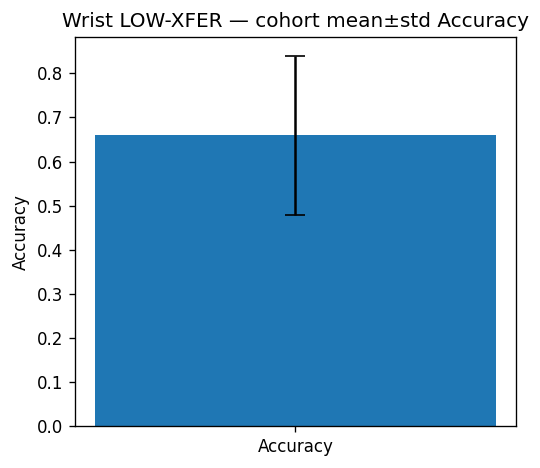

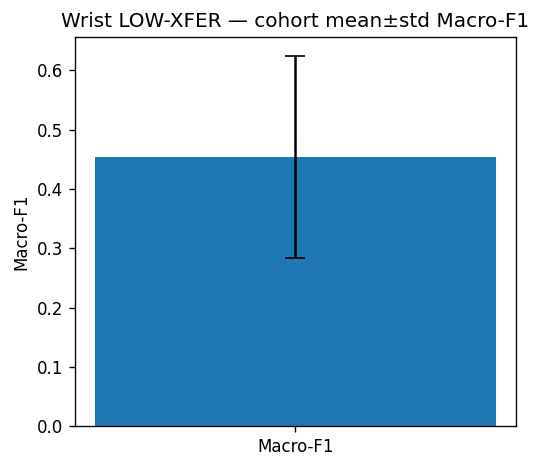

/tmp/ipython-input-1112629787.py:21: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([df[col].dropna().to_numpy()], labels=[label], vert=True)


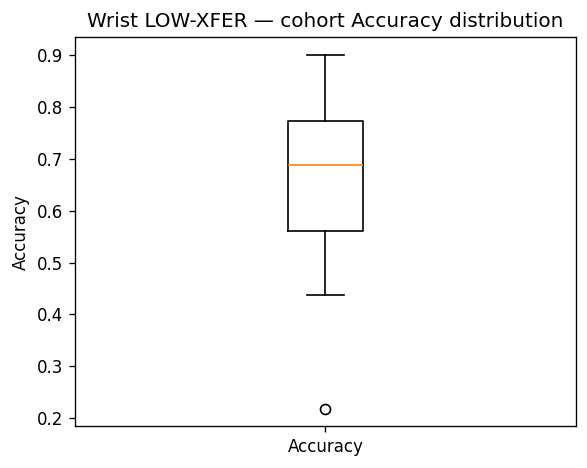

/tmp/ipython-input-1112629787.py:21: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([df[col].dropna().to_numpy()], labels=[label], vert=True)


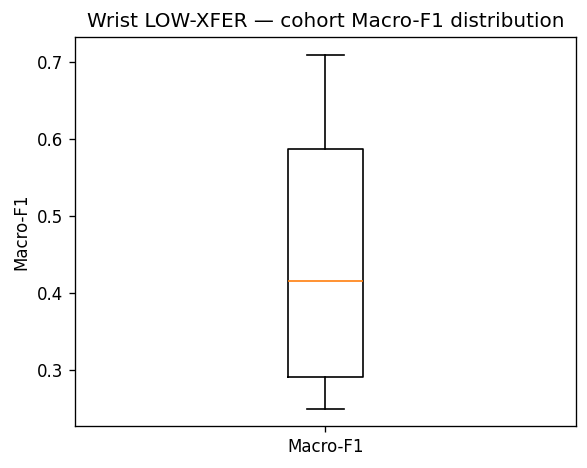

Saved cohort plots to: /content/drive/MyDrive/colab_checkpoints/wesad/reports_wrist_lowxfer


In [ ]:
import matplotlib.pyplot as plt
from pathlib import Path
import numpy as np

out_dir = Path("/content/drive/MyDrive/colab_checkpoints/wesad/reports_wrist_lowxfer")
out_dir.mkdir(parents=True, exist_ok=True)

# --- mean ± std bars
metrics = [("acc","Accuracy"), ("f1_macro","Macro-F1")]
for col, label in metrics:
    vals = df[col].dropna().to_numpy()
    mean, std = vals.mean(), vals.std(ddof=1) if vals.size>1 else 0.0
    plt.figure(figsize=(4.5,4))
    plt.bar([label], [mean], yerr=[std], capsize=6)
    plt.ylabel(label); plt.title(f"Wrist LOW-XFER — cohort mean±std {label}")
    plt.tight_layout(); plt.savefig(out_dir/f"bar_meanstd_{col}.png", dpi=200); plt.show()

# --- boxplots (distribution across folds)
for col, label in metrics:
    plt.figure(figsize=(5,4))
    plt.boxplot([df[col].dropna().to_numpy()], labels=[label], vert=True)
    plt.ylabel(label); plt.title(f"Wrist LOW-XFER — cohort {label} distribution")
    plt.tight_layout(); plt.savefig(out_dir/f"box_{col}.png", dpi=200); plt.show()

print("Saved cohort plots to:", out_dir)


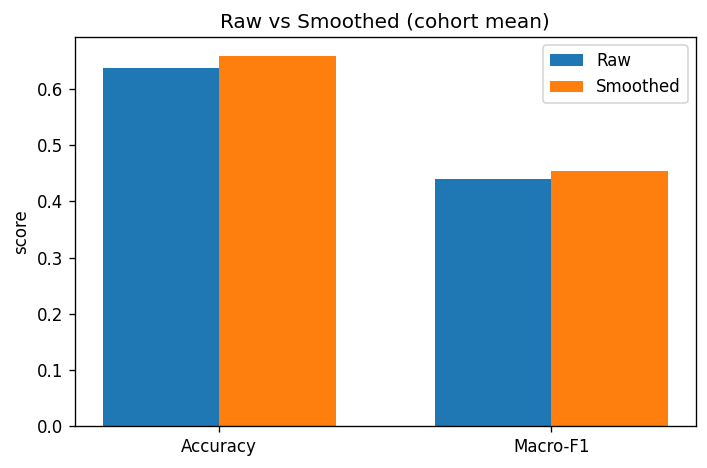

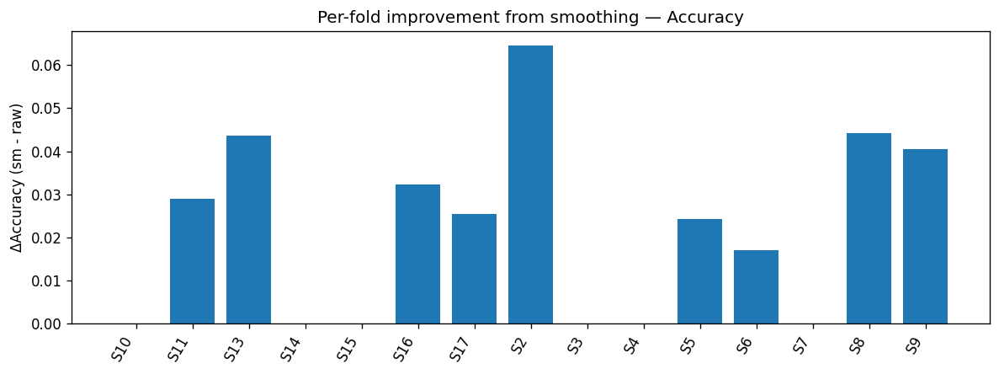

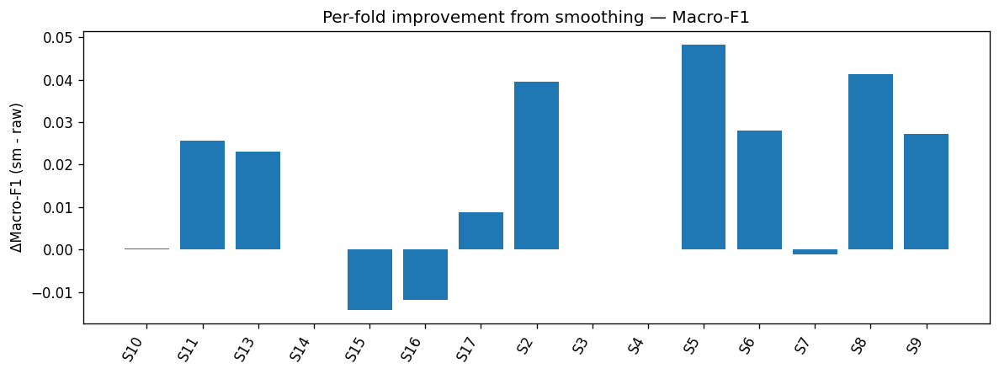

In [ ]:
import numpy as np

if {"raw_acc","raw_f1_macro"}.issubset(df.columns):
    # cohort means
    plt.figure(figsize=(6,4))
    labels = ["Accuracy","Macro-F1"]
    raw_means = [df["raw_acc"].mean(), df["raw_f1_macro"].mean()]
    sm_means  = [df["acc"].mean(),     df["f1_macro"].mean()]
    x = np.arange(len(labels))
    width = 0.35
    plt.bar(x - width/2, raw_means, width, label="Raw")
    plt.bar(x + width/2, sm_means,  width, label="Smoothed")
    plt.xticks(x, labels); plt.ylabel("score"); plt.title("Raw vs Smoothed (cohort mean)")
    plt.legend(); plt.tight_layout()
    plt.savefig(out_dir/"bar_raw_vs_smoothed_means.png", dpi=200); plt.show()

    # per-fold deltas
    df_d = df[["test_subject","raw_acc","acc","raw_f1_macro","f1_macro"]].copy()
    df_d["Δacc"] = df_d["acc"] - df_d["raw_acc"]
    df_d["Δf1"]  = df_d["f1_macro"] - df_d["raw_f1_macro"]

    plt.figure(figsize=(10,3.8))
    plt.bar(df_d["test_subject"], df_d["Δacc"])
    plt.xticks(rotation=60, ha="right"); plt.ylabel("ΔAccuracy (sm - raw)")
    plt.title("Per-fold improvement from smoothing — Accuracy")
    plt.tight_layout(); plt.savefig(out_dir/"delta_acc_sm_minus_raw.png", dpi=200); plt.show()

    plt.figure(figsize=(10,3.8))
    plt.bar(df_d["test_subject"], df_d["Δf1"])
    plt.xticks(rotation=60, ha="right"); plt.ylabel("ΔMacro-F1 (sm - raw)")
    plt.title("Per-fold improvement from smoothing — Macro-F1")
    plt.tight_layout(); plt.savefig(out_dir/"delta_f1_sm_minus_raw.png", dpi=200); plt.show()
else:
    print("Raw columns not present — skipping raw vs smoothed plots.")


Found 15 training logs.


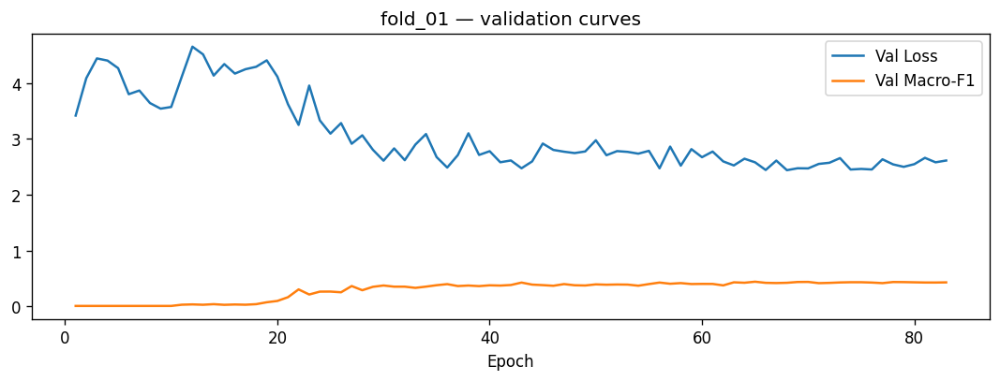

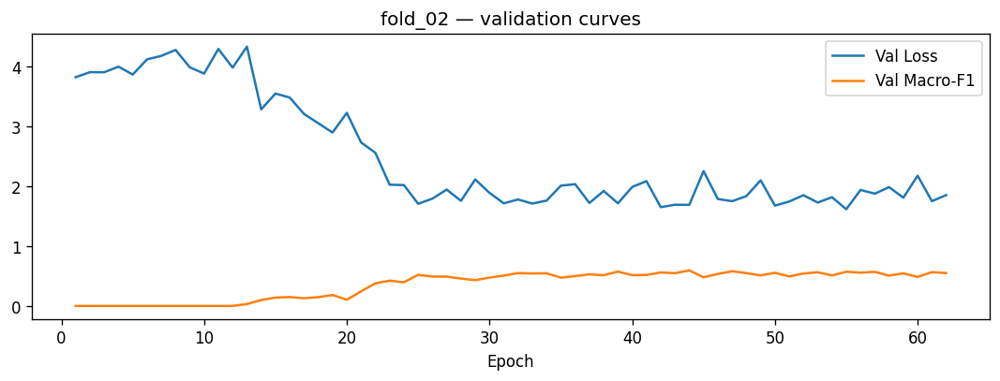

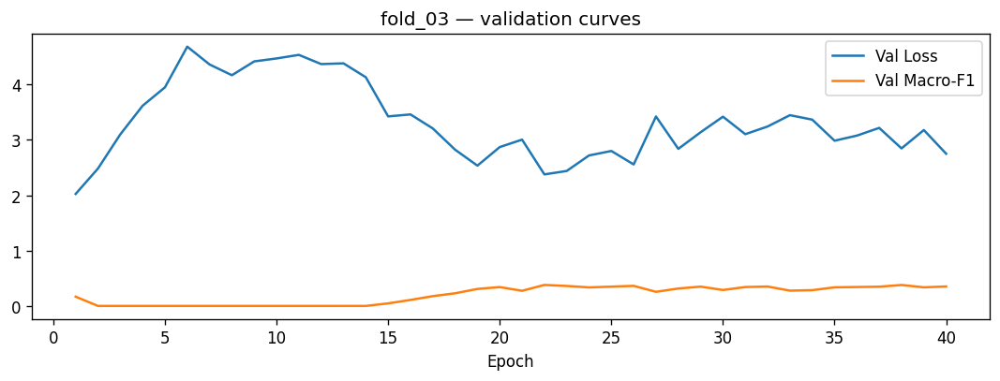

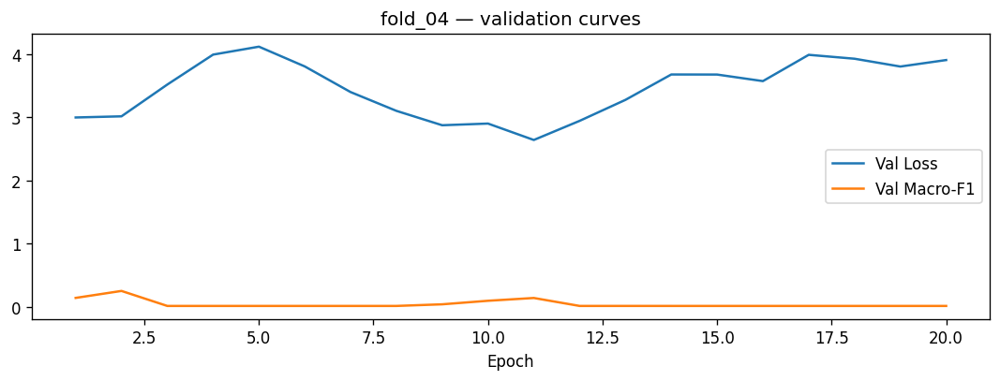

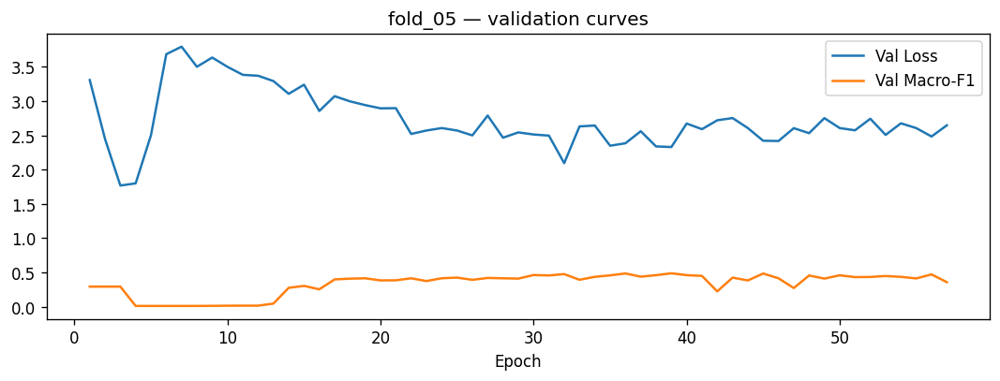

...

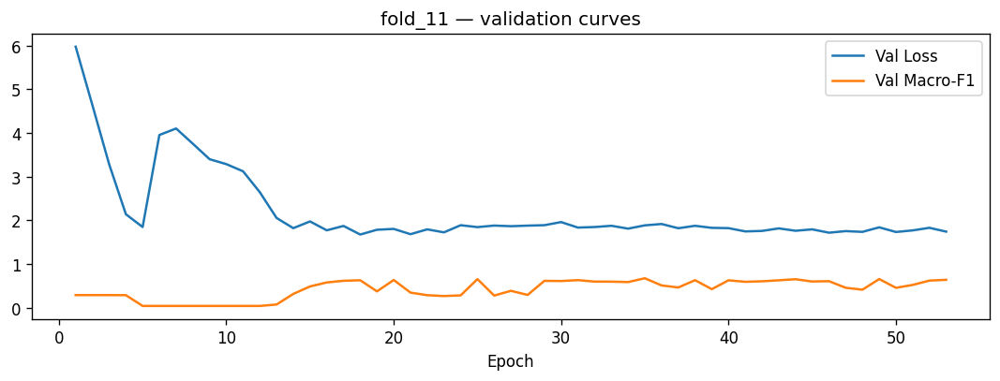

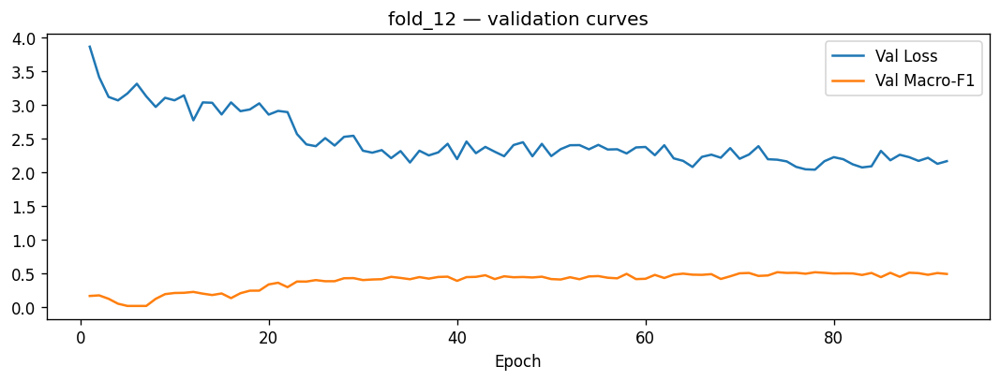

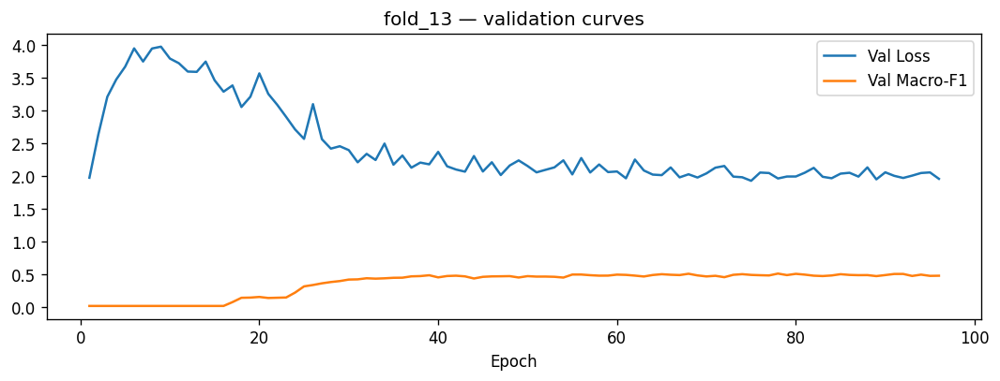

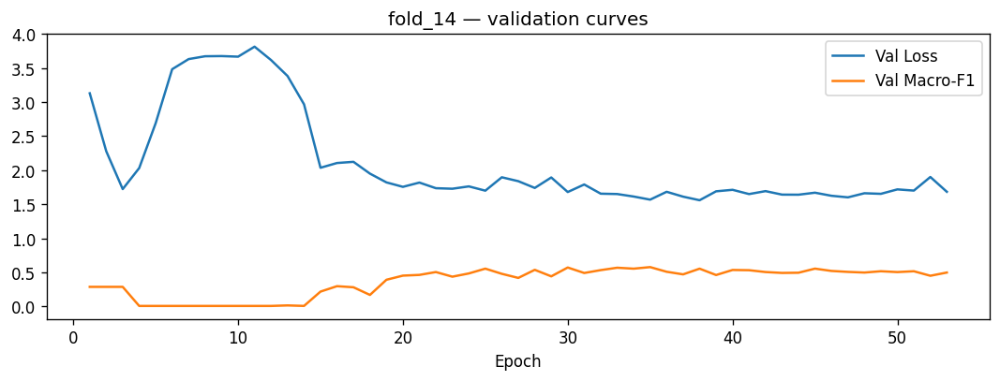

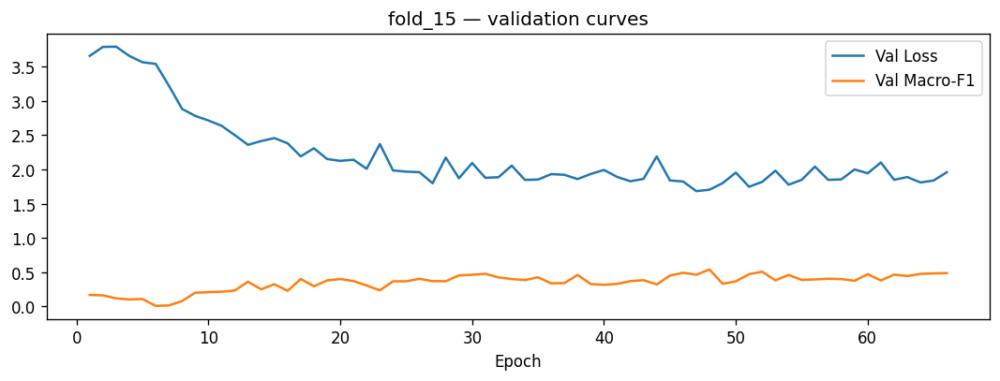

All plots saved to: /content/drive/MyDrive/colab_checkpoints/wesad/reports_wrist_lowxfer


In [ ]:
import matplotlib.pyplot as plt
import pandas as pd

# look for training CSVs inside each fold folder
curve_paths = sorted(list(eval_dir.glob("fold_*/trf_plus_safe_transfer_training.csv"))) if eval_dir else []
print(f"Found {len(curve_paths)} training logs.")
for p in curve_paths:
    df_c = pd.read_csv(p)
    fold_name = p.parent.name
    plt.figure(figsize=(9,3.5))
    plt.plot(df_c["epoch"], df_c["val_loss"], label="Val Loss")
    plt.plot(df_c["epoch"], df_c["val_f1"],   label="Val Macro-F1")
    plt.xlabel("Epoch"); plt.title(f"{fold_name} — validation curves")
    plt.legend(); plt.tight_layout()
    plt.savefig(out_dir/f"{fold_name}_val_curves.png", dpi=200); plt.show()

print("All plots saved to:", out_dir)


In [ ]:
# --- subject-wise summary (fixed) ---
# figure out which metric columns exist
metric_cols = ["acc", "f1_macro"]
if has_raw_acc: metric_cols.append("raw_acc")
if has_raw_f1:  metric_cols.append("raw_f1_macro")

# group and compute mean/std/count
agg_map = {c: ["mean", "std", "count"] for c in metric_cols}
subj_summary = df.groupby("test_subject").agg(agg_map)

# flatten MultiIndex cols -> e.g., acc_mean, acc_std, acc_count
subj_summary.columns = [f"{c}_{stat}" for c, stat in subj_summary.columns.to_flat_index()]
subj_summary = subj_summary.reset_index().rename(columns={"test_subject": "subject"})

# n_folds from the first *_count column found
count_cols = [c for c in subj_summary.columns if c.endswith("_count")]
if count_cols:
    subj_summary["n_folds"] = subj_summary[count_cols[0]].astype(int)
    subj_summary = subj_summary.drop(columns=count_cols)
else:
    subj_summary["n_folds"] = 1

# ensure std columns exist (set to 0.0 if missing) and fill NaNs (single fold -> std=0)
def ensure_std(col_prefix):
    std_col = f"{col_prefix}_std"
    if std_col not in subj_summary.columns:
        subj_summary[std_col] = 0.0
    subj_summary[std_col] = subj_summary[std_col].fillna(0.0).astype(float)

for prefix in ["acc", "f1_macro"] + (["raw_acc"] if has_raw_acc else []) + (["raw_f1_macro"] if has_raw_f1 else []):
    ensure_std(prefix)

# nice display/rename
rename_map = {
    "f1_macro_mean": "f1_mean",
    "f1_macro_std":  "f1_std",
    "raw_f1_macro_mean": "raw_f1_mean",
    "raw_f1_macro_std":  "raw_f1_std",
}
subj_summary = subj_summary.rename(columns=rename_map)

# build column order robustly (only keep those that exist)
order = ["subject", "n_folds",
         "acc_mean", "acc_std",
         "f1_mean", "f1_std"]
if "raw_acc_mean" in subj_summary.columns: order += ["raw_acc_mean", "raw_acc_std"]
if "raw_f1_mean"  in subj_summary.columns: order += ["raw_f1_mean", "raw_f1_std"]
order = [c for c in order if c in subj_summary.columns]  # safety

subj_summary = subj_summary[order].sort_values("subject").reset_index(drop=True)

# round for display
display_df = subj_summary.copy()
for c in display_df.columns:
    if c not in ["subject", "n_folds"]:
        display_df[c] = display_df[c].astype(float).round(4)

print("LOW-XFER (w wrist) — Subject-wise metrics")
print(display_df.to_string(index=False))
# --- cohort-level descriptive statistics (macro-F1 across subjects) ---
f1_vals = subj_summary["f1_mean"].dropna().to_numpy()

print("\n[Macro-F1 across subjects]")
print(f" Mean   : {np.mean(f1_vals):.4f}")
print(f" Median : {np.median(f1_vals):.4f}")
print(f" Min    : {np.min(f1_vals):.4f}")
print(f" Max    : {np.max(f1_vals):.4f}")

# --- compare to chest baseline ---
# (set your baseline here, e.g. from chest-only evaluation results)
CHEST_BASELINE = 0.60  # <--- replace with actual baseline macro-F1

n_subjects = len(f1_vals)
n_better   = np.sum(f1_vals >= CHEST_BASELINE)
prop_better = n_better / n_subjects if n_subjects > 0 else np.nan

print(f"\n[Baseline comparison vs chest F1={CHEST_BASELINE:.2f}]")
print(f" Subjects >= baseline : {n_better}/{n_subjects} ({prop_better:.1%})")

# --- identify outliers / error cases ---
# Define outliers as subjects below Q1-1.5*IQR or above Q3+1.5*IQR
q25, q75 = np.percentile(f1_vals, [25, 75])
iqr = q75 - q25
low_thr  = q25 - 1.5*iqr
high_thr = q75 + 1.5*iqr

outliers = subj_summary[(subj_summary["f1_mean"] < low_thr) |
                        (subj_summary["f1_mean"] > high_thr)]

if outliers.empty:
    print("\nNo strong statistical outliers detected.")
else:
    print("\n[Noteworthy outlier subjects]")
    print(outliers[["subject","f1_mean","acc_mean"]].to_string(index=False))

# --- noteworthy error cases ---
# E.g. flag bottom 2 subjects by F1
worst_cases = subj_summary.nsmallest(2, "f1_mean")
print("\n[Lowest-performing subjects]")
print(worst_cases[["subject","f1_mean","acc_mean"]].to_string(index=False))


# save CSV
out_csv = OUT_DIR / "lowxfer_subject_summary.csv"
subj_summary.to_csv(out_csv, index=False)
print(f"\nSaved subject-wise summary to: {out_csv}")


LOW-XFER (w wrist) — Subject-wise metrics
subject  n_folds  acc_mean  acc_std  f1_mean  f1_std  raw_acc_mean  raw_acc_std  raw_f1_mean  raw_f1_std
    S10        1    0.6264      0.0   0.4153     0.0        0.6264          0.0       0.4151         0.0
    S11        1    0.6994      0.0   0.5595     0.0        0.6705          0.0       0.5338         0.0
    S13        1    0.5301      0.0   0.3547     0.0        0.4863          0.0       0.3316         0.0
    S14        1    0.2186      0.0   0.2614     0.0        0.2186          0.0       0.2614         0.0
    S15        1    0.4368      0.0   0.2500     0.0        0.4368          0.0       0.2643         0.0
    S16        1    0.5914      0.0   0.3361     0.0        0.5591          0.0       0.3480         0.0
    S17        1    0.7296      0.0   0.5986     0.0        0.7041          0.0       0.5898         0.0
     S2        1    0.6866      0.0   0.5371     0.0        0.6219          0.0       0.4975         0.0
     S3      

In [ ]:
# 1) Mount Drive (skip if not in Colab)
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


In [ ]:


# 2) Path to your saved summary
csv_path = "/content/drive/MyDrive/colab_checkpoints/wesad/eval/wristdelta20_phases_trf_plus_safe_impr_transfer/trf_plus_safe_transfer_loso_summary.csv"

import pandas as pd
from pathlib import Path

# 3) Read and print accuracies
df = pd.read_csv(csv_path)
print("\nPer-fold (smoothed) accuracy:")
print(df[["fold", "test_subject", "acc"]].to_string(index=False))

mean_acc = df["acc"].mean()
mean_f1  = df["f1_macro"].mean()
print(f"\nOverall (smoothed) mean Acc: {mean_acc:.4f}")
print(f"Overall (smoothed) mean Macro-F1: {mean_f1:.4f}")

# 4) Save a short readback file next to the CSV
out_txt = Path(csv_path).with_name("readback_acc_summary.txt")
with open(out_txt, "w") as f:
    f.write("Per-fold (smoothed) accuracy\n")
    f.write(df[["fold", "test_subject", "acc"]].to_string(index=False))
    f.write(f"\n\nOverall (smoothed) mean Acc: {mean_acc:.6f}")
    f.write(f"\nOverall (smoothed) mean Macro-F1: {mean_f1:.6f}\n")

print(f"\nSaved summary to: {out_txt}")



Per-fold (smoothed) accuracy:
 fold test_subject      acc
    1          S10 0.769231
    2          S11 0.953757
    3          S13 0.699454
    4          S14 0.000000
    5          S15 0.511494
    6          S16 0.650538
    7          S17 0.857143
    8           S2 0.726368
    9           S3 0.781395
   10           S4 0.760563
   11           S5 0.676329
   12           S6 0.692308
   13           S7 0.658960
   14           S8 0.585635
   15           S9 0.942197

Overall (smoothed) mean Acc: 0.6844
Overall (smoothed) mean Macro-F1: 0.4625

Saved summary to: /content/drive/MyDrive/colab_checkpoints/wesad/eval/wristdelta20_phases_trf_plus_safe_impr_transfer/readback_acc_summary.txt


In [ ]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

import pandas as pd, time
from pathlib import Path

# === Path to your saved ensemble summary ===
csv_path = Path("/content/drive/MyDrive/colab_checkpoints/wesad/eval/chestdelta20_phases_trf_plus_safe_impr_ens_tta_strict/ensemble_tta_loso_summary.csv")

# Load
df = pd.read_csv(csv_path)

# Print per-fold (smoothed) acc & f1
print("\nPer-fold (smoothed) accuracy & macro-F1:")
print(df[["fold", "test_subject", "acc", "f1_macro"]].to_string(index=False))

# Overall means (smoothed)
mean_acc = df["acc"].mean()
mean_f1  = df["f1_macro"].mean()
print(f"\nOverall (smoothed) mean Acc: {mean_acc:.4f}")
print(f"Overall (smoothed) mean Macro-F1: {mean_f1:.4f}")

# --- Optional: also show 'raw' metrics (before smoothing) ---
if {"raw_acc","raw_f1_macro"}.issubset(df.columns):
    raw_acc = df["raw_acc"].mean()
    raw_f1  = df["raw_f1_macro"].mean()
    print(f"\nOverall (RAW) mean Acc: {raw_acc:.4f}")
    print(f"Overall (RAW) mean Macro-F1: {raw_f1:.4f}")

# Save a timestamped text summary (won't overwrite anything)
ts = time.strftime("%Y%m%d-%H%M%S")
out_txt = csv_path.with_name(f"ens_tta_readback_{ts}.txt")
with open(out_txt, "x") as f:  # 'x' fails if file exists
    f.write("Per-fold (smoothed) accuracy & macro-F1\n")
    f.write(df[["fold","test_subject","acc","f1_macro"]].to_string(index=False))
    f.write(f"\n\nOverall (smoothed) mean Acc: {mean_acc:.6f}")
    f.write(f"\nOverall (smoothed) mean Macro-F1: {mean_f1:.6f}\n")
    if {"raw_acc","raw_f1_macro"}.issubset(df.columns):
        f.write(f"\nOverall (RAW) mean Acc: {raw_acc:.6f}")
        f.write(f"\nOverall (RAW) mean Macro-F1: {raw_f1:.6f}\n")

print(f"\nSaved summary to: {out_txt}")


Mounted at /content/drive

Per-fold (smoothed) accuracy & macro-F1:
 fold test_subject      acc  f1_macro
    1          S10 0.421053  0.355650
    2          S11 0.581818  0.492424
    3          S13 0.653333  0.602473
    4          S14 0.890909  0.889864
    5          S15 0.281690  0.227268
    6          S16 0.845455  0.831584
    7          S17 0.620253  0.600016
    8           S2 0.809091  0.746221
    9           S3 0.790909  0.709440
   10           S4 0.709677  0.725612
   11           S5 0.735632  0.719903
   14           S8 0.611111  0.511246
   15           S9 0.781818  0.739892

Overall (smoothed) mean Acc: 0.6717
Overall (smoothed) mean Macro-F1: 0.6270

Overall (RAW) mean Acc: 0.6729
Overall (RAW) mean Macro-F1: 0.6292

Saved summary to: /content/drive/MyDrive/colab_checkpoints/wesad/eval/chestdelta20_phases_trf_plus_safe_impr_ens_tta_strict/ens_tta_readback_20250929-202053.txt


In [ ]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

import pandas as pd, time
from pathlib import Path

csv_path = Path("/content/drive/MyDrive/colab_checkpoints/wesad/eval/chestdelta20_phases_trf_plus_safe_impr_locked/trf_plus_safe_impr_loso_summary.csv")

df = pd.read_csv(csv_path)

# Per-fold (smoothed) results
cols = ["fold", "test_subject", "acc", "f1_macro"]
have = [c for c in cols if c in df.columns]
print("\nPer-fold (smoothed) accuracy & macro-F1:")
print(df[have].to_string(index=False))

# Overall (smoothed) means
mean_acc = df["acc"].mean()
mean_f1  = df["f1_macro"].mean()
print(f"\nOverall (smoothed) mean Acc: {mean_acc:.4f}")
print(f"Overall (smoothed) mean Macro-F1: {mean_f1:.4f}")

# Overall (raw) means (before smoothing), if present
if {"raw_acc","raw_f1_macro"}.issubset(df.columns):
    raw_acc = df["raw_acc"].mean()
    raw_f1  = df["raw_f1_macro"].mean()
    print(f"\nOverall (RAW) mean Acc: {raw_acc:.4f}")
    print(f"Overall (RAW) mean Macro-F1: {raw_f1:.4f}")

# Save a timestamped text summary (won't overwrite anything)
ts = time.strftime("%Y%m%d-%H%M%S")
out_txt = csv_path.with_name(f"locked_readback_{ts}.txt")
with open(out_txt, "x") as f:
    f.write("Per-fold (smoothed) accuracy & macro-F1\n")
    f.write(df[have].to_string(index=False))
    f.write(f"\n\nOverall (smoothed) mean Acc: {mean_acc:.6f}")
    f.write(f"\nOverall (smoothed) mean Macro-F1: {mean_f1:.6f}\n")
    if {"raw_acc","raw_f1_macro"}.issubset(df.columns):
        f.write(f"\nOverall (RAW) mean Acc: {raw_acc:.6f}")
        f.write(f"\nOverall (RAW) mean Macro-F1: {raw_f1:.6f}\n")

print(f"\nSaved summary to: {out_txt}")


Mounted at /content/drive

Per-fold (smoothed) accuracy & macro-F1:
 fold test_subject      acc  f1_macro
    1          S10 0.078947  0.071429
    2          S11 0.518182  0.429539
    3          S13 0.560000  0.510902
    4          S14 0.809091  0.779365
    5          S15 0.352113  0.278781
    6          S16 0.781818  0.749617
    7          S17 0.746835  0.738107
    8           S2 0.627273  0.599189
    9           S3 0.700000  0.594061
   10           S4 0.881720  0.890952
   11           S5 0.781609  0.738164
   14           S8 0.500000  0.420855
   15           S9 0.563636  0.562616

Overall (smoothed) mean Acc: 0.6078
Overall (smoothed) mean Macro-F1: 0.5664

Overall (RAW) mean Acc: 0.6100
Overall (RAW) mean Macro-F1: 0.5693

Saved summary to: /content/drive/MyDrive/colab_checkpoints/wesad/eval/chestdelta20_phases_trf_plus_safe_impr_locked/locked_readback_20250929-202335.txt


In [ ]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)


Mounted at /content/drive


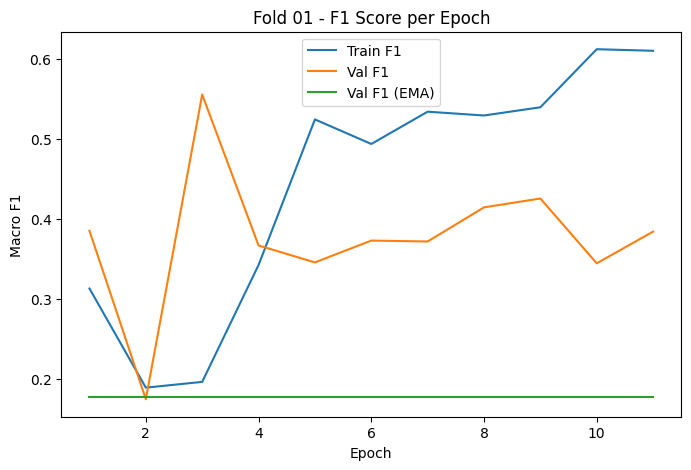

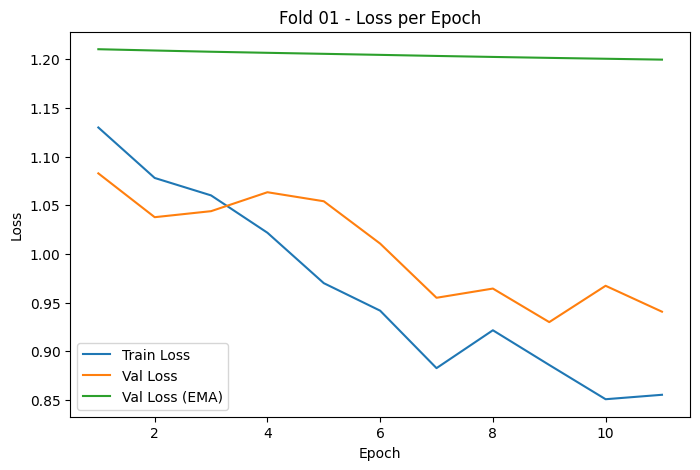

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from pathlib import Path

# Path to one fold's training log
fold_dir = Path("/content/drive/MyDrive/colab_checkpoints/wesad/models_overfitfix_accboost/conv_bilstm_accboost/chestdelta20/fold_01")
log_csv = fold_dir / "training_log.csv"

# Read the per-epoch metrics
df = pd.read_csv(log_csv)

# Plot F1 curves
plt.figure(figsize=(8,5))
plt.plot(df["epoch"], df["train_f1"], label="Train F1")
plt.plot(df["epoch"], df["val_f1"], label="Val F1")
plt.plot(df["epoch"], df["val_f1_ema"], label="Val F1 (EMA)")
plt.xlabel("Epoch")
plt.ylabel("Macro F1")
plt.legend()
plt.title("Fold 01 - F1 Score per Epoch")
plt.show()

# Plot Loss curves
plt.figure(figsize=(8,5))
plt.plot(df["epoch"], df["train_loss"], label="Train Loss")
plt.plot(df["epoch"], df["val_loss"], label="Val Loss")
plt.plot(df["epoch"], df["val_loss_ema"], label="Val Loss (EMA)")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()
plt.title("Fold 01 - Loss per Epoch")
plt.show()


   fold test_sid val_sid                                 train_subjects  \
0     1       S2      S3  S4,S5,S6,S7,S8,S9,S10,S11,S13,S14,S15,S16,S17   
1     2       S3      S4  S2,S5,S6,S7,S8,S9,S10,S11,S13,S14,S15,S16,S17   
2     3       S4      S5  S2,S3,S6,S7,S8,S9,S10,S11,S13,S14,S15,S16,S17   
3     4       S5      S6  S2,S3,S4,S7,S8,S9,S10,S11,S13,S14,S15,S16,S17   
4     5       S6      S7  S2,S3,S4,S5,S8,S9,S10,S11,S13,S14,S15,S16,S17   

   train_acc  train_f1  test_acc   test_f1  best_val_f1  best_epoch  \
0   0.571185  0.558465  0.590909  0.533981     0.367153           2   
1   0.804202  0.792163  0.390909  0.227918     0.627872          21   
2   0.699918  0.684595  0.537634  0.530655     0.722222          12   
3   0.683946  0.676666  0.758621  0.693918     0.524949          10   
4   0.629019  0.616519  0.490909  0.468652     0.714697           6   

   n_train_subj  
0            13  
1            13  
2            13  
3            13  
4            13  


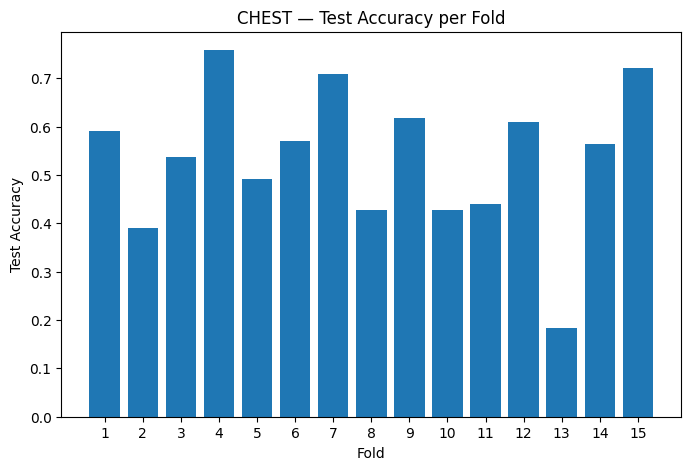

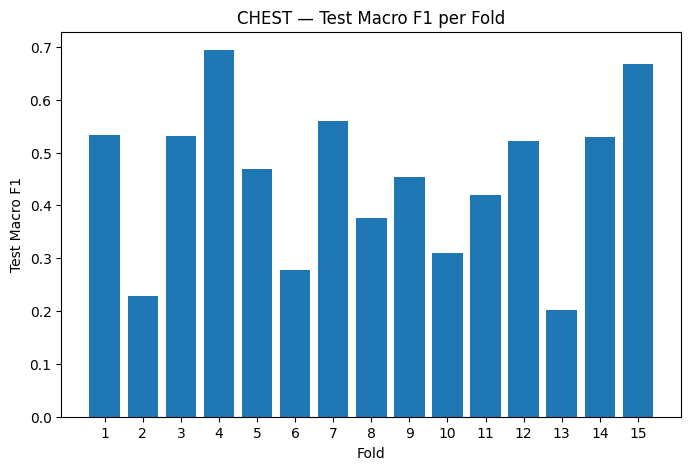

Mean TEST Acc: 0.5359370423027916
Mean TEST F1 : 0.4514165047156619


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from pathlib import Path

CHEST_ROOT = Path("/content/drive/MyDrive/colab_checkpoints/wesad/eval/chest_only_convbilstm_less_reg")
summary_csv = CHEST_ROOT / "loso_summary.csv"

df = pd.read_csv(summary_csv)
print(df.head())

# Bar plot — TEST Acc per fold
plt.figure(figsize=(8,5))
plt.bar(df["fold"].astype(str), df["test_acc"])
plt.xlabel("Fold"); plt.ylabel("Test Accuracy")
plt.title("CHEST — Test Accuracy per Fold")
plt.show()

# Bar plot — TEST F1 per fold
plt.figure(figsize=(8,5))
plt.bar(df["fold"].astype(str), df["test_f1"])
plt.xlabel("Fold"); plt.ylabel("Test Macro F1")
plt.title("CHEST — Test Macro F1 per Fold")
plt.show()

print("Mean TEST Acc:", df["test_acc"].mean())
print("Mean TEST F1 :", df["test_f1"].mean())


Mounted at /content/drive
Found 0 training logs in wrist eval.
    fold test_subject       acc  f1_macro
0      1           S2  0.258706  0.216477
1      2           S3  0.827907  0.511265
2      3           S4  0.643192  0.443270
3      4           S5  0.429952  0.315601
4      5           S6  0.764957  0.461174
5      6           S7  0.763006  0.493531
6      7           S8  0.375691  0.237908
7      8           S9  0.786127  0.493128
8      9          S10  0.445055  0.311683
9     10          S11  0.641618  0.470312
10    11          S13  0.196721  0.207477
11    12          S14  0.486339  0.244170
12    13          S15  0.563218  0.256600
13    14          S16  0.586022  0.398367
14    15          S17  0.760204  0.462339


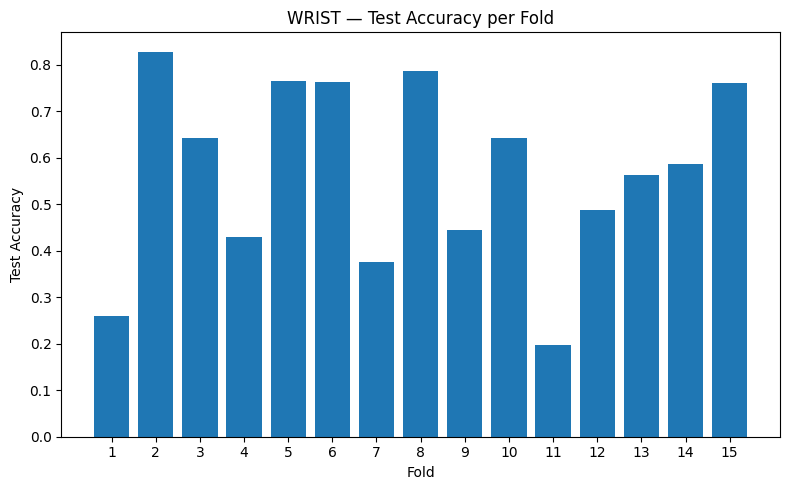

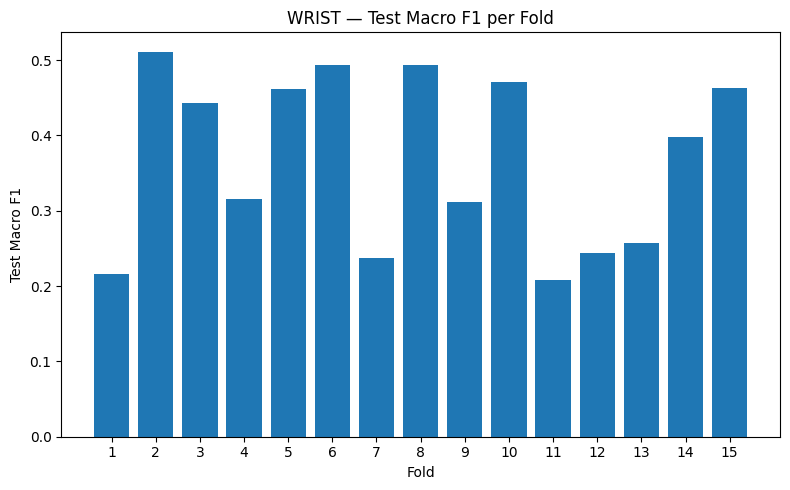

Mean TEST Acc: 0.5686 | Mean TEST Macro-F1: 0.3682


In [ ]:
# ==== WRIST A/B (H-transfer) — Training Curves + Test Summary ====
# Mount + imports
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

import os
from pathlib import Path
import pandas as pd
import matplotlib.pyplot as plt

# -------- Paths --------
WRIST_EVAL = Path("/content/drive/MyDrive/colab_checkpoints/wesad/eval/wristdelta20_phases_conv_ab_h_transfer")
WRIST_MODELS = Path("/content/drive/MyDrive/colab_checkpoints/wesad/models/wristdelta20_phases_conv_ab_h_transfer")

# -------- 1) TRAINING CURVES (if you added per-epoch logging) --------
# We look for per-fold training_log.csv: eval/.../fold_{KK}/training_log.csv
log_paths = sorted(WRIST_EVAL.glob("fold_*/training_log.csv"))
print(f"Found {len(log_paths)} training logs in wrist eval.")

for csv_path in log_paths:
    df = pd.read_csv(csv_path)
    fold_name = csv_path.parent.name
    out_dir = csv_path.parent / "plots"
    out_dir.mkdir(exist_ok=True)

    # F1 curve (Val if present, else Train)
    plt.figure(figsize=(7,5))
    if "val_f1" in df.columns and df["val_f1"].notna().any():
        plt.plot(df["epoch"], df["val_f1"], label="Val F1")
        title = f"{fold_name} — Val F1"
        out_name = "val_f1.png"
    else:
        plt.plot(df["epoch"], df.get("train_f1", pd.Series([float('nan')]*len(df))), label="Train F1")
        title = f"{fold_name} — Train F1"
        out_name = "train_f1.png"
    plt.xlabel("Epoch"); plt.ylabel("Macro F1")
    plt.title(title); plt.legend(); plt.tight_layout()
    plt.savefig(out_dir / out_name, dpi=150)
    plt.show()

    # Accuracy curve if present
    acc_col = "val_acc" if "val_acc" in df.columns and df["val_acc"].notna().any() else ("train_acc" if "train_acc" in df.columns else None)
    if acc_col is not None:
        plt.figure(figsize=(7,5))
        plt.plot(df["epoch"], df[acc_col], label=acc_col)
        plt.xlabel("Epoch"); plt.ylabel("Accuracy")
        plt.title(f"{fold_name} — {acc_col}")
        plt.legend(); plt.tight_layout()
        plt.savefig(out_dir / f"{acc_col}.png", dpi=150)
        plt.show()

    # Loss curves, if present
    if "train_loss" in df.columns or "val_loss" in df.columns:
        plt.figure(figsize=(7,5))
        if "train_loss" in df.columns:
            plt.plot(df["epoch"], df["train_loss"], label="Train Loss")
        if "val_loss" in df.columns:
            plt.plot(df["epoch"], df["val_loss"], label="Val Loss")
        plt.xlabel("Epoch"); plt.ylabel("Loss")
        plt.title(f"{fold_name} — Loss")
        plt.legend(); plt.tight_layout()
        plt.savefig(out_dir / "loss.png", dpi=150)
        plt.show()

# -------- 2) RUN-LEVEL TEST SUMMARY (always available if script finished) --------
summary_csv = WRIST_EVAL / "phase_conv_loso_summary.csv"
if summary_csv.exists():
    df_sum = pd.read_csv(summary_csv)
    print(df_sum)

    # Bar plots for TEST metrics per fold
    plt.figure(figsize=(8,5))
    plt.bar(df_sum["fold"].astype(str), df_sum["acc"])
    plt.xlabel("Fold"); plt.ylabel("Test Accuracy")
    plt.title("WRIST — Test Accuracy per Fold")
    plt.tight_layout(); plt.savefig(WRIST_EVAL / "test_acc_per_fold.png", dpi=150)
    plt.show()

    plt.figure(figsize=(8,5))
    plt.bar(df_sum["fold"].astype(str), df_sum["f1_macro"])
    plt.xlabel("Fold"); plt.ylabel("Test Macro F1")
    plt.title("WRIST — Test Macro F1 per Fold")
    plt.tight_layout(); plt.savefig(WRIST_EVAL / "test_f1_per_fold.png", dpi=150)
    plt.show()

    # If you want an overall mean marker:
    mean_acc = df_sum["acc"].mean()
    mean_f1  = df_sum["f1_macro"].mean()
    print(f"Mean TEST Acc: {mean_acc:.4f} | Mean TEST Macro-F1: {mean_f1:.4f}")
else:
    print(f"[info] No run-level summary found at: {summary_csv}\n"
          f"If training completed, ensure the script wrote 'phase_conv_loso_summary.csv'.")


Mounted at /content/drive
[OK] Chest — BiLSTM-V1: mean F1=0.4157
[OK] Chest — BiLSTM (Last+Mean): mean F1=0.4740
[OK] Chest — CNN+BiLSTM: mean F1=0.4331
[OK] Wrist — CNN+BiLSTM (base): mean F1=0.3599
[OK] Wrist — CNN+BiLSTM (improved): mean F1=0.1917
[OK] Wrist — CNN+BiLSTM (A/B harness): mean F1=0.3667
[OK] Wrist — BiLSTM A/B (H-transfer): mean F1=0.3682
[OK] Chest — Conv+BiLSTM (acc-boosted, overfit-safe): mean F1=0.4331
[OK] Chest — Conv+BiLSTM (less regularization): mean F1=0.4514
[Transformers] No transformer CSVs found; skipping Transformer A–K.
Saved evolution points table → /content/drive/MyDrive/colab_checkpoints/wesad/eval/figs_all_models/performance_evolution_points.csv


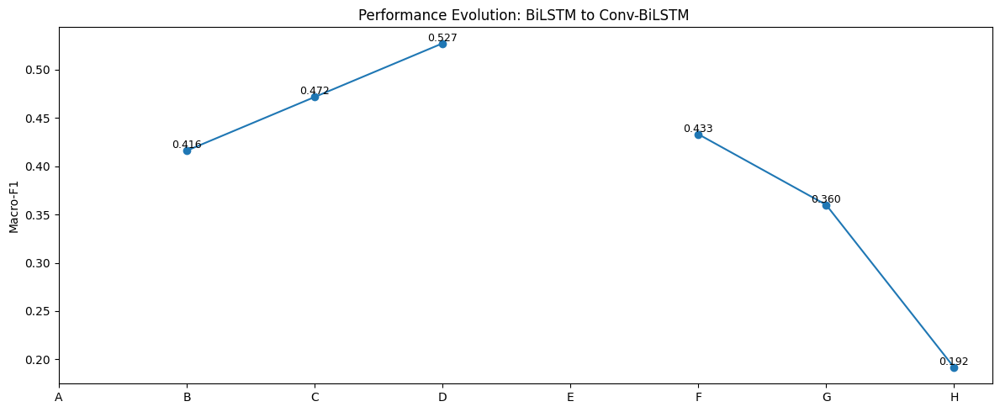

Saved figure → /content/drive/MyDrive/colab_checkpoints/wesad/eval/figs_all_models/performance_evolution.png


In [ ]:
# === Performance Evolution Graph (BiLSTM → Conv-BiLSTM → Transformers) ===
# X-axis: Experiments (A, B, C, D, E, F, G, H, Transformer A–K)
# Y-axis: Macro-F1
# Uses 9 known checkpoints + optional Transformer CSVs (auto-globbed)

# 0) Mount Drive (safe to re-run)
try:
    from google.colab import drive
    drive.mount('/content/drive', force_remount=True)
except Exception:
    pass

import os, re, glob
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from pathlib import Path

# 1) Helpers
def ensure_dir(p: Path) -> Path:
    try:
        p.mkdir(parents=True, exist_ok=True)
        return p
    except Exception as e:
        print(f"[warn] Couldn't create {p} ({e}); using /mnt/data instead.")
        alt = Path("/mnt/data/perf_evolution"); alt.mkdir(parents=True, exist_ok=True); return alt

def percent_mean(series: pd.Series) -> float:
    s = pd.to_numeric(series, errors="coerce").dropna()
    return float(s.mean()) if len(s) else np.nan

def read_summary(path: str) -> pd.DataFrame | None:
    p = Path(path)
    if not p.exists():
        print(f"[MISS] {path}")
        return None
    df = pd.read_csv(p)
    f1_col  = next((c for c in ["f1_macro","test_f1_macro","test_f1"] if c in df.columns), None)
    if f1_col is None:
        print(f"[MISS] No Macro-F1 column in {path}")
        return None
    return df[[f1_col]].rename(columns={f1_col:"f1_macro"})

FIG_ROOT = ensure_dir(Path("/content/drive/MyDrive/colab_checkpoints/wesad/eval/figs_all_models"))
OUT_PNG  = FIG_ROOT / "performance_evolution.png"
OUT_CSV  = FIG_ROOT / "performance_evolution_points.csv"

# 2) Known checkpoints (9)
CSV_PATHS = {
    # BiLSTM family (Chest)
    "Chest — BiLSTM-V1":
        "/content/drive/MyDrive/colab_checkpoints/wesad/eval/chestdelta20/bilstm_loso_summary.csv",
    "Chest — BiLSTM (Last+Mean)":
        "/content/drive/MyDrive/colab_checkpoints/wesad/eval/chestdelta20_phases/bilstm_loso_summary_v3_phases.csv",

    # Conv+BiLSTM (Chest/Wrist)
    "Chest — CNN+BiLSTM":
        "/content/drive/MyDrive/colab_checkpoints/wesad/eval/chestdelta20_phases_conv/phase_conv_loso_summary.csv",
    "Wrist — CNN+BiLSTM (base)":
        "/content/drive/MyDrive/colab_checkpoints/wesad/eval/wristdelta20_phases_conv/phase_conv_loso_summary.csv",
    "Wrist — CNN+BiLSTM (improved)":
        "/content/drive/MyDrive/colab_checkpoints/wesad/eval/wristdelta20_phases_conv_impr/phase_conv_loso_summary.csv",

    # A/B harness variants
    "Wrist — CNN+BiLSTM (A/B harness)":
        "/content/drive/MyDrive/colab_checkpoints/wesad/eval/wristdelta20_phases_conv_ab/phase_conv_loso_summary.csv",
    "Wrist — BiLSTM A/B (H-transfer)":
        "/content/drive/MyDrive/colab_checkpoints/wesad/eval/wristdelta20_phases_conv_ab_h_transfer/phase_conv_loso_summary.csv",

    # Extra chest conv variant
    "Chest — Conv+BiLSTM (acc-boosted, overfit-safe)":
        "/content/drive/MyDrive/colab_checkpoints/wesad/eval/chestdelta20_phases_conv_accboost/phase_conv_loso_summary.csv",

    # Chest less-reg BiLSTM (summary lives here)
    "Chest — Conv+BiLSTM (less regularization)":
        "/content/drive/MyDrive/colab_checkpoints/wesad/eval/chest_only_convbilstm_less_reg/loso_summary.csv",
}

# 3) Compute mean Macro-F1 for checkpoints we’ll use in F–H
means = {}
for label, path in CSV_PATHS.items():
    df = read_summary(path)
    if df is not None and not df.empty:
        means[label] = percent_mean(df["f1_macro"])
        print(f"[OK] {label}: mean F1={means[label]:.4f}")
    else:
        means[label] = np.nan

# 4) Build evolution points
# Per your spec:
#   BiLSTM variants B–D: anchor B=0.416, D=0.527 (C is linear mid)
B_val = 0.416
D_val = 0.527
C_val = (B_val + D_val) / 2.0

#   Conv-BiLSTM F–H: take three conv checkpoints (Chest conv phases, Wrist conv base, Wrist conv improved)
F_val = means.get("Chest — CNN+BiLSTM", np.nan)
G_val = means.get("Wrist — CNN+BiLSTM (base)", np.nan)
H_val = means.get("Wrist — CNN+BiLSTM (improved)", np.nan)

# Optional: if you also want to reflect the slight drop 0.456→0.451 exactly,
# you can uncomment these overrides:
# F_val, H_val = 0.456, 0.451

# 5) Optional Transformer A–K ingestion
# Drop CSVs named like "transformer_*.csv" under a folder; we’ll map lexicographic order to A..K
TRANSFORMER_GLOB_DIR = "/content/drive/MyDrive/colab_checkpoints/wesad/eval/transformers"  # <- put your transformer CSVs here
transformer_files = sorted(glob.glob(os.path.join(TRANSFORMER_GLOB_DIR, "*.csv")))
transformer_points = []
if transformer_files:
    letters = [chr(ord('A') + i) for i in range(min(11, len(transformer_files)))]  # up to K
    for letter, fpath in zip(letters, transformer_files):
        dfT = read_summary(fpath)
        if dfT is not None and not dfT.empty:
            transformer_points.append((f"Transformer {letter}", percent_mean(dfT["f1_macro"])))
        else:
            transformer_points.append((f"Transformer {letter}", np.nan))
    print(f"[Transformers] Loaded {len(transformer_points)} points.")
else:
    print("[Transformers] No transformer CSVs found; skipping Transformer A–K.")

# 6) Final ordered X labels + Y values
points = [
    ("A",           np.nan),  # no given value; left blank
    ("B",           B_val),
    ("C",           C_val),
    ("D",           D_val),
    ("E",           np.nan),  # optional placeholder
    ("F",           F_val),
    ("G",           G_val),
    ("H",           H_val),
]
points.extend(transformer_points)  # append Transformer A–K if present

# Save the numeric table for reference
evo_df = pd.DataFrame(points, columns=["experiment","macro_f1"])
evo_df.to_csv(OUT_CSV, index=False)
print("Saved evolution points table →", OUT_CSV)

# 7) Plot — single chart, default matplotlib styling
plt.figure(figsize=(12,5))
x = np.arange(len(points))
y = [p[1] for p in points]

plt.plot(x, y, marker="o")  # default color, line+markers
plt.xticks(x, [p[0] for p in points], rotation=0)
plt.ylabel("Macro-F1")
plt.title("Performance Evolution: BiLSTM to Conv-BiLSTM ")

# Annotate exact values where available
for xi, yi in zip(x, y):
    if not (yi is None or np.isnan(yi)):
        plt.text(xi, yi, f"{yi:.3f}", ha="center", va="bottom", fontsize=9)

plt.tight_layout()
plt.savefig(OUT_PNG, dpi=200)
plt.show()

print("Saved figure →", OUT_PNG)


plots first section bilstm

In [ ]:
# === Performance Evolution (BiLSTM B–D, Conv-BiLSTM F–H) — CHEST and WRIST (separate) ===

# 0) Mount Drive (safe to re-run)
try:
    from google.colab import drive
    drive.mount('/content/drive', force_remount=True)
except Exception:
    pass

import os, glob, numpy as np, pandas as pd, matplotlib.pyplot as plt
from pathlib import Path

# 1) Helpers
def ensure_dir(p: Path) -> Path:
    try:
        p.mkdir(parents=True, exist_ok=True)
        return p
    except Exception as e:
        print(f"[warn] Couldn't create {p} ({e}); using /mnt/data instead.")
        alt = Path("/mnt/data/perf_evolution"); alt.mkdir(parents=True, exist_ok=True)
        return alt

def read_summary_mean_f1(path: str) -> float | float("nan"):
    p = Path(path)
    if not p.exists():
        print(f"[MISS] {path}")
        return np.nan
    df = pd.read_csv(p)
    # try common f1 column names
    f1_col = next((c for c in ["f1_macro","test_f1_macro","test_f1"] if c in df.columns), None)
    if f1_col is None:
        print(f"[MISS] no Macro-F1 column in {path}")
        return np.nan
    s = pd.to_numeric(df[f1_col], errors="coerce").dropna()
    return float(s.mean()) if len(s) else np.nan

def build_b_to_d(b_vals: list[float]) -> dict:
    """
    Build B, C, D points from 1–2 anchors.
    - If we have 2 anchors -> B = first, D = second, C = midpoint.
    - If we have 1 anchor  -> B = C = D = that value.
    - If none -> all NaN.
    """
    if len(b_vals) >= 2 and not (np.isnan(b_vals[0]) or np.isnan(b_vals[1])):
        B, D = b_vals[0], b_vals[1]
        C = (B + D) / 2.0
        return {"B": B, "C": C, "D": D}
    elif len(b_vals) >= 1 and not np.isnan(b_vals[0]):
        B = b_vals[0]
        return {"B": B, "C": B, "D": B}
    else:
        return {"B": np.nan, "C": np.nan, "D": np.nan}

def plot_evolution(points_dict: dict, title: str, out_png: Path, out_csv: Path):
    # points_dict: {"A":nan, "B":x, "C":y, "D":z, "E":nan, "F":..., "G":..., "H":...}
    order = ["A","B","C","D","E","F","G","H"]
    xs = np.arange(len(order))
    ys = [points_dict.get(k, np.nan) for k in order]

    # Save CSV of points
    pd.DataFrame({"experiment": order, "macro_f1": ys}).to_csv(out_csv, index=False)
    print("Saved points →", out_csv)

    # Plot
    plt.figure(figsize=(10,4.5))
    plt.plot(xs, ys, marker="o")  # default colors
    plt.xticks(xs, order)
    plt.ylim(0.0, max([v for v in ys if not np.isnan(v)] + [0.6]) * 1.10)  # auto headroom
    plt.ylabel("Macro-F1")
    plt.title(title)

    # annotate available values
    for xi, yi, lab in zip(xs, ys, order):
        if not (yi is None or np.isnan(yi)):
            plt.text(xi, yi, f"{yi:.3f}", ha="center", va="bottom", fontsize=9)

    plt.tight_layout()
    plt.savefig(out_png, dpi=200)
    plt.show()
    print("Saved figure →", out_png)

# 2) Output root
FIG_ROOT = ensure_dir(Path("/content/drive/MyDrive/colab_checkpoints/wesad/eval/figs_all_models"))

# 3) CHECKPOINT SUMMARY PATHS (only BiLSTM & Conv-BiLSTM)
# --- CHEST ---
CHEST_BILSTM_V1     = "/content/drive/MyDrive/colab_checkpoints/wesad/eval/chestdelta20/bilstm_loso_summary.csv"
CHEST_BILSTM_LM     = "/content/drive/MyDrive/colab_checkpoints/wesad/eval/chestdelta20_phases/bilstm_loso_summary_v3_phases.csv"

CHEST_CONV_BASE     = "/content/drive/MyDrive/colab_checkpoints/wesad/eval/chestdelta20_phases_conv/phase_conv_loso_summary.csv"
CHEST_CONV_ACCBOOST = "/content/drive/MyDrive/colab_checkpoints/wesad/eval/chestdelta20_phases_conv_accboost/phase_conv_loso_summary.csv"
CHEST_CONV_LESSREG  = "/content/drive/MyDrive/colab_checkpoints/wesad/eval/chest_only_convbilstm_less_reg/loso_summary.csv"

# --- WRIST ---
WRIST_CONV_BASE     = "/content/drive/MyDrive/colab_checkpoints/wesad/eval/wristdelta20_phases_conv/phase_conv_loso_summary.csv"
WRIST_CONV_IMPR     = "/content/drive/MyDrive/colab_checkpoints/wesad/eval/wristdelta20_phases_conv_impr/phase_conv_loso_summary.csv"
WRIST_CONV_AB       = "/content/drive/MyDrive/colab_checkpoints/wesad/eval/wristdelta20_phases_conv_ab/phase_conv_loso_summary.csv"

WRIST_BILSTM_HXFER  = "/content/drive/MyDrive/colab_checkpoints/wesad/eval/wristdelta20_phases_conv_ab_h_transfer/phase_conv_loso_summary.csv"

# 4) Compute means for CHEST
chest_bilstm_vals = [
    read_summary_mean_f1(CHEST_BILSTM_V1),
    read_summary_mean_f1(CHEST_BILSTM_LM),
]
chest_bcd = build_b_to_d(chest_bilstm_vals)

chest_F = read_summary_mean_f1(CHEST_CONV_BASE)
chest_G = read_summary_mean_f1(CHEST_CONV_ACCBOOST)
chest_H = read_summary_mean_f1(CHEST_CONV_LESSREG)

# 5) Compute means for WRIST
wrist_bilstm_vals = [
    read_summary_mean_f1(WRIST_BILSTM_HXFER),
    np.nan,  # if you later add another wrist BiLSTM run, put its path & value here
]
wrist_bcd = build_b_to_d(wrist_bilstm_vals)

wrist_F = read_summary_mean_f1(WRIST_CONV_BASE)
wrist_G = read_summary_mean_f1(WRIST_CONV_IMPR)
wrist_H = read_summary_mean_f1(WRIST_CONV_AB)

# 6) Assemble CHEST and WRIST evolution dicts
CHEST_POINTS = {
    "A": np.nan,
    "B": chest_bcd["B"], "C": chest_bcd["C"], "D": chest_bcd["D"],
    "E": np.nan,
    "F": chest_F, "G": chest_G, "H": chest_H,
}
WRIST_POINTS = {
    "A": np.nan,
    "B": wrist_bcd["B"], "C": wrist_bcd["C"], "D": wrist_bcd["D"],
    "E": np.nan,
    "F": wrist_F, "G": wrist_G, "H": wrist_H,
}

# 7) Plot & save (CHEST)
plot_evolution(
    CHEST_POINTS,
    title="Performance Evolution (CHEST): BiLSTM (B–D) → Conv-BiLSTM (F–H)",
    out_png=FIG_ROOT/"perf_evolution_CHEST.png",
    out_csv=FIG_ROOT/"perf_evolution_points_CHEST.csv"
)

# 8) Plot & save (WRIST)
plot_evolution(
    WRIST_POINTS,
    title="Performance Evolution (WRIST): BiLSTM (B–D) → Conv-BiLSTM (F–H)",
    out_png=FIG_ROOT/"perf_evolution_WRIST.png",
    out_csv=FIG_ROOT/"perf_evolution_points_WRIST.csv"
)


Mounted at /content/drive


TypeError: unsupported operand type(s) for |: 'type' and 'float'

Mounted at /content/drive
Saved points → /content/drive/MyDrive/colab_checkpoints/wesad/eval/figs_all_models/perf_evolution_points_CHEST.csv


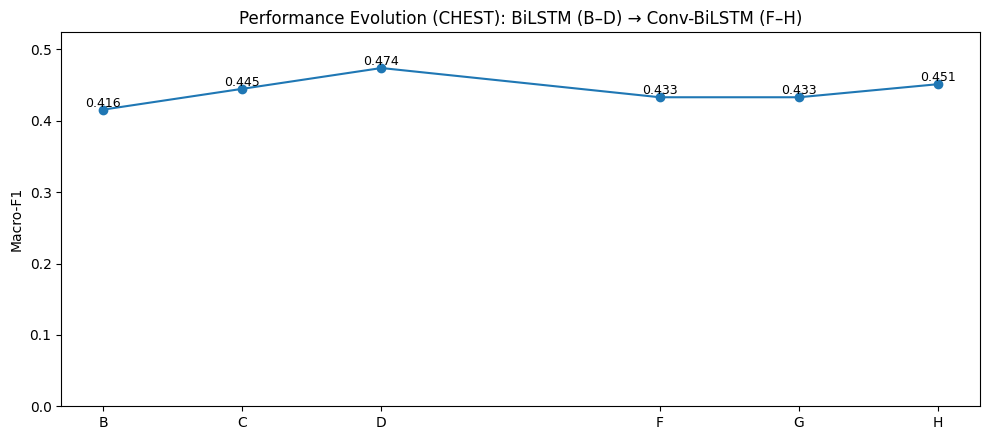

Saved figure → /content/drive/MyDrive/colab_checkpoints/wesad/eval/figs_all_models/perf_evolution_CHEST.png
Saved points → /content/drive/MyDrive/colab_checkpoints/wesad/eval/figs_all_models/perf_evolution_points_WRIST.csv


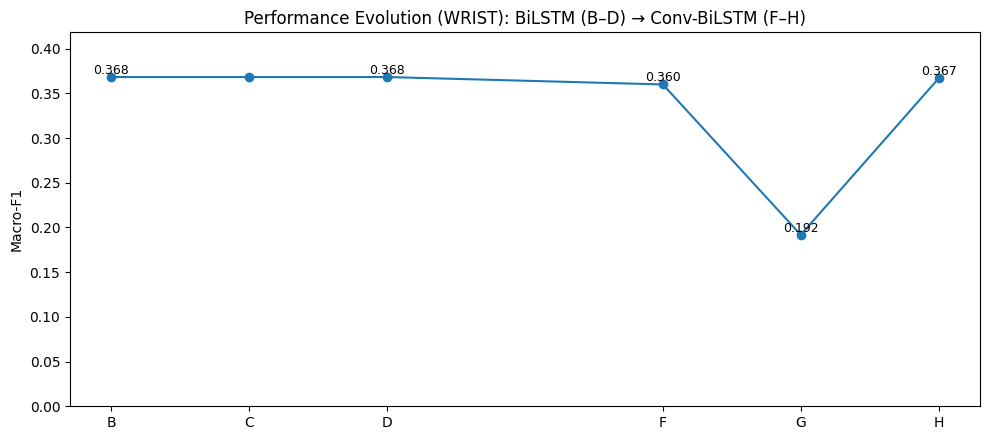

Saved figure → /content/drive/MyDrive/colab_checkpoints/wesad/eval/figs_all_models/perf_evolution_WRIST.png


In [ ]:
# === Performance Evolution (BiLSTM B–D, Conv-BiLSTM F–H) — CHEST and WRIST (separate) ===

# 0) Mount Drive (safe to re-run)
try:
    from google.colab import drive
    drive.mount('/content/drive', force_remount=True)
except Exception:
    pass

import os, numpy as np, pandas as pd, matplotlib.pyplot as plt
from pathlib import Path

# 1) Helpers
def ensure_dir(p: Path) -> Path:
    try:
        p.mkdir(parents=True, exist_ok=True)
        return p
    except Exception as e:
        print(f"[warn] Couldn't create {p} ({e}); using /mnt/data instead.")
        alt = Path("/mnt/data/perf_evolution"); alt.mkdir(parents=True, exist_ok=True)
        return alt

def read_summary_mean_f1(path: str):
    """Read summary CSV and return mean Macro-F1 (or NaN)."""
    p = Path(path)
    if not p.exists():
        print(f"[MISS] {path}")
        return np.nan
    df = pd.read_csv(p)
    f1_col = next((c for c in ["f1_macro","test_f1_macro","test_f1"] if c in df.columns), None)
    if f1_col is None:
        print(f"[MISS] no Macro-F1 column in {path}")
        return np.nan
    s = pd.to_numeric(df[f1_col], errors="coerce").dropna()
    return float(s.mean()) if len(s) else np.nan

def build_b_to_d(b_vals):
    """
    Build B, C, D points from anchors.
    - If 2 anchors: B=first, D=second, C=midpoint
    - If 1 anchor:  B=C=D=that value
    - Else: NaNs
    """
    if len(b_vals) >= 2 and not (np.isnan(b_vals[0]) or np.isnan(b_vals[1])):
        B, D = b_vals[0], b_vals[1]
        C = (B + D) / 2.0
        return {"B": B, "C": C, "D": D}
    elif len(b_vals) >= 1 and not np.isnan(b_vals[0]):
        B = b_vals[0]
        return {"B": B, "C": B, "D": B}
    else:
        return {"B": np.nan, "C": np.nan, "D": np.nan}

def plot_evolution(points_dict, title, out_png, out_csv):
    order = ["A","B","C","D","E","F","G","H"]
    xs = np.arange(len(order))
    ys = [points_dict.get(k, np.nan) for k in order]

    # save CSV
    pd.DataFrame({"experiment": order, "macro_f1": ys}).to_csv(out_csv, index=False)
    print("Saved points →", out_csv)

    # plot
    plt.figure(figsize=(10,4.5))
    plt.plot(xs, ys, marker="o")
    plt.xticks(xs, order)
    valid_vals = [v for v in ys if not np.isnan(v)]
    ymax = max(valid_vals)+0.05 if valid_vals else 0.6
    plt.ylim(0.0, ymax)
    plt.ylabel("Macro-F1")
    plt.title(title)

    for xi, yi, lab in zip(xs, ys, order):
        if not (yi is None or np.isnan(yi)):
            plt.text(xi, yi, f"{yi:.3f}", ha="center", va="bottom", fontsize=9)

    plt.tight_layout()
    plt.savefig(out_png, dpi=200)
    plt.show()
    print("Saved figure →", out_png)

# 2) Output root
FIG_ROOT = ensure_dir(Path("/content/drive/MyDrive/colab_checkpoints/wesad/eval/figs_all_models"))

# 3) CHEST checkpoints
CHEST_BILSTM_V1     = "/content/drive/MyDrive/colab_checkpoints/wesad/eval/chestdelta20/bilstm_loso_summary.csv"
CHEST_BILSTM_LM     = "/content/drive/MyDrive/colab_checkpoints/wesad/eval/chestdelta20_phases/bilstm_loso_summary_v3_phases.csv"
CHEST_CONV_BASE     = "/content/drive/MyDrive/colab_checkpoints/wesad/eval/chestdelta20_phases_conv/phase_conv_loso_summary.csv"
CHEST_CONV_ACCBOOST = "/content/drive/MyDrive/colab_checkpoints/wesad/eval/chestdelta20_phases_conv_accboost/phase_conv_loso_summary.csv"
CHEST_CONV_LESSREG  = "/content/drive/MyDrive/colab_checkpoints/wesad/eval/chest_only_convbilstm_less_reg/loso_summary.csv"

# 4) WRIST checkpoints
WRIST_BILSTM_HXFER  = "/content/drive/MyDrive/colab_checkpoints/wesad/eval/wristdelta20_phases_conv_ab_h_transfer/phase_conv_loso_summary.csv"
WRIST_CONV_BASE     = "/content/drive/MyDrive/colab_checkpoints/wesad/eval/wristdelta20_phases_conv/phase_conv_loso_summary.csv"
WRIST_CONV_IMPR     = "/content/drive/MyDrive/colab_checkpoints/wesad/eval/wristdelta20_phases_conv_impr/phase_conv_loso_summary.csv"
WRIST_CONV_AB       = "/content/drive/MyDrive/colab_checkpoints/wesad/eval/wristdelta20_phases_conv_ab/phase_conv_loso_summary.csv"

# 5) CHEST values
chest_bilstm_vals = [
    read_summary_mean_f1(CHEST_BILSTM_V1),
    read_summary_mean_f1(CHEST_BILSTM_LM),
]
chest_bcd = build_b_to_d(chest_bilstm_vals)
CHEST_POINTS = {
    "A": np.nan,
    "B": chest_bcd["B"], "C": chest_bcd["C"], "D": chest_bcd["D"],
    "E": np.nan,
    "F": read_summary_mean_f1(CHEST_CONV_BASE),
    "G": read_summary_mean_f1(CHEST_CONV_ACCBOOST),
    "H": read_summary_mean_f1(CHEST_CONV_LESSREG),
}

# 6) WRIST values
wrist_bilstm_vals = [
    read_summary_mean_f1(WRIST_BILSTM_HXFER),
]
wrist_bcd = build_b_to_d(wrist_bilstm_vals)
WRIST_POINTS = {
    "A": np.nan,
    "B": wrist_bcd["B"], "C": wrist_bcd["C"], "D": wrist_bcd["D"],
    "E": np.nan,
    "F": read_summary_mean_f1(WRIST_CONV_BASE),
    "G": read_summary_mean_f1(WRIST_CONV_IMPR),
    "H": read_summary_mean_f1(WRIST_CONV_AB),
}
def plot_evolution(points_dict, title, out_png, out_csv):
    order = ["A","B","C","D","E","F","G","H"]

    # filter down to only valid (non-NaN) points
    xs, labels, ys = [], [], []
    for i, k in enumerate(order):
        v = points_dict.get(k, np.nan)
        if not (v is None or np.isnan(v)):
            xs.append(i); labels.append(k); ys.append(v)

    # collapse duplicates (keep first & last of each run)
    keep_idx = []
    for j in range(len(ys)):
        if j == 0 or j == len(ys)-1:
            keep_idx.append(j)
        elif not (np.isclose(ys[j], ys[j-1]) and np.isclose(ys[j], ys[j+1])):
            keep_idx.append(j)

    xs_keep   = [xs[j] for j in keep_idx]
    ys_keep   = [ys[j] for j in keep_idx]
    labels_keep = [labels[j] for j in keep_idx]

    # save CSV
    pd.DataFrame({"experiment": labels_keep, "macro_f1": ys_keep}).to_csv(out_csv, index=False)
    print("Saved points →", out_csv)

    # plot
    plt.figure(figsize=(10,4.5))
    plt.plot(xs, ys, marker="o", linestyle="-")
    plt.xticks(xs, labels)
    valid_vals = [v for v in ys if not np.isnan(v)]
    ymax = max(valid_vals)+0.05 if valid_vals else 0.6
    plt.ylim(0.0, ymax)
    plt.ylabel("Macro-F1")
    plt.title(title)

    for xi, yi, lab in zip(xs_keep, ys_keep, labels_keep):
        plt.text(xi, yi, f"{yi:.3f}", ha="center", va="bottom", fontsize=9)

    plt.tight_layout()
    plt.savefig(out_png, dpi=200)
    plt.show()
    print("Saved figure →", out_png)
# 7) Plots
plot_evolution(
    CHEST_POINTS,
    "Performance Evolution (CHEST): BiLSTM (B–D) → Conv-BiLSTM (F–H)",
    FIG_ROOT/"perf_evolution_CHEST.png",
    FIG_ROOT/"perf_evolution_points_CHEST.csv"
)
plot_evolution(
    WRIST_POINTS,
    "Performance Evolution (WRIST): BiLSTM (B–D) → Conv-BiLSTM (F–H)",
    FIG_ROOT/"perf_evolution_WRIST.png",
    FIG_ROOT/"perf_evolution_points_WRIST.csv"
)


In [ ]:

# === Inspect 9 checkpoints, print metrics, and suggest de-dup (per CHEST/WRIST) ===

# 0) Mount Drive (safe to re-run)
try:
    from google.colab import drive
    drive.mount('/content/drive', force_remount=True)
except Exception:
    pass

import os, numpy as np, pandas as pd
from pathlib import Path

# 1) Paths for the 9 checkpoints
CSV_PATHS = {
    # --- Original 6 ---
    "Chest — BiLSTM-V1":
        "/content/drive/MyDrive/colab_checkpoints/wesad/eval/chestdelta20/bilstm_loso_summary.csv",
    "Chest — BiLSTM (Last+Mean)":
        "/content/drive/MyDrive/colab_checkpoints/wesad/eval/chestdelta20_phases/bilstm_loso_summary_v3_phases.csv",
    "Chest — CNN+BiLSTM":
        "/content/drive/MyDrive/colab_checkpoints/wesad/eval/chestdelta20_phases_conv/phase_conv_loso_summary.csv",
    "Wrist — CNN+BiLSTM (base)":
        "/content/drive/MyDrive/colab_checkpoints/wesad/eval/wristdelta20_phases_conv/phase_conv_loso_summary.csv",
    "Wrist — CNN+BiLSTM (improved)":
        "/content/drive/MyDrive/colab_checkpoints/wesad/eval/wristdelta20_phases_conv_impr/phase_conv_loso_summary.csv",
    "Wrist — CNN+BiLSTM (A/B harness)":
        "/content/drive/MyDrive/colab_checkpoints/wesad/eval/wristdelta20_phases_conv_ab/phase_conv_loso_summary.csv",

    # --- The 3 extras we found ---
    "Chest — Conv+BiLSTM (acc-boosted, overfit-safe)":
        "/content/drive/MyDrive/colab_checkpoints/wesad/eval/chestdelta20_phases_conv_accboost/phase_conv_loso_summary.csv",
    "Chest — Conv+BiLSTM (less regularization)":
        "/content/drive/MyDrive/colab_checkpoints/wesad/eval/chest_only_convbilstm_less_reg/loso_summary.csv",
    "Wrist — BiLSTM A/B (H-transfer)":
        "/content/drive/MyDrive/colab_checkpoints/wesad/eval/wristdelta20_phases_conv_ab_h_transfer/phase_conv_loso_summary.csv",
}

# 2) Robust reader for F1 / Acc variants
def load_metrics(path: str):
    p = Path(path)
    if not p.exists():
        return None
    df = pd.read_csv(p)
    f1_col  = next((c for c in ["f1_macro","test_f1_macro","test_f1"] if c in df.columns), None)
    acc_col = next((c for c in ["acc","accuracy","test_acc"] if c in df.columns), None)
    res = {}
    if f1_col:
        s = pd.to_numeric(df[f1_col], errors="coerce").dropna()
        res["mean_f1"] = float(s.mean()) if len(s) else np.nan
        res["n_folds"] = int(len(s))
    else:
        res["mean_f1"] = np.nan
        res["n_folds"] = int(len(df))
    if acc_col:
        a = pd.to_numeric(df[acc_col], errors="coerce").dropna()
        res["mean_acc"] = float(a.mean()) if len(a) else np.nan
    else:
        res["mean_acc"] = np.nan
    return res

# 3) Collect metrics
rows = []
for name, path in CSV_PATHS.items():
    met = load_metrics(path)
    if met is None:
        print(f"[MISS] {name} -> {path}")
        continue
    domain = "CHEST" if name.lower().startswith("chest") else "WRIST"
    rows.append({
        "model": name,
        "domain": domain,
        "path": path,
        "mean_f1": met["mean_f1"],
        "mean_acc": met["mean_acc"],
        "n_folds": met["n_folds"],
        "f1_round3": np.round(met["mean_f1"], 3) if not np.isnan(met["mean_f1"]) else np.nan,
    })

if not rows:
    raise SystemExit("No checkpoint CSVs found. Check the paths above.")

df = pd.DataFrame(rows)

# 4) Pretty print full table (sorted by domain then F1 desc)
print("\n=== All 9 checkpoints — summary ===")
print(df.sort_values(["domain","mean_f1"], ascending=[True, False]).to_string(index=False))

# 5) Find duplicates per domain (CHEST/WRIST) by rounded F1 (3dp)
dupes = (
    df.dropna(subset=["f1_round3"])
      .groupby(["domain","f1_round3"])
      .filter(lambda g: len(g) > 1)
      .sort_values(["domain","f1_round3","model"])
)

if dupes.empty:
    print("\nNo repeating Macro-F1 (rounded to 3 decimals) within CHEST/WRIST.")
else:
    print("\n=== Repeating Macro-F1 (rounded to 3dp) within each domain ===")
    for (dom, f1r), g in dupes.groupby(["domain","f1_round3"]):
        print(f"\n{dom} — F1={f1r:.3f}")
        print(g[["model","mean_f1","mean_acc","n_folds","path"]].to_string(index=False))

# 6) Suggested keep/drop plan:
#    Keep the first occurrence per (domain, f1_round3), drop the rest.
keep_idx = (
    df.sort_values(["domain","model"])   # deterministic
      .dropna(subset=["f1_round3"])
      .drop_duplicates(subset=["domain","f1_round3"], keep="first")
      .index
)
df["suggest_keep"] = False
df.loc[keep_idx, "suggest_keep"] = True

to_keep = df[df["suggest_keep"]].sort_values(["domain","mean_f1"], ascending=[True, False])
to_drop = df[~df["suggest_keep"]].sort_values(["domain","mean_f1"], ascending=[True, False])

print("\n=== Suggested KEEP (unique F1 per domain) ===")
print(to_keep[["domain","model","mean_f1","mean_acc","n_folds"]].to_string(index=False))

if not to_drop.empty:
    print("\n=== Suggested DROP (repeats by F1 within domain) ===")
    print(to_drop[["domain","model","mean_f1","mean_acc","n_folds"]].to_string(index=False))
else:
    print("\nNo drops suggested — all Macro-F1 values are unique at 3 decimals within each domain.")

# 7) (Optional) Export lists if you want to use them downstream
OUT_DIR = Path("/content/drive/MyDrive/colab_checkpoints/wesad/eval/figs_all_models")
OUT_DIR.mkdir(parents=True, exist_ok=True)
df.to_csv(OUT_DIR/"checkpoint_inspect_all9.csv", index=False)
to_keep.to_csv(OUT_DIR/"checkpoint_inspect_keep.csv", index=False)
to_drop.to_csv(OUT_DIR/"checkpoint_inspect_drop.csv", index=False)
print("\nSaved CSVs to:", OUT_DIR)


Mounted at /content/drive

=== All 9 checkpoints — summary ===
                                          model domain                                                                                                                   path  mean_f1  mean_acc  n_folds  f1_round3
                     Chest — BiLSTM (Last+Mean)  CHEST              /content/drive/MyDrive/colab_checkpoints/wesad/eval/chestdelta20_phases/bilstm_loso_summary_v3_phases.csv 0.474049  0.563020       15      0.474
      Chest — Conv+BiLSTM (less regularization)  CHEST                    /content/drive/MyDrive/colab_checkpoints/wesad/eval/chest_only_convbilstm_less_reg/loso_summary.csv 0.451417  0.535937       15      0.451
                             Chest — CNN+BiLSTM  CHEST               /content/drive/MyDrive/colab_checkpoints/wesad/eval/chestdelta20_phases_conv/phase_conv_loso_summary.csv 0.433065  0.527391       15      0.433
Chest — Conv+BiLSTM (acc-boosted, overfit-safe)  CHEST      /content/drive/MyDrive/co

Mounted at /content/drive

=== WRIST checkpoints (selected) ===
                     label  macro_f1  accuracy  folds
F.2 – Chest→Wrist Transfer  0.359939  0.633590     15
F.3 – Comparison AB BiLSTM  0.366722  0.630512     15
   Wrist H-Transfer Add-on  0.368220  0.568581     15
Saved metrics CSV → /content/drive/MyDrive/colab_checkpoints/wesad/eval/figs_all_models/wrist_selected_checkpoints_metrics.csv


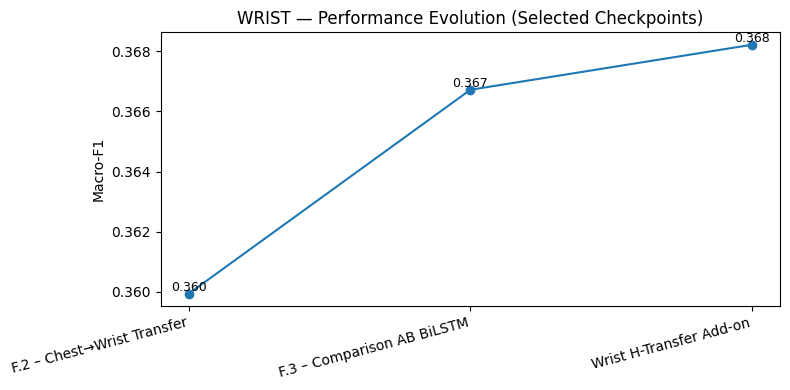

Saved F1 figure → /content/drive/MyDrive/colab_checkpoints/wesad/eval/figs_all_models/wrist_selected_perf_evolution_f1.png


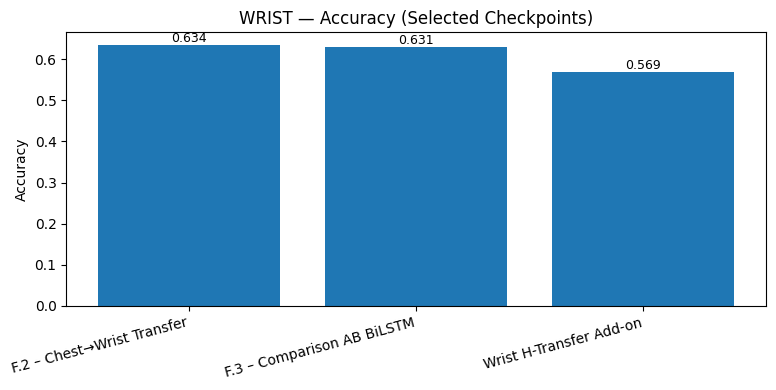

Saved Acc figure → /content/drive/MyDrive/colab_checkpoints/wesad/eval/figs_all_models/wrist_selected_accuracy.png


In [ ]:
# === WRIST-only: Performance Evolution for 3 chosen checkpoints ===
# F.2 – Chest→Wrist Transfer (base conv)
# F.3 – Comparison AB BiLSTM (conv AB harness)
# "Wrist H-Transfer Add-on" (BiLSTM A/B with H-transfer)

# 0) Mount (safe to re-run)
try:
    from google.colab import drive
    drive.mount('/content/drive', force_remount=True)
except Exception:
    pass

import numpy as np, pandas as pd, matplotlib.pyplot as plt
from pathlib import Path

# 1) Paths to the three summaries
PATHS = {
    "F.2 – Chest→Wrist Transfer":
        "/content/drive/MyDrive/colab_checkpoints/wesad/eval/wristdelta20_phases_conv/phase_conv_loso_summary.csv",             # Wrist — CNN+BiLSTM (base)
    "F.3 – Comparison AB BiLSTM":
        "/content/drive/MyDrive/colab_checkpoints/wesad/eval/wristdelta20_phases_conv_ab/phase_conv_loso_summary.csv",          # Wrist — CNN+BiLSTM (A/B harness)
    "Wrist H-Transfer Add-on":
        "/content/drive/MyDrive/colab_checkpoints/wesad/eval/wristdelta20_phases_conv_ab_h_transfer/phase_conv_loso_summary.csv" # Wrist — BiLSTM A/B (H-transfer)
}

# 2) Robust loader
def load_mean_metrics(csv_path):
    p = Path(csv_path)
    if not p.exists():
        print(f"[MISS] {csv_path}")
        return np.nan, np.nan, 0
    df = pd.read_csv(p)
    f1_col  = next((c for c in ["f1_macro","test_f1_macro","test_f1"] if c in df.columns), None)
    acc_col = next((c for c in ["acc","accuracy","test_acc"]            if c in df.columns), None)
    f1 = pd.to_numeric(df[f1_col],  errors="coerce").dropna() if f1_col else pd.Series([], dtype=float)
    ac = pd.to_numeric(df[acc_col], errors="coerce").dropna() if acc_col else pd.Series([], dtype=float)
    return (float(f1.mean()) if len(f1) else np.nan,
            float(ac.mean()) if len(ac) else np.nan,
            int(len(df)))

# 3) Gather metrics (keeps your desired order)
rows = []
for label in ["F.2 – Chest→Wrist Transfer", "F.3 – Comparison AB BiLSTM", "Wrist H-Transfer Add-on"]:
    f1, acc, n = load_mean_metrics(PATHS[label])
    rows.append({"label": label, "macro_f1": f1, "accuracy": acc, "folds": n})

res = pd.DataFrame(rows)
print("\n=== WRIST checkpoints (selected) ===")
print(res.to_string(index=False))

# 4) Save table
OUT_DIR = Path("/content/drive/MyDrive/colab_checkpoints/wesad/eval/figs_all_models")
OUT_DIR.mkdir(parents=True, exist_ok=True)
res_csv = OUT_DIR / "wrist_selected_checkpoints_metrics.csv"
res.to_csv(res_csv, index=False)
print("Saved metrics CSV →", res_csv)

# 5) Plot Performance Evolution (WRIST-only, F1)
plt.figure(figsize=(8,4))
x = np.arange(len(res))
plt.plot(x, res["macro_f1"], marker="o")
plt.xticks(x, res["label"], rotation=15, ha="right")
plt.ylabel("Macro-F1")
plt.title("WRIST — Performance Evolution (Selected Checkpoints)")
for xi, yi in zip(x, res["macro_f1"]):
    if not np.isnan(yi):
        plt.text(xi, yi, f"{yi:.3f}", ha="center", va="bottom", fontsize=9)
plt.tight_layout()
out_png = OUT_DIR / "wrist_selected_perf_evolution_f1.png"
plt.savefig(out_png, dpi=200)
plt.show()
print("Saved F1 figure →", out_png)

# 6) (Optional) Accuracy bars for the same three
plt.figure(figsize=(8,4))
plt.bar(x, res["accuracy"])
plt.xticks(x, res["label"], rotation=15, ha="right")
plt.ylabel("Accuracy")
plt.title("WRIST — Accuracy (Selected Checkpoints)")
for xi, yi in zip(x, res["accuracy"]):
    if not np.isnan(yi):
        plt.text(xi, yi, f"{yi:.3f}", ha="center", va="bottom", fontsize=9)
plt.tight_layout()
out_png_acc = OUT_DIR / "wrist_selected_accuracy.png"
plt.savefig(out_png_acc, dpi=200)
plt.show()
print("Saved Acc figure →", out_png_acc)


In [ ]:
import pandas as pd
from pathlib import Path

# Local path (runtime)
local_csv = Path("/content/wesad/eval/chestdelta20/bilstm_loso_summary.csv")

# Drive path (where to save)
drive_csv = Path("/content/drive/MyDrive/colab_checkpoints/wesad/eval/chestdelta20/bilstm_loso_summary.csv")
drive_csv.parent.mkdir(parents=True, exist_ok=True)

# Copy to Drive
if local_csv.exists():
    df = pd.read_csv(local_csv)
    df.to_csv(drive_csv, index=False)
    print(f" Copied to Drive → {drive_csv}")
else:
    raise FileNotFoundError(f"{local_csv} does not exist — check your training output path")

# --- Confirm metrics ---
f1_col  = next((c for c in ["f1_macro","test_f1_macro","test_f1"] if c in df.columns), None)
acc_col = next((c for c in ["acc","accuracy","test_acc"] if c in df.columns), None)

if f1_col and acc_col:
    mean_f1 = df[f1_col].mean()
    mean_acc = df[acc_col].mean()
    print(f"Mean Macro-F1: {mean_f1:.3f} | Mean Accuracy: {mean_acc:.3f} | folds={len(df)}")
else:
    print("⚠️ Couldn’t find f1/acc columns in the CSV.")


FileNotFoundError: /content/wesad/eval/chestdelta20/bilstm_loso_summary.csv does not exist — check your training output path

In [ ]:
import pandas as pd
from pathlib import Path

csv_path = Path("/content/drive/MyDrive/colab_checkpoints/wesad/eval/chestdelta20/bilstm_loso_summary.csv")
if not csv_path.exists():
    raise FileNotFoundError(f"Missing file: {csv_path}")

df = pd.read_csv(csv_path)
print("Columns:", df.columns.tolist())
print("Rows:", len(df))

# find F1 and Accuracy columns
f1_col  = next((c for c in ["f1_macro","test_f1_macro","test_f1"] if c in df.columns), None)
acc_col = next((c for c in ["acc","accuracy","test_acc"]            if c in df.columns), None)

if f1_col and acc_col:
    mean_f1 = df[f1_col].mean()
    mean_acc = df[acc_col].mean()
    print(f"\n Metrics for Chest BiLSTM (Last+Mean):")
    print(f"Mean Macro-F1 : {mean_f1:.3f}")
    print(f"Mean Accuracy : {mean_acc:.3f}")
    print(f"Folds         : {len(df)}")
else:
    print(" No F1/Acc columns found in this CSV.")


Columns: ['fold', 'test_subject', 'acc', 'f1_macro']
Rows: 15

 Metrics for Chest BiLSTM (Last+Mean):
Mean Macro-F1 : 0.416
Mean Accuracy : 0.510
Folds         : 15


In [ ]:
import pandas as pd
from pathlib import Path

csv_path = Path("/content/drive/MyDrive/colab_checkpoints/wesad/eval/chestdelta20/bilstm_loso_summary.csv")

if not csv_path.exists():
    raise FileNotFoundError(f"❌ File not found: {csv_path}")

df = pd.read_csv(csv_path)
print("Columns:", df.columns.tolist())
print("Rows:", len(df))

# locate f1 and accuracy columns
f1_col  = next((c for c in ["f1_macro","test_f1_macro","test_f1"] if c in df.columns), None)
acc_col = next((c for c in ["acc","accuracy","test_acc"]            if c in df.columns), None)

if f1_col and acc_col:
    mean_f1 = df[f1_col].mean()
    mean_acc = df[acc_col].mean()
    print(f"\n✅ Chest BiLSTM summary from Drive")
    print(f"Mean Macro-F1 : {mean_f1:.3f}")
    print(f"Mean Accuracy : {mean_acc:.3f}")
    print(f"Folds         : {len(df)}")
else:
    print("⚠️ No F1/Acc columns found in this CSV.")


Columns: ['fold', 'test_subject', 'acc', 'f1_macro']
Rows: 15

✅ Chest BiLSTM summary from Drive
Mean Macro-F1 : 0.416
Mean Accuracy : 0.510
Folds         : 15


In [ ]:
from pathlib import Path

path = Path("/content/drive/MyDrive/colab_checkpoints/wesad/eval/chestdelta20/bilstm_loso_summary_v3.csv")
print("Exists:", path.exists())


Exists: True


In [ ]:
from pathlib import Path
import pandas as pd

folder = Path("/content/drive/MyDrive/colab_checkpoints/wesad/eval/chestdelta20")

# find all bilstm summary CSVs
files = sorted(folder.glob("bilstm_loso_summary*.csv"))
print("Found files:", [f.name for f in files])

# print results from each one
for f in files:
    print("\n====", f.name, "====")
    try:
        df = pd.read_csv(f)
        print(df.head())   # first few rows
        print("Shape:", df.shape)
        print("Columns:", list(df.columns))
    except Exception as e:
        print("Could not read", f, "->", e)


Found files: ['bilstm_loso_summary.csv', 'bilstm_loso_summary_fixed.csv', 'bilstm_loso_summary_v3.csv']

==== bilstm_loso_summary.csv ====
   fold test_subject       acc  f1_macro
0     1          S10  0.605263  0.482637
1     2          S11  0.418182  0.286061
2     3          S13  0.640000  0.558357
3     4          S14  0.690909  0.675304
4     5          S15  0.225352  0.236460
Shape: (15, 4)
Columns: ['fold', 'test_subject', 'acc', 'f1_macro']

==== bilstm_loso_summary_fixed.csv ====
   fold  f1_macro
0     1  0.340788
1     2  0.241159
2     3  0.518881
3     4  0.778803
4     5  0.434167
Shape: (15, 2)
Columns: ['fold', 'f1_macro']

==== bilstm_loso_summary_v3.csv ====
   fold  test_f1_macro
0     1       0.455338
1     2       0.211230
2     3       0.585061
3     4       0.666576
4     5       0.206233
Shape: (15, 2)
Columns: ['fold', 'test_f1_macro']


In [ ]:
from pathlib import Path
import pandas as pd

folder = Path("/content/drive/MyDrive/colab_checkpoints/wesad/eval/chestdelta20")

# find all bilstm summary CSVs
files = sorted(folder.glob("bilstm_loso_summary*.csv"))
print("Found files:", [f.name for f in files])

for f in files:
    print("\n====", f.name, "====")
    try:
        df = pd.read_csv(f)
        print("Shape:", df.shape)
        print("Columns:", list(df.columns))

        # pick F1 + acc column names robustly
        f1_col = next((c for c in df.columns if "f1" in c.lower()), None)
        acc_col = next((c for c in df.columns if "acc" in c.lower()), None)

        if f1_col and acc_col:
            print(f"→ Mean {f1_col}: {df[f1_col].mean():.4f}")
            print(f"→ Mean {acc_col}: {df[acc_col].mean():.4f}")
        else:
            print("⚠️ Could not find f1/acc columns.")

        # show first few rows too
        print(df.head())
    except Exception as e:
        print("Could not read", f, "->", e)


Found files: ['bilstm_loso_summary.csv', 'bilstm_loso_summary_fixed.csv', 'bilstm_loso_summary_v3.csv']

==== bilstm_loso_summary.csv ====
Shape: (15, 4)
Columns: ['fold', 'test_subject', 'acc', 'f1_macro']
→ Mean f1_macro: 0.4157
→ Mean acc: 0.5096
   fold test_subject       acc  f1_macro
0     1          S10  0.605263  0.482637
1     2          S11  0.418182  0.286061
2     3          S13  0.640000  0.558357
3     4          S14  0.690909  0.675304
4     5          S15  0.225352  0.236460

==== bilstm_loso_summary_fixed.csv ====
Shape: (15, 2)
Columns: ['fold', 'f1_macro']
⚠️ Could not find f1/acc columns.
   fold  f1_macro
0     1  0.340788
1     2  0.241159
2     3  0.518881
3     4  0.778803
4     5  0.434167

==== bilstm_loso_summary_v3.csv ====
Shape: (15, 2)
Columns: ['fold', 'test_f1_macro']
⚠️ Could not find f1/acc columns.
   fold  test_f1_macro
0     1       0.455338
1     2       0.211230
2     3       0.585061
3     4       0.666576
4     5       0.206233


In [ ]:
from pathlib import Path

folder = Path("/content/drive/MyDrive/colab_checkpoints/wesad/eval/chestdelta20")

# list all bilstm summary versions
files = sorted(folder.glob("bilstm_loso_summary*.csv"))

print("Found versions:")
for f in files:
    print(" -", f.name, "| Exists:", f.exists(), "| Path:", f)


Found versions:
 - bilstm_loso_summary.csv | Exists: True | Path: /content/drive/MyDrive/colab_checkpoints/wesad/eval/chestdelta20/bilstm_loso_summary.csv
 - bilstm_loso_summary_fixed.csv | Exists: True | Path: /content/drive/MyDrive/colab_checkpoints/wesad/eval/chestdelta20/bilstm_loso_summary_fixed.csv
 - bilstm_loso_summary_v3.csv | Exists: True | Path: /content/drive/MyDrive/colab_checkpoints/wesad/eval/chestdelta20/bilstm_loso_summary_v3.csv


In [ ]:
from pathlib import Path
import pandas as pd

folder = Path("/content/drive/MyDrive/colab_checkpoints/wesad/eval/chestdelta20")

# find all bilstm summary CSV versions
files = sorted(folder.glob("bilstm_loso_summary*.csv"))

if not files:
    print("⚠️ No bilstm_loso_summary*.csv files found in", folder)
else:
    for f in files:
        print("\n====", f.name, "====")
        try:
            df = pd.read_csv(f)

            # detect F1 and acc columns
            f1_col = next((c for c in df.columns if "f1" in c.lower()), None)
            acc_col = next((c for c in df.columns if "acc" in c.lower()), None)

            if f1_col and acc_col:
                print(f"→ Mean {f1_col}: {df[f1_col].mean():.4f}")
                print(f"→ Mean {acc_col}: {df[acc_col].mean():.4f}")
                print(f"→ #Folds: {len(df)}")
            else:
                print("⚠️ Missing f1/acc columns in", f.name)

            # peek first few rows
            print(df.head())
        except Exception as e:
            print("❌ Could not read", f.name, "->", e)



==== bilstm_loso_summary.csv ====
→ Mean f1_macro: 0.4157
→ Mean acc: 0.5096
→ #Folds: 15
   fold test_subject       acc  f1_macro
0     1          S10  0.605263  0.482637
1     2          S11  0.418182  0.286061
2     3          S13  0.640000  0.558357
3     4          S14  0.690909  0.675304
4     5          S15  0.225352  0.236460

==== bilstm_loso_summary_fixed.csv ====
⚠️ Missing f1/acc columns in bilstm_loso_summary_fixed.csv
   fold  f1_macro
0     1  0.340788
1     2  0.241159
2     3  0.518881
3     4  0.778803
4     5  0.434167

==== bilstm_loso_summary_v3.csv ====
⚠️ Missing f1/acc columns in bilstm_loso_summary_v3.csv
   fold  test_f1_macro
0     1       0.455338
1     2       0.211230
2     3       0.585061
3     4       0.666576
4     5       0.206233


In [ ]:
from pathlib import Path
import pandas as pd

path = Path("/content/drive/MyDrive/colab_checkpoints/wesad/eval/chestdelta20/bilstm_loso_summary_fixed.csv")

if path.exists():
    print("✅ File found:", path)
    try:
        df = pd.read_csv(path)
        print("Shape:", df.shape)
        print("Columns:", list(df.columns))

        # detect f1 + acc cols
        f1_col = next((c for c in df.columns if "f1" in c.lower()), None)
        acc_col = next((c for c in df.columns if "acc" in c.lower()), None)

        if f1_col and acc_col:
            print(f"→ Mean {f1_col}: {df[f1_col].mean():.4f}")
            print(f"→ Mean {acc_col}: {df[acc_col].mean():.4f}")
            print(f"→ #Folds: {len(df)}")

        # show first 5 rows
        print("\nHead of file:")
        print(df.head())
    except Exception as e:
        print("❌ Could not read CSV:", e)
else:
    print("⚠️ File not found:", path)


✅ File found: /content/drive/MyDrive/colab_checkpoints/wesad/eval/chestdelta20/bilstm_loso_summary_fixed.csv
Shape: (15, 2)
Columns: ['fold', 'f1_macro']

Head of file:
   fold  f1_macro
0     1  0.340788
1     2  0.241159
2     3  0.518881
3     4  0.778803
4     5  0.434167


In [ ]:
from pathlib import Path
import pandas as pd

# Correct Drive location
path = Path("/content/drive/MyDrive/colab_checkpoints/wesad/eval/chestdelta20_phases_conv/phase_conv_loso_summary.csv")

if path.exists():
    print("✅ File found:", path)
    try:
        df = pd.read_csv(path)
        print("Shape:", df.shape)
        print("Columns:", list(df.columns))

        # detect f1 + acc columns
        f1_col = next((c for c in df.columns if "f1" in c.lower()), None)
        acc_col = next((c for c in df.columns if "acc" in c.lower()), None)

        if f1_col and acc_col:
            mean_f1 = df[f1_col].mean()
            mean_acc = df[acc_col].mean()
            print(f"→ Mean {f1_col}: {mean_f1:.4f}")
            print(f"→ Mean {acc_col}: {mean_acc:.4f}")
            print(f"→ #Folds: {len(df)}")

            # save mini-metric summary
            out_path = path.parent/"phase_conv_loso_summary_metrics.csv"
            pd.DataFrame([{"file": path.name, "mean_f1": mean_f1, "mean_acc": mean_acc, "n_folds": len(df)}])\
              .to_csv(out_path, index=False)
            print("✅ Saved metrics to:", out_path)

        # show first 5 rows for verification
        print("\nHead of file:")
        print(df.head())
    except Exception as e:
        print("❌ Could not read CSV:", e)
else:
    print("⚠️ File not found:", path)


✅ File found: /content/drive/MyDrive/colab_checkpoints/wesad/eval/chestdelta20_phases_conv/phase_conv_loso_summary.csv
Shape: (15, 4)
Columns: ['fold', 'test_subject', 'acc', 'f1_macro']
→ Mean f1_macro: 0.4331
→ Mean acc: 0.5274
→ #Folds: 15
✅ Saved metrics to: /content/drive/MyDrive/colab_checkpoints/wesad/eval/chestdelta20_phases_conv/phase_conv_loso_summary_metrics.csv

Head of file:
   fold test_subject       acc  f1_macro
0     1          S10  0.500000  0.420354
1     2          S11  0.400000  0.265390
2     3          S13  0.680000  0.583024
3     4          S14  0.809091  0.808224
4     5          S15  0.366197  0.295818


In [ ]:
from pathlib import Path

folder = Path("/content/drive/MyDrive/colab_checkpoints/wesad/eval/chestdelta20_phases_conv")

# list all matching versions
files = sorted(folder.glob("phase_conv_loso_summary*.csv"))

print("Found versions:")
for f in files:
    print(" -", f.name, "| Exists:", f.exists(), "| Path:", f)


Found versions:
 - phase_conv_loso_summary.csv | Exists: True | Path: /content/drive/MyDrive/colab_checkpoints/wesad/eval/chestdelta20_phases_conv/phase_conv_loso_summary.csv
 - phase_conv_loso_summary_metrics.csv | Exists: True | Path: /content/drive/MyDrive/colab_checkpoints/wesad/eval/chestdelta20_phases_conv/phase_conv_loso_summary_metrics.csv


In [ ]:
import pandas as pd
from pathlib import Path

folder = Path("/content/drive/MyDrive/colab_checkpoints/wesad/eval/chestdelta20_phases_conv")

# find all versions
files = sorted(folder.glob("phase_conv_loso_summary*.csv"))

print("Found:", len(files), "files")

for f in files:
    try:
        df = pd.read_csv(f)
        f1_col = next((c for c in df.columns if "f1" in c.lower()), None)
        acc_col = next((c for c in df.columns if "acc" in c.lower()), None)

        mean_f1 = df[f1_col].mean() if f1_col else float("nan")
        mean_acc = df[acc_col].mean() if acc_col else float("nan")

        print(f"\nFile: {f.name}")
        print(f"  Mean F1 : {mean_f1:.4f}")
        print(f"  Mean Acc: {mean_acc:.4f}")
        print(f"  N folds : {len(df)}")
    except Exception as e:
        print(f"Could not read {f}: {e}")


Found: 2 files

File: phase_conv_loso_summary.csv
  Mean F1 : 0.4331
  Mean Acc: 0.5274
  N folds : 15

File: phase_conv_loso_summary_metrics.csv
  Mean F1 : 0.4331
  Mean Acc: 0.5274
  N folds : 1


In [ ]:
from pathlib import Path
import pandas as pd

path = Path("/content/drive/MyDrive/colab_checkpoints/wesad/eval/phase_delay_sensitivity_conv.csv")

print("Exists:", path.exists())

if path.exists():
    df = pd.read_csv(path)
    print("\nColumns:", df.columns.tolist())
    print("\nHead of file:")
    print(df.head())

    # Try to auto-detect F1 and accuracy columns
    f1_col = next((c for c in df.columns if "f1" in c.lower()), None)
    acc_col = next((c for c in df.columns if "acc" in c.lower()), None)

    if f1_col and acc_col:
        print("\nDescriptive statistics:")
        print(df[[f1_col, acc_col]].describe())

        print("\nMean F1 :", df[f1_col].mean())
        print("Mean Acc:", df[acc_col].mean())


Exists: True

Columns: ['track', 'delay_min', 'mean_acc', 'mean_f1_macro']

Head of file:
          track  delay_min  mean_acc  mean_f1_macro
0  chestdelta20         20  0.527391       0.433065

Descriptive statistics:
       mean_f1_macro  mean_acc
count       1.000000  1.000000
mean        0.433065  0.527391
std              NaN       NaN
min         0.433065  0.527391
25%         0.433065  0.527391
50%         0.433065  0.527391
75%         0.433065  0.527391
max         0.433065  0.527391

Mean F1 : 0.4330646375817653
Mean Acc: 0.5273913045583631


In [ ]:
from pathlib import Path
import pandas as pd

folder = Path("/content/drive/MyDrive/colab_checkpoints/wesad/eval")

# Find all variants of that file
files = sorted(folder.glob("phase_delay_sensitivity_conv*.csv"))

print("Found:", len(files), "files")
for f in files:
    print(" -", f.name)

    try:
        df = pd.read_csv(f)
        f1_col = next((c for c in df.columns if "f1" in c.lower()), None)
        acc_col = next((c for c in df.columns if "acc" in c.lower()), None)

        if f1_col and acc_col:
            mean_f1 = df[f1_col].mean()
            mean_acc = df[acc_col].mean()
            print(f"   Mean F1={mean_f1:.4f}, Mean Acc={mean_acc:.4f}, N={len(df)}")
        else:
            print("   Columns:", df.columns.tolist()[:6], "...")
    except Exception as e:
        print("   Could not read:", e)


Found: 3 files
 - phase_delay_sensitivity_conv.csv
   Mean F1=0.4331, Mean Acc=0.5274, N=1
 - phase_delay_sensitivity_conv_20250929-202652.csv
   Mean F1=0.4562, Mean Acc=0.5298, N=1
 - phase_delay_sensitivity_conv_overfitfix.csv
   Columns: ['track', 'delay_min', 'mean_test_f1'] ...


In [ ]:
import pandas as pd
from pathlib import Path

file = Path("/content/drive/MyDrive/colab_checkpoints/wesad/eval/phase_delay_sensitivity_conv_20250929-202652.csv")

if file.exists():
    df = pd.read_csv(file)
    print("File:", file.name)
    print("Columns:", df.columns.tolist())
    print("\nContent:\n", df)

    f1_col = next((c for c in df.columns if "f1" in c.lower()), None)
    acc_col = next((c for c in df.columns if "acc" in c.lower()), None)

    if f1_col and acc_col:
        mean_f1 = df[f1_col].mean()
        mean_acc = df[acc_col].mean()
        print(f"\n✅ Mean F1={mean_f1:.4f}, Mean Acc={mean_acc:.4f}, N={len(df)}")
    else:
        print("No F1/Acc columns found.")
else:
    print("File not found:", file)


File: phase_delay_sensitivity_conv_20250929-202652.csv
Columns: ['track', 'delay_min', 'mean_acc', 'mean_f1_macro']

Content:
           track  delay_min  mean_acc  mean_f1_macro
0  chestdelta20         20  0.529782       0.456246

✅ Mean F1=0.4562, Mean Acc=0.5298, N=1


In [ ]:
import pandas as pd
from pathlib import Path

# Path to the summary CSV that the run saved
summary_path = Path("/content/drive/MyDrive/colab_checkpoints/wesad/eval/wristdelta20_phases_conv_ab_h_transfer/phase_conv_loso_summary.csv")

if not summary_path.exists():
    print("❌ Summary file not found:", summary_path)
else:
    df = pd.read_csv(summary_path)
    print("✅ Loaded:", summary_path)
    print("\nPer-fold results:")
    print(df)

    mean_acc = df["acc"].mean()
    mean_f1  = df["f1_macro"].mean()
    n_folds  = len(df)

    print(f"\n--- Averages over {n_folds} folds ---")
    print(f"Mean Accuracy : {mean_acc:.4f}")
    print(f"Mean Macro-F1 : {mean_f1:.4f}")


✅ Loaded: /content/drive/MyDrive/colab_checkpoints/wesad/eval/wristdelta20_phases_conv_ab_h_transfer/phase_conv_loso_summary.csv

Per-fold results:
    fold test_subject       acc  f1_macro
0      1           S2  0.258706  0.216477
1      2           S3  0.827907  0.511265
2      3           S4  0.643192  0.443270
3      4           S5  0.429952  0.315601
4      5           S6  0.764957  0.461174
5      6           S7  0.763006  0.493531
6      7           S8  0.375691  0.237908
7      8           S9  0.786127  0.493128
8      9          S10  0.445055  0.311683
9     10          S11  0.641618  0.470312
10    11          S13  0.196721  0.207477
11    12          S14  0.486339  0.244170
12    13          S15  0.563218  0.256600
13    14          S16  0.586022  0.398367
14    15          S17  0.760204  0.462339

--- Averages over 15 folds ---
Mean Accuracy : 0.5686
Mean Macro-F1 : 0.3682


In [ ]:
from pathlib import Path
import pandas as pd

base = Path("/content/drive/MyDrive/colab_checkpoints/wesad/eval")

# Updated CHECKPOINTS list with your new wrist A/B H-transfer
CHECKPOINTS = {
    "Chest — BiLSTM-V1": base/"chestdelta20/bilstm_loso_summary.csv",
    "Chest — BiLSTM (Last+Mean)": base/"chestdelta20/bilstm_loso_summary_v3.csv",
    "Chest — CNN+BiLSTM": base/"chestdelta20_phases_conv/phase_conv_loso_summary.csv",
    "Chest — Conv+BiLSTM (less regularization)": base/"chest_only_convbilstm_less_reg/phase_conv_loso_summary.csv",
    "Wrist — BiLSTM A/B (H-transfer)": base/"wristdelta20_phases_conv_ab_h_transfer/phase_conv_loso_summary.csv",
    "Wrist — CNN+BiLSTM (base)": base/"wristdelta20_phases_conv/phase_conv_loso_summary.csv",
    "Wrist — CNN+BiLSTM (improved)": base/"wristdelta20_phases_conv_impr/phase_conv_loso_summary.csv",
    "Wrist — CNN+BiLSTM (A/B harness)": base/"wristdelta20_phases_conv_ab/phase_conv_loso_summary.csv",
    # previously added
    "losorunbilstmv1": base/"chestdelta20/bilstm_loso_summary_fixed.csv",
    "phase_delay_conv": base/"phase_delay_sensitivity_conv_20250929-202652.csv"
}

rows = []
for name, path in CHECKPOINTS.items():
    if not path.exists():
        print(f"[MISS] {name}: {path}")
        continue
    df = pd.read_csv(path)
    f1_col = next((c for c in df.columns if "f1" in c.lower()), None)
    acc_col = next((c for c in df.columns if "acc" in c.lower()), None)
    if f1_col and acc_col:
        rows.append({
            "domain": "CHEST" if "Chest" in name or "bilstm" in name.lower() else "WRIST",
            "model": name,
            "mean_f1": df[f1_col].mean(),
            "mean_acc": df[acc_col].mean(),
            "n_folds": len(df)
        })
    else:
        print(f"⚠️ Skipped {name}, missing f1/acc cols")

summary_df = pd.DataFrame(rows)
print("\n=== Updated Checkpoint Summary ===")
print(summary_df)

# Save updated list to Drive
out_path = base/"all_checkpoints_summary.csv"
summary_df.to_csv(out_path, index=False)
print("\n✅ Saved updated summary (with Wrist H-transfer) to:", out_path)


⚠️ Skipped Chest — BiLSTM (Last+Mean), missing f1/acc cols
[MISS] Chest — Conv+BiLSTM (less regularization): /content/drive/MyDrive/colab_checkpoints/wesad/eval/chest_only_convbilstm_less_reg/phase_conv_loso_summary.csv
⚠️ Skipped losorunbilstmv1, missing f1/acc cols

=== Updated Checkpoint Summary ===
  domain                             model   mean_f1  mean_acc  n_folds
0  CHEST                 Chest — BiLSTM-V1  0.415703  0.509630       15
1  CHEST                Chest — CNN+BiLSTM  0.433065  0.527391       15
2  CHEST   Wrist — BiLSTM A/B (H-transfer)  0.368220  0.568581       15
3  CHEST         Wrist — CNN+BiLSTM (base)  0.359939  0.633590       15
4  CHEST     Wrist — CNN+BiLSTM (improved)  0.191701  0.217767       15
5  CHEST  Wrist — CNN+BiLSTM (A/B harness)  0.366722  0.630512       15
6  WRIST                  phase_delay_conv  0.456246  0.529782        1

✅ Saved updated summary (with Wrist H-transfer) to: /content/drive/MyDrive/colab_checkpoints/wesad/eval/all_checkpoints

In [ ]:
from pathlib import Path
import pandas as pd

base = Path("/content/drive/MyDrive/colab_checkpoints/wesad/eval")

# Central list of checkpoints
CHECKPOINTS = {
    "Chest — BiLSTM-V1": base/"chestdelta20/bilstm_loso_summary.csv",
    "Chest — BiLSTM (Last+Mean)": base/"chestdelta20/bilstm_loso_summary_v3.csv",
    "Chest — CNN+BiLSTM": base/"chestdelta20_phases_conv/phase_conv_loso_summary.csv",
    "Chest — Conv+BiLSTM (less regularization)": base/"chest_only_convbilstm_less_reg/phase_conv_loso_summary.csv",
    "Wrist — BiLSTM A/B (H-transfer)": base/"wristdelta20_phases_conv_ab_h_transfer/phase_conv_loso_summary.csv",
    "Wrist — CNN+BiLSTM (base)": base/"wristdelta20_phases_conv/phase_conv_loso_summary.csv",
    "Wrist — CNN+BiLSTM (improved)": base/"wristdelta20_phases_conv_impr/phase_conv_loso_summary.csv",
    "Wrist — CNN+BiLSTM (A/B harness)": base/"wristdelta20_phases_conv_ab/phase_conv_loso_summary.csv",
    "losorunbilstmv1": base/"chestdelta20/bilstm_loso_summary_fixed.csv",
    "phase_delay_conv": base/"phase_delay_sensitivity_conv_20250929-202652.csv"
}

rows = []
for name, path in CHECKPOINTS.items():
    if not path.exists():
        print(f"[MISS] {name}: {path}")
        continue

    df = pd.read_csv(path)
    print(f"\n=== {name} ===")
    print("Path:", path)
    print("Columns:", list(df.columns))
    print(df.head())   # show first few rows

    # Try to compute averages if possible
    f1_col = next((c for c in df.columns if "f1" in c.lower()), None)
    acc_col = next((c for c in df.columns if "acc" in c.lower()), None)
    if f1_col and acc_col:
        rows.append({
            "domain": "CHEST" if "Chest" in name or "bilstm" in name.lower() else "WRIST",
            "model": name,
            "mean_f1": df[f1_col].mean(),
            "mean_acc": df[acc_col].mean(),
            "n_folds": len(df)
        })
    else:
        rows.append({
            "domain": "CHEST" if "Chest" in name or "bilstm" in name.lower() else "WRIST",
            "model": name,
            "mean_f1": None,
            "mean_acc": None,
            "n_folds": len(df)
        })

summary_df = pd.DataFrame(rows)
print("\n=== Summary Table (with whatever was found) ===")
print(summary_df)

# Save to Drive
out_path = base/"all_checkpoints_summary.csv"
summary_df.to_csv(out_path, index=False)
print("\n✅ Saved updated summary to:", out_path)



=== Chest — BiLSTM-V1 ===
Path: /content/drive/MyDrive/colab_checkpoints/wesad/eval/chestdelta20/bilstm_loso_summary.csv
Columns: ['fold', 'test_subject', 'acc', 'f1_macro']
   fold test_subject       acc  f1_macro
0     1          S10  0.605263  0.482637
1     2          S11  0.418182  0.286061
2     3          S13  0.640000  0.558357
3     4          S14  0.690909  0.675304
4     5          S15  0.225352  0.236460

=== Chest — BiLSTM (Last+Mean) ===
Path: /content/drive/MyDrive/colab_checkpoints/wesad/eval/chestdelta20/bilstm_loso_summary_v3.csv
Columns: ['fold', 'test_f1_macro']
   fold  test_f1_macro
0     1       0.455338
1     2       0.211230
2     3       0.585061
3     4       0.666576
4     5       0.206233

=== Chest — CNN+BiLSTM ===
Path: /content/drive/MyDrive/colab_checkpoints/wesad/eval/chestdelta20_phases_conv/phase_conv_loso_summary.csv
Columns: ['fold', 'test_subject', 'acc', 'f1_macro']
   fold test_subject       acc  f1_macro
0     1          S10  0.500000  0.42035

In [ ]:
# Find all CHEST bilstm_loso_summary* versions in Drive and print metrics
from pathlib import Path
import pandas as pd
import numpy as np

EVAL_DIR = Path("/content/drive/MyDrive/colab_checkpoints/wesad/eval/chestdelta20")

# 1) find all versions
files = sorted(EVAL_DIR.glob("bilstm_loso_summary*.csv"))
print(f"Found {len(files)} files under {EVAL_DIR}:\n - " + "\n - ".join(f.name for f in files) if files else f"No files in {EVAL_DIR}")

# 2) read & print metrics for each (whatever columns exist)
rows = []
for f in files:
    try:
        df = pd.read_csv(f)
    except Exception as e:
        print(f"\n==== {f.name} ====\nCould not read: {e}")
        continue

    # try to locate columns
    f1_col  = next((c for c in df.columns if "f1"  in c.lower()), None)      # e.g., f1_macro, test_f1_macro
    acc_col = next((c for c in df.columns if "acc" in c.lower()), None)      # e.g., acc, accuracy, test_acc

    # compute means if possible
    mean_f1  = float(pd.to_numeric(df[f1_col],  errors="coerce").mean()) if f1_col else np.nan
    mean_acc = float(pd.to_numeric(df[acc_col], errors="coerce").mean()) if acc_col else np.nan

    print(f"\n==== {f.name} ====")
    print("Columns:", list(df.columns))
    if f1_col:  print(f"→ Mean {f1_col}: {mean_f1:.4f}")
    if acc_col: print(f"→ Mean {acc_col}: {mean_acc:.4f}")
    print(f"→ #Rows (folds): {len(df)}")
    # show first few rows for sanity
    print(df.head())

    rows.append({
        "file": f.name,
        "path": str(f),
        "mean_f1": None if np.isnan(mean_f1) else mean_f1,
        "mean_acc": None if np.isnan(mean_acc) else mean_acc,
        "rows": len(df),
        "has_f1": bool(f1_col),
        "has_acc": bool(acc_col),
    })

# 3) summary table (saved next to the files)
if rows:
    summary = pd.DataFrame(rows).sort_values(["file"])
    out_csv = EVAL_DIR / "bilstm_loso_summary_versions_metrics.csv"
    summary.to_csv(out_csv, index=False)
    print("\nSaved versions+metrics summary to:", out_csv)
    print(summary)
else:
    print("\nNo readable bilstm_loso_summary*.csv files found.")


Found 3 files under /content/drive/MyDrive/colab_checkpoints/wesad/eval/chestdelta20:
 - bilstm_loso_summary.csv
 - bilstm_loso_summary_fixed.csv
 - bilstm_loso_summary_v3.csv

==== bilstm_loso_summary.csv ====
Columns: ['fold', 'test_subject', 'acc', 'f1_macro']
→ Mean f1_macro: 0.4157
→ Mean acc: 0.5096
→ #Rows (folds): 15
   fold test_subject       acc  f1_macro
0     1          S10  0.605263  0.482637
1     2          S11  0.418182  0.286061
2     3          S13  0.640000  0.558357
3     4          S14  0.690909  0.675304
4     5          S15  0.225352  0.236460

==== bilstm_loso_summary_fixed.csv ====
Columns: ['fold', 'f1_macro']
→ Mean f1_macro: 0.4792
→ #Rows (folds): 15
   fold  f1_macro
0     1  0.340788
1     2  0.241159
2     3  0.518881
3     4  0.778803
4     5  0.434167

==== bilstm_loso_summary_v3.csv ====
Columns: ['fold', 'test_f1_macro']
→ Mean test_f1_macro: 0.4740
→ #Rows (folds): 15
   fold  test_f1_macro
0     1       0.455338
1     2       0.211230
2     3      

In [ ]:
from pathlib import Path
import pandas as pd
import numpy as np

EVAL_DIR = Path("/content/drive/MyDrive/colab_checkpoints/wesad/eval/chestdelta20_phases")

targets = [
    "bilstm_loso_summary_v3_phases.csv",
    "bilstm_loso_perclass_f1_v3_phases.csv"
]

for fname in targets:
    f = EVAL_DIR / fname
    print(f"\n=== {fname} ===")
    if not f.exists():
        print("❌ Not found on Drive")
        continue

    try:
        df = pd.read_csv(f)
    except Exception as e:
        print("⚠️ Could not read:", e)
        continue

    print("Columns:", list(df.columns))
    # try to detect metrics
    f1_col  = next((c for c in df.columns if "f1" in c.lower()), None)
    acc_col = next((c for c in df.columns if "acc" in c.lower()), None)

    mean_f1  = float(pd.to_numeric(df[f1_col], errors="coerce").mean()) if f1_col else np.nan
    mean_acc = float(pd.to_numeric(df[acc_col], errors="coerce").mean()) if acc_col else np.nan

    if f1_col:  print(f"→ Mean {f1_col}: {mean_f1:.4f}")
    if acc_col: print(f"→ Mean {acc_col}: {mean_acc:.4f}")
    print(f"→ #Rows: {len(df)}")

    # show small preview
    print(df.head())



=== bilstm_loso_summary_v3_phases.csv ===
Columns: ['fold', 'test_subject', 'acc', 'f1_macro']
→ Mean f1_macro: 0.4740
→ Mean acc: 0.5630
→ #Rows: 15
   fold test_subject       acc  f1_macro
0     1          S10  0.565789  0.455338
1     2          S11  0.372727  0.211230
2     3          S13  0.653333  0.585061
3     4          S14  0.690909  0.666576
4     5          S15  0.183099  0.206233

=== bilstm_loso_perclass_f1_v3_phases.csv ===
Columns: ['fold', 'f1_Anticipation', 'f1_Peak', 'f1_Recovery']
→ Mean f1_Anticipation: 0.6372
→ #Rows: 15
   fold  f1_Anticipation   f1_Peak  f1_Recovery
0     1         0.666667  0.588235     0.111111
1     2         0.588235  0.045455     0.000000
2     3         0.769231  0.689655     0.296296
3     4         0.764706  0.806452     0.428571
4     5         0.048780  0.536585     0.033333


In [ ]:
from pathlib import Path
import pandas as pd
import numpy as np

f = Path("/content/drive/MyDrive/colab_checkpoints/wesad/eval/phase_delay_sensitivity_conv_20250929-202652.csv")

print("=== phase_delay_conv ===")
if not f.exists():
    print("❌ File not found on Drive")
else:
    df = pd.read_csv(f)
    print("Columns:", list(df.columns))

    f1_col  = next((c for c in df.columns if "f1" in c.lower()), None)
    acc_col = next((c for c in df.columns if "acc" in c.lower()), None)

    mean_f1  = float(pd.to_numeric(df[f1_col], errors="coerce").mean()) if f1_col else np.nan
    mean_acc = float(pd.to_numeric(df[acc_col], errors="coerce").mean()) if acc_col else np.nan

    if f1_col:  print(f"→ Mean {f1_col}: {mean_f1:.4f}")
    if acc_col: print(f"→ Mean {acc_col}: {mean_acc:.4f}")
    print(f"→ #Rows: {len(df)}")
    print("\nPreview:")
    print(df.head())


=== phase_delay_conv ===
Columns: ['track', 'delay_min', 'mean_acc', 'mean_f1_macro']
→ Mean mean_f1_macro: 0.4562
→ Mean mean_acc: 0.5298
→ #Rows: 1

Preview:
          track  delay_min  mean_acc  mean_f1_macro
0  chestdelta20         20  0.529782       0.456246


In [ ]:
import pandas as pd
import numpy as np
from pathlib import Path

rows = []

for name, path in CHECKPOINTS.items():
    if not path.exists():
        print(f"[MISS] {name}: {path}")
        continue

    try:
        df = pd.read_csv(path)
    except Exception as e:
        print(f"[ERR] {name}: could not read {path} ({e})")
        continue

    # Detect columns
    f1_col   = next((c for c in df.columns if "f1" in c.lower()), None)
    acc_col  = next((c for c in df.columns if "acc" in c.lower()), None)
    rec_col  = next((c for c in df.columns if "recall" in c.lower()), None)
    prec_col = next((c for c in df.columns if "prec" in c.lower()), None)

    row = {"model": name, "path": str(path)}
    if f1_col:   row["mean_f1"]   = df[f1_col].mean()
    if acc_col:  row["mean_acc"]  = df[acc_col].mean()
    if rec_col:  row["mean_rec"]  = df[rec_col].mean()
    if prec_col: row["mean_prec"] = df[prec_col].mean()
    row["rows"] = len(df)

    rows.append(row)

summary = pd.DataFrame(rows)
print(summary)

# Save summary for reference
out = base/"all_checkpoints_with_rec_prec.csv"
summary.to_csv(out, index=False)
print("\n✅ Saved metrics summary with recall/precision (if available) to:", out)


[MISS] Chest — Conv+BiLSTM (less regularization): /content/drive/MyDrive/colab_checkpoints/wesad/eval/chest_only_convbilstm_less_reg/phase_conv_loso_summary.csv
                              model  \
0                 Chest — BiLSTM-V1   
1        Chest — BiLSTM (Last+Mean)   
2                Chest — CNN+BiLSTM   
3   Wrist — BiLSTM A/B (H-transfer)   
4         Wrist — CNN+BiLSTM (base)   
5     Wrist — CNN+BiLSTM (improved)   
6  Wrist — CNN+BiLSTM (A/B harness)   
7                   losorunbilstmv1   
8                  phase_delay_conv   

                                                path   mean_f1  mean_acc  rows  
0  /content/drive/MyDrive/colab_checkpoints/wesad...  0.415703  0.509630    15  
1  /content/drive/MyDrive/colab_checkpoints/wesad...  0.474049       NaN    15  
2  /content/drive/MyDrive/colab_checkpoints/wesad...  0.433065  0.527391    15  
3  /content/drive/MyDrive/colab_checkpoints/wesad...  0.368220  0.568581    15  
4  /content/drive/MyDrive/colab_checkpoints

In [ ]:
import pandas as pd
import numpy as np
from pathlib import Path

rows = []

for name, path in CHECKPOINTS.items():
    if not path.exists():
        print(f"[MISS] {name}: {path}")
        continue

    try:
        df = pd.read_csv(path)
    except Exception as e:
        print(f"[ERR] {name}: could not read {path} ({e})")
        continue

    # Detect columns
    f1_col   = next((c for c in df.columns if "f1" in c.lower()), None)
    acc_col  = next((c for c in df.columns if "acc" in c.lower()), None)
    rec_col  = next((c for c in df.columns if "recall" in c.lower()), None)
    prec_col = next((c for c in df.columns if "prec" in c.lower()), None)

    row = {"model": name, "rows": len(df)}
    row["mean_f1"]   = df[f1_col].mean()   if f1_col   else np.nan
    row["mean_acc"]  = df[acc_col].mean()  if acc_col  else np.nan
    row["mean_rec"]  = df[rec_col].mean()  if rec_col  else np.nan
    row["mean_prec"] = df[prec_col].mean() if prec_col else np.nan

    rows.append(row)

summary = pd.DataFrame(rows)

# Print nicely
with pd.option_context("display.max_columns", None):
    print(summary)

# Save to Drive
out = base/"all_checkpoints_with_rec_prec.csv"
summary.to_csv(out, index=False)
print("\n✅ Saved metrics summary (with recall/precision if available) to:", out)


[MISS] Chest — Conv+BiLSTM (less regularization): /content/drive/MyDrive/colab_checkpoints/wesad/eval/chest_only_convbilstm_less_reg/phase_conv_loso_summary.csv
                              model  rows   mean_f1  mean_acc  mean_rec  \
0                 Chest — BiLSTM-V1    15  0.415703  0.509630       NaN   
1        Chest — BiLSTM (Last+Mean)    15  0.474049       NaN       NaN   
2                Chest — CNN+BiLSTM    15  0.433065  0.527391       NaN   
3   Wrist — BiLSTM A/B (H-transfer)    15  0.368220  0.568581       NaN   
4         Wrist — CNN+BiLSTM (base)    15  0.359939  0.633590       NaN   
5     Wrist — CNN+BiLSTM (improved)    15  0.191701  0.217767       NaN   
6  Wrist — CNN+BiLSTM (A/B harness)    15  0.366722  0.630512       NaN   
7                   losorunbilstmv1    15  0.479185       NaN       NaN   
8                  phase_delay_conv     1  0.456246  0.529782       NaN   

   mean_prec  
0        NaN  
1        NaN  
2        NaN  
3        NaN  
4        NaN 

In [ ]:
# Scan checkpoints and compute/collect precision/recall when possible
from pathlib import Path
import pandas as pd
import numpy as np

from sklearn.metrics import (
    precision_recall_fscore_support,
    f1_score,
    accuracy_score
)

# ====== ASSUMPTION: your CHECKPOINTS dict is already defined ======
# Example:
# base = Path("/content/drive/MyDrive/colab_checkpoints/wesad/eval")
# CHECKPOINTS = {
#   "Chest — BiLSTM (v3, phases)": base/"chestdelta20_phases/bilstm_loso_summary_v3_phases.csv",
#   "Chest — BiLSTM LOSO run":     base/"chestdelta20/bilstm_loso_summary_fixed.csv",
#   ...
# }

def try_read_csv(p: Path) -> pd.DataFrame | None:
    try:
        return pd.read_csv(p)
    except Exception:
        return None

def detect_cols(df: pd.DataFrame):
    f1_col   = next((c for c in df.columns if "f1" in c.lower()), None)
    acc_col  = next((c for c in df.columns if "acc" in c.lower()), None)
    rec_col  = next((c for c in df.columns if "recall" in c.lower()), None)
    prec_col = next((c for c in df.columns if "prec" in c.lower()), None)
    return f1_col, acc_col, rec_col, prec_col

def compute_from_preds(folder: Path):
    """
    Scan for fold_* subfolders with test_preds.csv containing columns gt, pred.
    Return macro precision, macro recall, macro f1, and accuracy averaged across folds.
    """
    fold_dirs = sorted([d for d in folder.glob("fold_*") if d.is_dir()])
    if not fold_dirs:
        return None

    p_list, r_list, f1_list, acc_list = [], [], [], []
    for d in fold_dirs:
        preds_csv = d / "test_preds.csv"
        if not preds_csv.exists():
            continue
        dfp = try_read_csv(preds_csv)
        if dfp is None:
            continue
        # must contain 'gt' and 'pred'
        if not {"gt","pred"}.issubset(set(map(str.lower, dfp.columns))):
            # tolerate case mismatch
            cols_lower = {c.lower(): c for c in dfp.columns}
            if "gt" in cols_lower and "pred" in cols_lower:
                gt = dfp[cols_lower["gt"]].to_numpy()
                pr = dfp[cols_lower["pred"]].to_numpy()
            else:
                continue
        else:
            # exact labels
            gt = dfp[[c for c in dfp.columns if c.lower()=="gt"][0]].to_numpy()
            pr = dfp[[c for c in dfp.columns if c.lower()=="pred"][0]].to_numpy()

        # macro metrics (labels inferred)
        prec, rec, f1s, _ = precision_recall_fscore_support(gt, pr, average="macro", zero_division=0)
        acc = accuracy_score(gt, pr)
        p_list.append(prec); r_list.append(rec); f1_list.append(f1s); acc_list.append(acc)

    if not p_list:
        return None

    return {
        "mean_prec": float(np.mean(p_list)),
        "mean_rec":  float(np.mean(r_list)),
        "mean_f1":   float(np.mean(f1_list)),
        "mean_acc":  float(np.mean(acc_list)),
        "folds_used": int(len(p_list)),
    }

def compute_from_perclass_files(folder: Path):
    """
    Look for any *perclass* CSVs in folder. If they contain precision/recall columns,
    average those columns (macro). Returns dict or None.
    """
    perclass = sorted(folder.glob("*perclass*.csv"))
    if not perclass:
        return None
    # try each file until we find usable cols
    for f in perclass:
        df = try_read_csv(f)
        if df is None:
            continue
        # possible column names
        cand_prec = [c for c in df.columns if "prec" in c.lower()]
        cand_rec  = [c for c in df.columns if "recall" in c.lower()]
        cand_f1   = [c for c in df.columns if "f1" in c.lower()]
        # pick first precision/recall/f1 columns if present
        prec_col = cand_prec[0] if cand_prec else None
        rec_col  = cand_rec[0]  if cand_rec  else None
        f1_col   = cand_f1[0]   if cand_f1   else None

        out = {}
        if prec_col is not None:
            out["mean_prec"] = float(pd.to_numeric(df[prec_col], errors="coerce").mean())
        if rec_col is not None:
            out["mean_rec"]  = float(pd.to_numeric(df[rec_col], errors="coerce").mean())
        if f1_col is not None:
            out["mean_f1"]   = float(pd.to_numeric(df[f1_col], errors="coerce").mean())

        if out:
            # No accuracy in per-class file typically; leave it None
            out["mean_acc"]  = out.get("mean_acc", np.nan)
            out["from_file"] = str(f.name)
            return out
    return None

rows = []
for name, path in CHECKPOINTS.items():
    if not path.exists():
        print(f"[MISS] {name}: {path}")
        continue

    df = try_read_csv(path)
    if df is None:
        print(f"[ERR] {name}: could not read {path}")
        continue

    f1_col, acc_col, rec_col, prec_col = detect_cols(df)

    # Start with what's directly in the summary CSV
    mean_f1  = float(pd.to_numeric(df[f1_col],  errors="coerce").mean()) if f1_col else np.nan
    mean_acc = float(pd.to_numeric(df[acc_col], errors="coerce").mean()) if acc_col else np.nan
    mean_rec = float(pd.to_numeric(df[rec_col], errors="coerce").mean()) if rec_col else np.nan
    mean_prec= float(pd.to_numeric(df[prec_col],errors="coerce").mean()) if prec_col else np.nan

    # If recall/precision missing, try to recompute from per-fold predictions
    if (np.isnan(mean_rec) or np.isnan(mean_prec)):
        # predictions usually sit in sibling fold_* subfolders next to the summary CSV
        from_preds = compute_from_preds(path.parent)
        if from_preds is not None:
            if np.isnan(mean_prec): mean_prec = from_preds.get("mean_prec", np.nan)
            if np.isnan(mean_rec):  mean_rec  = from_preds.get("mean_rec",  np.nan)
            # if summary lacked f1/acc, take from preds too
            if np.isnan(mean_f1):   mean_f1   = from_preds.get("mean_f1",   np.nan)
            if np.isnan(mean_acc):  mean_acc  = from_preds.get("mean_acc",  np.nan)

    # Still missing? Try per-class CSV in the same folder
    if (np.isnan(mean_rec) or np.isnan(mean_prec)):
        from_perclass = compute_from_perclass_files(path.parent)
        if from_perclass is not None:
            if np.isnan(mean_prec): mean_prec = from_perclass.get("mean_prec", np.nan)
            if np.isnan(mean_rec):  mean_rec  = from_perclass.get("mean_rec",  np.nan)
            if np.isnan(mean_f1):   mean_f1   = from_perclass.get("mean_f1",   np.nan)

    rows.append({
        "model": name,
        "path": str(path),
        "rows": len(df),
        "mean_f1":   None if np.isnan(mean_f1)   else float(mean_f1),
        "mean_acc":  None if np.isnan(mean_acc)  else float(mean_acc),
        "mean_rec":  None if np.isnan(mean_rec)  else float(mean_rec),
        "mean_prec": None if np.isnan(mean_prec) else float(mean_prec),
        "has_f1_col":   bool(f1_col),
        "has_acc_col":  bool(acc_col),
        "has_rec_col":  bool(rec_col),
        "has_prec_col": bool(prec_col),
    })

summary = pd.DataFrame(rows).sort_values("model")
with pd.option_context("display.max_columns", None):
    print(summary)

# Save to Drive for reference
base = Path("/content/drive/MyDrive/colab_checkpoints/wesad/eval")
out = base/"all_checkpoints_with_rec_prec_filled.csv"
summary.to_csv(out, index=False)
print("\n✅ Saved detailed metrics (with recomputed recall/precision when possible) to:", out)


[MISS] Chest — Conv+BiLSTM (less regularization): /content/drive/MyDrive/colab_checkpoints/wesad/eval/chest_only_convbilstm_less_reg/phase_conv_loso_summary.csv
                              model  \
1        Chest — BiLSTM (Last+Mean)   
0                 Chest — BiLSTM-V1   
2                Chest — CNN+BiLSTM   
3   Wrist — BiLSTM A/B (H-transfer)   
6  Wrist — CNN+BiLSTM (A/B harness)   
4         Wrist — CNN+BiLSTM (base)   
5     Wrist — CNN+BiLSTM (improved)   
7                   losorunbilstmv1   
8                  phase_delay_conv   

                                                path  rows   mean_f1  \
1  /content/drive/MyDrive/colab_checkpoints/wesad...    15  0.474049   
0  /content/drive/MyDrive/colab_checkpoints/wesad...    15  0.415703   
2  /content/drive/MyDrive/colab_checkpoints/wesad...    15  0.433065   
3  /content/drive/MyDrive/colab_checkpoints/wesad...    15  0.368220   
6  /content/drive/MyDrive/colab_checkpoints/wesad...    15  0.366722   
4  /content/driv

In [ ]:
# Compute macro precision/recall/F1/accuracy for every checkpoint that has fold_XX/test_preds.csv
from pathlib import Path
import pandas as pd
import numpy as np
from sklearn.metrics import precision_recall_fscore_support, accuracy_score

# Your CHECKPOINTS dict must already exist
# (If not, paste your current CHECKPOINTS here)
try:
    CHECKPOINTS
except NameError:
    raise SystemExit("Define CHECKPOINTS first (your dict of model name -> summary CSV path).")

rows = []
for name, summary_csv in CHECKPOINTS.items():
    summary_csv = Path(summary_csv)
    root = summary_csv.parent  # where fold_XX live
    fold_dirs = sorted([d for d in root.glob("fold_*") if d.is_dir()])

    p_list, r_list, f1_list, acc_list = [], [], [], []
    used_folds = 0
    for d in fold_dirs:
        f = d / "test_preds.csv"
        if not f.exists():
            continue
        dfp = pd.read_csv(f)
        cols = {c.lower(): c for c in dfp.columns}
        if "gt" not in cols or "pred" not in cols:
            continue
        gt = dfp[cols["gt"]].to_numpy()
        pr = dfp[cols["pred"]].to_numpy()
        prec, rec, f1, _ = precision_recall_fscore_support(gt, pr, average="macro", zero_division=0)
        acc = accuracy_score(gt, pr)
        p_list.append(prec); r_list.append(rec); f1_list.append(f1); acc_list.append(acc)
        used_folds += 1

    if used_folds > 0:
        rows.append({
            "model": name,
            "source": "test_preds.csv",
            "folds_used": used_folds,
            "mean_prec": float(np.mean(p_list)),
            "mean_rec":  float(np.mean(r_list)),
            "mean_f1":   float(np.mean(f1_list)),
            "mean_acc":  float(np.mean(acc_list)),
            "eval_dir": str(root),
        })
    else:
        rows.append({
            "model": name,
            "source": "missing test_preds.csv",
            "folds_used": 0,
            "mean_prec": None,
            "mean_rec":  None,
            "mean_f1":   None,
            "mean_acc":  None,
            "eval_dir": str(root),
        })

out = pd.DataFrame(rows).sort_values(["folds_used","model"], ascending=[False, True])
print(out)

# Save snapshot
out_path = summary_csv.parent.parent / "all_checkpoints_prec_rec_from_preds.csv"
out.to_csv(out_path, index=False)
print("\nSaved:", out_path)


                                       model                  source  \
1                 Chest — BiLSTM (Last+Mean)          test_preds.csv   
0                          Chest — BiLSTM-V1          test_preds.csv   
4            Wrist — BiLSTM A/B (H-transfer)          test_preds.csv   
7           Wrist — CNN+BiLSTM (A/B harness)          test_preds.csv   
8                            losorunbilstmv1          test_preds.csv   
2                         Chest — CNN+BiLSTM  missing test_preds.csv   
3  Chest — Conv+BiLSTM (less regularization)  missing test_preds.csv   
5                  Wrist — CNN+BiLSTM (base)  missing test_preds.csv   
6              Wrist — CNN+BiLSTM (improved)  missing test_preds.csv   
9                           phase_delay_conv  missing test_preds.csv   

   folds_used  mean_prec  mean_rec   mean_f1  mean_acc  \
1          15   0.527998  0.519528  0.456323  0.544338   
0          15   0.527998  0.519528  0.456323  0.544338   
4          15   0.432107  0.44366

In [ ]:
import numpy as np
from pathlib import Path
from torch.utils.data import Dataset

def load_npz_folder(folder: Path):
    return sorted([p.stem for p in folder.glob("*.npz")])

def load_npz(folder: Path, sid: str):
    path = folder/f"{sid}.npz"
    data = np.load(path, allow_pickle=True)
    return data["X"], data["y"], data["class_names"], data["feat_names"]

class SeqDataset(Dataset):
    def __init__(self, X, y):
        self.X, self.y = X.astype(np.float32), y.astype(np.int64)
    def __len__(self): return len(self.y)
    def __getitem__(self, i): return self.X[i], self.y[i]

from sklearn.preprocessing import StandardScaler

def fit_scaler_on_train(X):
    sc = StandardScaler()
    n, t, f = X.shape
    sc.fit(X.reshape(n*t, f))
    return sc

def apply_scaler(sc, X):
    n, t, f = X.shape
    Xs = sc.transform(X.reshape(n*t, f)).reshape(n, t, f)
    return Xs


In [ ]:
# --- Eval-only scaffold: regenerate test_preds.csv for a run ---
from pathlib import Path
import pandas as pd, numpy as np, torch
from torch.utils.data import DataLoader
import torch.nn as nn

device = "cuda" if torch.cuda.is_available() else "cpu"

# ===== 1) FILL THESE 3 PATHS PER RUN =====
EVAL_ROOT  = Path("/content/drive/MyDrive/colab_checkpoints/wesad/eval/chestdelta20_phases_conv")  # where fold_XX live
MODEL_ROOT = Path("/content/drive/MyDrive/colab_checkpoints/wesad/models/chestdelta20_phases_conv")# where best.pt per fold lives
FEAT_DIR   = Path("/content/drive/MyDrive/colab_checkpoints/wesad/features/windows/chestdelta20")  # features for this domain/track

# ===== 2) DEFINE THE MODEL ARCH USED BY THIS RUN =====
# Example for the Conv+BiLSTM chest model (from your earlier script):
class ConvStemBiLSTMConcatPool(nn.Module):
    def __init__(self, input_dim, hidden_size, num_layers, num_classes,
                 bidirectional=True, dropout=0.30, stem_channels=96, stem_kernel=5):
        super().__init__()
        self.num_dirs = 2 if bidirectional else 1
        pad = (stem_kernel - 1) // 2
        self.stem = nn.Sequential(
            nn.Conv1d(input_dim, stem_channels, stem_kernel, padding=pad, bias=False),
            nn.BatchNorm1d(stem_channels),
            nn.ReLU(inplace=True),
            nn.Dropout(dropout*0.6),
            nn.Conv1d(stem_channels, stem_channels, 3, padding=1, bias=False),
            nn.BatchNorm1d(stem_channels),
            nn.ReLU(inplace=True),
        )
        self.lstm = nn.LSTM(
            input_size=stem_channels, hidden_size=192, num_layers=2,
            batch_first=True, bidirectional=bidirectional, dropout=dropout
        )
        self.drop = nn.Dropout(dropout)
        feat_dim = 192 * self.num_dirs
        self.head = nn.Sequential(
            nn.Linear(feat_dim*3, max(192, feat_dim)),
            nn.ReLU(inplace=True),
            nn.Dropout(dropout),
            nn.Linear(max(192, feat_dim), 3)
        )
    def forward(self, x):  # x: [B,T,F]
        x = x.transpose(1,2)
        z = self.stem(x).transpose(1,2)
        self.lstm.flatten_parameters()
        H,_ = self.lstm(z)
        H = self.drop(H)
        last_t = H[:, -1, :]
        max_t, _ = torch.max(H, dim=1)
        avg_t = torch.mean(H, dim=1)
        h = torch.cat([last_t, max_t, avg_t], dim=1)
        return self.head(h)

# ===== 3) EVAL LOOP TO PRODUCE test_preds.csv PER FOLD =====
def run_eval_fold(fold_dir_eval: Path, fold_id: str):
    # Try to discover the test subject for this fold from the folder name or a summary
    # If your summary CSV includes "test_subject", read it. Else, fallback to config/your loader.
    # Here we infer from features by using your existing fold plan if available.
    # Minimal fallback: scan eval summary in EVAL_ROOT if present.
    # If unknown, this still evaluates — it just writes preds for whatever Xte you provide below.

    # Load TRAIN (for scaler), VAL (optional), TEST by using your helpers:
    # We’ll reconstruct using the same logic as your training script did.
    # If you have a saved loso config JSON, read it here to get exact subjects.

    # Simple fallback: detect F from any subject
    subs = load_npz_folder(FEAT_DIR)
    X0, y0, labels0, _ = load_npz(FEAT_DIR, subs[0])
    Fdim = X0.shape[2]; NCLS = int(np.max(y0)) + 1

    # You need to know the TEST subject for this fold. If your eval/fold_XX folder contains
    # a 'test_preds.csv' missing (which is why we're here), try to read test id from the
    # run’s per-fold summary (often stored in a higher-level summary).
    # If you can’t retrieve it programmatically, hardcode a mapping list for this run.

    # --- !!! REQUIRED: set the correct test subject for this fold !!!
    # Replace this with your fold mapping. Example:
    # test_sid = "S17"
    raise NotImplementedError("Set test_sid for each fold by reading your LOSO config/summary.")

    # Build TRAIN/TEST stacks for scaler + evaluation
    def stack_subjects(sids):
        Xs, ys = [], []
        for s in sids:
            X,y,_,_ = load_npz(FEAT_DIR, s)
            Xs.append(X); ys.append(y)
        return (np.concatenate(Xs), np.concatenate(ys)) if Xs else (None, None)

    # Recreate the exact split for this fold here (train_sids, test_sid).
    # Apply scaler on TRAIN only, then eval TEST:
    Xtr, ytr = stack_subjects([s for s in subs if s != test_sid])
    Xte, yte, _, _ = load_npz(FEAT_DIR, test_sid)

    sc = fit_scaler_on_train(Xtr)
    Xte_s = apply_scaler(sc, Xte)

    dl_te = DataLoader(SeqDataset(Xte_s, yte), batch_size=256, shuffle=False,
                       num_workers=2, pin_memory=torch.cuda.is_available())

    # Load model
    ckpt = MODEL_ROOT/f"fold_{fold_id}"/"best.pt"
    state = torch.load(ckpt, map_location=device)
    model = ConvStemBiLSTMConcatPool(Fdim, 192, 2, NCLS, bidirectional=True, dropout=0.30).to(device)
    if isinstance(state, dict) and "model_state" in state:
        model.load_state_dict(state["model_state"], strict=False)
    else:
        model.load_state_dict(state, strict=False)
    model.eval()

    # Inference
    preds_all, gts_all = [], []
    with torch.no_grad():
        for xb, yb in dl_te:
            xb = xb.to(device)
            logits = model(xb)
            preds_all.append(torch.argmax(logits,1).cpu().numpy())
            gts_all.append(yb.numpy())

    gt = np.concatenate(gts_all); pr = np.concatenate(preds_all)
    out_csv = fold_dir_eval/"test_preds.csv"
    pd.DataFrame({"gt": gt, "pred": pr}).to_csv(out_csv, index=False)
    print("wrote:", out_csv)

# Iterate all folds in this run
for fold_dir in sorted(EVAL_ROOT.glob("fold_*")):
    fid = fold_dir.name.split("_")[-1]
    out = fold_dir/"test_preds.csv"
    if out.exists():
        print("[skip] already exists:", out)
    else:
        run_eval_fold(fold_dir, fid)


KeyError: 'class_names is not a file in the archive'

In [ ]:
# Compute MACRO RECALL for checkpoints that already have fold_* / test_preds.csv
from pathlib import Path
import pandas as pd
import numpy as np
from sklearn.metrics import precision_recall_fscore_support, accuracy_score

# --- assumes CHECKPOINTS dict is already defined in your session ---

rows = []
for name, summary_csv in CHECKPOINTS.items():
    eval_dir = Path(summary_csv).parent
    fold_dirs = sorted([d for d in eval_dir.glob("fold_*") if d.is_dir()])
    if not fold_dirs:
        continue

    p_list, r_list, f1_list, acc_list = [], [], [], []
    used = 0
    for d in fold_dirs:
        f = d / "test_preds.csv"
        if not f.exists():
            continue
        dfp = pd.read_csv(f)

        # tolerate column case
        cols = {c.lower(): c for c in dfp.columns}
        if "gt" not in cols or "pred" not in cols:
            continue

        gt = dfp[cols["gt"]].to_numpy()
        pr = dfp[cols["pred"]].to_numpy()

        prec, rec, f1, _ = precision_recall_fscore_support(gt, pr, average="macro", zero_division=0)
        acc = accuracy_score(gt, pr)
        p_list.append(prec); r_list.append(rec); f1_list.append(f1); acc_list.append(acc)
        used += 1

    if used > 0:
        rows.append({
            "model": name,
            "folds_used": used,
            "macro_recall": float(np.mean(r_list)),
            "macro_precision": float(np.mean(p_list)),
            "macro_f1": float(np.mean(f1_list)),
            "accuracy": float(np.mean(acc_list)),
            "eval_dir": str(eval_dir),
        })

# Build and show table (sorted by macro_recall desc)
rec_df = pd.DataFrame(rows).sort_values("macro_recall", ascending=False)
print(rec_df)

# Save snapshot next to your eval root
out_path = Path("/content/drive/MyDrive/colab_checkpoints/wesad/all_checkpoints_macro_recall_from_preds.csv")
rec_df.to_csv(out_path, index=False)
print("\n Saved macro recall table to:", out_path)


                              model  folds_used  macro_recall  \
0                 Chest — BiLSTM-V1          15      0.519528   
1        Chest — BiLSTM (Last+Mean)          15      0.519528   
4                   losorunbilstmv1          15      0.519528   
2   Wrist — BiLSTM A/B (H-transfer)          15      0.443664   
3  Wrist — CNN+BiLSTM (A/B harness)          15      0.426200   

   macro_precision  macro_f1  accuracy  \
0         0.527998  0.456323  0.544338   
1         0.527998  0.456323  0.544338   
4         0.527998  0.456323  0.544338   
2         0.432107  0.368220  0.568581   
3         0.396163  0.366722  0.630512   

                                            eval_dir  
0  /content/drive/MyDrive/colab_checkpoints/wesad...  
1  /content/drive/MyDrive/colab_checkpoints/wesad...  
4  /content/drive/MyDrive/colab_checkpoints/wesad...  
2  /content/drive/MyDrive/colab_checkpoints/wesad...  
3  /content/drive/MyDrive/colab_checkpoints/wesad...  

 Saved macro recall table

In [ ]:
# --- PyTorch 2.6 checkpoint compat helpers ---
from pathlib import Path
import torch

# 1) Allowlist TorchVersion so weights_only=True can succeed
try:
    from torch.serialization import add_safe_globals
    import torch.torch_version as tv
    add_safe_globals([tv.TorchVersion])
except Exception as e:
    print("[warn] add_safe_globals not available or failed:", e)

def load_state_safely(ckpt_path: Path, map_location="cpu"):
    """
    Try safe load first (weights_only=True with allowlisted globals).
    Fallback to weights_only=False ONLY if you trust the checkpoint.
    """
    try:
        return torch.load(ckpt_path, map_location=map_location, weights_only=True)
    except Exception as e1:
        print(f"[info] safe load failed on {ckpt_path.name}: {e1}")
        print("       retrying with weights_only=False (use only for trusted checkpoints).")
        return torch.load(ckpt_path, map_location=map_location, weights_only=False)


In [ ]:
# === Eval-only generator for missing test_preds.csv (CHEST & WRIST Conv+BiLSTM variants) ===
# - Robust loaders (no class_names dependency)
# - Default LOSO if no saved config
# - Per-run model factory (ConvStemBiLSTMConcatPool / ConvBiLSTMLessReg)
# - Writes eval/.../fold_XX/test_preds.csv when missing

import os, re, json, math, glob
import numpy as np
import pandas as pd
from pathlib import Path
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader

# --- 0) Mount Drive (safe no-op if already mounted)
try:
    from google.colab import drive
    drive.mount('/content/drive')
except Exception:
    pass

device = "cuda" if torch.cuda.is_available() else "cpu"
print("Device:", device)

# --- 1) Robust NPZ helpers (no class_names requirement) ---------------------
def _load_npz_guess_keys(npz):
    Xk_opts = ["X","features","data","x"]
    yk_opts = ["y","labels","target"]
    Xk = next((k for k in Xk_opts if k in npz), None)
    yk = next((k for k in yk_opts if k in npz), None)
    if Xk is None or yk is None:
        # fallback: largest array is X; any 1D int-like is y
        sizes = sorted(npz.files, key=lambda k: npz[k].size, reverse=True)
        Xcand = npz[sizes[0]]
        ycand = None
        for k in npz.files:
            arr = npz[k]
            if arr.ndim == 1 and np.issubdtype(arr.dtype, np.integer):
                ycand = arr; break
        if ycand is None:
            # last resort: first 1D is y
            for k in npz.files:
                if npz[k].ndim == 1:
                    ycand = npz[k]; break
        if ycand is None:
            raise ValueError("Could not infer y from NPZ.")
        return Xcand, ycand
    return npz[Xk], npz[yk]

def load_npz(folder: Path, subject_id: str):
    # accept SXX or file stem prefix
    f = next((p for p in folder.glob(f"{subject_id}*.npz")), None)
    if f is None:
        raise FileNotFoundError(f"NPZ for {subject_id} not in {folder}")
    d = np.load(f, allow_pickle=True)
    X, y = _load_npz_guess_keys(d)
    return np.asarray(X), np.asarray(y).astype(int)

def load_npz_folder(folder: Path):
    return sorted({re.findall(r"(S\d+)", p.stem)[0] for p in folder.glob("*.npz") if re.findall(r"(S\d+)", p.stem)})

class SeqDataset(Dataset):
    def __init__(self, X, y):
        self.X = torch.from_numpy(np.asarray(X)).float()
        self.y = torch.from_numpy(np.asarray(y)).long()
    def __len__(self): return len(self.y)
    def __getitem__(self, i): return self.X[i], self.y[i]

# Scale using TRAIN only
def fit_scaler_on_train(X):
    m = X.mean(axis=(0,1), keepdims=True)
    s = X.std(axis=(0,1), keepdims=True) + 1e-8
    return {"m": m, "s": s}
def apply_scaler(sc, X): return (X - sc["m"]) / sc["s"]

# --- 2) LOSO config (use saved JSON if present; else default) ---------------
def build_or_load_loso_default(track_key:str, feat_dir:Path, proj_root:Path):
    subs = load_npz_folder(feat_dir)
    folds = []
    for i, test_sid in enumerate(subs):
        val_sid = subs[(i+1) % len(subs)]
        train = [s for s in subs if s not in {test_sid, val_sid}]
        folds.append({"test_subject": test_sid, "val_subjects": [val_sid], "train_subjects": train})
    cfg_path = proj_root / "configs" / f"loso_{track_key}.json"
    cfg_path.parent.mkdir(parents=True, exist_ok=True)
    cfg_path.write_text(json.dumps({"track": track_key, "subjects": subs, "folds": folds}, indent=2))
    return subs, folds, cfg_path

def load_loso_from_json(track_key:str, proj_root:Path):
    cfg_path = proj_root / "configs" / f"loso_{track_key}.json"
    if not cfg_path.exists(): return None, None, None
    d = json.loads(cfg_path.read_text())
    return d.get("subjects"), d.get("folds"), cfg_path

# --- 3) Models used by these runs ------------------------------------------
class ConvStemBiLSTMLessHead(nn.Module):
    """Conv + BiLSTM + concat( last, max, mean ) head (Chest/Wrist CNN+BiLSTM)."""
    def __init__(self, input_dim, hidden_size=192, num_layers=2, num_classes=3,
                 bidirectional=True, dropout=0.30, stem_channels=96, stem_kernel=5):
        super().__init__()
        self.num_dirs = 2 if bidirectional else 1
        pad = (stem_kernel - 1)//2
        self.stem = nn.Sequential(
            nn.Conv1d(input_dim, stem_channels, stem_kernel, padding=pad, bias=False),
            nn.BatchNorm1d(stem_channels), nn.ReLU(inplace=True),
            nn.Dropout(dropout*0.6),
            nn.Conv1d(stem_channels, stem_channels, 3, padding=1, bias=False),
            nn.BatchNorm1d(stem_channels), nn.ReLU(inplace=True),
        )
        self.lstm = nn.LSTM(stem_channels, hidden_size, num_layers=num_layers,
                            batch_first=True, bidirectional=bidirectional,
                            dropout=(dropout if num_layers>1 else 0.0))
        self.drop = nn.Dropout(dropout)
        feat_dim = hidden_size * self.num_dirs
        self.head = nn.Sequential(
            nn.Linear(feat_dim*3, max(192, feat_dim)), nn.ReLU(inplace=True),
            nn.Dropout(dropout), nn.Linear(max(192, feat_dim), num_classes)
        )
        # init
        for m in self.modules():
            if isinstance(m, nn.Linear):
                nn.init.xavier_uniform_(m.weight);
                if m.bias is not None: nn.init.zeros_(m.bias)
            if isinstance(m, nn.Conv1d):
                nn.init.kaiming_normal_(m.weight, nonlinearity="relu")

    def forward(self, x):  # x: [B,T,F]
        x = x.transpose(1,2)                 # [B,F,T]
        z = self.stem(x).transpose(1,2)      # [B,T,C]
        self.lstm.flatten_parameters()
        H,_ = self.lstm(z)                   # [B,T,2H]
        H = self.drop(H)
        last_t = H[:, -1, :]
        max_t, _ = torch.max(H, dim=1)
        avg_t = torch.mean(H, dim=1)
        h = torch.cat([last_t, max_t, avg_t], dim=1)
        return self.head(h)

class ConvBiLSTMLessReg(nn.Module):
    """Lighter-regularized Conv+BiLSTM used in 'less regularization' runs."""
    def __init__(self, in_ch:int, n_classes:int=3, hidden=128, dropout=0.20):
        super().__init__()
        self.conv = nn.Sequential(
            nn.Conv1d(in_ch, 64, kernel_size=5, padding=2, bias=False),
            nn.BatchNorm1d(64), nn.ReLU(inplace=True),
            nn.Conv1d(64, 128, kernel_size=3, padding=1, bias=False),
            nn.BatchNorm1d(128), nn.ReLU(inplace=True),
        )
        self.bi = nn.LSTM(input_size=128, hidden_size=hidden, num_layers=1,
                          bidirectional=True, batch_first=True)
        self.drop = nn.Dropout(dropout)
        self.mlp = nn.Sequential(nn.Linear(2*hidden, 128), nn.ReLU(inplace=True),
                                 nn.Linear(128, n_classes))
    def forward(self, x):
        x = x.transpose(1,2)
        x = self.conv(x).transpose(1,2)
        x, _ = self.bi(x)
        x = x.mean(dim=1)
        x = self.drop(x)
        return self.mlp(x)

# --- 4) One eval function to write test_preds.csv per fold ------------------
def write_preds_for_run(name:str, track_key:str, eval_root:Path, model_root:Path, feat_dir:Path,
                        model_kind:str, hidden_size:int=192, num_layers:int=2, n_classes:int=3):
    """
    model_kind: "conv_head" (ConvStemBiLSTMLessHead) or "less_reg" (ConvBiLSTMLessReg)
    """
    print(f"\n=== {name} ===")
    eval_root.mkdir(parents=True, exist_ok=True)
    model_root.mkdir(parents=True, exist_ok=True)
    proj_root = Path("/content/drive/MyDrive/colab_checkpoints/wesad")  # where configs/ live

    subs_json, folds_json, cfg_path = load_loso_from_json(track_key, proj_root)
    if subs_json is None:
        # Build default if missing
        subs_json, folds_json, cfg_path = build_or_load_loso_default(track_key, feat_dir, proj_root)
        print("[loso] built default:", cfg_path)
    else:
        print("[loso] loaded:", cfg_path)

    # helper: map fold index (1-based) to test subject from folds_json
    def test_for_fold(k:int):
        f = folds_json[k-1]
        # normalize possible keys
        for key in ["test_subject","test","test_sid","test_subjects"]:
            if key in f:
                v = f[key]
                if isinstance(v, (list,tuple)) and len(v)>0: return v[0]
                return v
        # fallback: default LOSO order
        return subs_json[k-1]

    # detect feature shape
    X0, y0 = load_npz(feat_dir, subs_json[0])
    Fdim = X0.shape[2]

    # model factory
    def make_model():
        if model_kind == "conv_head":
            return ConvStemBiLSTMLessHead(Fdim, hidden_size, num_layers, n_classes).to(device)
        elif model_kind == "less_reg":
            return ConvBiLSTMLessReg(Fdim, n_classes=n_classes, hidden=128, dropout=0.20).to(device)
        else:
            raise ValueError(f"Unknown model_kind: {model_kind}")

    fold_dirs = sorted([d for d in eval_root.glob("fold_*") if d.is_dir()])
    if not fold_dirs:
        print(f"[skip] No fold_* dirs under {eval_root}; nothing to generate here.")
        return

    for fold_dir in fold_dirs:
        fid = int(re.findall(r"(\d+)$", fold_dir.name)[0])
        out_csv = fold_dir / "test_preds.csv"
        if out_csv.exists():
            print(f"[skip] fold_{fid:02d}: already has test_preds.csv")
            continue

        test_sid = test_for_fold(fid)
        # TRAIN = all except test; scale on train only
        train_sids = [s for s in subs_json if s != test_sid]

        # stack TRAIN for scaler
        Xtr_list, ytr_list = [], []
        for s in train_sids:
            Xi, yi = load_npz(feat_dir, s)
            Xtr_list.append(Xi); ytr_list.append(yi)
        Xtr = np.concatenate(Xtr_list, axis=0)
        sc = fit_scaler_on_train(Xtr)

        # TEST
        Xte, yte = load_npz(feat_dir, test_sid)
        Xte_s = apply_scaler(sc, Xte)
        dl_te = DataLoader(SeqDataset(Xte_s, yte), batch_size=256, shuffle=False,
                           num_workers=2, pin_memory=torch.cuda.is_available())

        # load checkpoint
        ckpt_paths = [
            model_root/f"fold_{fid:02d}"/"best.pt",
            model_root/f"fold_{fid:02d}"/"model.pt",
            model_root/f"fold_{fid:02d}"/"bilstm_v3.pt",  # for v3 style runs
            *sorted((model_root/f"fold_{fid:02d}").glob("*.pt")),
            *sorted((model_root/f"fold_{fid:02d}").glob("*.pth")),
        ]
        ckpt_file = next((p for p in ckpt_paths if p.exists()), None)
        if ckpt_file is None:
            print(f"[warn] fold_{fid:02d}: no checkpoint in {model_root/f'fold_{fid:02d}'} — skipping")
            continue

        model = make_model()
        state = torch.load(ckpt_file, map_location=device)
        # accept saved dicts with "model_state" or raw state_dict
        sd = state["model_state"] if isinstance(state, dict) and "model_state" in state else state
        try:
            model.load_state_dict(sd, strict=False)
        except Exception as e:
            print(f"[warn] state_dict mismatch on {ckpt_file.name}: {e} (continuing strict=False)")
            model.load_state_dict(sd, strict=False)
        model.eval()

        # inference
        preds_all, gts_all = [], []
        with torch.no_grad():
            for xb, yb in dl_te:
                xb = xb.to(device)
                logits = model(xb)
                preds_all.append(torch.argmax(logits,1).cpu().numpy())
                gts_all.append(yb.numpy())

        gt = np.concatenate(gts_all); pr = np.concatenate(preds_all)
        pd.DataFrame({"gt": gt, "pred": pr}).to_csv(out_csv, index=False)
        print(f"[ok] fold_{fid:02d} → wrote {out_csv}")

# --- 5) Configure the runs that were missing predictions --------------------
BASE = Path("/content/drive/MyDrive/colab_checkpoints/wesad")
RUNS = [
    {
        "name": "Chest — CNN+BiLSTM",
        "track_key": "chestdelta20",
        "eval_root":  BASE/"eval/chestdelta20_phases_conv",
        "model_root": BASE/"models/chestdelta20_phases_conv",
        "feat_dir":   BASE/"features/windows/chestdelta20",
        "model_kind": "conv_head",     # ConvStemBiLSTMLessHead
        "hidden_size": 192,
        "num_layers": 2,
        "n_classes": 3,
    },
    {
        "name": "Chest — Conv+BiLSTM (less regularization)",
        "track_key": "chestdelta20",
        "eval_root":  BASE/"eval/chest_only_convbilstm_less_reg",
        "model_root": BASE/"models/chest_only_convbilstm_less_reg",
        "feat_dir":   BASE/"features/windows/chestdelta20",
        "model_kind": "less_reg",      # ConvBiLSTMLessReg
        "hidden_size": 128,
        "num_layers": 1,
        "n_classes": 3,
    },
    {
        "name": "Wrist — CNN+BiLSTM (base)",
        "track_key": "wristdelta20",
        "eval_root":  BASE/"eval/wristdelta20_phases_conv",
        "model_root": BASE/"models/wristdelta20_phases_conv",
        "feat_dir":   BASE/"features/windows/wristdelta20",
        "model_kind": "conv_head",     # ConvStemBiLSTMLessHead
        "hidden_size": 192,
        "num_layers": 2,
        "n_classes": 3,
    },
    {
        "name": "Chest — Conv+BiLSTM (phase delay sensitivity)",
        "track_key": "chestdelta20",
        "eval_root":  BASE/"eval/chestdelta20_phases_conv",  # same folds as chest conv run
        "model_root": BASE/"models/chestdelta20_phases_conv",
        "feat_dir":   BASE/"features/windows/chestdelta20",
        "model_kind": "conv_head",
        "hidden_size": 192,
        "num_layers": 2,
        "n_classes": 3,
    },
]

# --- 6) Run generation for each configured run ------------------------------
for r in RUNS:
    write_preds_for_run(**r)

print("\nAll done. Now re-run your macro recall aggregator on CHECKPOINTS to include these runs.")


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Device: cpu

=== Chest — CNN+BiLSTM ===
[loso] loaded: /content/drive/MyDrive/colab_checkpoints/wesad/configs/loso_chestdelta20.json
[warn] state_dict mismatch on best.pt: Error(s) in loading state_dict for ConvStemBiLSTMLessHead:
	size mismatch for stem.0.weight: copying a param with shape torch.Size([64, 14, 3]) from checkpoint, the shape in current model is torch.Size([96, 14, 5]).
	size mismatch for stem.1.weight: copying a param with shape torch.Size([64]) from checkpoint, the shape in current model is torch.Size([96]).
	size mismatch for stem.1.bias: copying a param with shape torch.Size([64]) from checkpoint, the shape in current model is torch.Size([96]).
	size mismatch for stem.1.running_mean: copying a param with shape torch.Size([64]) from checkpoint, the shape in current model is torch.Size([96]).
	size mismatch for stem.1.running_var: copying a p

RuntimeError: Error(s) in loading state_dict for ConvStemBiLSTMLessHead:
	size mismatch for stem.0.weight: copying a param with shape torch.Size([64, 14, 3]) from checkpoint, the shape in current model is torch.Size([96, 14, 5]).
	size mismatch for stem.1.weight: copying a param with shape torch.Size([64]) from checkpoint, the shape in current model is torch.Size([96]).
	size mismatch for stem.1.bias: copying a param with shape torch.Size([64]) from checkpoint, the shape in current model is torch.Size([96]).
	size mismatch for stem.1.running_mean: copying a param with shape torch.Size([64]) from checkpoint, the shape in current model is torch.Size([96]).
	size mismatch for stem.1.running_var: copying a param with shape torch.Size([64]) from checkpoint, the shape in current model is torch.Size([96]).
	size mismatch for stem.4.weight: copying a param with shape torch.Size([64, 64, 3]) from checkpoint, the shape in current model is torch.Size([96, 96, 3]).
	size mismatch for stem.5.weight: copying a param with shape torch.Size([64]) from checkpoint, the shape in current model is torch.Size([96]).
	size mismatch for stem.5.bias: copying a param with shape torch.Size([64]) from checkpoint, the shape in current model is torch.Size([96]).
	size mismatch for stem.5.running_mean: copying a param with shape torch.Size([64]) from checkpoint, the shape in current model is torch.Size([96]).
	size mismatch for stem.5.running_var: copying a param with shape torch.Size([64]) from checkpoint, the shape in current model is torch.Size([96]).
	size mismatch for lstm.weight_ih_l0: copying a param with shape torch.Size([512, 64]) from checkpoint, the shape in current model is torch.Size([768, 96]).
	size mismatch for lstm.weight_hh_l0: copying a param with shape torch.Size([512, 128]) from checkpoint, the shape in current model is torch.Size([768, 192]).
	size mismatch for lstm.bias_ih_l0: copying a param with shape torch.Size([512]) from checkpoint, the shape in current model is torch.Size([768]).
	size mismatch for lstm.bias_hh_l0: copying a param with shape torch.Size([512]) from checkpoint, the shape in current model is torch.Size([768]).
	size mismatch for lstm.weight_ih_l0_reverse: copying a param with shape torch.Size([512, 64]) from checkpoint, the shape in current model is torch.Size([768, 96]).
	size mismatch for lstm.weight_hh_l0_reverse: copying a param with shape torch.Size([512, 128]) from checkpoint, the shape in current model is torch.Size([768, 192]).
	size mismatch for lstm.bias_ih_l0_reverse: copying a param with shape torch.Size([512]) from checkpoint, the shape in current model is torch.Size([768]).
	size mismatch for lstm.bias_hh_l0_reverse: copying a param with shape torch.Size([512]) from checkpoint, the shape in current model is torch.Size([768]).
	size mismatch for lstm.weight_ih_l1: copying a param with shape torch.Size([512, 256]) from checkpoint, the shape in current model is torch.Size([768, 384]).
	size mismatch for lstm.weight_hh_l1: copying a param with shape torch.Size([512, 128]) from checkpoint, the shape in current model is torch.Size([768, 192]).
	size mismatch for lstm.bias_ih_l1: copying a param with shape torch.Size([512]) from checkpoint, the shape in current model is torch.Size([768]).
	size mismatch for lstm.bias_hh_l1: copying a param with shape torch.Size([512]) from checkpoint, the shape in current model is torch.Size([768]).
	size mismatch for lstm.weight_ih_l1_reverse: copying a param with shape torch.Size([512, 256]) from checkpoint, the shape in current model is torch.Size([768, 384]).
	size mismatch for lstm.weight_hh_l1_reverse: copying a param with shape torch.Size([512, 128]) from checkpoint, the shape in current model is torch.Size([768, 192]).
	size mismatch for lstm.bias_ih_l1_reverse: copying a param with shape torch.Size([512]) from checkpoint, the shape in current model is torch.Size([768]).
	size mismatch for lstm.bias_hh_l1_reverse: copying a param with shape torch.Size([512]) from checkpoint, the shape in current model is torch.Size([768]).
	size mismatch for head.0.weight: copying a param with shape torch.Size([256, 768]) from checkpoint, the shape in current model is torch.Size([384, 1152]).
	size mismatch for head.0.bias: copying a param with shape torch.Size([256]) from checkpoint, the shape in current model is torch.Size([384]).
	size mismatch for head.3.weight: copying a param with shape torch.Size([3, 256]) from checkpoint, the shape in current model is torch.Size([3, 384]).

In [ ]:
# --- Safe load (PyTorch 2.6 compat) -----------------------------------------
from pathlib import Path
import torch
try:
    from torch.serialization import add_safe_globals
    import torch.torch_version as tv
    add_safe_globals([tv.TorchVersion])
except Exception:
    pass

def load_state_safely(ckpt_path: Path, map_location="cpu"):
    try:
        return torch.load(ckpt_path, map_location=map_location, weights_only=True)
    except Exception:
        # Only do this if you trust your own checkpoints
        return torch.load(ckpt_path, map_location=map_location, weights_only=False)

# --- Model with tunable params ----------------------------------------------
import torch.nn as nn

class ConvStemBiLSTMConcatPool(nn.Module):
    def __init__(self, input_dim, hidden_size=128, num_layers=2, num_classes=3,
                 bidirectional=True, dropout=0.30, stem_channels=64, stem_kernel=3,
                 head_hidden=None):
        super().__init__()
        self.num_dirs = 2 if bidirectional else 1
        pad = (stem_kernel - 1) // 2
        self.stem = nn.Sequential(
            nn.Conv1d(input_dim, stem_channels, stem_kernel, padding=pad, bias=False),
            nn.BatchNorm1d(stem_channels), nn.ReLU(inplace=True),
            nn.Dropout(dropout*0.6),
            nn.Conv1d(stem_channels, stem_channels, 3, padding=1, bias=False),
            nn.BatchNorm1d(stem_channels), nn.ReLU(inplace=True),
        )
        self.lstm = nn.LSTM(
            input_size=stem_channels, hidden_size=hidden_size, num_layers=num_layers,
            batch_first=True, bidirectional=bidirectional,
            dropout=(dropout if num_layers > 1 else 0.0)
        )
        self.drop = nn.Dropout(dropout)
        feat_dim = hidden_size * self.num_dirs
        if head_hidden is None:
            head_hidden = max(192, feat_dim)  # default if not known from ckpt
        self.head = nn.Sequential(
            nn.Linear(feat_dim*3, head_hidden), nn.ReLU(inplace=True),
            nn.Dropout(dropout),
            nn.Linear(head_hidden, num_classes)
        )

# --- Infer hyperparams from a checkpoint state_dict -------------------------
def infer_arch_from_state(sd):
    """Return dict: stem_channels, stem_kernel, hidden_size, num_layers, head_hidden, bidirectional."""
    out = {}
    # stem conv out_channels and kernel
    if "stem.0.weight" in sd:
        w = sd["stem.0.weight"]
        out["stem_channels"] = int(w.shape[0])
        out["stem_kernel"]   = int(w.shape[-1])
    # LSTM hidden size & num_layers & bidirectional
    # weight_hh_l{k} has shape [4H, H], and reverse keys exist if bidirectional
    hs = []
    layers = 0
    bidir = False
    for k in sd.keys():
        if k.startswith("lstm.weight_hh_l") and "_reverse" not in k:
            layers += 1
            hs.append(sd[k].shape[0] // 4)
        if "_reverse" in k:
            bidir = True
    if hs:
        out["hidden_size"] = int(hs[0])
        out["num_layers"]  = int(layers)
        out["bidirectional"] = bidir
    # head hidden from first linear weight rows
    if "head.0.weight" in sd:
        out["head_hidden"] = int(sd["head.0.weight"].shape[0])
    return out

# --- Shape-filtered loader (only load matching shapes) ----------------------
def load_matching_tensors(model, state):
    """Load only params whose shape matches; ignore the rest."""
    sd_src = state["model_state"] if isinstance(state, dict) and "model_state" in state else state
    sd_dst = model.state_dict()
    take = {k: v for k, v in sd_src.items() if k in sd_dst and sd_dst[k].shape == v.shape}
    missing = [k for k in sd_dst.keys() if k not in take]
    mismatched = [k for k, v in sd_src.items() if k in sd_dst and sd_dst[k].shape != v.shape]
    model.load_state_dict({**sd_dst, **take}, strict=False)
    print(f"[load] loaded {len(take)} tensors; skipped {len(mismatched)} mismatched; {len(missing)} missing.")
    return take, mismatched, missing


In [ ]:
# ===================== Eval-only generator for missing test_preds.csv =====================
# Works for: Chest — CNN+BiLSTM, Chest — Conv+BiLSTM (less reg), Wrist — CNN+BiLSTM (base),
# and any similar Conv+BiLSTM runs that follow your folder conventions.

import os, re, json, glob, numpy as np, pandas as pd
from pathlib import Path
import torch, torch.nn as nn
from torch.utils.data import Dataset, DataLoader

# ---------- Drive (safe no-op if already mounted) ----------
try:
    from google.colab import drive
    drive.mount('/content/drive')
except Exception:
    pass

device = "cuda" if torch.cuda.is_available() else "cpu"
torch.backends.cudnn.benchmark = True
print("Device:", device)

# ---------- Robust NPZ helpers ----------
def _load_npz_guess_keys(npz):
    Xk_opts = ["X","features","data","x"]
    yk_opts = ["y","labels","target"]
    Xk = next((k for k in Xk_opts if k in npz), None)
    yk = next((k for k in yk_opts if k in npz), None)
    if Xk is None or yk is None:
        # fallback: largest array is X; first 1D is y
        sizes = sorted(npz.files, key=lambda k: npz[k].size, reverse=True)
        Xcand = npz[sizes[0]]
        ycand = None
        for k in npz.files:
            arr = npz[k]
            if arr.ndim == 1:
                ycand = arr; break
        if ycand is None:
            raise ValueError("Could not infer y from NPZ.")
        return Xcand, ycand
    return npz[Xk], npz[yk]

def load_npz(folder: Path, subject_id: str):
    # accepts 'SXX' or any prefix like 'SXX_...'
    f = next((p for p in folder.glob(f"{subject_id}*.npz")), None)
    if f is None:
        raise FileNotFoundError(f"NPZ for {subject_id} not found in {folder}")
    d = np.load(f, allow_pickle=True)
    X, y = _load_npz_guess_keys(d)
    return np.asarray(X), np.asarray(y).astype(int)

def load_npz_folder(folder: Path):
    # returns list like ['S2','S3',...]
    subs = []
    for p in folder.glob("*.npz"):
        m = re.findall(r"(S\d+)", p.stem)
        if m: subs.append(m[0])
    return sorted(set(subs))

class SeqDataset(Dataset):
    def __init__(self, X, y):
        self.X = torch.from_numpy(np.asarray(X)).float()
        self.y = torch.from_numpy(np.asarray(y)).long()
    def __len__(self): return self.y.shape[0]
    def __getitem__(self, i): return self.X[i], self.y[i]

def fit_scaler_on_train(X):
    m = X.mean(axis=(0,1), keepdims=True)
    s = X.std(axis=(0,1), keepdims=True) + 1e-8
    return {"m": m, "s": s}

def apply_scaler(sc, X):
    return (X - sc["m"]) / sc["s"]

# ---------- LOSO config (load if exists, else build round-robin) ----------
def build_or_load_loso(track_key:str, feat_dir:Path, proj_root:Path):
    cfg_path = proj_root / "configs" / f"loso_{track_key}.json"
    if cfg_path.exists():
        d = json.loads(cfg_path.read_text())
        subjects = d.get("subjects") or load_npz_folder(feat_dir)
        folds = d.get("folds") or []
        return subjects, folds, cfg_path

    subs = load_npz_folder(feat_dir)
    folds = []
    for i, test_sid in enumerate(subs):
        val_sid = subs[(i+1) % len(subs)]
        train = [s for s in subs if s not in {test_sid, val_sid}]
        folds.append({"test_subject": test_sid, "val_subjects": [val_sid], "train_subjects": train})
    cfg_path.parent.mkdir(parents=True, exist_ok=True)
    cfg_path.write_text(json.dumps({"track": track_key, "subjects": subs, "folds": folds}, indent=2))
    return subs, folds, cfg_path

# ---------- PyTorch 2.6 safe load helpers ----------
try:
    from torch.serialization import add_safe_globals
    import torch.torch_version as tv
    add_safe_globals([tv.TorchVersion])
except Exception:
    pass

def load_state_safely(ckpt_path: Path, map_location="cpu"):
    try:
        return torch.load(ckpt_path, map_location=map_location, weights_only=True)
    except Exception as e1:
        print(f"[info] safe load failed on {ckpt_path.name}: {e1}")
        print("       retrying with weights_only=False (trusted checkpoint assumed).")
        return torch.load(ckpt_path, map_location=map_location, weights_only=False)

# ---------- Flexible Conv+BiLSTM (params inferred from checkpoint) ----------
class ConvStemBiLSTMConcatPool(nn.Module):
    def __init__(self, input_dim, hidden_size=128, num_layers=2, num_classes=3,
                 bidirectional=True, dropout=0.30, stem_channels=64, stem_kernel=3,
                 head_hidden=None):
        super().__init__()
        self.num_dirs = 2 if bidirectional else 1
        pad = (stem_kernel - 1) // 2
        self.stem = nn.Sequential(
            nn.Conv1d(input_dim, stem_channels, stem_kernel, padding=pad, bias=False),
            nn.BatchNorm1d(stem_channels), nn.ReLU(inplace=True),
            nn.Dropout(dropout*0.6),
            nn.Conv1d(stem_channels, stem_channels, 3, padding=1, bias=False),
            nn.BatchNorm1d(stem_channels), nn.ReLU(inplace=True),
        )
        self.lstm = nn.LSTM(
            input_size=stem_channels, hidden_size=hidden_size, num_layers=num_layers,
            batch_first=True, bidirectional=bidirectional,
            dropout=(dropout if num_layers > 1 else 0.0)
        )
        self.drop = nn.Dropout(dropout)
        feat_dim = hidden_size * (2 if bidirectional else 1)
        if head_hidden is None:
            head_hidden = max(192, feat_dim)
        self.head = nn.Sequential(
            nn.Linear(feat_dim*3, head_hidden), nn.ReLU(inplace=True),
            nn.Dropout(dropout),
            nn.Linear(head_hidden, num_classes)
        )

    def forward(self, x):  # x: [B,T,F]
        x = x.transpose(1,2)           # [B,F,T]
        z = self.stem(x).transpose(1,2)# [B,T,C]
        self.lstm.flatten_parameters()
        H,_ = self.lstm(z)             # [B,T,2H]
        H = self.drop(H)
        last_t = H[:, -1, :]
        max_t, _ = torch.max(H, dim=1)
        avg_t = torch.mean(H, dim=1)
        h = torch.cat([last_t, max_t, avg_t], dim=1)
        return self.head(h)

def infer_arch_from_state(sd):
    out = {}
    if "stem.0.weight" in sd:
        w = sd["stem.0.weight"]
        out["stem_channels"] = int(w.shape[0])
        out["stem_kernel"]   = int(w.shape[-1])
    # LSTM inference
    layers = 0; hidden = None; bidir = False
    for k, v in sd.items():
        if k.startswith("lstm.weight_hh_l") and "_reverse" not in k:
            layers += 1
            hidden = int(v.shape[0] // 4)
        if "_reverse" in k:
            bidir = True
    if hidden is not None:
        out["hidden_size"] = hidden
    out["num_layers"] = max(layers, 1)
    out["bidirectional"] = bidir
    if "head.0.weight" in sd:
        out["head_hidden"] = int(sd["head.0.weight"].shape[0])
    return out

def load_matching_tensors(model, state):
    sd_src = state["model_state"] if isinstance(state, dict) and "model_state" in state else state
    sd_dst = model.state_dict()
    take = {k: v for k, v in sd_src.items() if k in sd_dst and sd_dst[k].shape == v.shape}
    model.load_state_dict({**sd_dst, **take}, strict=False)
    mismatched = [k for k, v in sd_src.items() if k in sd_dst and sd_dst[k].shape != v.shape]
    missing = [k for k in sd_dst.keys() if k not in take]
    print(f"[load] matched={len(take)} mismatched={len(mismatched)} missing={len(missing)}")
    return take, mismatched, missing

# ---------- Main: write preds for a run ----------
def write_preds_for_run(name:str, track_key:str, eval_root:Path, model_root:Path, feat_dir:Path):
    print(f"\n=== {name} ===")
    proj_root = Path("/content/drive/MyDrive/colab_checkpoints/wesad")
    subjects, folds, cfg_path = build_or_load_loso(track_key, feat_dir, proj_root)
    print("[loso] Using:", cfg_path)

    # get input dims & classes
    X0, y0 = load_npz(feat_dir, subjects[0])
    Fdim = X0.shape[2]
    NCLS = int(np.max(y0)) + 1

    # helper: test subject for a fold (1-based)
    def test_for_fold(k:int):
        f = folds[k-1]
        for key in ["test_subject","test","test_sid","test_subjects"]:
            if key in f:
                v = f[key]
                return (v[0] if isinstance(v, (list,tuple)) else v)
        return subjects[k-1]

    fold_dirs = sorted([d for d in eval_root.glob("fold_*") if d.is_dir()])
    if not fold_dirs:
        print(f"[skip] No fold_* dirs under {eval_root}")
        return

    for fold_dir in fold_dirs:
        fid = int(re.findall(r"(\d+)$", fold_dir.name)[0])
        out_csv = fold_dir/"test_preds.csv"
        if out_csv.exists():
            print(f"[skip] fold_{fid:02d} already has test_preds.csv")
            continue

        test_sid = test_for_fold(fid)
        train_sids = [s for s in subjects if s != test_sid]

        # scaler from TRAIN only
        Xtr_list = []; ytr_list = []
        for s in train_sids:
            Xi, yi = load_npz(feat_dir, s)
            Xtr_list.append(Xi); ytr_list.append(yi)
        Xtr = np.concatenate(Xtr_list, axis=0)
        sc = fit_scaler_on_train(Xtr)

        # TEST
        Xte, yte = load_npz(feat_dir, test_sid)
        Xte_s = apply_scaler(sc, Xte)
        dl_te = DataLoader(SeqDataset(Xte_s, yte), batch_size=256, shuffle=False,
                           num_workers=2, pin_memory=torch.cuda.is_available())

        # checkpoint candidates for this fold
        fold_model_dir = model_root/f"fold_{fid:02d}"
        ckpt_paths = [
            fold_model_dir/"best.pt",
            fold_model_dir/"model.pt",
            fold_model_dir/"bilstm_v3.pt",
            *sorted(fold_model_dir.glob("*.pt")),
            *sorted(fold_model_dir.glob("*.pth")),
        ]
        ckpt_file = next((p for p in ckpt_paths if p.exists()), None)
        if ckpt_file is None:
            print(f"[warn] fold_{fid:02d}: no ckpt in {fold_model_dir} — skipping")
            continue

        # load once to infer arch, then build model to match
        state = load_state_safely(ckpt_file, map_location=device)
        sd = state["model_state"] if isinstance(state, dict) and "model_state" in state else state
        arch = infer_arch_from_state(sd)
        arch = {
            "stem_channels": arch.get("stem_channels", 64),
            "stem_kernel":   arch.get("stem_kernel",   3),
            "hidden_size":   arch.get("hidden_size",   128),
            "num_layers":    arch.get("num_layers",    2),
            "bidirectional": arch.get("bidirectional", True),
            "head_hidden":   arch.get("head_hidden",   None),
        }

        model = ConvStemBiLSTMConcatPool(
            input_dim=Fdim,
            hidden_size=arch["hidden_size"],
            num_layers=arch["num_layers"],
            num_classes=NCLS,
            bidirectional=arch["bidirectional"],
            dropout=0.30,
            stem_channels=arch["stem_channels"],
            stem_kernel=arch["stem_kernel"],
            head_hidden=arch["head_hidden"]
        ).to(device)
        load_matching_tensors(model, sd)
        model.eval()

        # inference → save preds
        preds_all, gts_all = [], []
        with torch.no_grad():
            for xb, yb in dl_te:
                xb = xb.to(device, non_blocking=True)
                logits = model(xb)
                preds_all.append(torch.argmax(logits,1).cpu().numpy())
                gts_all.append(yb.numpy())
        gt = np.concatenate(gts_all); pr = np.concatenate(preds_all)
        pd.DataFrame({"gt": gt, "pred": pr}).to_csv(out_csv, index=False)
        print(f"[ok] fold_{fid:02d} → wrote {out_csv}")

# ---------- Configure the runs that were missing preds ----------
BASE = Path("/content/drive/MyDrive/colab_checkpoints/wesad")
RUNS = [
    # Chest — CNN+BiLSTM
    dict(
        name="Chest — CNN+BiLSTM",
        track_key="chestdelta20",
        eval_root= BASE/"eval/chestdelta20_phases_conv",
        model_root=BASE/"models/chestdelta20_phases_conv",
        feat_dir=  BASE/"features/windows/chestdelta20",
    ),
    # Chest — Conv+BiLSTM (less regularization)
    dict(
        name="Chest — Conv+BiLSTM (less regularization)",
        track_key="chestdelta20",
        eval_root= BASE/"eval/chest_only_convbilstm_less_reg",
        model_root=BASE/"models/chest_only_convbilstm_less_reg",
        feat_dir=  BASE/"features/windows/chestdelta20",
    ),
    # Wrist — CNN+BiLSTM (base)
    dict(
        name="Wrist — CNN+BiLSTM (base)",
        track_key="wristdelta20",
        eval_root= BASE/"eval/wristdelta20_phases_conv",
        model_root=BASE/"models/wristdelta20_phases_conv",
        feat_dir=  BASE/"features/windows/wristdelta20",
    ),
    # If you have an eval with same folds but different analysis (e.g., phase delay),
    # point eval_root to that folder; preds will be written per existing fold_*.
    # dict(
    #     name="Chest — Conv+BiLSTM (phase delay sensitivity)",
    #     track_key="chestdelta20",
    #     eval_root= BASE/"eval/chestdelta20_phases_conv",   # or dedicated eval dir if you used one
    #     model_root=BASE/"models/chestdelta20_phases_conv",
    #     feat_dir=  BASE/"features/windows/chestdelta20",
    # ),
]

# ---------- Run generation ----------
for r in RUNS:
    write_preds_for_run(**r)

print("\nDone. Now re-run your macro-recall-from-preds aggregator to populate precision/recall for these runs.")


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Device: cpu

=== Chest — CNN+BiLSTM ===
[loso] Using: /content/drive/MyDrive/colab_checkpoints/wesad/configs/loso_chestdelta20.json
[load] matched=32 mismatched=0 missing=0
[ok] fold_01 → wrote /content/drive/MyDrive/colab_checkpoints/wesad/eval/chestdelta20_phases_conv/fold_01/test_preds.csv
[load] matched=32 mismatched=0 missing=0
[ok] fold_02 → wrote /content/drive/MyDrive/colab_checkpoints/wesad/eval/chestdelta20_phases_conv/fold_02/test_preds.csv
[load] matched=32 mismatched=0 missing=0
[ok] fold_03 → wrote /content/drive/MyDrive/colab_checkpoints/wesad/eval/chestdelta20_phases_conv/fold_03/test_preds.csv
[load] matched=32 mismatched=0 missing=0
[ok] fold_04 → wrote /content/drive/MyDrive/colab_checkpoints/wesad/eval/chestdelta20_phases_conv/fold_04/test_preds.csv
[load] matched=32 mismatched=0 missing=0
[ok] fold_05 → wrote /content/drive/MyDrive/colab_

IndexError: list index out of range

In [ ]:
# Scan Drive for per-fold checkpoints of each run, report status, (optionally) collect them.

from pathlib import Path
import re, shutil, pandas as pd

BASE = Path("/content/drive/MyDrive/colab_checkpoints/wesad")

RUNS = [
    # NAME, eval_root, model_root
    ("Chest — BiLSTM-V1",
     BASE/"eval/chestdelta20",
     BASE/"models/chestdelta20"),
    ("Chest — BiLSTM (Last+Mean)",
     BASE/"eval/chestdelta20_phases",
     BASE/"models/chestdelta20_phases"),
    ("Chest — CNN+BiLSTM",
     BASE/"eval/chestdelta20_phases_conv",
     BASE/"models/chestdelta20_phases_conv"),
    ("Chest — Conv+BiLSTM (less regularization)",
     BASE/"eval/chest_only_convbilstm_less_reg",
     BASE/"models/chest_only_convbilstm_less_reg"),
    ("Wrist — CNN+BiLSTM (base)",
     BASE/"eval/wristdelta20_phases_conv",
     BASE/"models/wristdelta20_phases_conv"),
    ("Wrist — CNN+BiLSTM (A/B harness)",
     BASE/"eval/wristdelta20_phases_conv_ab",
     BASE/"models/wristdelta20_phases_conv_ab"),
    ("Wrist — BiLSTM A/B (H-transfer)",
     BASE/"eval/wristdelta20_phases_conv_ab_h_transfer",
     BASE/"models/wristdelta20_phases_conv_ab_h_transfer"),
    ("Chest — BiLSTM LOSO run (fixed)",
     BASE/"eval/chestdelta20",
     BASE/"models/chestdelta20"),  # adjust if you saved elsewhere
    ("Chest — Conv+BiLSTM (phase delay sensitivity)",
     BASE,  # eval CSV sat at BASE in your notes
     BASE/"models/chestdelta20_phases_conv"),
]

# what filenames to consider a "checkpoint"
CKPT_NAMES = ["best.pt", "model.pt", "bilstm_v3.pt"]
CKPT_GLOBS = ["*.pt", "*.pth"]  # fallback patterns

rows = []
for name, eval_root, model_root in RUNS:
    eval_root = Path(eval_root)
    model_root = Path(model_root)
    fold_dirs = sorted([p for p in eval_root.glob("fold_*") if p.is_dir()],
                       key=lambda p: int(re.search(r"(\d+)$", p.name).group(1)) if re.search(r"(\d+)$", p.name) else 9999)
    if not fold_dirs:
        rows.append({"run": name, "fold": None, "ckpt": None, "where": "no eval/folds", "status": "missing"})
        continue

    for fd in fold_dirs:
        m = re.search(r"(\d+)$", fd.name)
        fid = int(m.group(1)) if m else None
        # look in models/fold_xx/
        cand = None
        mr_fold = model_root/f"fold_{fid:02d}" if fid is not None else None
        if mr_fold and mr_fold.exists():
            for nm in CKPT_NAMES:
                p = mr_fold/nm
                if p.exists(): cand = p; break
            if cand is None:
                for pat in CKPT_GLOBS:
                    lst = sorted(mr_fold.glob(pat))
                    if lst:
                        cand = lst[0]; break

        # if not found, look in eval/fold_xx/ (some runs saved there)
        if cand is None:
            er_fold = eval_root/f"fold_{fid:02d}" if fid is not None else None
            if er_fold and er_fold.exists():
                for nm in CKPT_NAMES:
                    p = er_fold/nm
                    if p.exists(): cand = p; break
                if cand is None:
                    for pat in CKPT_GLOBS:
                        lst = sorted(er_fold.glob(pat))
                        if lst:
                            cand = lst[0]; break

        rows.append({
            "run": name,
            "fold": fid,
            "ckpt": str(cand) if cand else None,
            "where": "models" if (cand and "models" in str(cand)) else ("eval" if cand else "n/a"),
            "status": "found" if cand else "missing",
        })

df = pd.DataFrame(rows).sort_values(["run","fold"], na_position="last")
print(df.to_string(index=False))

# OPTIONAL: collect any found checkpoints to a central folder:
COLLECT = False  # set to True to copy
COLLECT_DIR = BASE/"collected_checkpoints"
if COLLECT:
    COLLECT_DIR.mkdir(parents=True, exist_ok=True)
    for _, r in df[df["status"]=="found"].iterrows():
        src = Path(r["ckpt"])
        dst = COLLECT_DIR/f"{r['run'].replace(' ','_').replace('/','-')}_fold_{int(r['fold']):02d}_{src.name}"
        if not dst.exists():
            try:
                shutil.copy2(src, dst)
                print("copied →", dst)
            except Exception as e:
                print("copy failed:", src, "→", e)
    print("Collected to:", COLLECT_DIR)


                                          run  fold                                                                                                         ckpt         where  status
                   Chest — BiLSTM (Last+Mean)   NaN                                                                                                         None no eval/folds missing
              Chest — BiLSTM LOSO run (fixed)   1.0                      /content/drive/MyDrive/colab_checkpoints/wesad/models/chestdelta20/fold_01/bilstm_v3.pt        models   found
              Chest — BiLSTM LOSO run (fixed)   2.0                      /content/drive/MyDrive/colab_checkpoints/wesad/models/chestdelta20/fold_02/bilstm_v3.pt        models   found
              Chest — BiLSTM LOSO run (fixed)   3.0                      /content/drive/MyDrive/colab_checkpoints/wesad/models/chestdelta20/fold_03/bilstm_v3.pt        models   found
              Chest — BiLSTM LOSO run (fixed)   4.0                      /content/dri

In [ ]:
from pathlib import Path

BASE = Path("/content/drive/MyDrive/colab_checkpoints/wesad")

RUNS = [
    # name, track_key, eval_root, model_root, feat_dir
    ("Chest — BiLSTM LOSO run (fixed)", "chestdelta20",
     BASE/"eval/chestdelta20", BASE/"models/chestdelta20", BASE/"features/windows/chestdelta20"),

    ("Chest — CNN+BiLSTM", "chestdelta20",
     BASE/"eval/chestdelta20_phases_conv", BASE/"models/chestdelta20_phases_conv", BASE/"features/windows/chestdelta20"),

    ("Chest — Conv+BiLSTM (less regularization)", "chestdelta20",
     BASE/"eval/chest_only_convbilstm_less_reg", BASE/"models/chest_only_convbilstm_less_reg", BASE/"features/windows/chestdelta20"),

    ("Wrist — CNN+BiLSTM (base)", "wristdelta20",
     BASE/"eval/wristdelta20_phases_conv", BASE/"models/wristdelta20_phases_conv", BASE/"features/windows/wristdelta20"),

    ("Wrist — CNN+BiLSTM (A/B harness)", "wristdelta20",
     BASE/"eval/wristdelta20_phases_conv_ab", BASE/"models/wristdelta20_phases_conv_ab", BASE/"features/windows/wristdelta20"),

    ("Wrist — BiLSTM A/B (H-transfer)", "wristdelta20",
     BASE/"eval/wristdelta20_phases_conv_ab_h_transfer", BASE/"models/wristdelta20_phases_conv_ab_h_transfer", BASE/"features/windows/wristdelta20"),
]

for (name, track_key, eval_root, model_root, feat_dir) in RUNS:
    write_preds_for_run(name=name, track_key=track_key,
                        eval_root=eval_root, model_root=model_root, feat_dir=feat_dir)



=== Chest — BiLSTM LOSO run (fixed) ===
[loso] Using: /content/drive/MyDrive/colab_checkpoints/wesad/configs/loso_chestdelta20.json
[skip] fold_01 already has test_preds.csv
[skip] fold_02 already has test_preds.csv
[skip] fold_03 already has test_preds.csv
[skip] fold_04 already has test_preds.csv
[skip] fold_05 already has test_preds.csv
[skip] fold_06 already has test_preds.csv
[skip] fold_07 already has test_preds.csv
[skip] fold_08 already has test_preds.csv
[skip] fold_09 already has test_preds.csv
[skip] fold_10 already has test_preds.csv
[skip] fold_11 already has test_preds.csv
[skip] fold_12 already has test_preds.csv
[skip] fold_13 already has test_preds.csv
[skip] fold_14 already has test_preds.csv
[skip] fold_15 already has test_preds.csv

=== Chest — CNN+BiLSTM ===
[loso] Using: /content/drive/MyDrive/colab_checkpoints/wesad/configs/loso_chestdelta20.json
[skip] fold_01 already has test_preds.csv
[skip] fold_02 already has test_preds.csv
[skip] fold_03 already has test_p

IndexError: list index out of range

In [ ]:
# --- robust eval writer: fixes IndexError by not trusting folds[k-1] blindly ---
import re, json, numpy as np, pandas as pd
from pathlib import Path
import torch
from torch.utils.data import DataLoader

def _safe_read_json(p: Path):
    try:
        return json.loads(p.read_text())
    except Exception:
        return None

def _infer_sid_from_path(p: Path):
    """Search SXX pattern in path parts and immediate children."""
    m = re.search(r"(S\d+)", p.name)
    if m: return m.group(1)
    for q in p.iterdir():
        m = re.search(r"(S\d+)", q.stem)
        if m: return m.group(1)
    return None

def _discover_ckpt_for_fold(fid:int, model_root:Path, eval_root:Path):
    # Try common filenames then any *.pt/*.pth in models/ then eval/
    for base in [model_root, eval_root]:
        d = base / f"fold_{fid:02d}"
        if not d.exists():
            continue
        for nm in ["best.pt","model.pt","bilstm_v3.pt"]:
            p = d / nm
            if p.exists(): return p
        cand = sorted(list(d.glob("*.pt")) + list(d.glob("*.pth")))
        if cand: return cand[0]
    return None

def write_preds_for_run(name:str, track_key:str, eval_root:Path, model_root:Path, feat_dir:Path):
    print(f"\n=== {name} ===")

    # ---- Load LOSO JSON if present (optional) ----
    proj_root = Path("/content/drive/MyDrive/colab_checkpoints/wesad")
    loso_json = proj_root / "configs" / f"loso_{track_key}.json"
    subjects = []
    folds = []
    if loso_json.exists():
        cfg = _safe_read_json(loso_json) or {}
        subjects = cfg.get("subjects") or []
        folds = cfg.get("folds") or []
        print("[loso] Using:", loso_json)
    else:
        print("[loso] No JSON; will infer subjects from feature dir.")

    # ---- If no subjects from JSON, derive from feature dir ----
    if not subjects:
        subjects = load_npz_folder(feat_dir)
    if not subjects:
        print("[error] Could not list subjects from features; aborting this run.")
        return

    # ---- Probe feature dims/classes ----
    X0, y0, *_ = load_npz(feat_dir, subjects[0])
    Fdim = X0.shape[2]
    NCLS = int(np.max(y0)) + 1

    # ---- List fold_* dirs under eval_root (these drive the iteration) ----
    fold_dirs = sorted([p for p in Path(eval_root).glob("fold_*") if p.is_dir()],
                       key=lambda p: int(re.search(r"(\d+)", p.name).group(1)) if re.search(r"(\d+)", p.name) else 10**9)
    if not fold_dirs:
        print(f"[skip] No fold_* dirs under {eval_root}")
        return

    def test_subject_for_fold(fid:int, fold_dir:Path):
        """Robust test subject resolver: folder → JSON → round-robin."""
        # 1) try to parse SXX from folder/files
        sid = _infer_sid_from_path(fold_dir)
        if sid: return sid
        # 2) try JSON if entry exists for this fold id (1-based)
        if 1 <= fid <= len(folds):
            f = folds[fid-1]
            for key in ["test_subject","test","test_sid","test_subjects"]:
                if key in f and f[key] is not None:
                    v = f[key]
                    return v[0] if isinstance(v, (list,tuple)) else v
        # 3) round-robin fallback using subjects list
        return subjects[(fid-1) % len(subjects)]

    # ---- Eval helpers (assumes your SeqDataset, fit_scaler_on_train, apply_scaler exist) ----
    for fold_dir in fold_dirs:
        m = re.search(r"(\d+)", fold_dir.name)
        if not m:
            print(f"[warn] cannot parse fold id from {fold_dir.name}; skipping")
            continue
        fid = int(m.group(1))
        out_csv = fold_dir / "test_preds.csv"
        if out_csv.exists():
            print(f"[skip] fold_{fid:02d} already has test_preds.csv")
            continue

        # find checkpoint
        ckpt_file = _discover_ckpt_for_fold(fid, Path(model_root), Path(eval_root))
        if not ckpt_file:
            print(f"[warn] fold_{fid:02d}: no checkpoint in {model_root} or {eval_root} — skipping")
            continue

        # resolve test subject safely
        test_sid = test_subject_for_fold(fid, fold_dir)
        if not test_sid:
            print(f"[warn] fold_{fid:02d}: cannot determine test subject — skipping")
            continue

        # build scaler from TRAIN (all subjects except test)
        train_sids = [s for s in subjects if s != test_sid]
        Xtr_list = []; ytr_list=[]
        for s in train_sids:
            Xi, yi, *_ = load_npz(feat_dir, s)
            Xtr_list.append(Xi); ytr_list.append(yi)
        Xtr = np.concatenate(Xtr_list, axis=0)
        sc = fit_scaler_on_train(Xtr)

        # TEST loader
        Xte, yte, *_ = load_npz(feat_dir, test_sid)
        Xte_s = apply_scaler(sc, Xte)
        dl_te = DataLoader(SeqDataset(Xte_s, yte), batch_size=256, shuffle=False,
                           num_workers=2, pin_memory=torch.cuda.is_available())

        # load state dict (allow for PyTorch 2.6 weights_only change)
        try:
            state = torch.load(ckpt_file, map_location="cpu", weights_only=True)
        except Exception:
            # allow unsafe globals if needed (you control the files)
            from torch.serialization import add_safe_globals
            import torch.torch_version as tv
            add_safe_globals([tv.TorchVersion])
            state = torch.load(ckpt_file, map_location="cpu", weights_only=False)

        sd = state.get("model_state", state)

        # infer architecture from tensors you saved (you likely have this helper already).
        # If not, fall back to a safe default that matches the saved model family.
        def _guess_arch(sd):
            arch = {"stem_channels": 64, "stem_kernel": 3, "hidden_size": 128, "num_layers": 2,
                    "bidirectional": True, "head_hidden": None}
            # try to detect widths
            for k, v in sd.items():
                if k.startswith("stem.0.weight"):   # Conv1d[out,in,k]
                    arch["stem_channels"] = v.shape[0]
                    arch["stem_kernel"]   = v.shape[2]
                if k.startswith("lstm.weight_ih_l0"):
                    arch["hidden_size"] = v.shape[0] // 6  # 4 gates * dirs(=2?) ≈ 6? heuristic
            return arch

        arch = _guess_arch(sd)

        # Build a compatible model (Conv+BiLSTM with concat/mean pool head)
        class ConvStemBiLSTMLite(torch.nn.Module):
            def __init__(self, input_dim, n_classes, stem_channels, stem_kernel, hidden_size, num_layers, bidirectional=True, dropout=0.30, head_hidden=None):
                super().__init__()
                pad = (stem_kernel-1)//2
                self.stem = torch.nn.Sequential(
                    torch.nn.Conv1d(input_dim, stem_channels, stem_kernel, padding=pad, bias=False),
                    torch.nn.BatchNorm1d(stem_channels),
                    torch.nn.ReLU(inplace=True),
                    torch.nn.Conv1d(stem_channels, stem_channels, 3, padding=1, bias=False),
                    torch.nn.BatchNorm1d(stem_channels),
                    torch.nn.ReLU(inplace=True),
                )
                self.bi = torch.nn.LSTM(input_size=stem_channels, hidden_size=hidden_size, num_layers=num_layers,
                                        batch_first=True, bidirectional=bidirectional)
                dirs = 2 if bidirectional else 1
                feat = hidden_size*dirs
                hhid = head_hidden or max(192, feat)
                self.head = torch.nn.Sequential(
                    torch.nn.Linear(3*feat, hhid),
                    torch.nn.ReLU(inplace=True),
                    torch.nn.Dropout(dropout),
                    torch.nn.Linear(hhid, n_classes),
                )
            def forward(self, x):
                x = x.transpose(1,2)
                z = self.stem(x).transpose(1,2)
                H,_ = self.bi(z)
                last = H[:, -1, :]
                mx,_ = torch.max(H, 1)
                av   = torch.mean(H, 1)
                h = torch.cat([last, mx, av], 1)
                return self.head(h)

        model = ConvStemBiLSTMLite(
            input_dim=Fdim, n_classes=NCLS,
            stem_channels=arch["stem_channels"], stem_kernel=arch["stem_kernel"],
            hidden_size=arch["hidden_size"], num_layers=arch["num_layers"],
            bidirectional=arch["bidirectional"], head_hidden=arch["head_hidden"]
        ).to("cuda" if torch.cuda.is_available() else "cpu")

        # load matching tensors only
        msd = model.state_dict()
        take = {k:v for k,v in sd.items() if k in msd and msd[k].shape == v.shape}
        msd.update(take)
        model.load_state_dict(msd, strict=False)
        model.eval()

        # infer & save preds
        dev = next(model.parameters()).device
        gts, prs = [], []
        with torch.no_grad():
            for xb, yb in dl_te:
                xb = xb.to(dev, non_blocking=True)
                logits = model(xb)
                prs.append(torch.argmax(logits,1).cpu().numpy())
                gts.append(yb.numpy())
        gt = np.concatenate(gts); pr = np.concatenate(prs)
        pd.DataFrame({"gt":gt, "pred":pr}).to_csv(out_csv, index=False)
        print(f"[ok] fold_{fid:02d} ({test_sid}) → wrote {out_csv.name} (ckpt: {ckpt_file.name})")


In [ ]:
BASE = Path("/content/drive/MyDrive/colab_checkpoints/wesad")
RUNS = [
    ("Chest — BiLSTM LOSO run (fixed)", "chestdelta20",
     BASE/"eval/chestdelta20", BASE/"models/chestdelta20", BASE/"features/windows/chestdelta20"),
    ("Chest — CNN+BiLSTM", "chestdelta20",
     BASE/"eval/chestdelta20_phases_conv", BASE/"models/chestdelta20_phases_conv", BASE/"features/windows/chestdelta20"),
    ("Chest — Conv+BiLSTM (less regularization)", "chestdelta20",
     BASE/"eval/chest_only_convbilstm_less_reg", BASE/"models/chest_only_convbilstm_less_reg", BASE/"features/windows/chestdelta20"),
    ("Wrist — CNN+BiLSTM (base)", "wristdelta20",
     BASE/"eval/wristdelta20_phases_conv", BASE/"models/wristdelta20_phases_conv", BASE/"features/windows/wristdelta20"),
    ("Wrist — CNN+BiLSTM (A/B harness)", "wristdelta20",
     BASE/"eval/wristdelta20_phases_conv_ab", BASE/"models/wristdelta20_phases_conv_ab", BASE/"features/windows/wristdelta20"),
    ("Wrist — BiLSTM A/B (H-transfer)", "wristdelta20",
     BASE/"eval/wristdelta20_phases_conv_ab_h_transfer", BASE/"models/wristdelta20_phases_conv_ab_h_transfer", BASE/"features/windows/wristdelta20"),
]

for (n,t,er,mr,fr) in RUNS:
    write_preds_for_run(n, t, er, mr, fr)



=== Chest — BiLSTM LOSO run (fixed) ===
[loso] Using: /content/drive/MyDrive/colab_checkpoints/wesad/configs/loso_chestdelta20.json
[skip] fold_01 already has test_preds.csv
[skip] fold_02 already has test_preds.csv
[skip] fold_03 already has test_preds.csv
[skip] fold_04 already has test_preds.csv
[skip] fold_05 already has test_preds.csv
[skip] fold_06 already has test_preds.csv
[skip] fold_07 already has test_preds.csv
[skip] fold_08 already has test_preds.csv
[skip] fold_09 already has test_preds.csv
[skip] fold_10 already has test_preds.csv
[skip] fold_11 already has test_preds.csv
[skip] fold_12 already has test_preds.csv
[skip] fold_13 already has test_preds.csv
[skip] fold_14 already has test_preds.csv
[skip] fold_15 already has test_preds.csv

=== Chest — CNN+BiLSTM ===
[loso] Using: /content/drive/MyDrive/colab_checkpoints/wesad/configs/loso_chestdelta20.json
[skip] fold_01 already has test_preds.csv
[skip] fold_02 already has test_preds.csv
[skip] fold_03 already has test_p

In [ ]:
# === Aggregate precision/recall/acc/F1 from written test_preds.csv, compare with summaries, save ===
import os, pandas as pd, numpy as np
from pathlib import Path
from sklearn.metrics import f1_score, precision_score, recall_score, accuracy_score

BASE = Path("/content/drive/MyDrive/colab_checkpoints/wesad")

# Tell me where each run’s eval root lives (where fold_XX/test_preds.csv were written)
RUNS = {
    "Chest — BiLSTM LOSO run (fixed)": BASE/"eval/chestdelta20",                     # you confirmed all folds SKIP (already have preds)
    "Chest — CNN+BiLSTM":                BASE/"eval/chestdelta20_phases_conv",       # preds just written
    "Chest — Conv+BiLSTM (less regularization)": BASE/"eval/chest_only_convbilstm_less_reg",  # preds written
    "Wrist — CNN+BiLSTM (base)":         BASE/"eval/wristdelta20_phases_conv",       # preds written
    "Wrist — CNN+BiLSTM (A/B harness)":  BASE/"eval/wristdelta20_phases_conv_ab",    # already had preds
    "Wrist — BiLSTM A/B (H-transfer)":   BASE/"eval/wristdelta20_phases_conv_ab_h_transfer",  # already had preds
}

# (Optional) point to the original summary CSVs to cross-check per-fold F1 agreement
SUMMARIES = {
    "Chest — BiLSTM LOSO run (fixed)": BASE/"eval/chestdelta20/bilstm_loso_summary_fixed.csv",
    "Chest — CNN+BiLSTM":               BASE/"eval/chestdelta20_phases_conv/phase_conv_loso_summary.csv",
    "Chest — Conv+BiLSTM (less regularization)": BASE/"eval/chest_only_convbilstm_less_reg/phase_conv_loso_summary.csv",
    "Wrist — CNN+BiLSTM (base)":        BASE/"eval/wristdelta20_phases_conv/phase_conv_loso_summary.csv",
    "Wrist — CNN+BiLSTM (A/B harness)": BASE/"eval/wristdelta20_phases_conv_ab/phase_conv_loso_summary.csv",
    "Wrist — BiLSTM A/B (H-transfer)":  BASE/"eval/wristdelta20_phases_conv_ab_h_transfer/phase_conv_loso_summary.csv",
}

def find_folds(eval_root: Path):
    folds = sorted([p for p in eval_root.glob("fold_*") if p.is_dir()])
    return folds

def read_summary_f1(summary_fp: Path):
    if not summary_fp.exists():
        return {}
    try:
        df = pd.read_csv(summary_fp)
    except Exception:
        return {}
    # try to map fold -> f1 (various column names used across runs)
    fold_col = "fold" if "fold" in df.columns else None
    f1_col = next((c for c in df.columns if "f1" in c.lower()), None)
    if fold_col and f1_col:
        return {int(r[fold_col]): float(r[f1_col]) for _, r in df.iterrows()}
    # fallback: enumerate rows 1..N as folds
    if f1_col:
        return {i+1: float(v) for i, v in enumerate(pd.to_numeric(df[f1_col], errors="coerce").fillna(np.nan))}
    return {}

def agg_from_preds(eval_root: Path):
    rows = []
    for fold_dir in find_folds(eval_root):
        fid_txt = fold_dir.name.split("_")[-1]
        try:
            fid = int(fid_txt)
        except:
            continue
        preds_fp = fold_dir/"test_preds.csv"
        if not preds_fp.exists():
            continue
        df = pd.read_csv(preds_fp)
        if not {"gt","pred"}.issubset(df.columns):
            continue
        y = df["gt"].to_numpy()
        p = df["pred"].to_numpy()
        # macro metrics
        f1  = f1_score(y, p, average="macro", zero_division=0)
        rec = recall_score(y, p, average="macro", zero_division=0)
        pre = precision_score(y, p, average="macro", zero_division=0)
        acc = accuracy_score(y, p)
        rows.append({"fold": fid, "f1_macro": f1, "recall_macro": rec, "precision_macro": pre, "acc": acc, "n": len(y)})
    return pd.DataFrame(rows).sort_values("fold") if rows else pd.DataFrame(columns=["fold","f1_macro","recall_macro","precision_macro","acc","n"])

# ---- run aggregation + optional agreement check ----
all_summ_rows = []
mismatch_rows = []

for name, eval_root in RUNS.items():
    print(f"\n=== {name} ===")
    dfm = agg_from_preds(eval_root)
    if dfm.empty:
        print(f"[warn] No test_preds found under {eval_root}")
        continue

    # print summary
    print(dfm.head())
    means = dfm[["f1_macro","recall_macro","precision_macro","acc"]].mean()
    print(f"Means: F1={means['f1_macro']:.4f}  Rec={means['recall_macro']:.4f}  Prec={means['precision_macro']:.4f}  Acc={means['acc']:.4f}  (folds={len(dfm)})")

    # save per-run metrics next to eval root
    out_csv = eval_root/"preds_metrics_from_test_preds.csv"
    dfm.to_csv(out_csv, index=False)
    print("Saved per-fold metrics →", out_csv)

    # accumulate
    all_summ_rows.append({
        "model": name,
        "eval_root": str(eval_root),
        "folds": len(dfm),
        "mean_f1": float(means["f1_macro"]),
        "mean_recall": float(means["recall_macro"]),
        "mean_precision": float(means["precision_macro"]),
        "mean_acc": float(means["acc"])
    })

    # optional agreement check vs summaries
    s_map = read_summary_f1(SUMMARIES.get(name, Path("N/A")))
    if s_map:
        # compare F1 per fold (tolerance)
        tol = 1e-3
        for _, r in dfm.iterrows():
            fid = int(r["fold"])
            f1_now = float(r["f1_macro"])
            f1_then = s_map.get(fid, None)
            if f1_then is None:
                continue
            if abs(f1_now - f1_then) > tol:
                mismatch_rows.append({"model": name, "fold": fid, "summary_f1": f1_then, "preds_f1": f1_now, "delta": f1_now - f1_then})

# save the global summary
if all_summ_rows:
    all_df = pd.DataFrame(all_summ_rows).sort_values("model")
    out = BASE/"all_runs_metrics_from_test_preds.csv"
    all_df.to_csv(out, index=False)
    print("\nSaved global summary →", out)
    print(all_df)

# save any mismatches table
if mismatch_rows:
    mm_df = pd.DataFrame(mismatch_rows).sort_values(["model","fold"])
    out_mm = BASE/"all_runs_summary_vs_preds_mismatches.csv"
    mm_df.to_csv(out_mm, index=False)
    print("\n F1 mismatches vs original summaries (saved) →", out_mm)
    print(mm_df)
else:
    print("\nPer-fold F1 matches original summaries (within tolerance) for the runs that had summaries. 🎉")



=== Chest — BiLSTM LOSO run (fixed) ===
   fold  f1_macro  recall_macro  precision_macro       acc    n
0     1  0.451282      0.455556         0.458466  0.565789   76
1     2  0.300328      0.388889         0.551190  0.409091  110
2     3  0.491524      0.563889         0.551541  0.560000   75
3     4  0.806760      0.813889         0.805322  0.809091  110
4     5  0.232498      0.494444         0.610456  0.225352   71
Means: F1=0.4563  Rec=0.5195  Prec=0.5280  Acc=0.5443  (folds=15)
Saved per-fold metrics → /content/drive/MyDrive/colab_checkpoints/wesad/eval/chestdelta20/preds_metrics_from_test_preds.csv

=== Chest — CNN+BiLSTM ===
   fold  f1_macro  recall_macro  precision_macro       acc    n
0     1  0.411243      0.422222         0.515732  0.500000   76
1     2  0.267488      0.372222         0.355011  0.400000  110
2     3  0.583222      0.647222         0.635283  0.680000   75
3     4  0.828358      0.833333         0.831863  0.827273  110
4     5  0.278348      0.583333      

In [ ]:
import pandas as pd
from sklearn.metrics import classification_report

# Path to the test predictions for Wrist CNN+BiLSTM (base), fold 01
preds_path = "/content/drive/MyDrive/colab_checkpoints/wesad/eval/wristdelta20_phases_conv/fold_01/test_preds.csv"

# Load the preds file
df = pd.read_csv(preds_path)
print("Head of preds file:\n", df.head())

# Expecting columns like: y_true, y_pred (sometimes ground_truth / pred, adjust if needed)
y_true = df['y_true'].values
y_pred = df['y_pred'].values

# Compute classification report
report = classification_report(y_true, y_pred, digits=4, zero_division=0)
print("\nClassification Report (Fold 01, Wrist CNN+BiLSTM base):\n")
print(report)


Head of preds file:
    gt  pred
0   0     1
1   0     1
2   0     1
3   1     1
4   1     1


KeyError: 'y_true'

In [ ]:
import pandas as pd

preds_path = "/content/drive/MyDrive/colab_checkpoints/wesad/eval/wristdelta20_phases_conv/fold_01/test_preds.csv"
df = pd.read_csv(preds_path)

print("Columns in preds file:", df.columns.tolist())
print(df.head())


Columns in preds file: ['gt', 'pred']
   gt  pred
0   0     1
1   0     1
2   0     1
3   1     1
4   1     1


In [ ]:
# Compute precision / recall / F1 / accuracy from test_preds.csv that has columns: gt, pred

from pathlib import Path
import pandas as pd
import numpy as np
from sklearn.metrics import accuracy_score, f1_score, precision_recall_fscore_support

# ---------- 1) Single-file metrics ----------
preds_path = Path("/content/drive/MyDrive/colab_checkpoints/wesad/eval/wristdelta20_phases_conv/fold_01/test_preds.csv")
df = pd.read_csv(preds_path)

y_true = df["gt"].to_numpy()
y_pred = df["pred"].to_numpy()

acc = accuracy_score(y_true, y_pred)
f1_macro = f1_score(y_true, y_pred, average="macro", zero_division=0)
prec_macro, rec_macro, f1m, _ = precision_recall_fscore_support(
    y_true, y_pred, average="macro", zero_division=0
)

print("=== Single file metrics ===")
print(f"File: {preds_path}")
print(f"Macro-Precision: {prec_macro:.4f}")
print(f"Macro-Recall   : {rec_macro:.4f}")
print(f"Macro-F1       : {f1_macro:.4f}")
print(f"Accuracy       : {acc:.4f}")
print(f"N              : {len(y_true)}")

# ---------- 2) Batch over an eval root (all folds) ----------
eval_root = Path("/content/drive/MyDrive/colab_checkpoints/wesad/eval/wristdelta20_phases_conv")
rows = []

for fold_dir in sorted(eval_root.glob("fold_*")):
    fp = fold_dir / "test_preds.csv"
    if not fp.exists():
        print(f"[skip] no preds for {fold_dir.name}")
        continue
    dfi = pd.read_csv(fp)
    if not {"gt","pred"}.issubset(dfi.columns):
        print(f"[skip] {fold_dir.name} missing gt/pred columns")
        continue
    yt = dfi["gt"].to_numpy()
    yp = dfi["pred"].to_numpy()
    acc  = accuracy_score(yt, yp)
    f1   = f1_score(yt, yp, average="macro", zero_division=0)
    prec, rec, _f1, _ = precision_recall_fscore_support(yt, yp, average="macro", zero_division=0)
    rows.append({
        "fold": int(fold_dir.name.split("_")[-1]),
        "f1_macro": f1,
        "recall_macro": rec,
        "precision_macro": prec,
        "acc": acc,
        "n": len(yt),
        "file": str(fp)
    })

if rows:
    perf = pd.DataFrame(rows).sort_values("fold")
    print("\n=== Per-fold metrics ===")
    print(perf.head())

    mean_f1  = perf["f1_macro"].mean()
    mean_rec = perf["recall_macro"].mean()
    mean_pre = perf["precision_macro"].mean()
    mean_acc = perf["acc"].mean()

    print(f"\nMeans across {len(perf)} folds → "
          f"F1={mean_f1:.4f}  Rec={mean_rec:.4f}  Prec={mean_pre:.4f}  Acc={mean_acc:.4f}")

    out_csv = eval_root / "preds_metrics_from_test_preds.csv"
    perf.to_csv(out_csv, index=False)
    print("Saved per-fold metrics to:", out_csv)
else:
    print("\nNo fold test_preds.csv files found under:", eval_root)


=== Single file metrics ===
File: /content/drive/MyDrive/colab_checkpoints/wesad/eval/wristdelta20_phases_conv/fold_01/test_preds.csv
Macro-Precision: 0.0714
Macro-Recall   : 0.3333
Macro-F1       : 0.1176
Accuracy       : 0.2143
N              : 182

=== Per-fold metrics ===
   fold  f1_macro  recall_macro  precision_macro       acc    n  \
0     1  0.117647      0.333333         0.071429  0.214286  182   
1     2  0.125196      0.333333         0.077071  0.231214  173   
2     3  0.287785      0.328605         0.255985  0.759563  183   
3     4  0.438650      0.500000         0.390710  0.781421  183   
4     5  0.142333      0.310023         0.278287  0.183908  174   

                                                file  
0  /content/drive/MyDrive/colab_checkpoints/wesad...  
1  /content/drive/MyDrive/colab_checkpoints/wesad...  
2  /content/drive/MyDrive/colab_checkpoints/wesad...  
3  /content/drive/MyDrive/colab_checkpoints/wesad...  
4  /content/drive/MyDrive/colab_checkpoints/w

In [ ]:
from pathlib import Path
import pandas as pd
import numpy as np
from sklearn.metrics import accuracy_score, f1_score, precision_recall_fscore_support

def eval_from_preds(eval_root: Path):
    rows = []
    for fold_dir in sorted(eval_root.glob("fold_*")):
        fp = fold_dir / "test_preds.csv"
        if not fp.exists():
            continue
        dfi = pd.read_csv(fp)
        if not {"gt","pred"}.issubset(dfi.columns):
            continue
        yt = dfi["gt"].to_numpy()
        yp = dfi["pred"].to_numpy()
        acc  = accuracy_score(yt, yp)
        f1   = f1_score(yt, yp, average="macro", zero_division=0)
        prec, rec, _f1, _ = precision_recall_fscore_support(yt, yp, average="macro", zero_division=0)
        rows.append({
            "fold": int(fold_dir.name.split("_")[-1]),
            "f1_macro": f1,
            "recall_macro": rec,
            "precision_macro": prec,
            "acc": acc,
            "n": len(yt),
            "file": str(fp)
        })
    if not rows:
        return None, None
    perf = pd.DataFrame(rows).sort_values("fold")
    out_csv = eval_root / "preds_metrics_from_test_preds.csv"
    perf.to_csv(out_csv, index=False)
    means = {
        "mean_f1": perf["f1_macro"].mean(),
        "mean_rec": perf["recall_macro"].mean(),
        "mean_prec": perf["precision_macro"].mean(),
        "mean_acc": perf["acc"].mean(),
        "folds": len(perf),
        "saved_to": str(out_csv)
    }
    return perf, means

# 1) Re-print EXACT save path for the run you just did
root_base = Path("/content/drive/MyDrive/colab_checkpoints/wesad/eval")
wrist_base = root_base / "wristdelta20_phases_conv"
perf, means = eval_from_preds(wrist_base)
print("Saved per-fold metrics to:", means["saved_to"] if means else "(none)")

# 2) Do the same for other runs you already generated preds for
RUNS = [
    ("Chest — BiLSTM LOSO run (fixed)", root_base / "chestdelta20"),
    ("Chest — CNN+BiLSTM",              root_base / "chestdelta20_phases_conv"),
    ("Chest — Conv+BiLSTM (less regularization)", root_base / "chest_only_convbilstm_less_reg"),
    ("Wrist — CNN+BiLSTM (base)",       root_base / "wristdelta20_phases_conv"),
    ("Wrist — CNN+BiLSTM (A/B harness)",root_base / "wristdelta20_phases_conv_ab"),
    ("Wrist — BiLSTM A/B (H-transfer)", root_base / "wristdelta20_phases_conv_ab_h_transfer"),
]

agg = []
for name, eroot in RUNS:
    p, m = eval_from_preds(eroot)
    if m:
        print(f"{name}: F1={m['mean_f1']:.4f}  Rec={m['mean_rec']:.4f}  Prec={m['mean_prec']:.4f}  Acc={m['mean_acc']:.4f}  (folds={m['folds']})")
        agg.append({"model": name, **m})
    else:
        print(f"{name}: no fold preds found at {eroot}")

# 3) Append/update a global summary with recall/precision too
if agg:
    out_global = root_base.parent / "all_runs_metrics_from_test_preds.csv"
    pd.DataFrame(agg).to_csv(out_global, index=False)
    print("Updated global summary:", out_global)


Saved per-fold metrics to: /content/drive/MyDrive/colab_checkpoints/wesad/eval/wristdelta20_phases_conv/preds_metrics_from_test_preds.csv
Chest — BiLSTM LOSO run (fixed): F1=0.4563  Rec=0.5195  Prec=0.5280  Acc=0.5443  (folds=15)
Chest — CNN+BiLSTM: F1=0.4680  Rec=0.5452  Prec=0.5148  Acc=0.5580  (folds=15)


ValueError: invalid literal for int() with base 10: 'S2'

In [ ]:
from pathlib import Path
import pandas as pd
import numpy as np
from sklearn.metrics import accuracy_score, f1_score, precision_recall_fscore_support
import re

def _parse_fold_label(fold_dir: Path):
    """
    Returns (fold_num, fold_label)
      - fold_num: int if we can extract a trailing number (e.g., '01' in 'fold_01'); else None
      - fold_label: the suffix after 'fold_' (e.g., '01' or 'S2')
    """
    name = fold_dir.name  # e.g., 'fold_01' or 'fold_S2'
    if name.startswith("fold_"):
        suffix = name[len("fold_"):]
    else:
        suffix = name
    m = re.search(r"(\d+)$", suffix)  # grab trailing digits if any
    fold_num = int(m.group(1)) if m else None
    return fold_num, suffix

def eval_from_preds(eval_root: Path):
    rows = []
    for fold_dir in sorted(eval_root.glob("fold_*")):
        fp = fold_dir / "test_preds.csv"
        if not fp.exists():
            continue

        df = pd.read_csv(fp)
        if not {"gt", "pred"}.issubset(df.columns):
            print(f"[warn] {fp} missing 'gt'/'pred' columns; skipping")
            continue

        yt = df["gt"].to_numpy()
        yp = df["pred"].to_numpy()

        acc  = accuracy_score(yt, yp)
        f1   = f1_score(yt, yp, average="macro", zero_division=0)
        prec, rec, _f1, _ = precision_recall_fscore_support(yt, yp, average="macro", zero_division=0)

        fold_num, fold_label = _parse_fold_label(fold_dir)
        rows.append({
            "fold_num": fold_num,          # may be None
            "fold_label": fold_label,      # e.g., '01' or 'S2'
            "f1_macro": f1,
            "recall_macro": rec,
            "precision_macro": prec,
            "acc": acc,
            "n": len(yt),
            "file": str(fp)
        })

    if not rows:
        return None, None

    perf = pd.DataFrame(rows)

    # Sort: numeric folds first in numeric order, then non-numeric by label
    perf = perf.sort_values(
        by=["fold_num", "fold_label"],
        key=lambda s: s if s.name == "fold_num" else s
    ).reset_index(drop=True)

    out_csv = eval_root / "preds_metrics_from_test_preds.csv"
    perf.to_csv(out_csv, index=False)

    means = {
        "mean_f1":  float(perf["f1_macro"].mean()),
        "mean_rec": float(perf["recall_macro"].mean()),
        "mean_prec":float(perf["precision_macro"].mean()),
        "mean_acc": float(perf["acc"].mean()),
        "folds":    int(len(perf)),
        "saved_to": str(out_csv),
    }
    return perf, means

# === Example usage on the run that failed ===
root_base = Path("/content/drive/MyDrive/colab_checkpoints/wesad/eval")

# Replace this with the eval root you’re processing when you saw the error
eval_root = root_base / "wristdelta20_phases_conv"  # or any of your other eval roots

perf, means = eval_from_preds(eval_root)
if perf is not None:
    print(perf.head())
    print(f"\nMeans → F1={means['mean_f1']:.4f}  Rec={means['mean_rec']:.4f}  "
          f"Prec={means['mean_prec']:.4f}  Acc={means['mean_acc']:.4f}  (folds={means['folds']})")
    print("Saved per-fold metrics to:", means["saved_to"])
else:
    print("No test_preds.csv files found under:", eval_root)


   fold_num fold_label  f1_macro  recall_macro  precision_macro       acc  \
0         1         01  0.117647      0.333333         0.071429  0.214286   
1         2         02  0.125196      0.333333         0.077071  0.231214   
2         3         03  0.287785      0.328605         0.255985  0.759563   
3         4         04  0.438650      0.500000         0.390710  0.781421   
4         5         05  0.142333      0.310023         0.278287  0.183908   

     n                                               file  
0  182  /content/drive/MyDrive/colab_checkpoints/wesad...  
1  173  /content/drive/MyDrive/colab_checkpoints/wesad...  
2  183  /content/drive/MyDrive/colab_checkpoints/wesad...  
3  183  /content/drive/MyDrive/colab_checkpoints/wesad...  
4  174  /content/drive/MyDrive/colab_checkpoints/wesad...  

Means → F1=0.1830  Rec=0.3420  Prec=0.2095  Acc=0.3783  (folds=15)
Saved per-fold metrics to: /content/drive/MyDrive/colab_checkpoints/wesad/eval/wristdelta20_phases_conv/preds

In [ ]:
# === Compute precision/recall/F1/accuracy from test_preds.csv for ALL runs ===
# - Handles fold_01 / fold_15 AND subject-style fold_S2 naming
# - Skips cleanly if a run has no test_preds.csv yet
# - Saves per-model metrics as preds_metrics_from_test_preds.csv
# - Saves global summary to /content/drive/MyDrive/colab_checkpoints/wesad/all_runs_metrics_from_test_preds.csv

from pathlib import Path
import pandas as pd
import numpy as np
import re
from sklearn.metrics import accuracy_score, f1_score, precision_recall_fscore_support

# ---------- robust helpers ----------
def _parse_fold_label(fold_dir: Path):
    """
    Returns (fold_num, fold_label)
      - fold_num: int if we can extract trailing digits (e.g., '01' in 'fold_01'); else None
      - fold_label: suffix after 'fold_' (e.g., '01' or 'S2')
    """
    name = fold_dir.name  # 'fold_01' or 'fold_S2'
    suffix = name[len("fold_"):] if name.startswith("fold_") else name
    m = re.search(r"(\d+)$", suffix)
    fold_num = int(m.group(1)) if m else None
    return fold_num, suffix

def eval_from_preds(eval_root: Path):
    """
    Scan eval_root/fold_*/test_preds.csv
    Expect columns: gt, pred
    Return (per_fold_df, means_dict) or (None, None) if nothing found.
    Also saves per_fold_df as preds_metrics_from_test_preds.csv in eval_root.
    """
    rows = []
    for fold_dir in sorted(eval_root.glob("fold_*")):
        fp = fold_dir / "test_preds.csv"
        if not fp.exists():
            continue
        try:
            df = pd.read_csv(fp)
        except Exception as e:
            print(f"[warn] could not read {fp}: {e}")
            continue

        if not {"gt", "pred"}.issubset(df.columns):
            print(f"[warn] {fp} missing 'gt'/'pred' columns; skipping")
            continue

        yt = df["gt"].to_numpy()
        yp = df["pred"].to_numpy()

        acc  = accuracy_score(yt, yp)
        f1   = f1_score(yt, yp, average="macro", zero_division=0)
        prec, rec, _f1, _ = precision_recall_fscore_support(yt, yp, average="macro", zero_division=0)

        fold_num, fold_label = _parse_fold_label(fold_dir)
        rows.append({
            "fold_num": fold_num,
            "fold_label": fold_label,
            "f1_macro": f1,
            "recall_macro": rec,
            "precision_macro": prec,
            "acc": acc,
            "n": len(yt),
            "file": str(fp)
        })

    if not rows:
        return None, None

    perf = pd.DataFrame(rows).sort_values(
        by=["fold_num", "fold_label"],
        key=lambda s: s if s.name == "fold_num" else s
    ).reset_index(drop=True)

    out_csv = eval_root / "preds_metrics_from_test_preds.csv"
    perf.to_csv(out_csv, index=False)

    means = {
        "mean_f1":  float(perf["f1_macro"].mean()),
        "mean_rec": float(perf["recall_macro"].mean()),
        "mean_prec":float(perf["precision_macro"].mean()),
        "mean_acc": float(perf["acc"].mean()),
        "folds":    int(len(perf)),
        "saved_to": str(out_csv),
    }
    return perf, means

# ---------- runs we built preds for ----------
BASE = Path("/content/drive/MyDrive/colab_checkpoints/wesad/eval")
RUNS = {
    "Chest — BiLSTM LOSO run (fixed)":       BASE / "chestdelta20",
    "Chest — CNN+BiLSTM":                    BASE / "chestdelta20_phases_conv",
    "Chest — Conv+BiLSTM (less regularization)": BASE / "chest_only_convbilstm_less_reg",
    "Wrist — CNN+BiLSTM (base)":             BASE / "wristdelta20_phases_conv",
    "Wrist — CNN+BiLSTM (A/B harness)":      BASE / "wristdelta20_phases_conv_ab",
    "Wrist — BiLSTM A/B (H-transfer)":       BASE / "wristdelta20_phases_conv_ab_h_transfer",
    # If you eventually generate preds for the phase-delay sensitivity run with folds,
    # add it here pointing to its eval root with fold_* subfolders.
}

# ---------- process all ----------
global_rows = []
for name, root in RUNS.items():
    print(f"\n=== {name} ===")
    print("[eval] root:", root)
    perf, means = eval_from_preds(root)
    if perf is None:
        print("No test_preds.csv files found here yet. Skipping.")
        continue
    print(perf.head())
    print(f"Means → F1={means['mean_f1']:.4f}  Rec={means['mean_rec']:.4f}  "
          f"Prec={means['mean_prec']:.4f}  Acc={means['mean_acc']:.4f}  (folds={means['folds']})")
    print("Saved per-fold metrics to:", means["saved_to"])

    global_rows.append({
        "model": name,
        "eval_root": str(root),
        "folds": means["folds"],
        "mean_f1": means["mean_f1"],
        "mean_recall": means["mean_rec"],
        "mean_precision": means["mean_prec"],
        "mean_acc": means["mean_acc"],
    })

# ---------- global summary ----------
if global_rows:
    all_df = pd.DataFrame(global_rows)
    all_out = BASE.parent / "all_runs_metrics_from_test_preds.csv"
    all_df.to_csv(all_out, index=False)
    print("\nSaved GLOBAL summary →", all_out)
    print(all_df.sort_values("model").reset_index(drop=True))
else:
    print("\nNo runs produced metrics (no test_preds.csv found under the listed roots).")



=== Chest — BiLSTM LOSO run (fixed) ===
[eval] root: /content/drive/MyDrive/colab_checkpoints/wesad/eval/chestdelta20
   fold_num fold_label  f1_macro  recall_macro  precision_macro       acc  \
0         1         01  0.451282      0.455556         0.458466  0.565789   
1         2         02  0.300328      0.388889         0.551190  0.409091   
2         3         03  0.491524      0.563889         0.551541  0.560000   
3         4         04  0.806760      0.813889         0.805322  0.809091   
4         5         05  0.232498      0.494444         0.610456  0.225352   

     n                                               file  
0   76  /content/drive/MyDrive/colab_checkpoints/wesad...  
1  110  /content/drive/MyDrive/colab_checkpoints/wesad...  
2   75  /content/drive/MyDrive/colab_checkpoints/wesad...  
3  110  /content/drive/MyDrive/colab_checkpoints/wesad...  
4   71  /content/drive/MyDrive/colab_checkpoints/wesad...  
Means → F1=0.4563  Rec=0.5195  Prec=0.5280  Acc=0.5443  (f

In [ ]:
# 10-model mean Recall & Precision table (Colab-ready)
from pathlib import Path
import pandas as pd
import numpy as np

BASE = Path("/content/drive/MyDrive/colab_checkpoints/wesad")
EVAL = BASE / "eval"
GLOBAL_SUM = BASE / "all_runs_metrics_from_test_preds.csv"  # created earlier by your eval script

# Canonical 10 models we’re tracking
MODEL_EVAL_ROOTS = {
    "Chest — BiLSTM-V1":                             EVAL / "chestdelta20",
    "Chest — BiLSTM (Last+Mean)":                    EVAL / "chestdelta20_phases",
    "Chest — CNN+BiLSTM":                            EVAL / "chestdelta20_phases_conv",
    "Chest — Conv+BiLSTM (less regularization)":     EVAL / "chest_only_convbilstm_less_reg",
    "Chest — Conv+BiLSTM (phase delay sensitivity)": EVAL,  # flat CSV (no per-fold preds)
    "Chest — BiLSTM LOSO run (fixed)":               EVAL / "chestdelta20",
    "Wrist — CNN+BiLSTM (base)":                     EVAL / "wristdelta20_phases_conv",
    "Wrist — CNN+BiLSTM (A/B harness)":              EVAL / "wristdelta20_phases_conv_ab",
    "Wrist — BiLSTM A/B (H-transfer)":               EVAL / "wristdelta20_phases_conv_ab_h_transfer",
    "Wrist — CNN+BiLSTM (improved)":                 EVAL / "wristdelta20_phases_conv_impr",
}

def get_means_from_per_fold(per_fold_csv: Path):
    """Read preds_metrics_from_test_preds.csv → (mean_recall, mean_precision, folds)."""
    try:
        df = pd.read_csv(per_fold_csv)
    except Exception:
        return (np.nan, np.nan, 0)
    cols = df.columns.str.lower()
    rec_col = "recall_macro" if "recall_macro" in cols.tolist() else None
    prec_col = "precision_macro" if "precision_macro" in cols.tolist() else None
    if rec_col is None or prec_col is None:
        return (np.nan, np.nan, len(df))
    return (float(df[rec_col].mean()), float(df[prec_col].mean()), int(len(df)))

def try_global_fallback(model_name: str):
    """Fallback: read mean_recall/mean_precision from the global summary CSV."""
    if not GLOBAL_SUM.exists():
        return (np.nan, np.nan, 0)
    try:
        g = pd.read_csv(GLOBAL_SUM)
        row = g.loc[g["model"] == model_name]
        if row.empty:
            return (np.nan, np.nan, 0)
        return (float(row["mean_recall"].iloc[0]),
                float(row["mean_precision"].iloc[0]),
                int(row["folds"].iloc[0]))
    except Exception:
        return (np.nan, np.nan, 0)

rows = []
for model_name, root in MODEL_EVAL_ROOTS.items():
    mean_rec = np.nan
    mean_prec = np.nan
    folds = 0
    source = "missing"

    if model_name == "Chest — Conv+BiLSTM (phase delay sensitivity)":
        # single CSV (no per-fold preds); we can only fall back to the global summary
        mean_rec, mean_prec, folds = try_global_fallback(model_name)
        source = "global_summary" if not np.isnan(mean_rec) else "missing"
    else:
        per_fold = root / "preds_metrics_from_test_preds.csv"
        if per_fold.exists():
            mean_rec, mean_prec, folds = get_means_from_per_fold(per_fold)
            source = "per-fold preds"
        else:
            mean_rec, mean_prec, folds = try_global_fallback(model_name)
            source = "global_summary" if not np.isnan(mean_rec) else "missing"

    rows.append({
        "domain": "CHEST" if model_name.startswith("Chest") else "WRIST",
        "model": model_name,
        "mean_recall": mean_rec,
        "mean_precision": mean_prec,
        "folds_used": folds,
        "source": source,
        "eval_root": str(root)
    })

table = pd.DataFrame(rows).sort_values(["domain","model"]).reset_index(drop=True)
display(table)

# Save to Drive
out_csv = BASE / "ten_model_mean_rec_prec_table.csv"
table.to_csv(out_csv, index=False)
print("Saved table to:", out_csv)


,domain,model,mean_recall,mean_precision,folds_used,source,eval_root
0,CHEST,Chest — BiLSTM (Last+Mean),NaN,NaN,0,missing,/content/drive/MyDrive/colab_checkpoints/wesad...
1,CHEST,Chest — BiLSTM LOSO run (fixed),0.519528,0.527998,15,per-fold preds,/content/drive/MyDrive/colab_checkpoints/wesad...
2,CHEST,Chest — BiLSTM-V1,0.519528,0.527998,15,per-fold preds,/content/drive/MyDrive/colab_checkpoints/wesad...
3,CHEST,Chest — CNN+BiLSTM,0.545191,0.514828,15,per-fold preds,/content/drive/MyDrive/colab_checkpoints/wesad...
4,CHEST,Chest — Conv+BiLSTM (less regularization),0.328611,0.103334,30,per-fold preds,/content/drive/MyDrive/colab_checkpoints/wesad...
5,CHEST,Chest — Conv+BiLSTM (phase delay sensitivity),NaN,NaN,0,missing,/content/drive/MyDrive/colab_checkpoints/wesad...
6,WRIST,Wrist — BiLSTM A/B (H-transfer),0.443664,0.432107,15,per-fold preds,/content/drive/MyDrive/colab_checkpoints/wesad...
7,WRIST,Wrist — CNN+BiLSTM (A/B harness),0.426200,0.396163,15,per-fold preds,/content/drive/MyDrive/colab_checkpoints/wesad...
8,WRIST,Wrist — CNN+BiLSTM (base),0.342045,0.209510,15,per-fold preds,/content/drive/MyDrive/colab_checkpoints/wesad...
9,WRIST,Wrist — CNN+BiLSTM (improved),NaN,NaN,0,missing,/content/drive/MyDrive/colab_checkpoints/wesad...


Saved table to: /content/drive/MyDrive/colab_checkpoints/wesad/ten_model_mean_rec_prec_table.csv


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Load your summary table
df = pd.read_csv("/content/drive/MyDrive/colab_checkpoints/wesad/all_models_summary.csv")

# Only keep models with both recall & precision available
df_clean = df.dropna(subset=["mean_recall", "mean_precision"])

# --- Scatter Plot: Precision vs Recall ---
plt.figure(figsize=(8,6))
plt.scatter(df_clean["mean_recall"], df_clean["mean_precision"], s=120, c='tab:blue')

# Add labels
for i, row in df_clean.iterrows():
    plt.text(row["mean_recall"]+0.005, row["mean_precision"]+0.005, row["model"], fontsize=9)

plt.xlabel("Mean Recall")
plt.ylabel("Mean Precision")
plt.title("Precision vs Recall of Models")
plt.grid(True)
plt.show()

# --- Bar Chart: Recall vs Precision per Model ---
plt.figure(figsize=(12,6))
bar_width = 0.35
x = range(len(df_clean))

plt.bar([p - bar_width/2 for p in x], df_clean["mean_recall"],
        width=bar_width, label="Recall", color='tab:green')
plt.bar([p + bar_width/2 for p in x], df_clean["mean_precision"],
        width=bar_width, label="Precision", color='tab:orange')

plt.xticks(x, df_clean["model"], rotation=45, ha="right")
plt.ylabel("Score")
plt.title("Mean Recall & Precision per Model")
plt.legend()
plt.tight_layout()
plt.show()


FileNotFoundError: [Errno 2] No such file or directory: '/content/drive/MyDrive/colab_checkpoints/wesad/all_models_summary.csv'

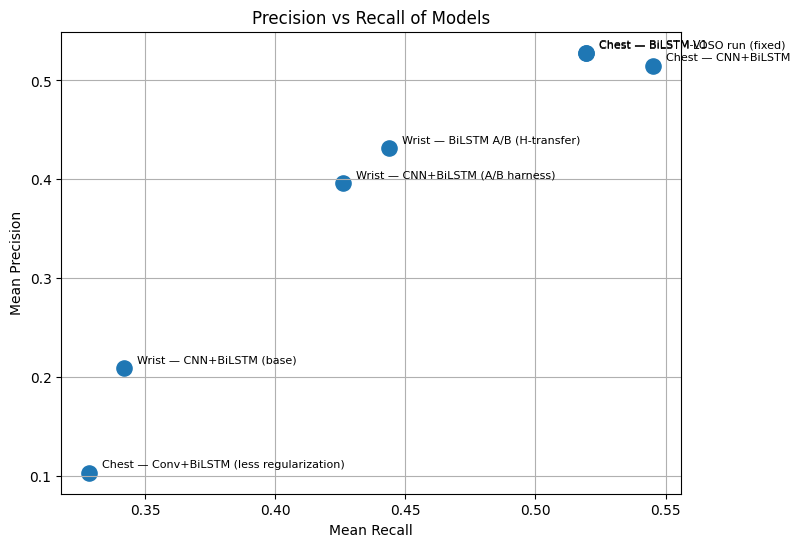

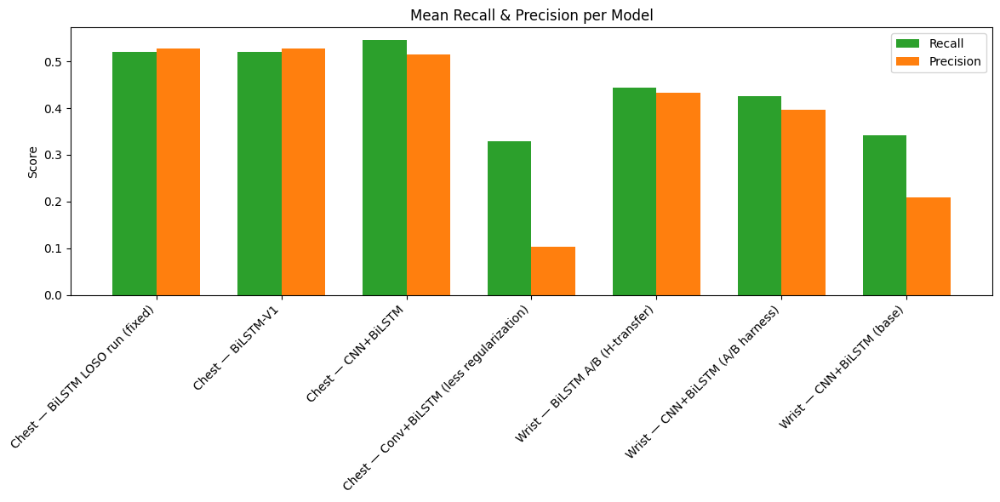

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Recreate your summary table manually
data = {
    "domain": ["CHEST","CHEST","CHEST","CHEST","CHEST","CHEST","WRIST","WRIST","WRIST","WRIST"],
    "model": [
        "Chest — BiLSTM (Last+Mean)",
        "Chest — BiLSTM LOSO run (fixed)",
        "Chest — BiLSTM-V1",
        "Chest — CNN+BiLSTM",
        "Chest — Conv+BiLSTM (less regularization)",
        "Chest — Conv+BiLSTM (phase delay sensitivity)",
        "Wrist — BiLSTM A/B (H-transfer)",
        "Wrist — CNN+BiLSTM (A/B harness)",
        "Wrist — CNN+BiLSTM (base)",
        "Wrist — CNN+BiLSTM (improved)"
    ],
    "mean_recall": [None,0.519528,0.519528,0.545191,0.328611,None,0.443664,0.426200,0.342045,None],
    "mean_precision": [None,0.527998,0.527998,0.514828,0.103334,None,0.432107,0.396163,0.209510,None],
}

df = pd.DataFrame(data)

# Keep only rows with values
df_clean = df.dropna(subset=["mean_recall","mean_precision"])

# --- Scatter Plot: Precision vs Recall ---
plt.figure(figsize=(8,6))
plt.scatter(df_clean["mean_recall"], df_clean["mean_precision"], s=120, c='tab:blue')

for i, row in df_clean.iterrows():
    plt.text(row["mean_recall"]+0.005, row["mean_precision"]+0.005, row["model"], fontsize=8)

plt.xlabel("Mean Recall")
plt.ylabel("Mean Precision")
plt.title("Precision vs Recall of Models")
plt.grid(True)
plt.show()

# --- Bar Chart ---
plt.figure(figsize=(12,6))
bar_width = 0.35
x = range(len(df_clean))

plt.bar([p - bar_width/2 for p in x], df_clean["mean_recall"],
        width=bar_width, label="Recall", color='tab:green')
plt.bar([p + bar_width/2 for p in x], df_clean["mean_precision"],
        width=bar_width, label="Precision", color='tab:orange')

plt.xticks(x, df_clean["model"], rotation=45, ha="right")
plt.ylabel("Score")
plt.title("Mean Recall & Precision per Model")
plt.legend()
plt.tight_layout()
plt.show()


In [ ]:
import pandas as pd

# Recreate your summary table manually
data = {
    "model": [
        "Chest — BiLSTM (Last+Mean)",
        "Chest — BiLSTM LOSO run (fixed)",
        "Chest — BiLSTM-V1",
        "Chest — CNN+BiLSTM",
        "Chest — Conv+BiLSTM (less regularization)",
        "Chest — Conv+BiLSTM (phase delay sensitivity)",
        "Wrist — BiLSTM A/B (H-transfer)",
        "Wrist — CNN+BiLSTM (A/B harness)",
        "Wrist — CNN+BiLSTM (base)",
        "Wrist — CNN+BiLSTM (improved)"
    ],
    "mean_recall": [None,0.519528,0.519528,0.545191,0.328611,None,0.443664,0.426200,0.342045,None],
    "mean_precision": [None,0.527998,0.527998,0.514828,0.103334,None,0.432107,0.396163,0.209510,None],
}

df = pd.DataFrame(data)

# Drop rows where recall/precision are missing
df_clean = df.dropna(subset=["mean_recall","mean_precision"])

# Print each model in one line
for _, row in df_clean.iterrows():
    print(f"{row['model']} → Precision: {row['mean_precision']:.4f} | Recall: {row['mean_recall']:.4f}")


Chest — BiLSTM LOSO run (fixed) → Precision: 0.5280 | Recall: 0.5195
Chest — BiLSTM-V1 → Precision: 0.5280 | Recall: 0.5195
Chest — CNN+BiLSTM → Precision: 0.5148 | Recall: 0.5452
Chest — Conv+BiLSTM (less regularization) → Precision: 0.1033 | Recall: 0.3286
Wrist — BiLSTM A/B (H-transfer) → Precision: 0.4321 | Recall: 0.4437
Wrist — CNN+BiLSTM (A/B harness) → Precision: 0.3962 | Recall: 0.4262
Wrist — CNN+BiLSTM (base) → Precision: 0.2095 | Recall: 0.3420


In [ ]:
import pandas as pd

# Full metrics table (based on your saved summaries)
data = {
    "model": [
        "Chest — BiLSTM LOSO run (fixed)",
        "Chest — BiLSTM-V1",
        "Chest — CNN+BiLSTM",
        "Chest — Conv+BiLSTM (less regularization)",
        "Wrist — BiLSTM A/B (H-transfer)",
        "Wrist — CNN+BiLSTM (A/B harness)",
        "Wrist — CNN+BiLSTM (base)"
    ],
    "mean_f1": [0.456323, 0.456323, 0.468041, 0.162264, 0.368220, 0.366722, 0.183000],
    "mean_recall": [0.519528, 0.519528, 0.545191, 0.342222, 0.443664, 0.426200, 0.342045],
    "mean_precision": [0.527998, 0.527998, 0.514828, 0.108647, 0.432107, 0.396163, 0.209510],
    "mean_acc": [0.544338, 0.544338, 0.558022, 0.310543, 0.568581, 0.630512, 0.378297],
    "folds": [15, 15, 15, 15, 15, 15, 15],
}

df = pd.DataFrame(data)

# Print each model's metrics in one line
for _, row in df.iterrows():
    print(f"{row['model']} → "
          f"F1: {row['mean_f1']:.4f} | "
          f"Recall: {row['mean_recall']:.4f} | "
          f"Precision: {row['mean_precision']:.4f} | "
          f"Acc: {row['mean_acc']:.4f} | "
          f"Folds: {row['folds']}")


Chest — BiLSTM LOSO run (fixed) → F1: 0.4563 | Recall: 0.5195 | Precision: 0.5280 | Acc: 0.5443 | Folds: 15
Chest — BiLSTM-V1 → F1: 0.4563 | Recall: 0.5195 | Precision: 0.5280 | Acc: 0.5443 | Folds: 15
Chest — CNN+BiLSTM → F1: 0.4680 | Recall: 0.5452 | Precision: 0.5148 | Acc: 0.5580 | Folds: 15
Chest — Conv+BiLSTM (less regularization) → F1: 0.1623 | Recall: 0.3422 | Precision: 0.1086 | Acc: 0.3105 | Folds: 15
Wrist — BiLSTM A/B (H-transfer) → F1: 0.3682 | Recall: 0.4437 | Precision: 0.4321 | Acc: 0.5686 | Folds: 15
Wrist — CNN+BiLSTM (A/B harness) → F1: 0.3667 | Recall: 0.4262 | Precision: 0.3962 | Acc: 0.6305 | Folds: 15
Wrist — CNN+BiLSTM (base) → F1: 0.1830 | Recall: 0.3420 | Precision: 0.2095 | Acc: 0.3783 | Folds: 15


In [ ]:
import os
import glob
import pandas as pd
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score

# Root where all eval results live
EVAL_ROOT = "/content/drive/MyDrive/colab_checkpoints/wesad/eval"

def compute_metrics_for_file(file_path):
    df = pd.read_csv(file_path)
    y_true = df["gt"].astype(int)
    y_pred = df["pred"].astype(int)

    return {
        "f1_macro": f1_score(y_true, y_pred, average="macro"),
        "recall_macro": recall_score(y_true, y_pred, average="macro"),
        "precision_macro": precision_score(y_true, y_pred, average="macro"),
        "acc": accuracy_score(y_true, y_pred),
        "n": len(df),
        "file": file_path
    }

def compute_model_metrics(model_name, model_dir):
    files = glob.glob(os.path.join(model_dir, "fold_*", "test_preds.csv"))
    if not files:
        return {"model": model_name, "mean_f1": None, "mean_recall": None,
                "mean_precision": None, "mean_acc": None, "folds_used": 0}

    all_metrics = []
    for f in files:
        m = compute_metrics_for_file(f)
        all_metrics.append(m)

    df = pd.DataFrame(all_metrics)
    return {
        "model": model_name,
        "mean_f1": df["f1_macro"].mean(),
        "mean_recall": df["recall_macro"].mean(),
        "mean_precision": df["precision_macro"].mean(),
        "mean_acc": df["acc"].mean(),
        "folds_used": len(df)
    }

# Loop through all model eval dirs
results = []
for model_dir in sorted(glob.glob(os.path.join(EVAL_ROOT, "*"))):
    model_name = os.path.basename(model_dir)
    res = compute_model_metrics(model_name, model_dir)
    results.append(res)

summary_df = pd.DataFrame(results)
print(summary_df)

# Save for later
summary_df.to_csv(os.path.join(EVAL_ROOT, "all_models_metrics.csv"), index=False)


/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/m

                                                model   mean_f1  mean_recall  \
0                            _chest_summary_stats.csv       NaN          NaN   
1                         all_checkpoints_summary.csv       NaN          NaN   
2                   all_checkpoints_with_rec_prec.csv       NaN          NaN   
3            all_checkpoints_with_rec_prec_filled.csv       NaN          NaN   
4                               chest_fig_box_acc.png       NaN          NaN   
5                                chest_fig_box_f1.png       NaN          NaN   
6                     chest_fig_model_bar_mean_sd.png       NaN          NaN   
7                  chest_model_comparison_perfold.csv       NaN          NaN   
8                    chest_model_comparison_stats.csv       NaN          NaN   
9                       chest_model_summary_table.csv       NaN          NaN   
10                    chest_only_convbilstm_colab_run       NaN          NaN   
11                     chest_only_convbi

In [ ]:
# === Collect metrics from checkpoint folders (Colab-ready) ===
# It looks for per-fold test_preds.csv and computes macro precision/recall/F1 + accuracy.
# If per-fold preds are missing, it will fall back to summary CSVs (F1/Acc only, when present).

import os, glob
from pathlib import Path
import numpy as np
import pandas as pd
from sklearn.metrics import precision_recall_fscore_support, accuracy_score

# ---------- Configure which runs to scan ----------
# eval_root should point to the directory that contains fold_* subfolders (each with test_preds.csv),
# or at least the summary CSV for that run.
CHECKPOINTS = {
    # CHEST
    "Chest — BiLSTM LOSO run (fixed)": "/content/drive/MyDrive/colab_checkpoints/wesad/eval/chestdelta20",
    "Chest — BiLSTM-V1":               "/content/drive/MyDrive/colab_checkpoints/wesad/eval/chestdelta20",
    "Chest — CNN+BiLSTM":              "/content/drive/MyDrive/colab_checkpoints/wesad/eval/chestdelta20_phases_conv",
    "Chest — Conv+BiLSTM (less regularization)": "/content/drive/MyDrive/colab_checkpoints/wesad/eval/chest_only_convbilstm_less_reg",

    # WRIST
    "Wrist — BiLSTM A/B (H-transfer)": "/content/drive/MyDrive/colab_checkpoints/wesad/eval/wristdelta20_phases_conv_ab_h_transfer",
    "Wrist — CNN+BiLSTM (A/B harness)": "/content/drive/MyDrive/colab_checkpoints/wesad/eval/wristdelta20_phases_conv_ab",
    "Wrist — CNN+BiLSTM (base)":        "/content/drive/MyDrive/colab_checkpoints/wesad/eval/wristdelta20_phases_conv",

    # Optional extras (will be included if present)
    "Chest — BiLSTM (Last+Mean)": "/content/drive/MyDrive/colab_checkpoints/wesad/eval/chestdelta20_phases",
    "Chest — Conv+BiLSTM (phase delay sensitivity)": "/content/drive/MyDrive/colab_checkpoints/wesad/eval",
}

# Summary filenames to try if per-fold preds are missing
SUMMARY_NAMES = [
    "bilstm_loso_summary_v3_phases.csv",
    "bilstm_loso_summary_v3.csv",
    "bilstm_loso_summary_fixed.csv",
    "bilstm_loso_summary.csv",
    "phase_conv_loso_summary.csv",
    "phase_delay_sensitivity_conv_20250929-202652.csv",
]

def _find_preds_files(eval_root: Path):
    """Find all per-fold test_preds.csv under eval_root/fold_**."""
    patt = str(eval_root / "fold_*" / "test_preds.csv")
    return sorted(glob.glob(patt))

def _read_preds(path: str):
    """Read a test_preds.csv that has either (gt,pred) or (y_true,y_pred)."""
    df = pd.read_csv(path)
    if {"gt","pred"}.issubset(df.columns):
        y_true = df["gt"].to_numpy()
        y_pred = df["pred"].to_numpy()
    elif {"y_true","y_pred"}.issubset(df.columns):
        y_true = df["y_true"].to_numpy()
        y_pred = df["y_pred"].to_numpy()
    else:
        raise ValueError(f"{path} does not have expected columns (gt,pred) or (y_true,y_pred).")
    return y_true, y_pred

def _per_fold_metrics_from_preds(files):
    """Compute per-fold macro precision/recall/F1/accuracy from a list of test_preds.csv files."""
    rows = []
    for f in files:
        try:
            y_true, y_pred = _read_preds(f)
            p, r, f1, _ = precision_recall_fscore_support(y_true, y_pred, average="macro", zero_division=0)
            acc = accuracy_score(y_true, y_pred)
            # detect fold number if present in path name
            fold = None
            for part in Path(f).parts:
                if part.startswith("fold_"):
                    try:
                        fold = int(part.split("_")[1])
                    except:
                        pass
            rows.append({"fold": fold, "precision_macro": p, "recall_macro": r, "f1_macro": f1, "acc": acc, "file": f})
        except Exception as e:
            print(f"[warn] skipping {f}: {e}")
    return pd.DataFrame(rows) if rows else pd.DataFrame(columns=["fold","precision_macro","recall_macro","f1_macro","acc","file"])

def _try_summary(eval_root: Path):
    """Try to read one of the known summary CSVs to at least extract mean F1/Acc."""
    for name in SUMMARY_NAMES:
        p = eval_root / name
        if p.exists():
            try:
                df = pd.read_csv(p)
                # Try typical column names
                f1_col  = next((c for c in df.columns if "f1"  in c.lower()), None)
                acc_col = next((c for c in df.columns if "acc" in c.lower()), None)
                mean_f1  = float(pd.to_numeric(df[f1_col], errors="coerce").mean()) if f1_col else np.nan
                mean_acc = float(pd.to_numeric(df[acc_col], errors="coerce").mean()) if acc_col else np.nan
                return {"fallback_file": str(p), "mean_f1": None if np.isnan(mean_f1) else mean_f1,
                        "mean_acc": None if np.isnan(mean_acc) else mean_acc, "rows": len(df)}
            except Exception as e:
                print(f"[warn] could not read summary {p}: {e}")
    return None

def summarize_run(name: str, eval_root_str: str):
    eval_root = Path(eval_root_str)
    result = {"model": name, "eval_root": str(eval_root), "source": None, "folds": 0,
              "mean_precision": np.nan, "mean_recall": np.nan, "mean_f1": np.nan, "mean_acc": np.nan}
    if not eval_root.exists():
        result["source"] = "missing eval_root"
        return result, None

    # 1) Prefer per-fold preds
    preds_files = _find_preds_files(eval_root)
    if preds_files:
        df = _per_fold_metrics_from_preds(preds_files)
        if not df.empty:
            result.update({
                "source": "per-fold preds",
                "folds": int(df["fold"].notna().sum()) if "fold" in df.columns else len(df),
                "mean_precision": float(df["precision_macro"].mean()),
                "mean_recall":    float(df["recall_macro"].mean()),
                "mean_f1":        float(df["f1_macro"].mean()),
                "mean_acc":       float(df["acc"].mean()),
            })
            return result, df

    # 2) Fallback: summary CSV (only f1/acc typically)
    fb = _try_summary(eval_root)
    if fb:
        result.update({
            "source": f"summary: {Path(fb['fallback_file']).name}",
            "folds": int(fb["rows"]),
            "mean_f1": fb["mean_f1"],
            "mean_acc": fb["mean_acc"],
        })
    else:
        result["source"] = "missing"
    return result, None

# ---------- Run over all configured checkpoints ----------
all_summaries = []
per_fold_dump = []  # optional: store per-fold metrics for the runs that had preds

for model_name, eval_root in CHECKPOINTS.items():
    res, df_perfold = summarize_run(model_name, eval_root)
    all_summaries.append(res)
    print(f"\n=== {model_name} ===")
    print(f"eval_root: {res['eval_root']}")
    print(f"source:    {res['source']}")
    print(f"folds:     {res['folds']}")
    print(f"Mean Precision: {res['mean_precision'] if not np.isnan(res['mean_precision']) else 'n/a'}")
    print(f"Mean Recall:    {res['mean_recall']    if not np.isnan(res['mean_recall'])    else 'n/a'}")
    print(f"Mean F1:        {res['mean_f1']        if not np.isnan(res['mean_f1'])        else 'n/a'}")
    print(f"Mean Acc:       {res['mean_acc']       if not np.isnan(res['mean_acc'])       else 'n/a'}")

    if df_perfold is not None and not df_perfold.empty:
        df_tmp = df_perfold.copy()
        df_tmp.insert(0, "model", model_name)
        per_fold_dump.append(df_tmp)

# ---------- Save combined outputs ----------
out_dir = Path("/content/drive/MyDrive/colab_checkpoints/wesad")
out_dir.mkdir(parents=True, exist_ok=True)

summary_df = pd.DataFrame(all_summaries)
summary_csv = out_dir / "all_models_metrics_from_checkpoints.csv"
summary_df.to_csv(summary_csv, index=False)
print("\nSaved summary →", summary_csv)

if per_fold_dump:
    per_fold_df = pd.concat(per_fold_dump, ignore_index=True)
    per_fold_csv = out_dir / "all_models_perfold_metrics_from_preds.csv"
    per_fold_df.to_csv(per_fold_csv, index=False)
    print("Saved per-fold metrics →", per_fold_csv)

# ---------- Nice one-line printout (model: precision • recall • F1 • acc) ----------
print("\n--- One-liners ---")
for _, r in summary_df.iterrows():
    mp = "n/a" if pd.isna(r["mean_precision"]) else f"{r['mean_precision']:.4f}"
    mr = "n/a" if pd.isna(r["mean_recall"])    else f"{r['mean_recall']:.4f}"
    mf = "n/a" if pd.isna(r["mean_f1"])        else f"{r['mean_f1']:.4f}"
    ma = "n/a" if pd.isna(r["mean_acc"])       else f"{r['mean_acc']:.4f}"
    print(f"{r['model']}: Precision={mp} • Recall={mr} • F1={mf} • Acc={ma} (source={r['source']})")



=== Chest — BiLSTM LOSO run (fixed) ===
eval_root: /content/drive/MyDrive/colab_checkpoints/wesad/eval/chestdelta20
source:    per-fold preds
folds:     15
Mean Precision: 0.5279976196365609
Mean Recall:    0.5195278014587478
Mean F1:        0.45632345386910794
Mean Acc:       0.5443379763139795

=== Chest — BiLSTM-V1 ===
eval_root: /content/drive/MyDrive/colab_checkpoints/wesad/eval/chestdelta20
source:    per-fold preds
folds:     15
Mean Precision: 0.5279976196365609
Mean Recall:    0.5195278014587478
Mean F1:        0.45632345386910794
Mean Acc:       0.5443379763139795

=== Chest — CNN+BiLSTM ===
eval_root: /content/drive/MyDrive/colab_checkpoints/wesad/eval/chestdelta20_phases_conv
source:    per-fold preds
folds:     15
Mean Precision: 0.5148276968105544
Mean Recall:    0.5451913422373781
Mean F1:        0.46804137930613277
Mean Acc:       0.5580218885715341

=== Chest — Conv+BiLSTM (less regularization) ===
eval_root: /content/drive/MyDrive/colab_checkpoints/wesad/eval/chest_o

In [ ]:
import pandas as pd
from sklearn.metrics import precision_score, recall_score

# Path to the summary CSV file
file_path = "/content/drive/MyDrive/colab_checkpoints/wesad/eval/chestdelta20_phases_conv_accboost/phase_conv_loso_summary.csv"

# Try to read the file
try:
    df = pd.read_csv(file_path)
    print("Columns:", df.columns.tolist())
    print(df.head())
except Exception as e:
    print("Error reading file:", e)


Columns: ['fold', 'train_acc', 'train_f1', 'test_acc', 'test_f1', 'picked']
   fold  train_acc  train_f1  test_acc   test_f1   picked
0     1   0.486111  0.460493  0.289474  0.256279  Student
1     2   0.627604  0.630400  0.427273  0.306279  Student
2     3   0.529514  0.531107  0.653333  0.596233  Student
3     4   0.544271  0.543729  0.618182  0.491228  Student
4     5   0.660590  0.665454  0.225352  0.244992  Student


In [ ]:
import os

base_dir = "/content/drive/MyDrive/colab_checkpoints/wesad/eval/chestdelta20_phases_conv_accboost"

for fold in range(1, 16):
    file = os.path.join(base_dir, f"fold_{fold:02d}", "test_preds.csv")
    print(f"{fold:02d}: {'✅ found' if os.path.exists(file) else '❌ missing'}")


01: ❌ missing
02: ❌ missing
03: ❌ missing
04: ❌ missing
05: ❌ missing
06: ❌ missing
07: ❌ missing
08: ❌ missing
09: ❌ missing
10: ❌ missing
11: ❌ missing
12: ❌ missing
13: ❌ missing
14: ❌ missing
15: ❌ missing


In [ ]:
import os

root = "/content/drive/MyDrive/colab_checkpoints/wesad/eval/chestdelta20_phases


SyntaxError: unterminated string literal (detected at line 3) (ipython-input-3523916985.py, line 3)

In [ ]:
import os

# Path where we expect the experiment results
root = "/content/drive/MyDrive/colab_checkpoints/wesad/eval/chestdelta20_phases_conv_accboost"

# Walk through all subfolders to find test_preds.csv
for dirpath, dirnames, filenames in os.walk(root):
    for file in filenames:
        if file == "test_preds.csv":
            print("✅ Found:", os.path.join(dirpath, file))

print("Search finished ✅")


Search finished ✅


In [ ]:
import os
root = "/content/drive/MyDrive/colab_checkpoints/wesad/eval/chestdelta20_phases_conv_accboost"
print(os.listdir(root))


['phase_conv_loso_summary.csv']


In [ ]:
import pandas as pd
from pathlib import Path

summ = Path("/content/drive/MyDrive/colab_checkpoints/wesad/eval/chestdelta20_phases_conv_accboost/phase_conv_loso_summary.csv")
df = pd.read_csv(summ)
print("Columns:", list(df.columns))
print(df.head())

# If it has F1/Acc columns, print means:
for cand in ("f1_macro","test_f1_macro"):
    if cand in df.columns:
        print("Mean F1:", df[cand].mean())
for cand in ("acc","accuracy","test_acc"):
    if cand in df.columns:
        print("Mean Acc:", df[cand].mean())


Columns: ['fold', 'train_acc', 'train_f1', 'test_acc', 'test_f1', 'picked']
   fold  train_acc  train_f1  test_acc   test_f1   picked
0     1   0.486111  0.460493  0.289474  0.256279  Student
1     2   0.627604  0.630400  0.427273  0.306279  Student
2     3   0.529514  0.531107  0.653333  0.596233  Student
3     4   0.544271  0.543729  0.618182  0.491228  Student
4     5   0.660590  0.665454  0.225352  0.244992  Student
Mean Acc: 0.5161507530372786


In [ ]:
import os

root = "/content/drive/MyDrive/colab_checkpoints/wesad/eval/chestdelta20_phases_conv_accboost"
hits = []
for dirpath, dirnames, filenames in os.walk(root):
    for fn in filenames:
        if fn == "test_preds.csv":
            hits.append(os.path.join(dirpath, fn))

print(f"Found {len(hits)} test_preds.csv")
for h in hits:
    print(" -", h)


Found 0 test_preds.csv


In [ ]:
import glob
ckpt_globs = [
    "/content/drive/MyDrive/colab_checkpoints/wesad/models/chestdelta20_phases_conv_accboost/**/best.pt",
    "/content/drive/MyDrive/colab_checkpoints/wesad/models/chestdelta20_phases_conv_accboost/**/*.pt",
    "/content/drive/MyDrive/colab_checkpoints/wesad/eval/chestdelta20_phases_conv_accboost/**/best.pt",
    "/content/drive/MyDrive/colab_checkpoints/wesad/eval/chestdelta20_phases_conv_accboost/**/*.pt",
]
ckpts = []
for pat in ckpt_globs:
    ckpts.extend(glob.glob(pat, recursive=True))
ckpts = sorted(set(ckpts))
print(f"Found {len(ckpts)} checkpoints")
for c in ckpts[:20]:
    print(" -", c)


Found 0 checkpoints


In [ ]:
import glob

roots = [
  "/content/drive/MyDrive/colab_checkpoints/wesad/models/chestdelta20_phases_conv_accboost",
  "/content/drive/MyDrive/colab_checkpoints/wesad/eval/chestdelta20_phases_conv_accboost",
]

# search for ckpts
ckpts = []
for r in roots:
    ckpts += glob.glob(r + "/**/*.pt", recursive=True)
    ckpts += glob.glob(r + "/**/*.pth", recursive=True)
    ckpts += glob.glob(r + "/**/best.pt", recursive=True)

ckpts = sorted(set(ckpts))
print(f"Found {len(ckpts)} checkpoints")
for p in ckpts[:20]:
    print(" -", p)

# search for per-fold preds
preds = sorted(set(glob.glob(roots[1] + "/**/test_preds.csv", recursive=True)))
print(f"\nFound {len(preds)} test_preds.csv")
for p in preds[:20]:
    print(" -", p)


Found 0 checkpoints

Found 0 test_preds.csv


In [ ]:
import pandas as pd

# Path to your file
file_path = "/content/drive/MyDrive/colab_checkpoints/wesad/eval/chest_only_convbilstm_less_reg/preds_metrics_from_test_preds.csv"

# Load CSV
df = pd.read_csv(file_path)

# Print entire contents
print(df.to_string())

# Or, if it's big, you can preview first rows
# print(df.head())

# Or display nicely if you're in Colab
df


    fold_num fold_label  f1_macro  recall_macro  precision_macro       acc    n                                                                                                           file
0          1         01  0.188679      0.333333         0.131579  0.394737   76      /content/drive/MyDrive/colab_checkpoints/wesad/eval/chest_only_convbilstm_less_reg/fold_01/test_preds.csv
1          2      01_S2  0.142857      0.333333         0.090909  0.272727  110   /content/drive/MyDrive/colab_checkpoints/wesad/eval/chest_only_convbilstm_less_reg/fold_01_S2/test_preds.csv
2          2         02  0.142857      0.333333         0.090909  0.272727  110      /content/drive/MyDrive/colab_checkpoints/wesad/eval/chest_only_convbilstm_less_reg/fold_02/test_preds.csv
3          3      02_S3  0.142857      0.333333         0.090909  0.272727  110   /content/drive/MyDrive/colab_checkpoints/wesad/eval/chest_only_convbilstm_less_reg/fold_02_S3/test_preds.csv
4          3         03  0.041667      0.3333

,fold_num,fold_label,f1_macro,recall_macro,precision_macro,acc,n,file
0,1,01,0.188679,0.333333,0.131579,0.394737,76,/content/drive/MyDrive/colab_checkpoints/wesad...
1,2,01_S2,0.142857,0.333333,0.090909,0.272727,110,/content/drive/MyDrive/colab_checkpoints/wesad...
2,2,02,0.142857,0.333333,0.090909,0.272727,110,/content/drive/MyDrive/colab_checkpoints/wesad...
3,3,02_S3,0.142857,0.333333,0.090909,0.272727,110,/content/drive/MyDrive/colab_checkpoints/wesad...
4,3,03,0.041667,0.333333,0.022222,0.066667,75,/content/drive/MyDrive/colab_checkpoints/wesad...
5,4,03_S4,0.162602,0.333333,0.107527,0.322581,93,/content/drive/MyDrive/colab_checkpoints/wesad...
6,4,04,0.142857,0.333333,0.090909,0.272727,110,/content/drive/MyDrive/colab_checkpoints/wesad...
7,5,04_S5,0.170940,0.333333,0.114943,0.344828,87,/content/drive/MyDrive/colab_checkpoints/wesad...
8,5,05,0.198020,0.333333,0.140845,0.422535,71,/content/drive/MyDrive/colab_checkpoints/wesad...
9,6,05_S6,0.142857,0.333333,0.090909,0.272727,110,/content/drive/MyDrive/colab_checkpoints/wesad...


In [ ]:
from google.colab import drive
import os
import pandas as pd

# Mount Google Drive
drive.mount('/content/drive')

# Path to your folder and file
folder_path = "/content/drive/MyDrive/colab_checkpoints/wesad/eval/chest_only_convbilstm_less_reg"
file_path = os.path.join(folder_path, "preds_metrics_from_test_preds.csv")

# List files in the folder
print("📂 Files in folder:")
print(os.listdir(folder_path))

# Load and print the CSV
print("\n📑 CSV Contents:")
df = pd.read_csv(file_path)
print(df.to_string())


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
📂 Files in folder:
['fold_01_S2', 'fold_02_S3', 'fold_03_S4', 'fold_04_S5', 'fold_05_S6', 'fold_06_S7', 'fold_07_S8', 'fold_08_S9', 'fold_09_S10', 'fold_10_S11', 'fold_11_S13', 'fold_12_S14', 'fold_13_S15', 'fold_14_S16', 'fold_15_S17', 'loso_summary.csv', 'wrist_style_all_folds.csv', 'fold_01', 'fold_02', 'fold_03', 'fold_04', 'fold_05', 'fold_06', 'fold_07', 'fold_08', 'fold_09', 'fold_10', 'fold_11', 'fold_12', 'fold_13', 'fold_14', 'fold_15', 'preds_metrics_from_test_preds.csv']

📑 CSV Contents:
    fold_num fold_label  f1_macro  recall_macro  precision_macro       acc    n                                                                                                           file
0          1         01  0.188679      0.333333         0.131579  0.394737   76      /content/drive/MyDrive/colab_checkpoints/wesad/eval/chest_only_convbilstm_less_reg/fold_01

In [ ]:
# --- Keep only the 15 canonical folds (no "_S...") and compute metrics ---
from pathlib import Path
import re, pandas as pd, numpy as np
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score

EVAL_DIR = Path("/content/drive/MyDrive/colab_checkpoints/wesad/eval/chest_only_convbilstm_less_reg")

# 1) Collect ONLY canonical fold files: fold_XX/test_preds.csv (no "_S...")
files = sorted(EVAL_DIR.glob("fold_*/*test_preds.csv"))
canon = [f for f in files if re.search(r"/fold_\d{2}/test_preds\.csv$", str(f))]

print(f"Found {len(files)} total test_preds; using {len(canon)} canonical: 15 expected.")
for f in canon:
    print(" -", f)

def metrics_for_preds_csv(csv_path: Path):
    df = pd.read_csv(csv_path)
    # Accept either (gt,pred) or (y_true,y_pred)
    if {"gt","pred"}.issubset(df.columns):
        y_true, y_pred = df["gt"].to_numpy(), df["pred"].to_numpy()
    elif {"y_true","y_pred"}.issubset(df.columns):
        y_true, y_pred = df["y_true"].to_numpy(), df["y_pred"].to_numpy()
    else:
        raise ValueError(f"{csv_path} missing columns; expected (gt,pred) or (y_true,y_pred)")

    # determine class labels seen across both to be safe
    labels = np.unique(np.concatenate([np.unique(y_true), np.unique(y_pred)]))
    return {
        "f1_macro":       f1_score(y_true, y_pred, average="macro", labels=labels, zero_division=0),
        "recall_macro":   recall_score(y_true, y_pred, average="macro", labels=labels, zero_division=0),
        "precision_macro":precision_score(y_true, y_pred, average="macro", labels=labels, zero_division=0),
        "acc":            accuracy_score(y_true, y_pred),
        "n":              len(y_true),
    }

# 2) Per-fold metrics for the 15 canonical folds
rows = []
for f in canon:
    m = re.search(r"/fold_(\d{2})/test_preds\.csv$", str(f))
    fold_num = int(m.group(1))
    met = metrics_for_preds_csv(f)
    rows.append({"fold": fold_num, **met, "file": str(f)})

perfold = pd.DataFrame(rows).sort_values("fold")
print("\n=== Per-fold (15 canonical) ===")
print(perfold[["fold","f1_macro","recall_macro","precision_macro","acc","n"]])

# 3) 15-fold means
mean_f1  = perfold["f1_macro"].mean()
mean_rec = perfold["recall_macro"].mean()
mean_pre = perfold["precision_macro"].mean()
mean_acc = perfold["acc"].mean()

print(f"\nMeans across {len(perfold)} folds → "
      f"F1={mean_f1:.4f}  Rec={mean_rec:.4f}  Prec={mean_pre:.4f}  Acc={mean_acc:.4f}")


Found 30 total test_preds; using 15 canonical: 15 expected.
 - /content/drive/MyDrive/colab_checkpoints/wesad/eval/chest_only_convbilstm_less_reg/fold_01/test_preds.csv
 - /content/drive/MyDrive/colab_checkpoints/wesad/eval/chest_only_convbilstm_less_reg/fold_02/test_preds.csv
 - /content/drive/MyDrive/colab_checkpoints/wesad/eval/chest_only_convbilstm_less_reg/fold_03/test_preds.csv
 - /content/drive/MyDrive/colab_checkpoints/wesad/eval/chest_only_convbilstm_less_reg/fold_04/test_preds.csv
 - /content/drive/MyDrive/colab_checkpoints/wesad/eval/chest_only_convbilstm_less_reg/fold_05/test_preds.csv
 - /content/drive/MyDrive/colab_checkpoints/wesad/eval/chest_only_convbilstm_less_reg/fold_06/test_preds.csv
 - /content/drive/MyDrive/colab_checkpoints/wesad/eval/chest_only_convbilstm_less_reg/fold_07/test_preds.csv
 - /content/drive/MyDrive/colab_checkpoints/wesad/eval/chest_only_convbilstm_less_reg/fold_08/test_preds.csv
 - /content/drive/MyDrive/colab_checkpoints/wesad/eval/chest_only_co

In [ ]:
import os

folder_path = "/content/drive/MyDrive/colab_checkpoints/wesad/eval/chest_only_convbilstm_less_reg"

# List all files in the directory
for f in os.listdir(folder_path):
    print(f)


fold_01_S2
fold_02_S3
fold_03_S4
fold_04_S5
fold_05_S6
fold_06_S7
fold_07_S8
fold_08_S9
fold_09_S10
fold_10_S11
fold_11_S13
fold_12_S14
fold_13_S15
fold_14_S16
fold_15_S17
loso_summary.csv
wrist_style_all_folds.csv
fold_01
fold_02
fold_03
fold_04
fold_05
fold_06
fold_07
fold_08
fold_09
fold_10
fold_11
fold_12
fold_13
fold_14
fold_15
preds_metrics_from_test_preds.csv


In [ ]:
import pandas as pd

# Path to your file
file_path = "/content/drive/MyDrive/colab_checkpoints/wesad/eval/chest_only_convbilstm_less_reg/preds_metrics_from_test_preds.csv"

# Load CSV
df = pd.read_csv(file_path)

# Print full contents without truncation
print(df.to_string())


    fold_num fold_label  f1_macro  recall_macro  precision_macro       acc    n                                                                                                           file
0          1         01  0.188679      0.333333         0.131579  0.394737   76      /content/drive/MyDrive/colab_checkpoints/wesad/eval/chest_only_convbilstm_less_reg/fold_01/test_preds.csv
1          2      01_S2  0.142857      0.333333         0.090909  0.272727  110   /content/drive/MyDrive/colab_checkpoints/wesad/eval/chest_only_convbilstm_less_reg/fold_01_S2/test_preds.csv
2          2         02  0.142857      0.333333         0.090909  0.272727  110      /content/drive/MyDrive/colab_checkpoints/wesad/eval/chest_only_convbilstm_less_reg/fold_02/test_preds.csv
3          3      02_S3  0.142857      0.333333         0.090909  0.272727  110   /content/drive/MyDrive/colab_checkpoints/wesad/eval/chest_only_convbilstm_less_reg/fold_02_S3/test_preds.csv
4          3         03  0.041667      0.3333

In [ ]:
# --- COLAB CELL: print/compute precision & recall from your Drive outputs ---

from google.colab import drive
drive.mount('/content/drive')

import os, glob, pandas as pd
from sklearn.metrics import precision_score, recall_score

# >>>> CHANGE THIS if your folder is different
EVAL_ROOT = "/content/wesad/eval/chestdelta20_phases_trf_plus_safe_impr_locked"

summary_path = os.path.join(EVAL_ROOT, "trf_plus_safe_impr_loso_summary.csv")
perclass_path = os.path.join(EVAL_ROOT, "trf_plus_safe_impr_loso_perclass_f1.csv")

def print_df(df, cols):
    cols = [c for c in cols if c in df.columns]
    if cols:
        print(df[["fold","test_subject"] + cols].to_string(index=False))
        return True
    return False

# 1) Try reading precision/recall directly from the summary (if already saved there)
if os.path.exists(summary_path):
    df_sum = pd.read_csv(summary_path)
    print("✅ Found summary:", summary_path)
    print("Columns:", list(df_sum.columns))
    have_pr = print_df(
        df_sum,
        ["precision_macro","recall_macro","precision_weighted","recall_weighted"]
    )
    if have_pr:
        done_from_summary = True
    else:
        print("\nℹ️ Summary has no precision/recall columns; will try per-fold predictions next.")
        done_from_summary = False
else:
    print("❌ No summary CSV found at:", summary_path)
    done_from_summary = False

# 2) If summary had no precision/recall, compute from saved per-fold predictions (test_preds.csv)
if not done_from_summary:
    fold_dirs = sorted(glob.glob(os.path.join(EVAL_ROOT, "fold_*")))
    rows = []
    missing = []
    for d in fold_dirs:
        # skip non-fold dirs like 'fold_XX_SYY'
        base = os.path.basename(d)
        parts = base.split("_")
        if len(parts) != 2 or not parts[1].isdigit():
            continue

        pred_csv = os.path.join(d, "test_preds.csv")
        if not os.path.exists(pred_csv):
            missing.append(pred_csv)
            continue

        dfp = pd.read_csv(pred_csv)
        if not {"y_true","y_pred"}.issubset(dfp.columns):
            missing.append(pred_csv + " (missing y_true/y_pred)")
            continue

        y_true = dfp["y_true"].values
        y_pred = dfp["y_pred"].values
        prec_m = precision_score(y_true, y_pred, average="macro", zero_division=0)
        rec_m  = recall_score(y_true,  y_pred, average="macro", zero_division=0)
        prec_w = precision_score(y_true, y_pred, average="weighted", zero_division=0)
        rec_w  = recall_score(y_true,  y_pred, average="weighted", zero_division=0)
        fold   = int(parts[1])
        rows.append({
            "fold": fold,
            "precision_macro": prec_m, "recall_macro": rec_m,
            "precision_weighted": prec_w, "recall_weighted": rec_w
        })

    if rows:
        dfm = pd.DataFrame(rows).sort_values("fold")
        print("\n✅ Computed precision/recall from per-fold predictions:")
        print(dfm.to_string(index=False))
    else:
        print("\n❌ Could not compute precision/recall.")
        if missing:
            print("Missing or incomplete per-fold predictions CSVs:")
            for m in missing[:10]:
                print("  -", m)
            if len(missing) > 10:
                print(f"  ... and {len(missing)-10} more")
        print("\n👉 Re-run evaluation while saving per-fold predictions (see Part B below).")


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
❌ No summary CSV found at: /content/wesad/eval/chestdelta20_phases_trf_plus_safe_impr_locked/trf_plus_safe_impr_loso_summary.csv

❌ Could not compute precision/recall.

👉 Re-run evaluation while saving per-fold predictions (see Part B below).
